# Quadrotor Deep Kalman Filter (DKF) Implementation

In [37]:
import torch
import torch.optim
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import random
from torch.distributions import Normal, MultivariateNormal, Independent, kl_divergence
from collections import namedtuple
from math import e, cos, sin, pi, atan2, asin, sqrt, tan

### Quadrotor Dynamical Data Generator

In [38]:
class Quadrotor_Dynamics_Generator():

  def __init__(self,
               x_size=27,
               y_size=12,
               traj_length=2,
               normalize=True,
               xy_offset=20,
               min_Z=0,
               max_Z=50,
               xydot_offset=60.0,
               min_Zdot = -30,
               max_Zdot = 30,
               min_accel_xy = -30,
               max_accel_xy = 30,
               min_accel_z = -30,
               max_accel_z = 30, 
               omega_offset=80,
               omegadot_offset=80,
               min_rp = -pi/2 + 0.1,
               max_rp = pi/2 - 0.1,
               min_rotor_rps = 0,
               max_rotor_rps = 1000,
               perturb_rps=10,
               ground_effect=False,
               wind_vel_offset = 25,
               Z_thresh=2,
               min_mass=0.5,
               max_mass=20
              ):

    self.x_size = x_size
    self.y_size = y_size
    self.traj_length = traj_length
    self.normalize = normalize
    self.xy_offset = xy_offset
    self.min_Z = min_Z
    self.max_Z = max_Z
    self.xydot_offset = xydot_offset
    self.omega_offset = omega_offset
    self.omegadot_offset = omegadot_offset

    self.min_rp = min_rp
    self.max_rp = max_rp
    self.min_rotor_bound = min_rotor_rps
    self.max_rotor_bound = max_rotor_rps
    self.perturb_rps = perturb_rps
    self.ground_effect = ground_effect
    self.Z_thresh = Z_thresh
    self.min_m = min_mass
    self.max_m = max_mass
    self.constants = self.constants_init()
    
    # Initialize minmax data needed for relavent simulation parameters (old format)
    self.minmax_data = torch.tensor([[-self.xydot_offset, self.xydot_offset],
                                    [-self.xydot_offset, self.xydot_offset],
                                    [min_Zdot, max_Zdot],
                                    [min_accel_xy, max_accel_xy],
                                    [min_accel_xy, max_accel_xy],
                                    [min_accel_z, max_accel_z],
                                    [-self.omega_offset, self.omega_offset],
                                    [-self.omega_offset, self.omega_offset],
                                    [-self.omega_offset, self.omega_offset],
                                    [-self.omegadot_offset, self.omegadot_offset],
                                    [-self.omegadot_offset, self.omegadot_offset],
                                    [-self.omegadot_offset, self.omegadot_offset],
                                    [0, 0], #dt
                                    [min_rotor_rps, max_rotor_rps],
                                    [min_rotor_rps, max_rotor_rps],
                                    [min_rotor_rps, max_rotor_rps],
                                    [min_rotor_rps, max_rotor_rps],
                                    [-wind_vel_offset, wind_vel_offset],
                                    [-wind_vel_offset, wind_vel_offset],
                                    [-wind_vel_offset, wind_vel_offset],
                                    [self.min_m, self.max_m],
                                    [0,0],
                                    [0,0],
                                    [0,0],
                                    [0,0],
                                    [0,0],
                                    [0,0],
                                    [-self.xydot_offset, self.xydot_offset],
                                    [-self.xydot_offset, self.xydot_offset],
                                    [min_Zdot, max_Zdot],
                                    [min_accel_xy, max_accel_xy],
                                    [min_accel_xy, max_accel_xy],
                                    [min_accel_z, max_accel_z],
                                    [-self.omega_offset, self.omega_offset],
                                    [-self.omega_offset, self.omega_offset],
                                    [-self.omega_offset, self.omega_offset],
                                    [-self.omegadot_offset, self.omegadot_offset],
                                    [-self.omegadot_offset, self.omegadot_offset],
                                    [-self.omegadot_offset, self.omegadot_offset]])
                                      
    

  # Evolves the dynamics of quadrotor
  def eqn_mtn(self, state_vec, uu, dt, V_w, rotor_disturbances=False, rotor_spike_bound=100, linvel_offset=torch.zeros([3,]), angvel_offset=torch.zeros([3,])):

    ########     NESTED FUNCTION     ########

    # Verify boundness of Euler angles
    def theta_check(theta):
      # Parsing euler angles
      roll = theta[0]
      pitch = theta[1]
      yaw = theta[2]

      # Ensuring euler angles remain within [-pi, pi]
      roll_offset = torch.abs(torch.floor(roll / (2*pi)))
      pitch_offset = torch.abs(torch.floor(pitch / (2*pi)))
      yaw_offset = torch.abs(torch.floor(yaw / (2*pi)))

      if roll > pi:
        roll -= roll_offset * (2*pi)
      elif roll < -pi:
        roll += roll_offset * (2*pi)

      if pitch > pi:
        pitch -= pitch_offset * (2*pi)
      elif pitch < -pi:
        pitch += pitch_offset * (2*pi)

      if yaw > pi:
        yaw -= yaw_offset * (2*pi)
      elif yaw < -pi:
        yaw += yaw_offset * (2*pi)

      theta_transformed = torch.tensor([roll, pitch, yaw])
      return theta_transformed
    
    ###########   END OF NESTED FUNCTION   ###########
    
    # Parsing positional and velocity states
    x = state_vec[:3]
    theta = state_vec[3:6]
    xdot = state_vec[6:9]
    thetadot = state_vec[9:12]
    omega = state_vec[12:15]
    omegadot = state_vec[15:18]
    a = state_vec[18:]
    
    # Checking if current altitude is at ground effect threshold  
    if x[2] <= 2 and x[2] > 0:
      self.ground_effect = True
    else:
      self.ground_effect = False  
      
    #print(f'EQN_MTN BEFORE: xdot_prev: {xdot}, a: {a}, omega_prev: {omega}, omegadot: {omegadot}')


    # Initializing needed constants
    I = self.constants['I']
    I_r = self.constants['I_r']
    g = self.constants['g']
    m = self.constants['m']
    L = self.constants['L']
    b = self.constants['b']
    kf = self.constants['kf']
    km = self.constants['km']
    kd = self.constants['kd']
    d_array = self.constants['d_array']


    # Incorporating rotor spiking (if applicable)
    if rotor_disturbances == True:
      uu_observed = uu.clone()
      uu = self.perturb_rv(uu_observed, rotor_spike_bound=rotor_spike_bound)

    # Integrating body rates
    omega = omega + dt * omegadot

    # Ensuring commanded velocities keep quadrotor within defined state space
    if linvel_offset.any():
      xdot = linvel_offset
    else:
      xdot = xdot + dt * a
      
    if angvel_offset.any():
      thetadot = angvel_offset
    else: 
      thetadot = self.omega2thetadot(omega, theta)

    # Integrating positional states
    theta = theta + dt * thetadot
    x = x + dt * xdot

    # Ensuring euler angles lie within appropriate bounds
    theta = theta_check(theta)
    
    # Transforming inputs into $\omega_{i}^2$
    uu = torch.pow(uu, 2)

    # Computing quadrotor body rates from updated euler data
    omega = self.thetadot2omega(thetadot, theta)
    
    # Computing forces and moments from external perturbations
    V_w, F_w = self.inject_wind_peturb(V_w, dt)
    Vr_array = self.compute_rotor_linvels(xdot, theta, omega, d_array, V_w)
    F_bf, F_bf_array = self.inject_blade_flapping_force(theta, uu, Vr_array)
    F_id, F_id_array = self.inject_induced_drag_force(theta, uu, Vr_array)
    
    if self.ground_effect: 
      Fg = self.inject_ground_effect(z=x[2],z_thresh=2, m=m)
    else:
      Fg = torch.zeros_like(F_bf)

    # Computing exogenous disturbances
    F_aero = F_bf + F_id + Fg + F_w
    tau_aero = self.inject_torque_perturb(F_bf_array, F_id_array, d_array)
    
    # Compute linear and angular accelerations.
    a = self.acceleration(uu, theta, xdot, m, g, kf, kd, F_aero, prev_a=a)
    omegadot = self.angular_acceleration(uu, omega, I, I_r, L, b, km, tau_aero, prev_ωdot=omegadot)

    # Updating state vector
    state_vec = torch.concat([x, theta, xdot, thetadot, omega, omegadot, a], dim=0)
    #print(f'EQN_MTN AFTER: xdot_prev: {xdot}, a: {a}, omega_prev: {omega}, omegadot: {omegadot}, V_w: {V_w}')
    
    return state_vec, V_w, F_aero, tau_aero
  
  ####   QUADROTOR PHYSICS FUNCTIONS   ####
  
  # Compute translational accelerations
  def acceleration(self, inputs, angles, xdot, m, g, kf, kd, F_aero, prev_a=torch.zeros([3,])):
    gravity = torch.tensor([0,0,-g])
    R = self.rotation(angles)
    T = R @ self.thrust(inputs, kf)
    Fd = -kd * xdot
    a = gravity + (1/m) * (T + Fd + F_aero) - kd * prev_a
    return a

  # Compute angular accelerations
  def angular_acceleration(self, inputs, omega, I, I_r, L, b, km, tau_aero, prev_ωdot=torch.zeros([3,])):
    tau_m = self.motor_torques(inputs, L, b, km)
    tau_g = self.gyroscopic_torques(inputs, omega, I_r)
    
    #print(f'tau_m: {tau_m}, tau_aero: {tau_aero}, tau_g: {tau_g}\n')
    tau = (tau_m + tau_aero - tau_g)
    omegadot = torch.inverse(I) @ (tau - torch.linalg.cross(omega, I @ omega)) - km * prev_ωdot
    return omegadot
  
  # Compute torques, given current inputs, length of arm, drag coefficient, and moment coefficient.
  def motor_torques(self, inputs, L, b, km):
    # Inputs are values for ${\omega_i}^2$
    tau = torch.tensor([
        L * km * (inputs[0] - inputs[2]),
        L * km * (inputs[1] - inputs[3]),
        b * (inputs[0] - inputs[1] + inputs[2] - inputs[3])
    ])
    return tau
  
  # Compute thrust given current inputs and thrust coefficient.
  def thrust(self, inputs, kf):
    # Inputs are values for ${\omega_i}^2$
    T = torch.tensor([0, 0, kf * torch.sum(inputs)])
    return T

  # Compute gyroscopic torques on quadrotor
  def gyroscopic_torques(self, inputs, omega, I_r):
    # Parsing body rates
    pp = omega[0]
    qq = omega[1]
    
    # Untransforming squared inputs
    inputs = torch.sqrt(inputs)
    
    # Computing gyroscopic torques
    tau_g = torch.zeros([3,])
    tau_g[0] = I_r*qq*(inputs[0] - inputs[1] + inputs[2] - inputs[3])
    tau_g[1] = -I_r*pp*(inputs[0] - inputs[1] + inputs[2] - inputs[3])
    
    return tau_g

  ####    END OF PHYSICS FUNCTIONS     ####


  ####  PERTURBATION/NOISE FUNCTIONS   ####

  def perturb_rv(self, uu, rotor_spike_bound=100):

    # High: perturb_rps minmax = -100, 100
    # Medium: perturb_rps_minmax = -50, 50

    max_rotor_perturb_rps = rotor_spike_bound
    min_rotor_perturb_rps = -rotor_spike_bound
    
    # Sampling rotor spiking values
    dω1 = random.random() * (max_rotor_perturb_rps - min_rotor_perturb_rps) + min_rotor_perturb_rps
    dω2 = random.random() * (max_rotor_perturb_rps - min_rotor_perturb_rps) + min_rotor_perturb_rps
    dω3 = random.random() * (max_rotor_perturb_rps - min_rotor_perturb_rps) + min_rotor_perturb_rps
    dω4 = random.random() * (max_rotor_perturb_rps - min_rotor_perturb_rps) + min_rotor_perturb_rps
    
    # Applying spiking values to rotor velocities
    uu[0] += dω1
    uu[1] += dω2
    uu[2] += dω3
    uu[3] += dω4

     # Applying saturation limits
    for rotor in range(uu.shape[0]):
      if uu[rotor] > self.max_rotor_bound:
        uu[rotor] = self.max_rotor_bound - 20
      elif uu[rotor] < self.min_rotor_bound:
        uu[rotor] = self.min_rotor_bound + 20
    
    return uu
  
  
  def model_rotor_vels(self, uu, noise_bias=10, noise_std=15):
    
    # Sampling noise vector to perturb rotor velocities in realistic manner
    noise_uu = torch.normal(mean=torch.tensor(noise_bias), std=torch.tensor(noise_std), size=[4,])
    
    # Applying noise to rotor velocities
    uu += noise_uu
    
    # Applying saturation limits
    for rotor in range(uu.shape[0]):
      if uu[rotor] > self.max_rotor_bound:
        uu[rotor] = self.max_rotor_bound - 20
      elif uu[rotor] < self.min_rotor_bound:
        uu[rotor] = self.min_rotor_bound + 20
    
    # Applying quantization step
    uu = torch.round(uu)
    
    return uu


  def compute_rotor_linvels(self, xdot, theta, omega, d_array, V_w):
    # VECTORIZE
    
    # Computing rotation matrix for  (Body -> Inertial)
    R = self.rotation(theta)

    # Computing rotor linear velocities for each rotor
    Vr_array = torch.zeros([4,3])
    for rotor in range(4):
      Vr_array[rotor,:] = R.T @ (xdot - V_w) + torch.linalg.cross(omega, d_array[rotor,:])
    
    return Vr_array
    

  def inject_blade_flapping_force(self, theta, uu, Vr_array):
    # VECTORIZE
    
    # Defining needed aerodynamic coefficients
    Ct = 2e-3
    Ca = 5e-4
    Cb = 5e-4

    # Computing rotation matrix  (Body -> Inertial)
    R = self.rotation(theta)

    # Computing sum of blade flapping forces coming from all rotors
    F_bf = torch.zeros([3,])
    F_bf_array = torch.zeros([4,3])
    mat = torch.tensor([[Ca,-Cb,0],
                        [Cb,Ca,0],
                        [0,0,0]])
    
    for rotor in range(uu.shape[0]):
      rotor_F_bf = -Ct * uu[rotor] * R @ mat @ Vr_array[rotor,:]
      F_bf += rotor_F_bf
      F_bf_array[rotor,:] = rotor_F_bf

    return F_bf, F_bf_array

  def inject_induced_drag_force(self, theta, uu, Vr_array):
    # VECTORIZE
    # Defining needed aerodynamic coefficients
    Ct = 2e-3
    Cdx = 5e-4
    Cdy = 5e-4

    # Computing rotation matrix  (Body -> Inertial)
    R = self.rotation(theta)

    # Computing sum of induced drag forces from all rotors
    F_id = torch.zeros(3,)
    F_id_array = torch.zeros([4,3]) 
    mat = torch.tensor([[Cdx,0,0],
                        [0,Cdy,0],
                        [0,0,0]])
    
    for rotor in range(uu.shape[0]):
      rotor_F_id = -Ct * uu[rotor] * R @ mat @ Vr_array[rotor,:]
      F_id += rotor_F_id
      F_id_array[rotor,:] = rotor_F_id

    return F_id, F_id_array
  
  def inject_ground_effect(self, z, z_thresh, m):
  
    # Defining needed aerodynamic coefficient
    Cg = 1e-3

    # Computing ground effect force
    Fg_coeff = Cg / (4*z**2) - Cg / (z_thresh - z) ** 2
    Fg = Fg_coeff * torch.tensor([0,0,1])
    
    # Computing maximum allowed ground effect force based on quadrotor weight
    Fg_max = 0.4 * (m * 9.8)
    
    # Constraining ground effect force to be within realistic bounds
    if Fg[2] > Fg_max:
      Fg[2] = Fg_max
    elif Fg[2] < -Fg_max:
      Fg[2] = -Fg_max

    return Fg


  def inject_torque_perturb(self, F_bf_array, F_id_array, d_array):
    # VECTORIZE
    def skew_symmetric(d):
      Sd = torch.tensor([[0,-d[2],d[1]],
                        [d[2],0,-d[0]],
                        [-d[1],d[0],0]])
      return Sd

    tau_perturb = torch.zeros([3,])
    for rotor in range(4):
      d = d_array[rotor,:]
      F_bf = F_bf_array[rotor,:]
      F_id = F_id_array[rotor,:] 

      Sd = skew_symmetric(d)

      tau_perturb += Sd @ (F_bf + F_id)
    
    return tau_perturb
  
  def inject_wind_peturb(self, V_w, dt):
  
    # Computing matrices needed for wind update
    w_array1 = torch.tensor([80,75,24], dtype=torch.float32)
    w_array1 = torch.diag(w_array1)

    w_array2 = torch.tensor([1.65,1.5,1.9])
    w_array2 = torch.inverse(torch.diag(w_array2))

    # Computing updated wind force
    F_w = torch.tensor([
                    0.05 * V_w[0]**2 * torch.sign(V_w[0]), 
                    0.05 * V_w[1]**2 * torch.sign(V_w[1]),
                    0.1 * V_w[2]**2 * torch.sign(V_w[2])
                  ])

    # Computing updated wind velocity
    w_d = torch.normal(mean=0, std=0.2, size=[3,])
    V_wdot = w_array2 @ (-V_w + w_array1 @ w_d)

    V_w += V_wdot * dt
    
    return V_w, F_w
  

  def apply_mm_gaussian_noise(self, xdot, a, ω, ωdot, V_w, max_num_peaks=5, num_points=500, gps_err_bias1=5e-2, gps_err_std1=1e-2, gyro_err_bias1=1e-2, gyro_err_std1=5e-2, 
                              gps_err_bias2=5e-1, gps_err_std2=6e-1, gyro_err_bias2=5e-1, gyro_err_std2=1.0, max_motion_scale=6e-3, min_motion_scale=5e-4):

    # Large Noise: gps_err_bias=0.2, gps_err_std=0.6, gyro_err_bias=5e-1, gyro_err_std=1e-3
    # Medium Noise: gps_err_bias=5e-2, gps_err_std=6e-3, gyro_err_bias=1e-2, gyro_err_std=1e-3

    # Preventing in-place computations
    xdot = xdot.clone()
    a = a.clone()
    ω = ω.clone()
    ωdot = ωdot.clone()

    num_peaks = random.randint(2,max_num_peaks)
    peak_weights = torch.rand([num_peaks,])
    peak_weights /= torch.sum(peak_weights)

    for i in range(num_peaks):
      
      # Computing sample size for noise peak
      N = int(torch.ceil(num_points * peak_weights[i])) if int(torch.ceil(num_points * peak_weights[i])) > 3 else 3

      # Sampling sensor noise characteristics
      gps_err_bias = random.random() * (gps_err_bias2 - gps_err_bias1) + gps_err_bias1
      gps_err_std = random.random() * (gps_err_std2 - gps_err_std1) + gps_err_std1
      gyro_err_bias = random.random() * (gyro_err_bias2 - gyro_err_bias1) + gyro_err_bias1
      gyro_err_std = random.random() * (gyro_err_std2 - gyro_err_std1) + gyro_err_std1
      V_w_err_bias = random.random() * (1 - 0.1) + 0.1
      V_w_err_std = random.random() * (1 - 1e-2) + 1e-2

      # Instantiating zero-mean gaussian noise for linear and angular data
      noise_xdot = torch.normal(mean=torch.tensor(gps_err_bias), std=torch.tensor(gps_err_std), size=[N,])
      noise_a = torch.normal(mean=torch.tensor(gps_err_bias*1.5), std=torch.tensor(gps_err_std*1.5), size=[N,])
      noise_ω = torch.normal(mean=torch.tensor(gyro_err_bias), std=torch.tensor(gyro_err_std), size=[N,])
      noise_ωdot = torch.normal(mean=torch.tensor(gyro_err_bias*1.5), std=torch.tensor(gyro_err_std*1.5), size=[N,])
      noise_V_w = torch.normal(mean=torch.tensor(V_w_err_bias), std=torch.tensor(V_w_err_std), size=[N,])

      # Shuffle the elements of the multimodal distribution
      shuffled_dist_xdot = noise_xdot[torch.randperm(len(noise_xdot))]
      shuffled_dist_a = noise_a[torch.randperm(len(noise_a))]
      shuffled_dist_ω = noise_ω[torch.randperm(len(noise_ω))]
      shuffled_dist_ωdot = noise_ωdot[torch.randperm(len(noise_ωdot))]
      shuffled_dist_V_w = noise_V_w[torch.randperm(len(noise_V_w))]

      # Parsing multimodal gaussian noise to disrupt sensor data
      noise_xdot = shuffled_dist_xdot[torch.randperm(3)]
      noise_a = shuffled_dist_a[torch.randperm(3)]
      noise_ω = shuffled_dist_ω[torch.randperm(3)]
      noise_ωdot = shuffled_dist_ωdot[torch.randperm(3)]
      noise_V_w = shuffled_dist_V_w[torch.randperm(3)]


    # Applying additive/multiplicative noise to dynamic signals
    motion_scale = random.random() * (max_motion_scale - min_motion_scale) + min_motion_scale
    xdot += noise_xdot
    a += noise_a
    ω += noise_ω
    ωdot += noise_ωdot
    V_w += noise_V_w
    
    xdot *= (1 + motion_scale * xdot)
    a *= (1 + motion_scale * a)
    ω *= (1 + motion_scale * ω)
    ωdot *= (1 + motion_scale * ωdot)
    V_w *= (1 + motion_scale * V_w)

    return xdot, a, ω, ωdot, V_w
  
  ####   END OF PERTURBATION/NOISE FUNCTIONS    ####
  

  # Initializing needed constants for simulation
  def constants_init(self, random_m=True, m=20):

    if random_m: 
      m = torch.tensor([random.random() * (self.max_m - self.min_m) + self.min_m])    # Randomly-sampled mass of quadrotor (kg)
    else:
      m = torch.tensor([m])              # Constant mass of quadrotor
      
    g = 9.806                            # Gravitational force (m/s^2)
    L = torch.pow((m / 2.5), 1/3)        # Length of quadrotor arm (rotor-to-center) (m)
    r_prop = L / 4                       # Radius of quadrotor propellor
    A = pi * r_prop**2                   # Cross-sectional area of propellor

    # Defining inertia tensor of quadrotor (kg*m^2)
    I = torch.zeros([3,3])
    I[0,0] = 0.35 * m
    I[1,1] = 0.35 * m
    I[2,2] = 0.40 * m
    
    # Defining rotor inertia (kg*m^2)
    I_r = 4e-5*m*L**2

    # Defining quadrotor aerodynamic properties
    force_reg = 1e-3
    torque_reg = 5e-4
    rho = 1.225                                                 # Air density (kg/m^3)
    ω_hover = torch.sqrt((m*g) / (4*1e-3))                      # Angular velocity of rotors needed to hover (rad/s)
    km = (2.5*m*g) / (4*ω_hover**2) * torque_reg                # Aerodynamic moment coefficient (N*s^2)
    kf = 5e-3 * force_reg * m                                   # Aerodynamic force coefficient (N*s^2)
    C_d = 1.5                                                   # Aerodynamic drag coefficient

    # Translational and moment drag coefficient
    kd = 0.5 * rho * C_d * A
    b = 0.5 * r_prop**3 * rho * C_d  * A * torque_reg 

    # Defining individual rotor distances to quadrotor center of mass
    d_array = torch.zeros([4,3])
    rotor_angle = torch.tensor([pi/4, 3*pi/4, 5*pi/4, 7*pi/4])
    for rotor in range(d_array.shape[0]):
      d_array[rotor,0] = L * sin(rotor_angle[rotor])
      d_array[rotor,1] = L * cos(rotor_angle[rotor])
      d_array[rotor,2] = 0.2 * L

    # Updating internal quadrotor inertial properties
    constants = {'I':I, 'I_r':I_r, 'g':g, 'm':m, 'L':L, 'b':b, 'kf':kf, 'km':km, 'kd':kd, 'd_array':d_array}
    return constants


  # Computing ZYZ rotation matrix (Body -> Inertial)
  def rotation(self, theta):
    # Parsing euler angles
    roll = theta[0]
    pitch = theta[1]
    yaw = theta[2]

    # Computing rotation matrix
    R = torch.tensor([[cos(roll)*cos(yaw) - cos(pitch)*sin(roll)*sin(yaw), -cos(yaw)*sin(roll) - cos(roll)*cos(pitch)*sin(yaw), sin(pitch)*sin(yaw)],
                      [cos(pitch)*cos(yaw)*sin(roll) + cos(roll)*sin(yaw), cos(roll)*cos(pitch)*cos(yaw) - sin(roll)*sin(yaw), -cos(yaw)*sin(pitch)],
                      [sin(roll)*sin(pitch), cos(roll)*sin(pitch), cos(pitch)]])

    return R

  def linvel_control(self, Z):
    # Applying appropriate translational velocity offsets based on
    # quadrotor's current pose outside of defined regions (in m/s)
    linvel_offset = torch.zeros([3,])
  
    # Altitude control.
    if Z > self.max_Z:
      linvel_offset[2] = -10
    elif Z < self.min_Z:
      linvel_offset[2] = 10

    return linvel_offset


  def roll_pitch_control(self, ROLL, PITCH):
    # Applying appropriate roll/pitch velocity offset based on
    # quadrotor's current attitude (in rad/s)
    euler_offset = torch.zeros([3,])

    if ROLL < self.min_rp:
      euler_offset[0] = pi/2
    elif ROLL > self.max_rp:
      euler_offset[0] = -(pi/2)

    if PITCH < self.min_rp:
      euler_offset[1] = pi/2
    elif PITCH > self.max_rp:
      euler_offset[1] = -(pi/2)

    return euler_offset
  

  def sample_quad_states(self, uu):
    # Sample random initial simulation states
    X = random.random() * (self.xy_offset + self.xy_offset) - self.xy_offset
    Y = random.random() * (self.xy_offset + self.xy_offset) - self.xy_offset
    Z = random.random() * (self.max_Z - self.min_Z) + self.min_Z
    x = torch.tensor([X, Y, Z])
    
    # Ground effect check
    if Z <= self.Z_thresh:
      self.ground_effect=True
    else:
      self.ground_effect=False

    ROLL = random.random() * (pi/2 + pi/2) - pi/2
    PITCH = random.random() * (pi/2 + pi/2) - pi/2
    YAW = random.random() * (pi + pi) - pi
    theta = torch.tensor([ROLL, PITCH, YAW])

    X_dot = random.random() * (5 + 5) - 5
    Y_dot = random.random() * (5 + 5) - 5
    Z_dot = random.random() * (5 + 5) - 5
    xdot = torch.tensor([X_dot, Y_dot, Z_dot])

    ROLL_dot = random.random() * (2*pi + 2*pi) - 2*pi
    PITCH_dot = random.random() * (2*pi + 2*pi) - 2*pi
    YAW_dot = random.random() * (2*pi + 2*pi) - 2*pi
    thetadot = torch.tensor([ROLL_dot, PITCH_dot, YAW_dot])

    # Initializing needed constants
    I = self.constants['I']
    I_r = self.constants['I_r']
    g = self.constants['g']
    m = self.constants['m']
    L = self.constants['L']
    b = self.constants['b']
    kf = self.constants['kf']
    km = self.constants['km']
    kd = self.constants['kd']
    d_array = self.constants['d_array']

    # Transforming inputs into $\omega_{i}^2$
    uu = torch.pow(uu, 2)

    # Computing quadrotor body rates
    omega = self.thetadot2omega(thetadot, theta)

    # Computing forces and moments from external perturbations
    V_w = torch.zeros([3,])
    V_w[0] = random.random() * (15 + 15) - 15
    V_w[1] = random.random() * (15 + 15) - 15
    V_w[2] = random.random() * (15 + 15) - 15

    F_w = torch.tensor([
                    0.05 * V_w[0]**2 * torch.sign(V_w[0]), 
                    0.05 * V_w[1]**2 * torch.sign(V_w[1]),
                    0.1 * V_w[2]**2 * torch.sign(V_w[2])
    ])
    
    Vr_array = self.compute_rotor_linvels(xdot, theta, omega, d_array, V_w)
    F_bf, F_bf_array = self.inject_blade_flapping_force(theta, uu, Vr_array)
    F_id, F_id_array = self.inject_induced_drag_force(theta, uu, Vr_array)
    
    if self.ground_effect: 
      Fg = self.inject_ground_effect(Z,self.Z_thresh, m)
    else:
      Fg = torch.zeros_like(F_bf)

    F_aero = F_bf + F_id + Fg + F_w
    tau_aero = self.inject_torque_perturb(F_bf_array, F_id_array, d_array)
    
    # Computing translational+rotational accelerations from sampled states
    a = self.acceleration(uu, theta, xdot, m, g, kf, kd, F_aero)
    omegadot = self.angular_acceleration(uu, omega, I, I_r, L, b, km, tau_aero)

    # Saving randomized states into state vector
    state_vec = torch.concat([x, theta, xdot, thetadot, omega, omegadot, a], dim=0)

    return state_vec, V_w


  def state_space_verify(self, Z, ROLL, PITCH):
    # Boolean that checks if quadrotor's states are within defined state space
    state_verified = False

    if Z > self.min_Z and abs(ROLL) < self.max_rp and abs(PITCH) < self.max_rp:

      state_verified = True

    return state_verified
  
  def quad_vel_verify(self, prev_state_vec, next_state_vec, linvel_offset, pitch_offset):
    vel_verified = True
    xdot_prev = prev_state_vec[6:9]
    thetadot_prev = prev_state_vec[9:12]

    xdot_next = next_state_vec[6:9]
    thetadot_next = next_state_vec[9:12]
    
    # Check to prevent offset velocities being included in 'quadout'
    if (xdot_next == linvel_offset).any() or (xdot_prev == linvel_offset).any() or \
      (thetadot_next == pitch_offset).any() or (thetadot_prev == pitch_offset).any():
        vel_verified = False

    return vel_verified

  def thetadot2omega(self, thetadot, theta):
    # Parsing euler angles
    roll = theta[0]
    pitch = theta[1]

    # Computing rotation matrix (Inertial -> Body)
    R = torch.tensor([[1, 0, -sin(pitch)],
                      [0, cos(roll), cos(pitch)*sin(roll)],
                      [0, -sin(roll), cos(pitch)*cos(roll)]])

    # Computing angular body rates
    omega = R @ thetadot

    return omega


  def omega2thetadot(self, omega, theta):
    # Parsing euler angles
    roll = theta[0]
    pitch = theta[1]

    # Computing rotation matrix (Body -> Inertial)
    R_inv = torch.tensor([[1, sin(roll)*tan(pitch), cos(roll)*tan(pitch)],
                      [0, cos(roll), -sin(roll)],
                      [0, sin(roll)/cos(pitch), cos(roll)/cos(pitch)]])

    # Computing angular body rates
    thetadot = R_inv @ omega

    return thetadot

  
  def update_controls(self, uu, rotor_rps_bound=20):

    # Computing randomly-selected change in each rotor velocity of quadrotor
    dw1 = random.random() * (rotor_rps_bound + rotor_rps_bound) - rotor_rps_bound
    dw2 = random.random() * (rotor_rps_bound + rotor_rps_bound) - rotor_rps_bound
    dw3 = random.random() * (rotor_rps_bound + rotor_rps_bound) - rotor_rps_bound
    dw4 = random.random() * (rotor_rps_bound + rotor_rps_bound) - rotor_rps_bound

    # Updating rotor velocities
    uu[0] += dw1
    uu[1] += dw2
    uu[2] += dw3
    uu[3] += dw4

    # Applying saturation limits
    for rotor in range(uu.shape[0]):
      if uu[rotor] > self.max_rotor_bound:
        uu[rotor] = self.max_rotor_bound - rotor_rps_bound
      elif uu[rotor] < self.min_rotor_bound:
        uu[rotor] = self.min_rotor_bound + rotor_rps_bound

    return uu
  
  
  def index_data_stacker(self, dataset, force=False):
    # Parsing relevant data shapes
    num_targets = dataset.shape[0]
    stack_iters = dataset.shape[1]

    # Initializing index data objects needed for computation
    idx = torch.randperm(num_targets)
    idx = torch.unsqueeze(idx, dim=-1)
    idx_tnsr = torch.zeros([num_targets, stack_iters])
    '''
    # Ensuring idx_array.shape == idx_tnsr[:,:,i].shape 
    for _ in range(traj_length):
      idx_array = torch.concat([idx_array, idx], dim=1)
    idx_array = torch.unsqueeze(idx_array, dim=-1)
    '''
    # Updating each dimension of idx_tnsr with idx_array
    for stack in range(stack_iters):
      idx_tnsr[:,stack:stack+1] = idx
      
    if force:
      force_idx_tnsr = idx_tnsr[:,:6]
      return idx_tnsr.to(dtype=torch.int64), force_idx_tnsr.to(dtype=torch.int64)

    return idx_tnsr.to(dtype=torch.int64) # ensure all entries are integers

  
  # Minmax normalization function
  def minmax_norm(self, dataset):
    # Parsing relevant data shapes
    batch_size = dataset.shape[0]
    dynamical_data_dim = dataset.shape[2]

    dim_skips = [12] + list(range(21,27))

    for batch in range(batch_size):
      for dim in range(dynamical_data_dim):
        # Skipping sampling rate dimension to avoid normalization
        if dim in dim_skips:
          continue

        curr_sequence = dataset[batch,:,dim:dim+1]
        curr_min = self.minmax_data[dim,0]
        curr_max = self.minmax_data[dim,1]

        dataset[batch,:,dim:dim+1] = (curr_sequence - curr_min) / (curr_max - curr_min)

    return dataset
  
 
  # Minmax unnormalization function
  def minmax_unnorm(self, x, x_pred):

    batch_size = x.shape[0]
    state_dim = x.shape[1]

    # Unnormalizing input array trajectory-by-trajectory
    for batch in range(batch_size):
      for dim in range(state_dim):

        min_value = self.minmax_data[dim, 0]
        max_value = self.minmax_data[dim, 1]

        x[batch,dim] = x[batch,dim] * (max_value - min_value) + min_value
        x_pred[batch,dim] = x_pred[batch,dim] * (max_value - min_value) + min_value

    return x, x_pred
  
  
  # Converting pytorch tensor into seqential (N x data dim) tensor
  def sequential_split(self, dataset):
    
    combined_quad_array = torch.empty([dataset.shape[0]*2, self.x_size+self.y_size])
    for iter,i in enumerate(range(0, 2*dataset.shape[0], 2)):

        added_inputs1 = dataset[iter:iter+1,0,12:27]
        added_inputs2 = dataset[iter:iter+1,1,12:27]

        traj1 = dataset[iter:iter+1,0,:12]
        traj2 = dataset[iter:iter+1,1,:12]
        traj3 = dataset[iter:iter+1,1,27:]

        array1 = torch.concat([traj1,added_inputs1,traj2], dim=-1)
        array2 = torch.concat([traj2,added_inputs2,traj3], dim=-1)

        traj_array = torch.concat([array1, array2], dim=0)
        combined_quad_array[i:i+2,:] = traj_array

    return combined_quad_array
  
  
  def generate_random_signs(self, size):
    # Generate random integers (0 or 1)
    random_ints = torch.randint(0, 2, (size,))
    
    # Map 0 to -1 and 1 to 1
    signs = 2 * random_ints - 1
    
    return signs
  
  
  def generate_test_traj(self, seq_length, mass, gaussian_noise=True):
    
    # Initializing quadrotor output array
    quadout = torch.zeros([seq_length, self.traj_length, self.x_size+self.y_size])

    # Initializing input trajectory from our controller.
    w1 = random.random() * (self.max_rotor_bound - self.min_rotor_bound) + self.min_rotor_bound
    w2 = random.random() * (self.max_rotor_bound - self.min_rotor_bound) + self.min_rotor_bound
    w3 = random.random() * (self.max_rotor_bound - self.min_rotor_bound) + self.min_rotor_bound
    w4 = random.random() * (self.max_rotor_bound - self.min_rotor_bound) + self.min_rotor_bound
    uu = torch.tensor([w1, w2, w3, w4])
    
    # Initializing quadrotor inertial constants
    self.constants = self.constants_init(random_m=False, m=mass)
    
    # Sampling initial quadrotor states
    state_vec, V_w = self.sample_quad_states(uu)
    
    # Sampling initial sampling rate
    dt = random.random() * (0.2 - 0.0001) + 0.0001

    # Saving current state as previous one
    prev_state_vec = state_vec
    
    # Step through the simulation, updating the state.
    disturbance_iter = 0
    disturb_quad_at = 20
    for i in range(seq_length):

      while True:
        
        transition_complete = False
        for j in range(self.traj_length):
          
          # Integrating dynamical states
          if disturbance_iter % disturb_quad_at == 0:
            next_state_vec, V_w, _, _  = self.eqn_mtn(prev_state_vec, uu, dt, V_w)

            # Resetting irregular disturbance count
            disturb_quad_at = np.ceil(random.random() * 10)
            disturbance_iter = 0
          else:
            next_state_vec, V_w, _, _ = self.eqn_mtn(prev_state_vec, uu, dt, V_w)
            
          Z = next_state_vec[2]
          ROLL = next_state_vec[3]
          PITCH = next_state_vec[4]

          # Verifying that candidate next state is within defined state space
          state_verified = self.state_space_verify(Z, ROLL, PITCH)
          
          if not state_verified: 
            
            # Evolving states with forcing terms until quadrotor back in admissible state space
            while True:
              linvel_offset = self.linvel_control(Z)
              rp_offset = self.roll_pitch_control(ROLL, PITCH)
              
              next_state_vec, _, _, _  = self.eqn_mtn(prev_state_vec, uu, dt, V_w=torch.zeros([3,]), 
                                                      linvel_offset=linvel_offset, angvel_offset=rp_offset)
              
              Z = next_state_vec[2]
              ROLL = next_state_vec[3]
              PITCH = next_state_vec[4]
              
              # Verifying that candidate next state is within defined state space
              state_verified = self.state_space_verify(Z, ROLL, PITCH)
              no_vel_offsets = self.quad_vel_verify(prev_state_vec, next_state_vec, linvel_offset, rp_offset)
              
              # Resetting states until quadrotor back in admissible state space
              prev_state_vec = next_state_vec
              
              if state_verified and no_vel_offsets:
                linvel_offset = torch.zeros([3,])
                rp_offset = torch.zeros([3,])
                break
      
            # Reset for loop that was forming current transistion in 'quadout' tensor
            break
          
          else:
            # Capturing previous/next positional, velocity, and angular states, current sampling rate, and controls (rotor speeds)
            # of quadrotor
            xdot_prev = prev_state_vec[6:9]
            omega_prev = prev_state_vec[12:15]
            omegadot = prev_state_vec[15:18]
            a = prev_state_vec[18:]
            
            theta_next = next_state_vec[3:6]
            thetadot_next = next_state_vec[9:12]
            xdot_next = next_state_vec[6:9]
            omega_next = next_state_vec[12:15]
            omegadot_next = next_state_vec[15:18]
            a_next = next_state_vec[18:]
            
            # Applying multimodal Gaussian noise to previous states
            if gaussian_noise: xdot_prev, a, omega_prev, omegadot, V_w = self.apply_mm_gaussian_noise(xdot_prev, a, omega_prev, 
                                                                                   omegadot, V_w)
            
            # MODEL INPUTS
            quadout[i,j,:3] = xdot_prev
            quadout[i,j,3:6] = a
            quadout[i,j,6:9] = omega_prev
            quadout[i,j,9:12] = omegadot
            quadout[i,j,12:13] = dt
            quadout[i,j,13:17] = self.model_rotor_vels(uu)
            quadout[i,j,17:20] = V_w
            quadout[i,j,20:21] = self.constants['m']
            quadout[i,j,21:24] = theta_next 
            quadout[i,j,24:27] = thetadot_next
            
            # MODEL OUTPUTS
            quadout[i,j,27:30] = xdot_next
            quadout[i,j,30:33] = a_next
            quadout[i,j,33:36] = omega_next
            quadout[i,j,36:] = omegadot_next
            
            # If valid transitions formed, break while loop
            if j == self.traj_length-1: transition_complete = True 
            
            # Setting new states to previous ones
            prev_state_vec = next_state_vec
            
            disturbance_iter += 1
        
        # Updating rotor velocities and sampling next dt
        uu = self.update_controls(uu)
        dt = random.random() * (0.2 - 0.0001) + 0.0001
        
        if transition_complete: break  
    
    # Normalize data entries (if applicable)
    if self.normalize: quadout = self.minmax_norm(quadout)

    return quadout



  def generate_rand_dynamical_dataset(self, sample_size):
    # Initializing quadrotor output array
    quadout = torch.zeros([sample_size, self.traj_length, self.x_size+self.y_size])

    # Setting print checkpoint variable
    print_after = int(sample_size / 50)

    # Implemented try-except catch in case early data generation stoppage
    try:

      # Step through the simulation, updating the state.
      disturbance_iter = 0
      disturb_quad_at = 500
      for i in range(sample_size):

        # Initializing input trajectory from our controller.
        w1 = random.random() * (self.max_rotor_bound - self.min_rotor_bound) + self.min_rotor_bound
        w2 = random.random() * (self.max_rotor_bound - self.min_rotor_bound) + self.min_rotor_bound
        w3 = random.random() * (self.max_rotor_bound - self.min_rotor_bound) + self.min_rotor_bound
        w4 = random.random() * (self.max_rotor_bound - self.min_rotor_bound) + self.min_rotor_bound
        uu = torch.tensor([w1, w2, w3, w4])
        
        # Sampling inertial constants
        self.constants = self.constants_init()
          
        # Sampling initial quadrotor states
        state_vec, V_w = self.sample_quad_states(uu)

        # Resampling next sampling rate
        dt = random.random() * (0.2 - 0.0001) + 0.0001

        # Saving current state as previous one
        prev_state_vec = state_vec

        while True:
          
          transition_complete = False
          for j in range(self.traj_length):
            
            # Integrating dynamical states
            if disturbance_iter % disturb_quad_at == 0:
              next_state_vec, V_w, _, _  = self.eqn_mtn(prev_state_vec, uu, dt, V_w, rotor_disturbances=True)

              # Resetting irregular disturbance count
              disturb_quad_at = np.ceil(random.random() * 2000)
              disturbance_iter = 0
            else:
              next_state_vec, V_w, _, _ = self.eqn_mtn(prev_state_vec, uu, dt, V_w)
              
            Z = next_state_vec[2]
            ROLL = next_state_vec[3]
            PITCH = next_state_vec[4]

            # Verifying that candidate next state is within defined state space
            state_verified = self.state_space_verify(Z, ROLL, PITCH)
            
            if not state_verified:
              # Sampling new rotor velocities from our controller.
              w1 = random.random() * (self.max_rotor_bound - self.min_rotor_bound) + self.min_rotor_bound
              w2 = random.random() * (self.max_rotor_bound - self.min_rotor_bound) + self.min_rotor_bound
              w3 = random.random() * (self.max_rotor_bound - self.min_rotor_bound) + self.min_rotor_bound
              w4 = random.random() * (self.max_rotor_bound - self.min_rotor_bound) + self.min_rotor_bound
              uu = torch.tensor([w1, w2, w3, w4])
              
              # Sampling new quadrotor states until admissible transistion(s) is received
              state_vec, V_w = self.sample_quad_states(uu)
              prev_state_vec = state_vec
              break
            
            else:
              # Capturing previous/next positional, velocity, and angular states, current sampling rate, and controls (rotor speeds)
              # of quadrotor
              xdot_prev = prev_state_vec[6:9]
              omega_prev = prev_state_vec[12:15]
              omegadot = prev_state_vec[15:18]
              a = prev_state_vec[18:]
              
              theta_next = next_state_vec[3:6]
              thetadot_next = next_state_vec[9:12]
              xdot_next = next_state_vec[6:9]
              omega_next = next_state_vec[12:15]
              omegadot_next = next_state_vec[15:18]
              a_next = next_state_vec[18:]
              
              # MODEL INPUTS
              quadout[i,j,:3] = xdot_prev
              quadout[i,j,3:6] = a
              quadout[i,j,6:9] = omega_prev
              quadout[i,j,9:12] = omegadot
              quadout[i,j,12:13] = dt
              quadout[i,j,13:17] = self.model_rotor_vels(uu)
              quadout[i,j,17:20] = V_w
              quadout[i,j,20:21] = self.constants['m']
              quadout[i,j,21:24] = theta_next 
              quadout[i,j,24:27] = thetadot_next
              
              # MODEL OUTPUTS
              quadout[i,j,27:30] = xdot_next
              quadout[i,j,30:33] = a_next
              quadout[i,j,33:36] = omega_next
              quadout[i,j,36:] = omegadot_next
              
              # If valid transitions formed, break while loop
              if j == self.traj_length-1: transition_complete = True 
              
              # Updating rotor velocities and sampling next dt
              uu = self.update_controls(uu)
              dt = random.random() * (0.2 - 0.0001) + 0.0001
              
              # Setting new states to previous ones
              prev_state_vec = next_state_vec
              disturbance_iter += 1
          
          if transition_complete: break  
          
        if i % print_after == 0: print(f"Sample {i} reached!\n")
      
      print(f"Sample {i+1} reached. All samples collected!\n")

      # Normalize data entries (if applicable)
      if self.normalize: quadout = self.minmax_norm(quadout.clone())

      return quadout
    
    except KeyboardInterrupt:
      # Printing data generation stoppage message and initializing dataset needed for early stoppage 
      print(f"Data generation stopped at sample {i}. Will need to normalize data separately for model consumption! (use db.minmax_norm(traj_dataset))")
      quadout_early = torch.empty([i, self.traj_length, self.x_size+self.y_size])
      quadout_early = quadout[:i,:,:]
      
      return quadout_early
     


In [3]:
db = Quadrotor_Dynamics_Generator(normalize=False)
quadout = db.generate_rand_dynamical_dataset(sample_size=int(1e6))

Sample 0 reached!

Sample 20000 reached!

Sample 40000 reached!

Sample 60000 reached!

Sample 80000 reached!

Sample 100000 reached!

Sample 120000 reached!

Sample 140000 reached!

Sample 160000 reached!

Sample 180000 reached!

Sample 200000 reached!

Sample 220000 reached!

Sample 240000 reached!

Sample 260000 reached!

Sample 280000 reached!

Sample 300000 reached!

Sample 320000 reached!

Sample 340000 reached!

Sample 360000 reached!

Sample 380000 reached!

Sample 400000 reached!

Sample 420000 reached!

Sample 440000 reached!

Sample 460000 reached!

Sample 480000 reached!

Sample 500000 reached!

Sample 520000 reached!

Sample 540000 reached!

Sample 560000 reached!

Sample 580000 reached!

Sample 600000 reached!

Sample 620000 reached!

Sample 640000 reached!

Sample 660000 reached!

Sample 680000 reached!

Sample 700000 reached!

Sample 720000 reached!

Sample 740000 reached!

Sample 760000 reached!

Sample 780000 reached!

Sample 800000 reached!

Sample 820000 reached!

S

In [5]:
quadout[:10,:,:]

tensor([[[ 9.3154e+00,  8.4260e+00, -8.2541e+00, -4.0545e+00, -1.4090e+00,
          -4.2215e+00, -7.0952e+00, -1.3077e+00, -6.3677e+00,  2.1487e+00,
           7.4118e-01,  6.3817e+00,  4.3910e-02,  5.4341e+02,  2.3165e+02,
           8.2591e+02,  1.0409e+01, -1.1842e+01,  3.2183e+00,  1.1277e+01,
          -2.3329e-01,  4.4501e-01, -2.4388e+00, -9.9711e+00, -1.2110e-02,
          -6.8925e+00,  9.1374e+00,  8.3641e+00, -8.4395e+00, -5.1337e-01,
           6.1650e-01, -1.1465e+00, -7.0042e+00,  1.4264e+00, -6.0555e+00,
           3.3021e+00, -4.0676e-01,  1.7817e+00],
         [ 9.1374e+00,  8.3641e+00, -8.4395e+00, -5.1337e-01,  6.1650e-01,
          -1.1465e+00, -7.0042e+00,  1.4264e+00, -6.0555e+00,  3.3021e+00,
          -4.0676e-01,  1.7817e+00,  9.8872e-02,  5.4331e+02,  2.2847e+02,
           8.4520e+02,  4.2049e+00, -1.0469e+01,  3.9882e+00,  1.0627e+01,
          -1.1783e+00,  4.4397e-01, -3.1005e+00, -9.5585e+00, -1.0514e-02,
          -6.6923e+00,  9.0867e+00,  8.4251e+00, -

In [8]:
db.minmax_data

tensor([[ -60.,   60.],
        [ -60.,   60.],
        [ -30.,   30.],
        [ -30.,   30.],
        [ -30.,   30.],
        [ -30.,   30.],
        [ -80.,   80.],
        [ -80.,   80.],
        [ -80.,   80.],
        [ -80.,   80.],
        [ -80.,   80.],
        [ -80.,   80.],
        [   0.,    0.],
        [   0., 1000.],
        [   0., 1000.],
        [   0., 1000.],
        [   0., 1000.],
        [ -25.,   25.],
        [ -25.,   25.],
        [ -25.,   25.],
        [   0.,    0.],
        [   0.,    0.],
        [   0.,    0.],
        [   0.,    0.],
        [   0.,    0.],
        [   0.,    0.],
        [ -60.,   60.],
        [ -60.,   60.],
        [ -30.,   30.],
        [ -30.,   30.],
        [ -30.,   30.],
        [ -30.,   30.],
        [ -80.,   80.],
        [ -80.,   80.],
        [ -80.,   80.],
        [ -80.,   80.],
        [ -80.,   80.],
        [ -80.,   80.]])

In [ ]:
quadout = db.generate_test_traj(seq_length=int(5))

In [3]:
def index_data_stacker(dataset, idx):
    num_targets = idx.shape[0]
    traj_length = dataset.shape[1]
    stack_iters = dataset.shape[2]

    idx = torch.tensor(idx)
    idx = torch.unsqueeze(idx, dim=-1)
    idx = torch.unsqueeze(torch.concat([idx, idx], dim=1), dim=-1)
    idx_tnsr = torch.zeros([num_targets, traj_length, stack_iters])

    for stack in range(stack_iters):
      idx_tnsr[:,:,stack:stack+1] = idx

    return idx_tnsr.to(dtype=torch.int64) # ensure all entries are integers

In [10]:
quadout.shape

torch.Size([1520518, 2, 38])

In [5]:
updated_quadout_idx = []
#train_dataset, test_dataset = traj_dataset
trajs_dataset = quadout.clone()

print_after = 1e5

for iter, sample in enumerate(range(trajs_dataset.shape[0])):
    if iter % print_after == 0:
        print(f"Sample {iter} passed, current quadout size: {len(updated_quadout_idx)}")


    curr_sample = trajs_dataset[sample:sample+1,:,:]
    context_y = curr_sample[:,0:1,27:]
    target_x = curr_sample[:,1:2,:12]

    if (context_y != target_x).any():
        continue
    else:
        updated_quadout_idx.append(sample)


print(f"Sample {iter+1} passed, current quadout size: {len(updated_quadout_idx)}")

idx_tnsr = index_data_stacker(trajs_dataset, idx=torch.tensor(updated_quadout_idx))
updated_quadout = torch.gather(trajs_dataset, dim=0, index=idx_tnsr)

Sample 0 passed, current quadout size: 0
Sample 100000 passed, current quadout size: 100000
Sample 200000 passed, current quadout size: 200000
Sample 300000 passed, current quadout size: 300000
Sample 400000 passed, current quadout size: 400000
Sample 500000 passed, current quadout size: 500000
Sample 600000 passed, current quadout size: 600000
Sample 700000 passed, current quadout size: 700000
Sample 800000 passed, current quadout size: 800000
Sample 900000 passed, current quadout size: 900000
Sample 1000000 passed, current quadout size: 1000000


/tmp/ipykernel_4477/1413268029.py:6: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  idx = torch.tensor(idx)


In [12]:
np.save('quad_traj_all_dataset_1.5e6_vel_data_unnorm.npy', updated_quadout)

In [3]:
updated_quadout = torch.from_numpy(np.load('quad_traj_all_dataset_4.5e6_vel_data_high_disturbance_no_noise_unnorm_filtered.npy'))

In [4]:
updated_quadout.shape

torch.Size([4511170, 2, 38])

In [6]:
array1 = torch.from_numpy(np.load('quad_traj_all_dataset_3e6_vel_data_unnorm.npy'))
array2 = torch.from_numpy(np.load('quad_traj_all_dataset_1.5e6_vel_data_unnorm.npy'))

In [5]:
array1

tensor([[[ 9.3154e+00,  8.4260e+00, -8.2541e+00,  ...,  3.3021e+00,
          -4.0676e-01,  1.7817e+00],
         [ 9.1374e+00,  8.3641e+00, -8.4395e+00,  ...,  6.1092e-02,
          -2.0762e+00,  4.3574e+00]],

        [[-8.6453e+00, -8.2252e-01, -4.2407e+00,  ..., -3.6017e+00,
           9.5293e+00,  3.9705e+00],
         [-8.6575e+00, -1.1420e+00, -4.0039e+00,  ..., -6.4973e+00,
           1.0160e+01, -3.4892e+00]],

        [[-3.0686e+00, -3.9577e+00, -4.5078e+00,  ..., -2.8913e+00,
          -3.5540e+00, -2.8514e+00],
         [-2.6899e+00, -3.9558e+00, -5.3664e+00,  ..., -2.0811e+00,
          -4.4019e+00, -4.0873e-01]],

        ...,

        [[ 5.2139e+00, -1.9549e+00,  3.5723e+00,  ...,  1.4484e-01,
          -1.4359e-02,  3.1767e+00],
         [ 5.1016e+00, -2.4539e+00,  2.7717e+00,  ..., -7.6066e+00,
           6.2360e+00,  3.5250e+00]],

        [[-9.6382e+00,  3.3118e+00,  3.4284e+00,  ...,  8.1918e-01,
           1.4336e+00, -3.4106e-01],
         [-9.2025e+00,  3.6153e+0

In [6]:
array2

tensor([[[  1.5933, -10.3078,  16.1320,  ...,  -8.6862,  -2.9706,  -4.7100],
         [  1.2760,  -9.6042,  15.5738,  ...,   4.8611,   7.1284,  -5.4976]],

        [[-12.0321, -15.1602,  17.5282,  ...,  -4.9322, -11.2396,  16.1596],
         [-11.9244, -14.6102,  17.1261,  ..., -18.4720, -22.1331,   0.8104]],

        [[ -5.3179, -10.6183, -11.7889,  ...,  -5.4040,  -4.0936,  -3.1574],
         [ -5.2135, -10.5410, -11.9528,  ...,  -2.5004,  22.3393,   3.3315]],

        ...,

        [[ -4.2111, -16.6251,  14.0877,  ...,   2.7605,  -2.4488,  -2.8648],
         [ -4.3516, -16.5908,  13.6160,  ...,   3.9125,  -4.5112,  -4.6235]],

        [[ -1.5680,  13.0258,   7.5193,  ...,   5.7883,  14.6295,   3.7997],
         [ -0.5440,  12.7056,   5.3216,  ...,  -7.3457,  19.1427,  -8.6559]],

        [[ -5.7132,  17.5509, -10.4639,  ...,  13.2614, -27.8108,  28.7681],
         [ -5.1227,  17.1132, -10.7016,  ...,  14.4776,  -8.9854,  12.1532]]])

In [7]:
updated_quadout = torch.concat([array1, array2], dim=0)

In [8]:
updated_quadout[:10,:,:]

tensor([[[ 9.3154e+00,  8.4260e+00, -8.2541e+00, -4.0545e+00, -1.4090e+00,
          -4.2215e+00, -7.0952e+00, -1.3077e+00, -6.3677e+00,  2.1487e+00,
           7.4118e-01,  6.3817e+00,  4.3910e-02,  5.4341e+02,  2.3165e+02,
           8.2591e+02,  1.0409e+01, -1.1842e+01,  3.2183e+00,  1.1277e+01,
          -2.3329e-01,  4.4501e-01, -2.4388e+00, -9.9711e+00, -1.2110e-02,
          -6.8925e+00,  9.1374e+00,  8.3641e+00, -8.4395e+00, -5.1337e-01,
           6.1650e-01, -1.1465e+00, -7.0042e+00,  1.4264e+00, -6.0555e+00,
           3.3021e+00, -4.0676e-01,  1.7817e+00],
         [ 9.1374e+00,  8.3641e+00, -8.4395e+00, -5.1337e-01,  6.1650e-01,
          -1.1465e+00, -7.0042e+00,  1.4264e+00, -6.0555e+00,  3.3021e+00,
          -4.0676e-01,  1.7817e+00,  9.8872e-02,  5.4331e+02,  2.2847e+02,
           8.4520e+02,  4.2049e+00, -1.0469e+01,  3.9882e+00,  1.0627e+01,
          -1.1783e+00,  4.4397e-01, -3.1005e+00, -9.5585e+00, -1.0514e-02,
          -6.6923e+00,  9.0867e+00,  8.4251e+00, -

In [13]:
updated_quadout.shape

torch.Size([4520518, 2, 38])

In [29]:
next_x_states = quadout[:,:,26:]
next_x_states.shape

torch.Size([4510600, 2, 12])

In [34]:
next_x_states.shape

torch.Size([4510600, 2, 12])

In [6]:
np.save('quad_traj_all_dataset_4.5e6_vel_data_high_disturbance_mm_noise_unnorm.npy', updated_quadout.detach().numpy())

In [6]:
latent_dim = 0
#updated_quadout = torch.from_numpy(np.load('quad_traj_all_dataset_4.5e6_vel_data_high_disturbance_no_noise_unnorm_filtered.npy'))
combined_quad_array = np.empty([updated_quadout.shape[0]*2, 39])
for iter,i in enumerate(range(0, 2*updated_quadout.shape[0], 2)):

    added_inputs1 = updated_quadout[iter:iter+1,0,12:27]
    added_inputs2 = updated_quadout[iter:iter+1,1,12:27]

    traj1 = updated_quadout[iter:iter+1,0,:12]
    traj2 = updated_quadout[iter:iter+1,1,:12]
    traj3 = updated_quadout[iter:iter+1,1,27:]
    #traj4 = updated_quadout[iter:iter+1,observed_dim,0,:12]
    #traj5 = updated_quadout[iter:iter+1,observed_dim,1,:12]
    #traj6 = updated_quadout[iter:iter+1,observed_dim,1,23:]
    array1 = torch.concat([traj1,added_inputs1,traj2], dim=-1)
    array2 = torch.concat([traj2,added_inputs2,traj3], dim=-1)

    traj_array = np.concatenate([array1, array2], axis=0)
    combined_quad_array[i:i+2,:] = traj_array


In [7]:
data = {'prev_xdot':combined_quad_array[:,0],'prev_ydot':combined_quad_array[:,1],'prev_zdot':combined_quad_array[:,2],
        'prev_ax':combined_quad_array[:,3],'prev_ay':combined_quad_array[:,4],'prev_az':combined_quad_array[:,5],
        'prev_wx':combined_quad_array[:,6],'prev_wy':combined_quad_array[:,7],'prev_wz':combined_quad_array[:,8],
        'prev_wxdot':combined_quad_array[:,9],'prev_wydot':combined_quad_array[:,10],'prev_wzdot':combined_quad_array[:,11], 'dt':combined_quad_array[:,12],
        'R1':combined_quad_array[:,13],'R2':combined_quad_array[:,14],'R3':combined_quad_array[:,15],'R4':combined_quad_array[:,16],
        'V_wx':combined_quad_array[:,17],'V_wy':combined_quad_array[:,18],'V_wz':combined_quad_array[:,19], 'm':combined_quad_array[:,20],
        'next_roll':combined_quad_array[:,21],'next_pitch':combined_quad_array[:,22],'next_yaw':combined_quad_array[:,23],
        'next_rolldot':combined_quad_array[:,24],'next_pitchdot':combined_quad_array[:,25],'next_yawdot':combined_quad_array[:,26],
        'next_xdot':combined_quad_array[:,27],'next_ydot':combined_quad_array[:,28],'next_zdot':combined_quad_array[:,29],
        'next_ax':combined_quad_array[:,30],'next_ay':combined_quad_array[:,31],'next_az':combined_quad_array[:,32],
        'next_wx':combined_quad_array[:,33],'next_wy':combined_quad_array[:,34],'next_wz':combined_quad_array[:,35],
        'next_wxdot':combined_quad_array[:,36],'next_wydot':combined_quad_array[:,37],'next_wzdot':combined_quad_array[:,38]}


df = pd.DataFrame(data)

In [16]:
df

,prev_xdot,prev_ydot,prev_zdot,prev_ax,prev_ay,prev_az,prev_wx,prev_wy,prev_wz,prev_wxdot,...,next_zdot,next_ax,next_ay,next_az,next_wx,next_wy,next_wz,next_wxdot,next_wydot,next_wzdot
0,19.846954,18.156145,-18.370663,1.080878,-9.908222,-9.108505,2.028653,7.785592,4.248078,2.609145,...,-19.960583,-5.827612,-2.248466,1.261932,-2.475973,1.360142,9.872499,4.441141,-6.814468,9.942001
1,20.035625,16.426632,-19.960583,-5.827612,-2.248466,1.261932,-2.475973,1.360142,9.872499,4.441141,...,-19.938227,-2.271326,-5.408770,-5.569435,-3.124396,1.039503,10.003693,3.475879,-7.287859,5.400661
2,-7.854514,-11.944194,-15.548989,9.647503,7.243501,-3.426027,12.363264,10.701271,-11.182978,7.080196,...,-15.937016,-0.187224,3.103331,3.507603,18.593088,-1.404027,-8.342247,-27.085732,-33.576668,20.901386
3,-6.761852,-11.123806,-15.937016,-0.187224,3.103331,3.507603,18.593088,-1.404027,-8.342247,-27.085732,...,-15.926827,1.537923,4.206509,2.862175,18.616158,-1.653648,-8.157588,-28.128267,-33.792686,21.240709
4,7.955250,-19.635021,-1.793458,-23.866156,11.392048,-4.458033,-5.789719,2.511885,-12.750738,2.859803,...,-2.491627,-16.074123,4.173154,-2.904806,4.072543,7.918155,-16.079252,6.028309,-31.696569,42.976967
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1999995,-16.086542,-18.935141,-3.972958,0.864271,-0.156058,-1.242788,-10.658134,-1.639710,-6.672105,-1.842477,...,-3.987400,-0.805993,1.384519,-6.665905,-10.790218,-0.659414,-6.847163,-1.310885,9.901284,-3.243994
1999996,-0.403957,-7.809932,-16.687517,1.858731,4.151170,-0.217009,-3.833748,4.865673,-3.388189,5.246992,...,-16.707172,-2.194350,1.254841,0.820100,-4.418347,6.247519,-1.226997,-0.539822,2.464703,-6.169026
1999997,-0.235610,-7.433957,-16.707172,-2.194350,1.254841,0.820100,-4.418347,6.247519,-1.226997,-0.539822,...,-16.678007,-0.601315,2.615989,0.431852,-4.833230,6.448860,-0.564643,-1.673607,2.485437,-7.789960
1999998,-14.408937,-2.144946,18.376995,4.922744,0.474811,-4.192700,-4.081306,-2.223835,-10.559020,-2.501514,...,18.069237,-3.889886,-2.564515,-3.240595,-8.191559,-0.582988,-10.746222,3.810240,20.993942,-8.376915


Filtering out data samples with erroneous state values

In [ ]:
df = pd.read_csv('quad_traj_dataframe_filtered.csv')

In [8]:
df_new = df.copy()
num_samples = df.shape[0]
idx_array = []

for i in range(0,num_samples,2):

    curr_trans = df_new.iloc[i:i+2,:]
    if (np.abs(curr_trans['next_wx']) > 80).any() or (np.abs(curr_trans['next_wy']) > 80).any() or (np.abs(curr_trans['next_wz']) > 80).any() or \
        (np.abs(curr_trans['next_wxdot']) > 80).any() or (np.abs(curr_trans['next_wydot']) > 80).any() or (np.abs(curr_trans['next_wzdot']) > 80).any() or \
        (np.abs(curr_trans['next_rolldot']) > 80).any() or (np.abs(curr_trans['next_pitchdot']) > 80).any() or (np.abs(curr_trans['next_yawdot']) > 80).any():
        idx_array.extend([i, i+1])


df_new.drop(idx_array, inplace=True)
#df_new.to_csv('quad_traj_dataframe_filtered_high_noise.csv')

In [15]:
df_new.to_csv('quad_traj_dataframe_mass_varying.csv')

In [8]:
idx_array = list(np.load('idx_array_for_filtered_dataset.npy'))
df.drop(idx_array, inplace=True)

In [10]:
df_new = pd.read_csv('quad_traj_dataframe_mass_varying.csv')

1140

In [ ]:
idx_array 

In [11]:
df_new.to_csv('quad_traj_dataframe_filtered_high_noise.csv')

In [15]:
np.save('idx_array_for_filtered_dataset.npy', np.array(idx_array))

In [21]:
df_new

,prev_xdot,prev_ydot,prev_zdot,prev_ax,prev_ay,prev_az,prev_wx,prev_wy,prev_wz,prev_wxdot,...,next_zdot,next_ax,next_ay,next_az,next_wx,next_wy,next_wz,next_wxdot,next_wydot,next_wzdot
0,-6.790648,-8.218797,-7.360471,3.950211,3.305623,-8.723760,7.114360,11.218402,1.262044,-7.711905,...,-8.346273,-3.152281,1.153370,1.622111,10.885864,4.054835,-11.918768,1.273932,-14.121089,20.958174
1,-6.344266,-7.845255,-8.346273,-3.152281,1.153370,1.622111,10.885864,4.054835,-11.918768,1.273932,...,-8.319326,0.949653,2.349840,-6.424464,11.711939,1.928318,-11.969793,-2.137440,-14.859263,19.221621
2,2.745421,2.233606,-9.506701,3.364406,-3.880891,-6.732667,-6.078111,-0.618856,4.066511,3.477565,...,-10.171607,0.986408,2.470021,0.261678,-4.709798,0.304745,5.154103,2.681846,-3.621939,2.462329
3,3.077683,1.850337,-10.171607,0.986408,2.470021,0.261678,-4.709798,0.304745,5.154103,2.681846,...,-10.169154,2.528974,-1.859889,-4.685896,-4.556661,0.362324,5.278851,2.623318,-3.631430,2.784414
4,-12.517301,18.589304,-0.086279,-0.395701,-0.730103,-9.347460,-2.396773,6.360559,-6.679099,6.570609,...,-1.622758,0.936011,-0.439218,-2.407380,-6.618810,9.456645,3.912550,-5.957083,-3.961515,0.072166
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199995,0.978870,15.298070,-19.259787,-0.111328,2.139754,0.641173,7.739046,-7.122221,2.050048,0.839658,...,-19.149858,-6.318138,-1.734770,-3.777918,10.575682,-3.859009,3.895922,-3.896114,1.086907,-1.127519
199996,-17.825958,10.863832,-1.150688,3.768996,1.474101,-4.715524,12.103903,3.630763,-3.369207,-0.228970,...,-1.237161,1.610129,0.037017,-1.468173,12.237539,2.774099,-4.001842,-0.179777,-3.804973,3.088478
199997,-17.756842,10.890864,-1.237161,1.610129,0.037017,-1.468173,12.237539,2.774099,-4.001842,-0.179777,...,-1.338061,4.409365,-0.751781,-4.789670,12.683905,-0.991604,-4.398452,-1.228944,-4.519933,0.879915
199998,3.183031,19.699486,-13.383515,-1.202398,4.925462,-0.129236,-2.845777,11.554047,3.637405,6.652651,...,-13.402031,-1.830816,-5.512331,-0.686189,3.448562,10.117825,-3.398810,4.150659,-3.496110,9.479520


In [3]:
df_new = pd.read_csv('quad_traj_dataframe_filtered_high_noise.csv')

In [6]:
df_new.shape

(9021200, 38)

In [13]:
df_new.drop('Unnamed: 0', axis=1, inplace=True)

In [14]:
df_new

,prev_xdot,prev_ydot,prev_zdot,prev_ax,prev_ay,prev_az,prev_wx,prev_wy,prev_wz,prev_wxdot,...,next_zdot,next_ax,next_ay,next_az,next_wx,next_wy,next_wz,next_wxdot,next_wydot,next_wzdot
0,19.846954,18.156145,-18.370663,1.080878,-9.908222,-9.108505,2.028653,7.785592,4.248078,2.609145,...,-19.960583,-5.827612,-2.248466,1.261932,-2.475973,1.360142,9.872499,4.441141,-6.814468,9.942001
1,20.035625,16.426632,-19.960583,-5.827612,-2.248466,1.261932,-2.475973,1.360142,9.872499,4.441141,...,-19.938227,-2.271326,-5.408770,-5.569435,-3.124396,1.039503,10.003693,3.475879,-7.287859,5.400661
2,-7.854514,-11.944194,-15.548989,9.647503,7.243501,-3.426027,12.363264,10.701271,-11.182978,7.080196,...,-15.937016,-0.187224,3.103331,3.507603,18.593088,-1.404027,-8.342247,-27.085732,-33.576668,20.901386
3,-6.761852,-11.123806,-15.937016,-0.187224,3.103331,3.507603,18.593088,-1.404027,-8.342247,-27.085732,...,-15.926827,1.537923,4.206509,2.862175,18.616158,-1.653648,-8.157588,-28.128267,-33.792686,21.240709
4,7.955250,-19.635021,-1.793458,-23.866156,11.392048,-4.458033,-5.789719,2.511885,-12.750738,2.859803,...,-2.491627,-16.074123,4.173154,-2.904806,4.072543,7.918155,-16.079252,6.028309,-31.696569,42.976967
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1981219,-16.086542,-18.935141,-3.972958,0.864271,-0.156058,-1.242788,-10.658134,-1.639710,-6.672105,-1.842477,...,-3.987400,-0.805993,1.384519,-6.665905,-10.790218,-0.659414,-6.847163,-1.310885,9.901284,-3.243994
1981220,-0.403957,-7.809932,-16.687517,1.858731,4.151170,-0.217009,-3.833748,4.865673,-3.388189,5.246992,...,-16.707172,-2.194350,1.254841,0.820100,-4.418347,6.247519,-1.226997,-0.539822,2.464703,-6.169026
1981221,-0.235610,-7.433957,-16.707172,-2.194350,1.254841,0.820100,-4.418347,6.247519,-1.226997,-0.539822,...,-16.678007,-0.601315,2.615989,0.431852,-4.833230,6.448860,-0.564643,-1.673607,2.485437,-7.789960
1981222,-14.408937,-2.144946,18.376995,4.922744,0.474811,-4.192700,-4.081306,-2.223835,-10.559020,-2.501514,...,18.069237,-3.889886,-2.564515,-3.240595,-8.191559,-0.582988,-10.746222,3.810240,20.993942,-8.376915


In [9]:
#df_new = pd.read_csv('quad_traj_dataframe_mass_varying.csv')
quadout = torch.empty([int(df_new.shape[0]/2),2,39])
for iter,i in enumerate(range(0, df_new.shape[0], 2)):

    curr_sample = torch.from_numpy(df_new.iloc[i:i+2,:].values)
    prev_states = curr_sample[0:1,:12]
    prev_add_inputs = curr_sample[0:1,12:27]
    prev_trans_states = curr_sample[0:1,27:]
    next_add_inputs = curr_sample[1:2,12:27]
    next_states = curr_sample[1:2,27:]

    # Storing observed and latent states back into quadout tensor
    quadout[iter,0:1,:12] = prev_states
    quadout[iter,0:1,12:27] = prev_add_inputs
    quadout[iter,0:1,27:] = prev_trans_states
    quadout[iter,1:2,:12] = prev_trans_states
    quadout[iter,1:2,12:27] = next_add_inputs
    quadout[iter,1:2,27:] = next_states

In [2]:
import torch
tspan = torch.zeros([])

In [3]:
tspan

tensor(0.)

In [18]:
quadout.shape

torch.Size([4510600, 2, 38])

In [15]:
quadout.shape

torch.Size([4510600, 2, 38])

In [14]:
np.save('quad_traj_all_ground_truth_dataset_4.5e6_vel_data_high_disturbance_unnorm_filtered.npy', quadout.detach().numpy())

In [21]:
len(idx_array)

1140

In [16]:
np.save('quad_traj_all_dataset_4.5e6_vel_data_high_disturbance_no_noise_unnorm_filtered.npy', quadout.detach().numpy())

In [19]:
quadout  = torch.from_numpy(np.load('quad_traj_all_dataset_4.5e6_vel_data_high_disturbance_mm_noise_unnorm.npy'))

In [10]:
quadout[:500,:,20]

tensor([[ 0.8036,  0.8036],
        [17.8914, 17.8914],
        [ 3.1284,  3.1284],
        [ 2.9655,  2.9655],
        [15.2158, 15.2158],
        [ 3.4016,  3.4016],
        [ 3.1231,  3.1231],
        [19.2527, 19.2527],
        [10.0396, 10.0396],
        [13.6364, 13.6364],
        [ 2.5013,  2.5013],
        [ 2.4644,  2.4644],
        [ 8.6061,  8.6061],
        [16.9490, 16.9490],
        [ 4.4126,  4.4126],
        [12.3102, 12.3102],
        [17.0743, 17.0743],
        [10.4252, 10.4252],
        [10.2773, 10.2773],
        [10.3530, 10.3530],
        [ 3.0683,  3.0683],
        [10.6043, 10.6043],
        [ 9.8837,  9.8837],
        [ 6.6010,  6.6010],
        [12.1705, 12.1705],
        [ 8.0760,  8.0760],
        [17.4298, 17.4298],
        [17.8566, 17.8566],
        [ 2.6744,  2.6744],
        [ 3.9200,  3.9200],
        [ 3.2411,  3.2411],
        [13.1435, 13.1435],
        [12.6581, 12.6581],
        [ 3.0665,  3.0665],
        [ 4.3436,  4.3436],
        [ 2.8097,  2

In [11]:
db = Quadrotor_Dynamics_Generator(normalize=False)

norm_quadout = db.minmax_norm(quadout.clone())

In [17]:
norm_quadout.shape

torch.Size([990612, 2, 39])

In [20]:
norm_quadout[:5,:,:]

tensor([[[ 6.6539e-01,  6.5130e-01,  1.9382e-01,  5.1801e-01,  3.3486e-01,
           3.4819e-01,  5.1268e-01,  5.4866e-01,  5.2655e-01,  5.1631e-01,
           4.6556e-01,  5.5530e-01,  1.7455e-01,  2.5400e-01,  5.4200e-01,
           5.4000e-01,  7.0100e-01,  1.9885e-01,  4.1531e-01,  4.5401e-01,
           6.7620e-01, -9.7415e-01,  1.2260e-01, -1.1736e+00, -1.9311e+00,
           8.9310e+00,  4.4554e+00,  6.6696e-01,  6.3689e-01,  1.6732e-01,
           4.0287e-01,  4.6253e-01,  5.2103e-01,  4.8453e-01,  5.0850e-01,
           5.6170e-01,  5.2776e-01,  4.5741e-01,  5.6214e-01],
         [ 6.6696e-01,  6.3689e-01,  1.6732e-01,  4.0287e-01,  4.6253e-01,
           5.2103e-01,  4.8453e-01,  5.0850e-01,  5.6170e-01,  5.2776e-01,
           4.5741e-01,  5.6214e-01,  1.7716e-02,  2.6200e-01,  5.4200e-01,
           5.7200e-01,  7.1600e-01,  2.0134e-01,  4.1572e-01,  4.5550e-01,
           6.7620e-01, -1.0065e+00,  2.8220e-01, -1.0912e+00, -1.8279e+00,
           9.0089e+00,  4.6557e+00,  

In [18]:
np.save('quad_traj_dkf_dataset_9e5_vel_data_high_disturbance_mass_varying.npy', norm_quadout.detach().numpy())

In [19]:
np.save('quad_traj_dkf_dataset_9e5_vel_data_high_disturbance_mass_varying_unnorm.npy', quadout.detach().numpy())

In [20]:
quadout

tensor([[[  9.3154,   8.4260,  -8.2541,  ...,   3.3021,  -0.4068,   1.7817],
         [  9.1374,   8.3641,  -8.4395,  ...,   0.0611,  -2.0762,   4.3574]],

        [[ -8.6453,  -0.8225,  -4.2407,  ...,  -3.6017,   9.5293,   3.9705],
         [ -8.6575,  -1.1420,  -4.0039,  ...,  -6.4973,  10.1601,  -3.4892]],

        [[ -3.0686,  -3.9577,  -4.5078,  ...,  -2.8913,  -3.5540,  -2.8514],
         [ -2.6899,  -3.9558,  -5.3664,  ...,  -2.0811,  -4.4019,  -0.4087]],

        ...,

        [[ -4.2111, -16.6251,  14.0877,  ...,   2.7605,  -2.4488,  -2.8648],
         [ -4.3516, -16.5908,  13.6160,  ...,   3.9125,  -4.5112,  -4.6235]],

        [[ -1.5680,  13.0258,   7.5193,  ...,   5.7883,  14.6295,   3.7997],
         [ -0.5440,  12.7056,   5.3216,  ...,  -7.3457,  19.1427,  -8.6559]],

        [[ -5.7132,  17.5509, -10.4639,  ...,  13.2614, -27.8108,  28.7681],
         [ -5.1227,  17.1132, -10.7016,  ...,  14.4776,  -8.9854,  12.1532]]])

In [19]:
norm_quadout

tensor([[[0.5776, 0.5702, 0.3624,  ..., 0.5206, 0.4975, 0.5111],
         [0.5761, 0.5697, 0.3593,  ..., 0.5004, 0.4870, 0.5272]],

        [[0.4280, 0.4931, 0.4293,  ..., 0.4775, 0.5596, 0.5248],
         [0.4279, 0.4905, 0.4333,  ..., 0.4594, 0.5635, 0.4782]],

        [[0.4744, 0.4670, 0.4249,  ..., 0.4819, 0.4778, 0.4822],
         [0.4776, 0.4670, 0.4106,  ..., 0.4870, 0.4725, 0.4974]],

        ...,

        [[0.4649, 0.3615, 0.7348,  ..., 0.5173, 0.4847, 0.4821],
         [0.4637, 0.3617, 0.7269,  ..., 0.5245, 0.4718, 0.4711]],

        [[0.4869, 0.6085, 0.6253,  ..., 0.5362, 0.5914, 0.5237],
         [0.4955, 0.6059, 0.5887,  ..., 0.4541, 0.6196, 0.4459]],

        [[0.4524, 0.6463, 0.3256,  ..., 0.5829, 0.3262, 0.6798],
         [0.4573, 0.6426, 0.3216,  ..., 0.5905, 0.4438, 0.5760]]])

In [17]:
db.minmax_data

tensor([[ -60.,   60.],
        [ -60.,   60.],
        [ -30.,   30.],
        [ -30.,   30.],
        [ -30.,   30.],
        [ -30.,   30.],
        [ -80.,   80.],
        [ -80.,   80.],
        [ -80.,   80.],
        [ -80.,   80.],
        [ -80.,   80.],
        [ -80.,   80.],
        [   0.,    0.],
        [   0., 1000.],
        [   0., 1000.],
        [   0., 1000.],
        [   0., 1000.],
        [ -25.,   25.],
        [ -25.,   25.],
        [ -25.,   25.],
        [   0.,    0.],
        [   0.,    0.],
        [   0.,    0.],
        [   0.,    0.],
        [   0.,    0.],
        [   0.,    0.],
        [ -60.,   60.],
        [ -60.,   60.],
        [ -30.,   30.],
        [ -30.,   30.],
        [ -30.,   30.],
        [ -30.,   30.],
        [ -80.,   80.],
        [ -80.,   80.],
        [ -80.,   80.],
        [ -80.,   80.],
        [ -80.,   80.],
        [ -80.,   80.]])

In [ ]:
np.save('quad_traj_dkf_dataset_8e5_vel_data.npy', arr=norm_quadout.detach().numpy())

In [ ]:
norm_quadout.shape

torch.Size([817245, 2, 2, 35])

In [ ]:
norm_quadout[:5,0,:,:]

tensor([[[ 4.6847e-01,  5.2064e-01,  5.2603e-01,  4.9626e-01,  5.0117e-01,
           4.9739e-01,  5.2564e-01,  4.9660e-01,  3.2133e-01,  4.9566e-01,
           4.8781e-01,  4.8854e-01,  6.8384e-02,  3.9015e-02,  4.1004e-01,
           4.9722e-01,  3.9323e-01,  1.4016e+00, -3.1678e-01, -1.6234e+00,
           3.7539e-02,  1.4788e+00, -2.3487e+00,  4.6906e-01,  5.2056e-01,
           5.1789e-01,  4.9611e-01,  5.0087e-01,  4.9739e-01,  5.1815e-01,
           4.9458e-01,  3.2370e-01,  4.9686e-01,  4.8750e-01,  4.8829e-01],
         [ 4.6906e-01,  5.2056e-01,  5.1789e-01,  4.9611e-01,  5.0087e-01,
           4.9739e-01,  5.1815e-01,  4.9458e-01,  3.2370e-01,  4.9686e-01,
           4.8750e-01,  4.8829e-01,  2.7313e-03,  3.4699e-02,  4.2039e-01,
           4.7837e-01,  3.8186e-01,  1.4012e+00, -2.1358e-01, -1.7834e+00,
          -5.9545e-03,  1.5091e+00, -2.3405e+00,  4.6907e-01,  5.2055e-01,
           5.1757e-01,  4.9614e-01,  5.0090e-01,  4.9674e-01,  5.1737e-01,
           4.9465e-01,  

In [ ]:
norm_quadout[:5,1,:,:]

tensor([[[5.5936e-01, 4.5653e-01, 4.2858e-01, 4.9508e-01, 4.9511e-01,
          5.1011e-01, 1.8199e-01, 4.6493e-03, 8.1572e-01, 7.5209e-01,
          5.3915e-01, 5.9442e-01, 4.5827e-01, 4.1312e-01, 4.9620e-01,
          4.9352e-01, 5.0574e-01],
         [5.9442e-01, 4.5827e-01, 4.1312e-01, 4.9620e-01, 4.9352e-01,
          5.0574e-01, 1.0415e-01, 1.1432e-03, 8.2075e-01, 7.7056e-01,
          5.2695e-01, 6.1436e-01, 4.6182e-01, 4.0414e-01, 4.9662e-01,
          4.9317e-01, 5.0323e-01]],

        [[4.9959e-01, 5.0037e-01, 3.9218e-01, 5.1761e-01, 4.7211e-01,
          5.0252e-01, 1.1540e-01, 2.4825e-01, 5.6540e-01, 8.6041e-01,
          1.2818e-04, 5.0147e-01, 5.2753e-01, 3.9033e-01, 5.2270e-01,
          4.7556e-01, 5.1294e-01],
         [5.0147e-01, 5.2753e-01, 3.9033e-01, 5.2270e-01, 4.7556e-01,
          5.1294e-01, 6.0858e-02, 2.5495e-01, 5.7599e-01, 8.6217e-01,
          7.1749e-03, 4.9199e-01, 5.3998e-01, 3.8981e-01, 5.2547e-01,
          4.7914e-01, 5.1751e-01]],

        [[5.2261

In [6]:
norm_quadout

tensor([[[0.4916, 0.5215, 0.4722,  ..., 0.4990, 0.4945, 0.4668],
         [0.4905, 0.5208, 0.4657,  ..., 0.4965, 0.4972, 0.4817]],

        [[0.4601, 0.5182, 0.4774,  ..., 0.5090, 0.4909, 0.5287],
         [0.4618, 0.5158, 0.4732,  ..., 0.5090, 0.4898, 0.5321]],

        [[0.4906, 0.4584, 0.5728,  ..., 0.5083, 0.5315, 0.4583],
         [0.4899, 0.4583, 0.5719,  ..., 0.5055, 0.5300, 0.4602]],

        ...,

        [[0.5218, 0.5389, 0.4864,  ..., 0.4841, 0.5041, 0.4586],
         [0.5236, 0.5339, 0.4912,  ..., 0.4923, 0.5015, 0.4575]],

        [[0.4878, 0.5322, 0.5037,  ..., 0.4732, 0.4988, 0.4824],
         [0.4888, 0.5329, 0.4981,  ..., 0.4732, 0.5030, 0.4841]],

        [[0.4833, 0.4929, 0.5570,  ..., 0.5212, 0.5200, 0.5457],
         [0.4844, 0.4936, 0.5519,  ..., 0.5138, 0.5043, 0.5354]]])

### DKF Implementation

In [4]:
def combine_latent_predictions(mu_predicted, cov_predicted, mu_q_phi, cov_q_phi):
    # z_predicted: Predicted distribution from transition model, e.g., Gaussian parameters (mean, covariance)
    # q_phi_z_next: Posterior distribution from recognition network, e.g., Gaussian parameters (mean, covariance)

    # Perform Bayesian update to combine latent predictions
    # For Gaussian distributions, the combined distribution can be computed as follows:
    z_mean = ((cov_predicted @ torch.linalg.inv(cov_predicted + cov_q_phi)) @ mu_q_phi.unsqueeze(-1) \
            + (cov_q_phi @ torch.linalg.inv(cov_predicted + cov_q_phi)) @ mu_predicted.unsqueeze(-1)).squeeze(-1)

    P_z = cov_predicted @ torch.linalg.inv(cov_predicted + cov_q_phi)

    # Additional preprocessing needed for covariance to be p.s.d and symmetric
    scale_term = 1.1*torch.ones([P_z.shape[0],6])
    P_z = 0.5 * (P_z + P_z.transpose(-2, -1))
    min_eigen = torch.min(torch.linalg.eigvals(P_z).to(torch.float32))
    if min_eigen < 0: P_z -= min_eigen*torch.diag_embed(scale_term)

    return MultivariateNormal(loc=z_mean, covariance_matrix=P_z)

def convert2cov(mat, state_dim=12, scale_val=2.0):
    
    # Ensuring 'mat' is p.s.d and symmetric
    scale_term = scale_val*torch.ones([mat.shape[0], state_dim])
    mat = 0.5 * (mat + mat.transpose(-2, -1))
    min_eigen = torch.min(torch.linalg.eigvals(mat).to(torch.float32))
    if min_eigen < 0: mat -= min_eigen*torch.diag_embed(scale_term)
    
    return mat


class ProcessNoiseNet(nn.Module):
    def __init__(self, latent_size, hidden_size, control_size):
        super(ProcessNoiseNet, self).__init__()
        self.fc1 = nn.Linear(latent_size+control_size+5, hidden_size)
        self.fc2 = nn.Linear(hidden_size, hidden_size)
        #self.fc3 = nn.Linear(hidden_size, hidden_size)
        self.fc3 = nn.Linear(hidden_size, latent_size * latent_size)  # Output for process noise covariance
        self.init_cov = torch.eye(latent_size)

    def forward(self, z_prev, u, dt, V_w, m):
        # Forward pass through the network
        x = torch.relu(self.fc1(torch.cat((z_prev, u, dt, V_w, m), dim=1)))
        x = torch.relu(self.fc2(x))
        #x = torch.relu(self.fc3(x))
        Q_k = torch.tanh(self.fc3(x))

        # Reshape to covariance matrix shape (output_size x output_size)
        batch_size = Q_k.shape[0]
        latent_size = int(sqrt(Q_k.shape[1]))
        covariance_matrices = Q_k.view(batch_size, latent_size, latent_size)

        # Initialize to identity matrices
        initial_covariances = (self.init_cov.unsqueeze(0)).expand(batch_size,-1,-1)
        
        # Ensuring predicted noise covariance is valid
        Q_k = initial_covariances + covariance_matrices
        Q_k = convert2cov(Q_k, state_dim=latent_size)

        return Q_k



class MeasurementNoiseNet(nn.Module):
    def __init__(self, latent_size, hidden_size, observed_size):
        super(MeasurementNoiseNet, self).__init__()
        self.fc1 = nn.Linear(latent_size, hidden_size)
        self.fc2 = nn.Linear(hidden_size, hidden_size)
        #self.fc3 = nn.Linear(hidden_size, hidden_size)
        self.fc3 = nn.Linear(hidden_size, observed_size * observed_size)  # Output for measurement noise covariance
        self.init_cov = torch.eye(observed_size)

    def forward(self, z_next):
        # Forward pass through the network
        x = torch.relu(self.fc1(z_next))
        x = torch.relu(self.fc2(x))
        #x = torch.relu(self.fc3(x))
        R_k = torch.tanh(self.fc3(x))

        # Reshape to covariance matrix shape (output_size x output_size)
        batch_size = R_k.size(0)
        observed_size = int(sqrt(R_k.shape[1]))
        covariance_matrices = R_k.view(batch_size, observed_size, observed_size)

        # Initialize to identity matrices
        initial_covariances = (self.init_cov.unsqueeze(0)).expand(batch_size,-1,-1)
        
        # Ensuring predicted measurement covariance is valid
        R_k = initial_covariances + covariance_matrices
        R_k = convert2cov(R_k, state_dim=observed_size)

        return R_k


class DirectTransitionNet(nn.Module):
    def __init__(self, latent_size, control_size, hidden_size):
        super(DirectTransitionNet, self).__init__()
        self.fc1 = nn.Linear(latent_size+control_size+5, hidden_size)
        self.fc2 = nn.Linear(hidden_size, hidden_size)
        #self.fc3 = nn.Linear(hidden_size, hidden_size)
        self.fc3 = nn.Linear(hidden_size, 2 * latent_size)  # Output parameters for z_{k+1}
        self.latent_size = latent_size

    def forward(self, prev_z, u, dt, V_w, m, Q_k):
        # Forward pass through the network
        x = torch.relu(self.fc1(torch.cat((prev_z, u, dt, V_w, m), dim=1)))
        x = torch.relu(self.fc2(x))
        #x = torch.relu(self.fc3(x))
        output = self.fc3(x)

        # Assuming output gives mean and logvariance of z_{k+1} distribution
        z_pred = output[:, :self.latent_size]
        log_sigma = output[:, self.latent_size:]
        P_pred = 0.9*F.softplus(torch.diag_embed(log_sigma) + Q_k) + 0.1

        # Additional preprocessing needed for covariance to be p.s.d and symmetric
        P_pred = convert2cov(P_pred, state_dim=self.latent_size)

        # Modeling transition model p(z_{k+1}|z_{k}, u_{k}, dt)
        dist = MultivariateNormal(loc=z_pred, covariance_matrix=P_pred)
        return dist

class DirectMeasurementNet(nn.Module):
    def __init__(self, latent_size, hidden_size, observed_size):
        super(DirectMeasurementNet, self).__init__()
        self.fc1 = nn.Linear(latent_size, hidden_size)
        self.fc2 = nn.Linear(hidden_size, hidden_size)
        #self.fc3 = nn.Linear(hidden_size, hidden_size)
        self.fc3 = nn.Linear(hidden_size, 2 * observed_size)  # Output x_k
        self.observed_size = observed_size

    def forward(self, z_k, R_k):
        x = torch.relu(self.fc1(z_k))
        x = torch.relu(self.fc2(x))
        #x = torch.relu(self.fc3(x))
        output = self.fc3(x)

        # Computing observed state estimates and covariance
        x_pred = output[:, :self.observed_size]  # Predicted measurements x_{k+1}
        log_sigma = output[:, self.observed_size:]
        R_pred = 0.9*F.softplus(torch.diag_embed(log_sigma) + R_k) + 0.1 # Covariance matrix R_{k+1}

        # Additional preprocessing needed for covariance to be p.s.d and symmetric
        R_pred = convert2cov(R_pred, state_dim=self.observed_size)

        # Modeling observation model p(x_{k+1}|z_{k+1})
        dist = MultivariateNormal(loc=x_pred, covariance_matrix=R_pred)

        return dist
    
class VariationalEncoder(nn.Module):
    def __init__(self, latent_size, hidden_size, observed_size, control_size):
        super(VariationalEncoder, self).__init__()
        self.fc1 = nn.Linear(observed_size+control_size+1, hidden_size)
        self.fc2 = nn.Linear(hidden_size, hidden_size)
        #self.fc3 = nn.Linear(hidden_size, hidden_size)
        self.fc_mean = nn.Linear(hidden_size, latent_size)
        self.fc_logvar = nn.Linear(hidden_size, latent_size)
    
    def forward(self, x, u, dt):
        x = torch.relu(self.fc1(torch.cat((x, u, dt), dim=1)))
        x = torch.relu(self.fc2(x))
        #x = torch.relu(self.fc3(x))
        mu_z = self.fc_mean(x)
        logvar_z = self.fc_logvar(x)
        
        sigma = torch.diag_embed(0.9*F.softplus(logvar_z) + 0.1)
       # print(sigma.shape)
        # q_z_x = dist.Normal(mu_z, torch.exp(0.5 * logvar_z))
        
        # Modeling variational posterior q(z_{k}|x_{k},u_{k},dt)
        q_z_x = MultivariateNormal(loc=mu_z, covariance_matrix=sigma)
        
        return q_z_x  


class DeepKalmanFilter(nn.Module):
    def __init__(self, hidden_size=128, observed_size=12, latent_size=12, control_size=4):
        super(DeepKalmanFilter, self).__init__()

        # Initialize Kalman filter parameters and associated functions
        self.transition_net = DirectTransitionNet(latent_size, control_size, hidden_size)
        self.measurement_net = DirectMeasurementNet(latent_size, hidden_size, observed_size)
        #self.encoder = VariationalEncoder(latent_size, hidden_size, observed_size, control_size)
        self.compute_Q_k = ProcessNoiseNet(latent_size, hidden_size, control_size)
        self.compute_R_k = MeasurementNoiseNet(latent_size, hidden_size, observed_size)
        self.latent_size = latent_size

    def jacobian_observation_model(self, z, R_k, no_grad=False):
        # Compute Jacobian of observation model wrt z
#        z.requires_grad = True
        dist_x_next = self.measurement_net(z, R_k)
        x_pred = dist_x_next.loc
        
        # Defining computation scheme of Jacobian
        grad_dims = torch.ones_like(x_pred)
       # print(f'x_pred: {x_pred.shape}, grad_dims: {grad_dims.shape}, z: {z.shape}')
        
        # Compute gradients in batch
        if no_grad:
            with torch.no_grad():
                jacobian = torch.autograd.grad(
                    outputs=x_pred,                       # Outputs to compute gradients for
                    inputs=z,                             # Inputs with respect to which gradients are computed
                    grad_outputs=grad_dims,               # Batched identity matrix
                    retain_graph=True                     # Retain graph to compute higher order derivatives
                )[0]
        else:
            jacobian = torch.autograd.grad(
                    outputs=x_pred,                       # Outputs to compute gradients for
                    inputs=z,                             # Inputs with respect to which gradients are computed
                    grad_outputs=grad_dims,               # Batched identity matrix
                    retain_graph=True                     # Retain graph to compute higher order derivatives
                )[0]
        
        return jacobian

    def forward(self, latent_transitions, observed_transitions, is_testing=False):

        # Parsing needed latent and observed transition data
        z_prev = latent_transitions[:,:12]
        #x_curr = observed_transitions[:,:12]
        x_next = observed_transitions[:,21:]
        uu = latent_transitions[:,13:17]
        dt = latent_transitions[:,12:13]
        V_w = latent_transitions[:,17:20]
        m = latent_transitions[:,20:21]
        
        # Perturbing next observed states via sensor noise injection
        bias = random.random() * (5e-2 + 5e-2) - 5e-2
        sensor_noise = torch.normal(mean=bias, std=5e-2, size=[x_next.shape[0], x_next.shape[1]]) 
        x_next += sensor_noise
        
        # Variational posterior that models latent states z_k
        # from the predicted distribution parameters 
        #q_z = self.encoder(x_curr, uu, dt) # Use previous control and dt
        #z_sample = q_z.sample()

        # Computing process covariance estimate 
        Q_k = self.compute_Q_k(z_prev, uu, dt, V_w, m) # Use current control and dt

        # Latent distribution for z_{k+1} from z_k, control_k, and dt
        next_z_prior = self.transition_net(z_prev, uu, dt, V_w, m, Q_k) # Use current control and dt
        z_pred = next_z_prior.loc
        P_z = next_z_prior.covariance_matrix

        # Computing measurement covariance estimate
        R_k = self.compute_R_k(z_pred)

        # Predict observed states x_{k+1} using z_{k+1}
        dist_x_pred = self.measurement_net(z_pred, R_k)
        x_pred = dist_x_pred.loc
        R_x = dist_x_pred.covariance_matrix

        # Kalman filter update equations
        if is_testing:
            C_k = torch.diag_embed(self.jacobian_observation_model(z_pred,R_k, no_grad=True))
        else:
            C_k = torch.diag_embed(self.jacobian_observation_model(z_pred,R_k))
        innovation = x_next - x_pred
        S = torch.matmul(R_x, R_x.transpose(-2,-1)) + R_k
        K = torch.matmul(P_z, torch.matmul(C_k, torch.inverse(S)))
         
        # Computing posterior latent states and covariance
        z_correct = torch.matmul(K, innovation.unsqueeze(-1)).squeeze(dim=-1)
        z_next = z_pred + z_correct
        P_z = P_z - torch.matmul(K, torch.matmul(C_k, P_z))
        
        # Computing needed loss parameters
       # z_k_prior = self.transition_net(z_prev, uu_prev, dt_prev, Q_k)   # Latent prior that models p(z_k| z_{k-1})
       # log_p_x = dist_x_pred.log_prob(x_next)
       # kl = kl_divergence(q_z, z_k_prior)

        return z_next, P_z, x_pred, R_x

In [34]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters())

model = torch.load('vel+accel-high-disturbance-mm-noise-88-epochs-DKF.pt')
count_parameters(model)

117328

In [5]:
def batch_mahalanobis_distance(R_x, P_z, x_true, z_true, batch_divide=100):
    """
    Compute average Mahalanobis distance between diagonal elements of covariance matrices
    and corresponding ground truth states for observed and latent spaces in batches.

    Args:
    - R_x (torch.Tensor): Batch of observed state covariance matrices of shape (Batch Size x Observed Dim x Observed Dim).
    - P_z (torch.Tensor): Batch of latent state covariance matrices of shape (Batch Size x Latent Dim x Latent Dim).
    - x_true (torch.Tensor): Ground truth observed states of shape (Batch Size x Observed Dim).
    - z_true (torch.Tensor): Ground truth latent states of shape (Batch Size x Latent Dim).
    - batch_divide (int): Batch size for processing (adjust based on memory constraints).

    Returns:
    - total_mahalanobis_dist (torch.Tensor): Total Mahalanobis distance between observed and latent states.
    """

    batch_len = int(R_x.size(0) / batch_divide)
    total_mahalanobis_dist = 0.0

    for i in range(0, R_x.shape[0], batch_divide):

        # Slice batch data
        R_x_batch = R_x[i:i+batch_len,:,:]
        P_z_batch = P_z[i:i+batch_len,:,:]
        x_true_batch = x_true[i:i+batch_len,:]
        z_true_batch = z_true[i:i+batch_len,:]

        # Compute Mahalanobis distance for observed states
        obs_diff = x_true_batch.unsqueeze(1) - torch.diagonal(R_x_batch, dim1=-2, dim2=-1)
        inv_obs_covs = torch.linalg.inv(R_x_batch)
        obs_mahalanobis_dist = torch.sqrt(torch.einsum('bij,bjk,bik->bi', obs_diff, inv_obs_covs, obs_diff)).squeeze()
        obs_mahalanobis_dist = torch.mean(obs_mahalanobis_dist)

        # Compute Mahalanobis distance for latent states (if needed)
        latent_diff = z_true_batch.unsqueeze(1) - torch.diagonal(P_z_batch, dim1=-2, dim2=-1)
        inv_latent_covs = torch.linalg.inv(P_z_batch)
        latent_mahalanobis_dist = torch.sqrt(torch.einsum('bij,bjk,bik->bi', latent_diff, inv_latent_covs, latent_diff)).squeeze()
        latent_mahalanobis_dist = torch.mean(latent_mahalanobis_dist)

        # Accumulate total Mahalanobis distance
        total_mahalanobis_dist += (latent_mahalanobis_dist) # + latent_mahalanobis_dist)

    # Average over all batches
    total_mahalanobis_dist /= batch_divide

    return total_mahalanobis_dist





class DKFLoss(nn.Module):
    def __init__(self, alpha=1.0, beta=1.0, gamma=1e-5):
        super(DKFLoss, self).__init__()
        self.alpha = alpha  # Weight for reconstruction loss
        self.beta = beta    # Weight for measurement prediction loss
        self.gamma = gamma  # Weight for covariance alignment loss

    def forward(self, z_pred, z_true, x_pred, x_true): #, residual_loss):

        # Observed state prediction loss (MSE)
        measure_loss = F.mse_loss(x_pred, x_true)

        # Latent state prediction loss (MSE)
        latent_loss = F.mse_loss(z_pred, z_true)

        # Mahalanobis distance computations for state covariances
        #mal_dists = batch_mahalanobis_distance(R_x, P_z, x_true, z_true)
        
        # Total loss
        total_loss = self.alpha * measure_loss + self.beta * latent_loss #+ self.gamma * mal_dists

        return total_loss


In [27]:
ϕ1 = np.array([[1,0,1],
               [0,1,0],
               [1,0,1]])

ϕ2 = np.array([[0,1,0],
               [1,1,1],
               [0,1,0]])

ϕ2.T @ ϕ2

array([[1, 1, 1],
       [1, 3, 1],
       [1, 1, 1]])

In [6]:
# Batch function for thrust calculation
def thrust(inputs, kf):
    # Inputs are values for ${\omega_i}^2$
    T = torch.stack([
        torch.zeros_like(inputs[:, 0]),  # x-component of thrust (assuming zero)
        torch.zeros_like(inputs[:, 1]),  # y-component of thrust (assuming zero)
        kf * torch.sum(inputs, dim=1)   # z-component of thrust
    ], dim=1)
    return T

# Batch function for torques calculation
def motor_torques(inputs, L, b, km):
    # Inputs are values for ${\omega_i}^2$
    tau = torch.stack([
        L * km * (inputs[:, 0] - inputs[:, 2]),                     # x-axis torque
        L * km * (inputs[:, 1] - inputs[:, 3]),                     # y-axis torque
        b * (inputs[:, 0] - inputs[:, 1] + inputs[:, 2] - inputs[:, 3])  # z-axis torque
    ], dim=1)
    return tau

# Batch function for ZYZ rotation matrix computation
def rotation(theta):
    #print(theta.shape)
    # Parsing euler angles
    roll = theta[:, 0]    # Adjust to handle batch input
    pitch = theta[:, 1]   # Adjust to handle batch input
    yaw = theta[:, 2]     # Adjust to handle batch input

    # Computing rotation matrix
    R = torch.stack([
        torch.stack([torch.cos(roll)*torch.cos(yaw) - torch.cos(pitch)*torch.sin(roll)*torch.sin(yaw),
                     -torch.cos(yaw)*torch.sin(roll) - torch.cos(roll)*torch.cos(pitch)*torch.sin(yaw),
                     torch.sin(pitch)*torch.sin(yaw)], dim=1),
        torch.stack([torch.cos(pitch)*torch.cos(yaw)*torch.sin(roll) + torch.cos(roll)*torch.sin(yaw),
                     torch.cos(roll)*torch.cos(pitch)*torch.cos(yaw) - torch.sin(roll)*torch.sin(yaw),
                     -torch.cos(yaw)*torch.sin(pitch)], dim=1),
        torch.stack([torch.sin(roll)*torch.sin(pitch),
                     torch.cos(roll)*torch.sin(pitch),
                     torch.cos(pitch)], dim=1)], dim=2)

    return R

# Batch function for acceleration computation
def acceleration(inputs, angles, xdot, m, g, kf, kd):
    gravity = torch.tensor([0, 0, -g], device=inputs.device, dtype=inputs.dtype)  # Gravity vector
    R = rotation(angles)  # Rotation matrix (Inertial -> Body)
    T = torch.matmul(R, thrust(inputs, kf).unsqueeze(-1)).squeeze(-1)  # Thrust vector (batched)
    Fd = -kd * xdot  # Damping force
    a = gravity + 1 / m * T + Fd  # Total acceleration
    return a


def angular_acceleration(inputs, omega, I, L, b, km):
    # Compute torques for each sample in the batch
    tau = motor_torques(inputs, L, b, km) * torch.ones_like(omega)

    # Compute omega cross product with I @ omega
    Iomega = torch.matmul(I, omega.unsqueeze(-1)).squeeze(-1)
    omega_cross_Iomega = torch.cross(omega, Iomega)

    # Compute angular acceleration omegadot
    omegadot = torch.matmul(torch.inverse(I), (tau.unsqueeze(-1) - omega_cross_Iomega.unsqueeze(-1))).squeeze(-1)

    return omegadot


def theta_check(theta):
    # Parsing euler angles
    roll = theta[:, 0]   # Adjust to handle batch input
    pitch = theta[:, 1]  # Adjust to handle batch input
    yaw = theta[:, 2]    # Adjust to handle batch input

    # Ensuring euler angles remain within [-pi, pi]
    roll_offset = torch.abs(torch.floor(roll / (2 * torch.tensor([pi]))))
    pitch_offset = torch.abs(torch.floor(pitch / (2 * torch.tensor([pi]))))
    yaw_offset = torch.abs(torch.floor(yaw / (2 * torch.tensor([pi]))))

    roll = torch.where(roll > torch.tensor([pi]),
                       roll - roll_offset * (2 * torch.tensor([pi])),
                       roll)
    roll = torch.where(roll < torch.tensor([-pi]),
                       roll + roll_offset * (2 * torch.tensor([pi])),
                       roll)

    pitch = torch.where(pitch > torch.tensor([pi]),
                        pitch - pitch_offset * (2 * torch.tensor([pi])),
                        pitch)
    pitch = torch.where(pitch < torch.tensor([-pi]),
                        pitch + pitch_offset * (2 * torch.tensor([pi])),
                        pitch)

    yaw = torch.where(yaw > torch.tensor([pi]),
                      yaw - yaw_offset * (2 * torch.tensor([pi])),
                      yaw)
    yaw = torch.where(yaw < torch.tensor([-pi]),
                      yaw + yaw_offset * (2 * torch.tensor([pi])),
                      yaw)

    theta_transformed = torch.stack([roll, pitch, yaw], dim=1)
    return theta_transformed


def thetadot2omega(thetadot, theta):

    # Parsing euler angles
    roll = theta[:, 0]   # Adjust to handle batch input
    pitch = theta[:, 1]  # Adjust to handle batch input

    # Computing rotation matrix (Inertial -> Body)
    R = torch.stack([
        torch.stack([torch.ones_like(pitch), torch.zeros_like(pitch), -torch.sin(pitch)], dim=1),
        torch.stack([torch.zeros_like(roll), torch.cos(roll), torch.cos(pitch)*torch.sin(roll)], dim=1),
        torch.stack([torch.zeros_like(roll), -torch.sin(roll), torch.cos(pitch)*torch.cos(roll)], dim=1)
    ], dim=2)

    # Computing angular body rates
    omega = torch.matmul(R, thetadot.unsqueeze(-1)).squeeze(-1)  # Matrix multiplication with broadcasting

    return omega


def omega2thetadot(omega, theta):
    # Assuming omega is of shape (N, 3) and theta is of shape (N, 3)

    # Parsing euler angles
    roll = theta[:, 0]
    pitch = theta[:, 1]

    # Computing rotation matrices (Body -> Inertial)
    R_inv = torch.stack([
            torch.stack([torch.ones_like(pitch), torch.sin(roll)*torch.tan(pitch), torch.cos(roll)*torch.tan(pitch)], dim=1),
            torch.stack([torch.zeros_like(roll), torch.cos(roll), -torch.sin(roll)], dim=1),
            torch.stack([torch.zeros_like(roll), torch.sin(roll)/torch.cos(pitch), torch.cos(roll)/torch.cos(pitch)], dim=1)
            ], dim=2)

    # Computing angular body rates
    thetadot = torch.matmul(R_inv, omega.unsqueeze(-1)).squeeze(-1)

    return thetadot



# Batch function for residual loss computation
def compute_batch_residuals(batch_latent_transitions, batch_observed_transitions, input_unnorm, dt):

    ########     PARAM DEFINITIONS    ########
    # state_vec - Ground-truth state vector of quadrotor   (Size: Batch Size x 12)
    # pred_vec - Predicted state vector of quadrotor       (Size: Batch Size x 12)
    # uu - Control vector of quadrotor (rotor velocities)  (Size: Batch Size x 4)
    # dt - Time step of ode integration step               (Size: Batch Size x 1)

    # Initializing inertial properties of quadrotor
    constants = db.constants_init()
    I = constants['I']
    g = constants['g']
    m = constants['m']
    L = constants['L']
    b = constants['b']
    kf = constants['kf']
    km = constants['km']
    kd = constants['kd']

    with torch.no_grad():
        # Recomputing predicted next states (for residual loss)
        z_pred, _, = model(batch_latent_transitions, batch_observed_transitions)


    #print(f'x_pred: {x_pred.shape}, z_pred: {z_pred.shape}')
    # Unnormalizing prediction data for computations
    #pred_state_vecs = pred_state_vecs.clone()
    x_pred, z_pred = db.minmax_unnorm(x_pred, z_pred)
    #print(f'x_pred: {x_pred}, z_pred: {z_pred}')

    # Unnormalizing data and predictions for PINN loss computation
    batch_uu = input_unnorm[:,12:16].clone()

    # Parsing batch sizes and shapes
    batch_size = batch_latent_transitions.shape[0]
    N = batch_size

    # Parsing dt tensor
    curr_dt = dt.view(N, 1)  # Reshape dt to N x 1 for broadcasting

    # Parsing ground-truth state vectors
    xdot_prev = input_unnorm[:,6:9].clone()
    #omegadot_prev = input_unnorm[:,9:12]
    #accel_prev = input_unnorm[:, :3]
    omega_prev = input_unnorm[:,3:6].clone()
    theta_prev = input_unnorm[:,16:19].clone()
    #thetadot_prev = input_unnorm[:,19:22]

    # Parsing predicted state vectors
    xdot_hat = z_pred[:, :3]
    omegadot_hat = z_pred[:, 3:]
    accel_hat = x_pred[:, :3]
    omega_hat = x_pred[:, 3:]

    # Transforming uu into ${\omega_i}^2$
    uu = torch.pow(batch_uu, 2)

    # Compute linear and angular accelerations
    a = acceleration(uu, theta_prev, xdot_prev, m, g, kf, kd)
    omegadot = angular_acceleration(uu, omega_prev, I, L, b, km)

    # Integrating body rates
    omega = omega_prev + curr_dt * omegadot

    # Computing linear + angular velocity residuals
    xdot_residuals = torch.pow(xdot_prev + curr_dt * a - xdot_hat, 2)
    accel_residuals = torch.pow(a - accel_hat, 2)
    omega_residuals = torch.pow(omega - omega_hat, 2)
    omegadot_residuals = torch.pow(omegadot - omegadot_hat, 2)

    # Concatenating residuals along the last dimension (assuming all tensors are N x 3)
    residuals = torch.cat((xdot_residuals, accel_residuals, omega_residuals, omegadot_residuals), dim=1)

    # Summing along the appropriate dimensions to get batch residual error
    batch_residuals = torch.sum(residuals, dim=1)  # Sum along dimension 1 (columns)

    return torch.mean(batch_residuals)


#### Training Loop

In [16]:
# Initializing data & training step parameters
NUM_EPOCHS = 100
PLOT_AFTER = 1
BATCH_SIZE = 1000
TRAIN_TEST_SPLIT = 498666
TRAJ_LENGTH = 2
COLLECT_TRAINING_LOSS_AFTER = int(5e1)

In [17]:
def shuffle_data(traj_dataset, traj_dataset_unnorm, shuffle_test=False):
   # print(f'traj_dataset: {traj_dataset.shape}, traj_dataset_unnorm: {traj_dataset_unnorm.shape}')
    idx_tnsr = db.index_data_stacker(traj_dataset)
    if shuffle_test:
        train_dataset = torch.gather(traj_dataset, dim=0, index=idx_tnsr[TRAIN_TEST_SPLIT:, :])
        train_dataset_unnorm = torch.gather(traj_dataset_unnorm, dim=0, index=idx_tnsr[TRAIN_TEST_SPLIT:,:])
        test_dataset = torch.gather(traj_dataset, dim=0, index=idx_tnsr[:TRAIN_TEST_SPLIT,:])
        test_dataset_unnorm = torch.gather(traj_dataset_unnorm, dim=0, index=idx_tnsr[:TRAIN_TEST_SPLIT,:])

        return train_dataset, test_dataset, train_dataset_unnorm, test_dataset_unnorm

    train_dataset = torch.gather(traj_dataset, dim=0, index=idx_tnsr)
    train_dataset_unnorm = torch.gather(traj_dataset_unnorm, dim=0, index=idx_tnsr)
    return train_dataset, train_dataset_unnorm

In [7]:
np.load('quad_traj_all_dataset_4.5e6_vel_data_high_disturbance_no_noise_filtered.npy').shape

(4510600, 2, 38)

In [45]:
torch.from_numpy(np.load('quad_traj_all_dataset_4.5e6_vel_data_high_disturbance_mm_noise_filtered_unnorm.npy'))[:10,:,26:]

tensor([[[ 1.0083e+01,  9.2097e+00, -7.5562e+00,  2.0493e-02,  1.0851e+00,
          -7.2444e-01, -6.5142e+00,  1.7443e+00, -6.2941e+00,  5.0959e+00,
          -1.1575e-02,  3.0963e+00],
         [ 9.0867e+00,  8.4251e+00, -8.5528e+00, -1.4438e+00, -2.8472e-01,
          -2.3860e+00, -6.6840e+00,  5.5800e+00, -2.3211e+00,  6.1092e-02,
          -2.0762e+00,  4.3574e+00]],

        [[-8.1337e+00, -7.3959e-01, -3.5970e+00,  5.8818e+00,  2.8274e+00,
           1.0147e-01, -4.5438e+00, -3.4156e+00, -7.4539e+00, -3.3802e+00,
           9.9918e+00,  3.0621e+00],
         [-7.8751e+00, -8.1260e-01, -4.0897e+00,  4.3610e+00, -7.3291e+00,
          -2.6701e+00, -7.5898e+00, -1.7847e+00, -5.6071e+00, -6.4973e+00,
           1.0160e+01, -3.4892e+00]],

        [[-2.2256e+00, -2.8435e+00, -3.8641e+00,  9.0907e-01, -6.6669e-01,
          -2.1359e+00,  7.1442e+00, -1.8012e+00, -7.8669e+00, -2.5865e+00,
          -2.9456e+00, -3.2719e+00],
         [-2.6202e+00, -4.0136e+00, -5.5063e+00,  1.7202e+00,

In [21]:
norm_quadout = db.sequential_split(norm_quadout)
quadout = db.sequential_split(quadout)

In [39]:
torch.from_numpy(np.load('quad_traj_all_dataset_4.5e6_vel_data_high_disturbance_mm_noise_filtered.npy')).shape

torch.Size([4510600, 2, 38])

In [16]:
traj_dataset.shape

torch.Size([9021200, 38])

In [24]:
traj_dataset_unnorm = torch.from_numpy(np.load('quad_traj_all_dataset_4.5e6_vel_data_high_disturbance_no_noise_filtered.npy'))

traj_dataset = db.minmax_norm(traj_dataset_unnorm.clone())

In [25]:
np.save('quad_traj_all_dataset_4.5e6_vel_data_high_disturbance_no_noise_filtered.npy', traj_dataset.detach().clone())

In [20]:
db = Quadrotor_Dynamics_Generator()
traj_dataset = norm_quadout.clone() #torch.from_numpy(np.load('quad_traj_dkf_dataset_9e5_vel_data_high_disturbance_mass_varying.npy'))
traj_dataset_unnorm  = quadout.clone() #torch.from_numpy(np.load('quad_traj_dkf_dataset_9e5_vel_data_high_disturbance_mass_varying_unnorm.npy')) 

traj_dataset = torch.concat([traj_dataset[:,0,:], traj_dataset[:,1,:]], dim=0)
traj_dataset_unnorm = torch.concat([traj_dataset_unnorm[:,0,:], traj_dataset_unnorm[:,1,:]], dim=0)
train_dataset, test_dataset, train_dataset_unnorm, test_dataset_unnorm = shuffle_data(traj_dataset, traj_dataset_unnorm, shuffle_test=True)

In [27]:
norm_quadout

torch.Size([999333, 2, 39])

In [28]:
np.save('quad_traj_dkf_dataset_9e5_vel_data_high_disturbance_mass_varying_pt2.npy', norm_quadout.detach().numpy())

In [21]:
traj_dataset.shape

torch.Size([1998666, 39])

In [22]:
db = Quadrotor_Dynamics_Generator()
train_dataset.shape

torch.Size([1500000, 39])

In [7]:
def compute_AE(latent, latent_pred, observed, observed_pred):
  # Computing absolute prediction error (AE)
  latent_diff = np.abs(latent - latent_pred)
  observed_diff = np.abs(observed - observed_pred)
  latent_AE_array = np.sum(latent_diff, axis=1)
  observed_AE_array = np.sum(observed_diff, axis=1)

  return latent_AE_array, observed_AE_array

def scaled_compute_AE(target_y, pred_y):
  # Computing absolute prediction error (AE)
  scaled_pos_diff = np.abs((target_y[:,-1,:3] - pred_y[:,-1,:3]) / pred_y[:,-1,:3])
  scaled_euler_diff = np.abs((np.cos(target_y[:,-1,3:]) - np.cos(pred_y[:,-1,3:])) / np.cos(pred_y[:,-1,3:])) \
                    + np.abs((np.sin(target_y[:,-1,3:]) - np.sin(pred_y[:,-1,3:])) / np.sin(pred_y[:,-1,3:]))

  scaled_AE_array = np.sum(scaled_pos_diff, axis=1) + np.sum(scaled_euler_diff, axis=1)

  return scaled_AE_array

def plot_all_functions(prev_x_states, x_pred, next_x_states, prev_z_states, z_pred, next_z_states, P_z, dt, num_rows=2, num_cols=3):

  # Detaching gradients of tensors for plotting purposes
  prev_x_states = prev_x_states.detach().numpy()
  prev_z_states = prev_z_states.detach().numpy()
  x_pred = x_pred.detach().numpy()
  z_pred = z_pred.detach().numpy()
  next_x_states = next_x_states.detach().numpy()
  next_z_states = next_z_states.detach().numpy()
  P_z = P_z.detach().numpy()
  z_states = np.concatenate([prev_z_states[:,np.newaxis,:], next_z_states[:,np.newaxis,:]], axis=1)
  
  # Computing batch absolute error and logging error of first sample
  batch_size = x_pred.shape[0]
  plt_idx = random.randint(0,batch_size-1)
  latent_AE_array, observed_AE_array = compute_AE(next_z_states, z_pred, next_x_states, x_pred)
  print(f"Latent Error (AAE) of Plotted Sample: {latent_AE_array[plt_idx]}, Observed Error (AAE) of Plotted Sample: {observed_AE_array[plt_idx]}")

  # Defining plot figures for both velocity/acceleration predictions
  figure, axis = plt.subplots(num_rows, num_cols)
  figure2, axis2 = plt.subplots(num_rows, num_cols)

  # Obtaining simulation time vector 'tspan'
  t = 0
  tspan = np.zeros([2,])
  for i in range(tspan.shape[0]):
    tspan[i] = t
    t += dt[plt_idx]

  # Plotting everything for the first sample in the test batch
  y_labels = [r'$\dot{X}$ (m/s)', r'$\dot{Y}$ (m/s)', r'$\dot{Z}$ (m/s)', 
              r'$\ddot{X}$ (m/$s^{2}$)', r'$\ddot{Y}$ (m/$s^{2}$)', r'$\ddot{Z}$ (m/$s^{2}$)',
              r'$\omega_x$ ($rad/s$)', r'$\omega_y$ ($rad/s$)', r'$\omega_z$ ($rad/s$)',
              r'$\dot{\omega}_x$ ($rad/s^{2}$)', r'$\dot{\omega}_y$ ($rad/s^{2}$)', r'$\dot{\omega}_z$ ($rad/s^{2}$)']

  i = 0
  for row in range(num_rows):
    for col in range(num_cols):
      # Determine the upper and lower uncertainty bounds for each model prediction
      pred_ub = z_pred[plt_idx, i] + P_z[plt_idx, i, i]
      pred_lb = z_pred[plt_idx, i] - P_z[plt_idx, i, i]
      var_range = np.linspace(pred_lb, pred_ub, 20)
      dt_range = np.linspace(tspan[-1], tspan[-1], 20)

      # Obtaining prediction performance for each positional state
      axis[row,col].plot(tspan, z_states[plt_idx,:,i], ':ko', markersize=7.5)
      axis[row,col].plot(tspan[-1], z_pred[plt_idx,i], 'r*', markersize=7.5)
      axis[row,col].plot(tspan[-1], pred_ub, 'r_', linewidth=1)
      axis[row,col].plot(tspan[-1], pred_lb, 'r_', linewidth=1)
      axis[row,col].plot(dt_range, var_range, 'r--', linewidth=0.5)
      time_offset = 0.33*(tspan[1] - tspan[0])
      axis[row,col].set_xlim(tspan[0] - time_offset, tspan[1] + time_offset)
      axis[row,col].set_ylabel(y_labels[i], fontsize=12)
      """
      axis[row].fill_between(
          tspan,
          pred_plot_array[:, row] - var[0, :, row],
          pred_plot_array[:, row] + var[0, :, row],
          alpha=0.2,
          facecolor='#65c9f7',
          interpolate=True)
      """
      if row == 0 and col == 0: axis[row,col].legend(['pred','real'], fontsize=6)
      plt.plot()
      axis[row,col].grid(False)
      i += 1

  figure.supxlabel(r"Time $(s)$")
  figure.tight_layout(pad=1.0)

  # Looping over velocity predictions
  for row in range(num_rows):
    for col in range(num_cols):
      # Determine the upper and lower uncertainty bounds for each model prediction
      pred_ub = z_pred[plt_idx, i] + P_z[plt_idx, i, i]
      pred_lb = z_pred[plt_idx, i] - P_z[plt_idx, i, i]
      var_range = np.linspace(pred_lb, pred_ub, 20)
      dt_range = np.linspace(tspan[-1], tspan[-1], 20)

      # Obtaining prediction performance for each positional state
      axis2[row,col].plot(tspan, z_states[plt_idx,:,i], ':ko', markersize=7.5)
      axis2[row,col].plot(tspan[-1], z_pred[plt_idx,i], 'r*', markersize=7.5)
      axis2[row,col].plot(tspan[-1], pred_ub, 'r_', linewidth=1)
      axis2[row,col].plot(tspan[-1], pred_lb, 'r_', linewidth=1)
      axis2[row,col].plot(dt_range, var_range, 'r--', linewidth=0.5)
      time_offset = 0.33*(tspan[1] - tspan[0])
      axis2[row,col].set_xlim(tspan[0] - time_offset, tspan[1] + time_offset)
      axis2[row,col].set_ylabel(y_labels[i], fontsize=12)

      if row == 0 and col == 0: axis[row,col].legend(['real','pred'], fontsize=6)
      plt.plot()
      axis2[row,col].grid(False)
      i += 1

  figure2.supxlabel(r"Time $(s)$")
  figure2.tight_layout(pad=1.0)
  plt.show()

In [13]:
traj_dataset.shape

torch.Size([1981224, 39])

/tmp/ipykernel_4477/56173213.py:25: UserWarning: Casting complex values to real discards the imaginary part (Triggered internally at ../aten/src/ATen/native/Copy.cpp:300.)
  min_eigen = torch.min(torch.linalg.eigvals(mat).to(torch.float32))


Epoch: 0, Batch Testing Loss: 0.5574230551719666,
Batch Latent Average AE: 740.2970581054688 w/ StdDev: 28.18670654296875, Batch Observed Average AE: 768.5079956054688 w/ StdDev: 28.175230026245117

Latent Error (AAE) of Plotted Sample: 758.0764770507812, Observed Error (AAE) of Plotted Sample: 784.0577392578125


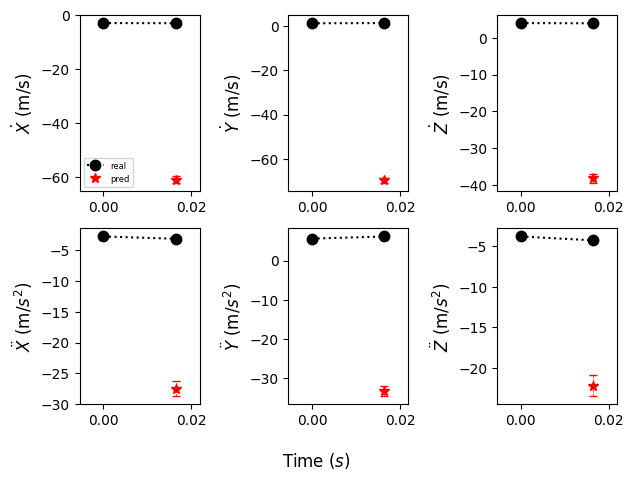

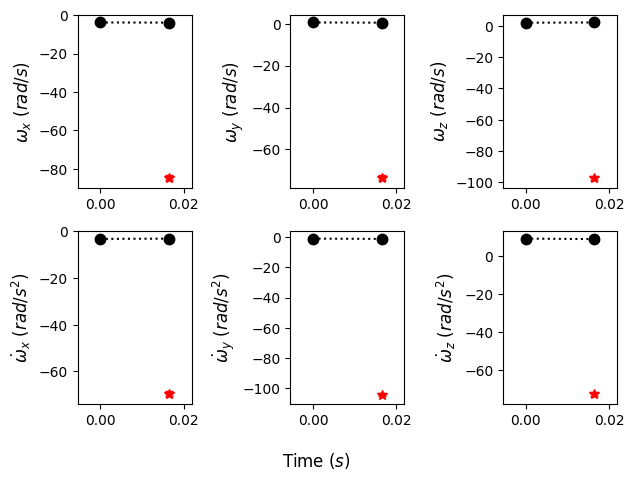

Current Batch Train Loss: 0.4768413305282593

Current Batch Train Loss: 0.010169457644224167

Current Batch Train Loss: 0.009465159848332405

Current Batch Train Loss: 0.007744216360151768

Current Batch Train Loss: 0.0068194204941391945

Current Batch Train Loss: 0.007151339203119278

Current Batch Train Loss: 0.007556488271802664

Current Batch Train Loss: 0.007318668998777866

Current Batch Train Loss: 0.006180772557854652

Current Batch Train Loss: 0.006817229092121124

Current Batch Train Loss: 0.006767089478671551

Current Batch Train Loss: 0.006632660981267691

Current Batch Train Loss: 0.009516552090644836

Current Batch Train Loss: 0.0077031380496919155

Current Batch Train Loss: 0.005792996846139431

Current Batch Train Loss: 0.006181032862514257

Current Batch Train Loss: 0.007384421303868294

Current Batch Train Loss: 0.006105152890086174

Current Batch Train Loss: 0.006883939262479544

Current Batch Train Loss: 0.007834985852241516

Current Batch Train Loss: 0.006962913554

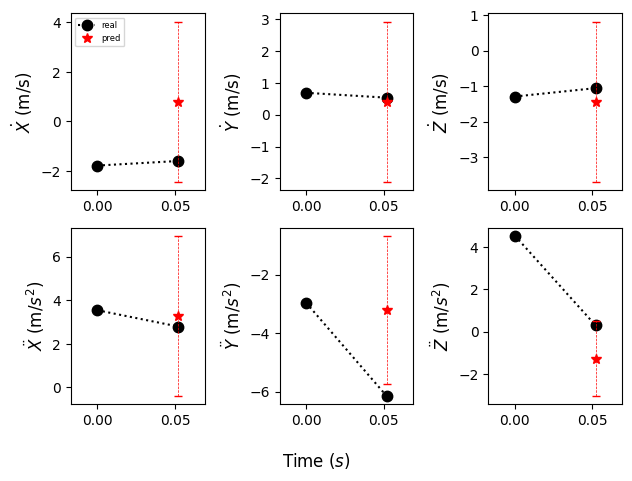

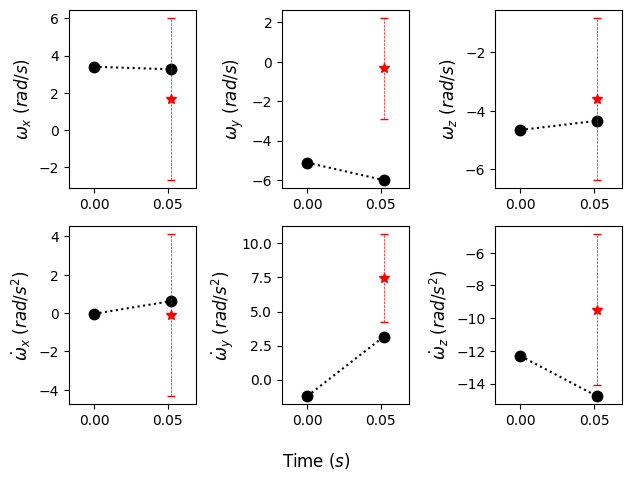

Current Batch Train Loss: 0.006196067668497562

Current Batch Train Loss: 0.0054014865309000015

Current Batch Train Loss: 0.005213484168052673

Current Batch Train Loss: 0.0064417640678584576

Current Batch Train Loss: 0.010364766232669353

Current Batch Train Loss: 0.006990673951804638

Current Batch Train Loss: 0.010081978514790535

Current Batch Train Loss: 0.004942797590047121

Current Batch Train Loss: 0.007000719662755728

Current Batch Train Loss: 0.0076635414734482765

Current Batch Train Loss: 0.0050934795290231705

Current Batch Train Loss: 0.005086314398795366

Current Batch Train Loss: 0.006174885202199221

Current Batch Train Loss: 0.006719110533595085

Current Batch Train Loss: 0.005223975982517004

Current Batch Train Loss: 0.004815113265067339

Current Batch Train Loss: 0.005847984459251165

Current Batch Train Loss: 0.005491556599736214

Current Batch Train Loss: 0.005573953501880169

Current Batch Train Loss: 0.0059820497408509254

Current Batch Train Loss: 0.0078146

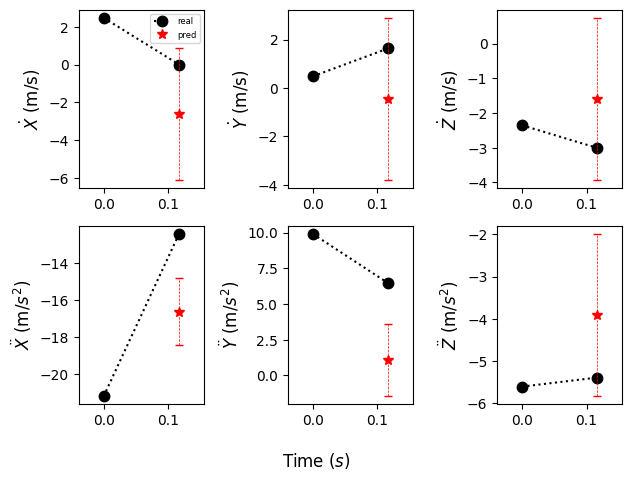

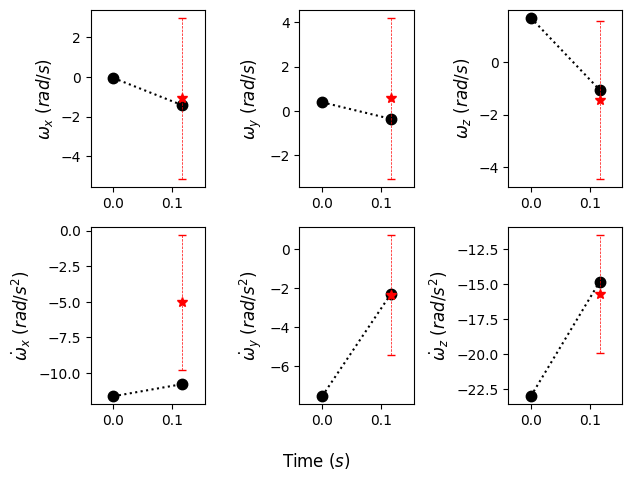

Current Batch Train Loss: 0.004718662239611149

Current Batch Train Loss: 0.0047560762614011765

Current Batch Train Loss: 0.005166450049728155

Current Batch Train Loss: 0.004482495132833719

Current Batch Train Loss: 0.005729625467211008

Current Batch Train Loss: 0.007121999282389879

Current Batch Train Loss: 0.0068922159262001514

Current Batch Train Loss: 0.006255485583096743

Current Batch Train Loss: 0.004613999277353287

Current Batch Train Loss: 0.004340252839028835

Current Batch Train Loss: 0.005233254749327898

Current Batch Train Loss: 0.004742585122585297

Current Batch Train Loss: 0.008400965481996536

Current Batch Train Loss: 0.004839787725359201

Current Batch Train Loss: 0.004983971361070871

Current Batch Train Loss: 0.0052910856902599335

Current Batch Train Loss: 0.008264434523880482

Current Batch Train Loss: 0.005700295325368643

Current Batch Train Loss: 0.009033344686031342

Current Batch Train Loss: 0.005305543076246977

Current Batch Train Loss: 0.005560097

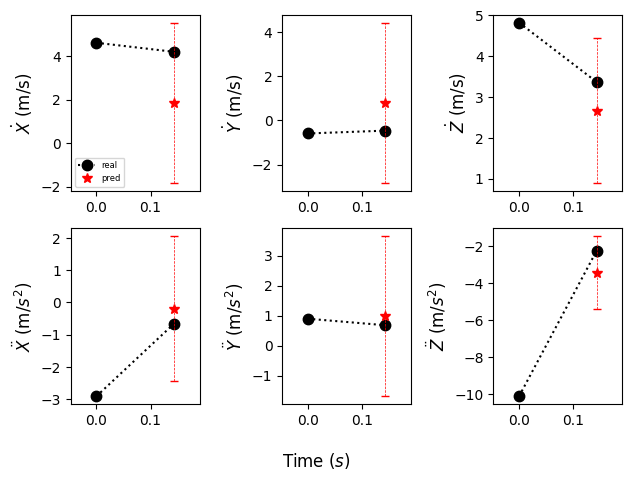

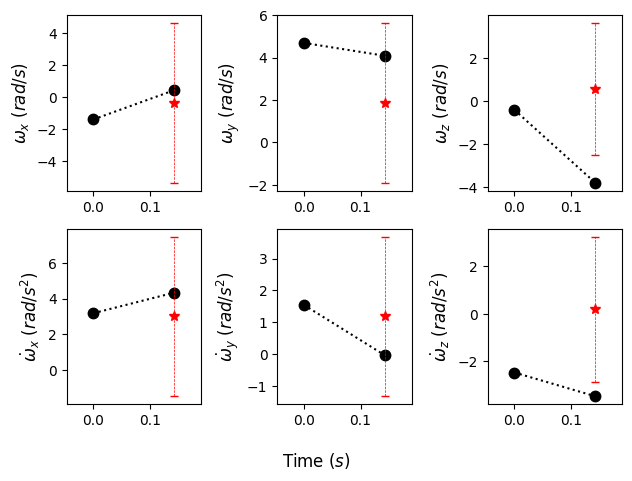

Current Batch Train Loss: 0.006624029017984867

Current Batch Train Loss: 0.006101156584918499

Current Batch Train Loss: 0.006220466457307339

Current Batch Train Loss: 0.006357244215905666

Current Batch Train Loss: 0.0059763905592262745

Current Batch Train Loss: 0.006259196903556585

Current Batch Train Loss: 0.005960621405392885

Current Batch Train Loss: 0.004740695469081402

Current Batch Train Loss: 0.006260334514081478

Current Batch Train Loss: 0.004396982491016388

Current Batch Train Loss: 0.006379762664437294

Current Batch Train Loss: 0.004871319979429245

Current Batch Train Loss: 0.004701346158981323

Current Batch Train Loss: 0.004738023970276117

Current Batch Train Loss: 0.004708271007984877

Current Batch Train Loss: 0.004433462396264076

Current Batch Train Loss: 0.005487262271344662

Current Batch Train Loss: 0.005715691018849611

Current Batch Train Loss: 0.005436035804450512

Current Batch Train Loss: 0.010102633386850357

Current Batch Train Loss: 0.00586155522

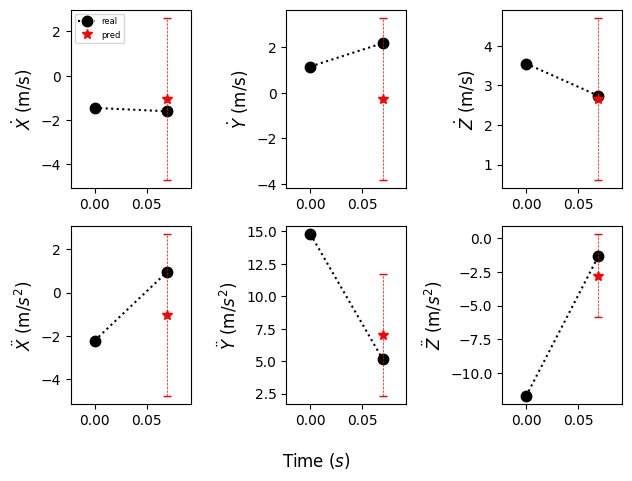

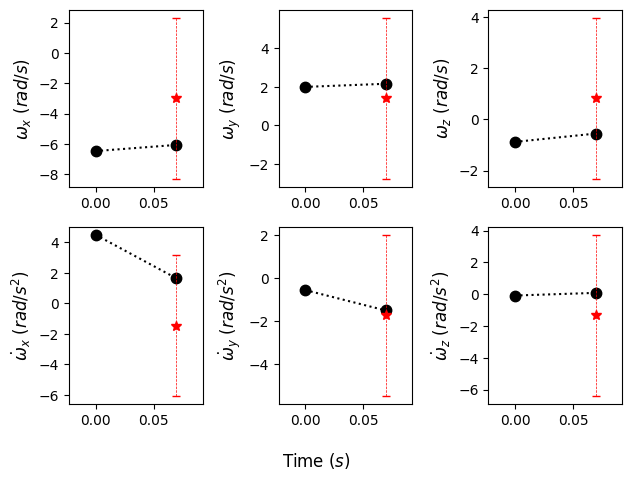

Current Batch Train Loss: 0.006314689293503761

Current Batch Train Loss: 0.004259939771145582

Current Batch Train Loss: 0.008058647625148296

Current Batch Train Loss: 0.004957509692758322

Current Batch Train Loss: 0.007638349663466215

Current Batch Train Loss: 0.004890779964625835

Current Batch Train Loss: 0.004127408377826214

Current Batch Train Loss: 0.00498192198574543

Current Batch Train Loss: 0.004049874376505613

Current Batch Train Loss: 0.00465010479092598

Current Batch Train Loss: 0.005274918861687183

Current Batch Train Loss: 0.004724135156720877

Current Batch Train Loss: 0.004843628499656916

Current Batch Train Loss: 0.005576135125011206

Current Batch Train Loss: 0.005353026557713747

Current Batch Train Loss: 0.004695538431406021

Current Batch Train Loss: 0.005651215091347694

Current Batch Train Loss: 0.007114638574421406

Current Batch Train Loss: 0.004836185835301876

Current Batch Train Loss: 0.005100682377815247

Current Batch Train Loss: 0.00481989793479

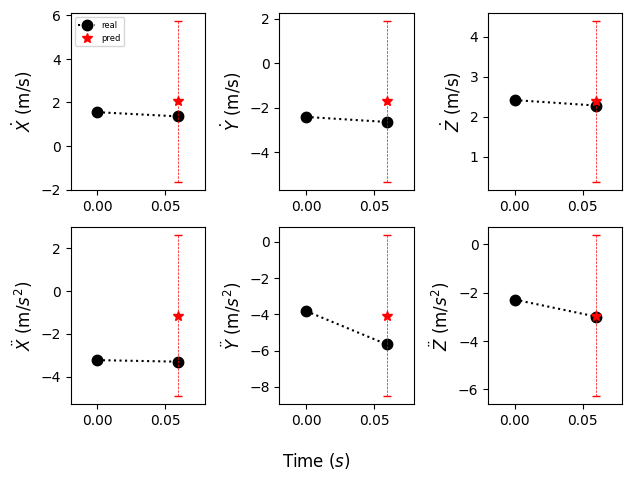

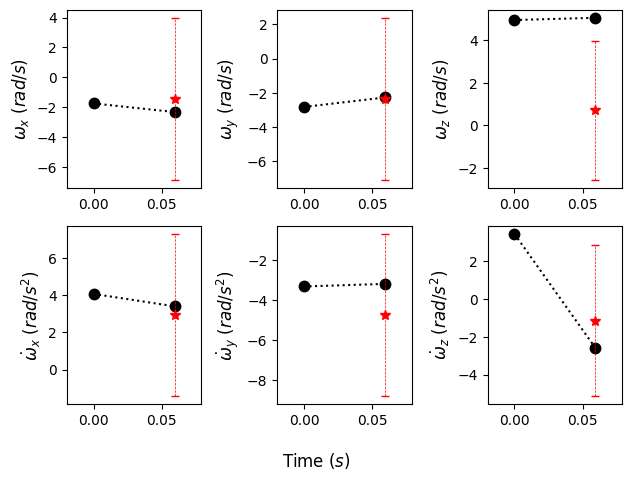

Current Batch Train Loss: 0.0060311853885650635

Current Batch Train Loss: 0.005575488321483135

Current Batch Train Loss: 0.004361369181424379

Current Batch Train Loss: 0.005290733650326729

Current Batch Train Loss: 0.0049713002517819405

Current Batch Train Loss: 0.004323476459830999

Current Batch Train Loss: 0.00448645418509841

Current Batch Train Loss: 0.004687228240072727

Current Batch Train Loss: 0.004679299890995026

Current Batch Train Loss: 0.005521248560398817

Current Batch Train Loss: 0.004451561253517866

Current Batch Train Loss: 0.004227957222610712

Current Batch Train Loss: 0.004556823056191206

Current Batch Train Loss: 0.005833129398524761

Current Batch Train Loss: 0.004998821299523115

Current Batch Train Loss: 0.008164183236658573

Current Batch Train Loss: 0.006828551180660725

Current Batch Train Loss: 0.004900079686194658

Current Batch Train Loss: 0.0048813954927027225

Current Batch Train Loss: 0.006133998744189739

Current Batch Train Loss: 0.0057854922

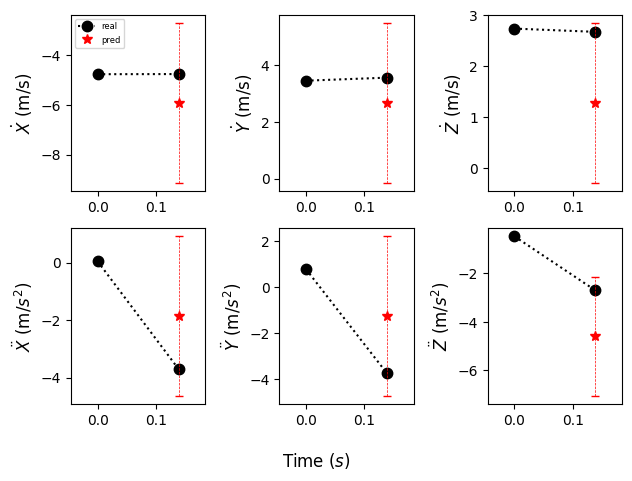

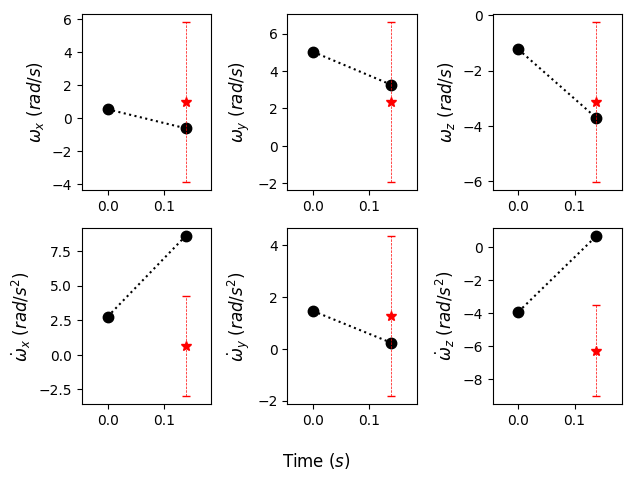

Current Batch Train Loss: 0.005425337236374617

Current Batch Train Loss: 0.004318476188927889

Current Batch Train Loss: 0.0043873549439013

Current Batch Train Loss: 0.0069183772429823875

Current Batch Train Loss: 0.004192797467112541

Current Batch Train Loss: 0.00478570768609643

Current Batch Train Loss: 0.004464104771614075

Current Batch Train Loss: 0.006072112359106541

Current Batch Train Loss: 0.0052950079552829266

Current Batch Train Loss: 0.004525746218860149

Current Batch Train Loss: 0.004472002852708101

Current Batch Train Loss: 0.00521702878177166

Current Batch Train Loss: 0.009381997399032116

Current Batch Train Loss: 0.005024386569857597

Current Batch Train Loss: 0.0042230188846588135

Current Batch Train Loss: 0.0070195989683270454

Current Batch Train Loss: 0.005157328676432371

Current Batch Train Loss: 0.006601660046726465

Current Batch Train Loss: 0.004306860268115997

Current Batch Train Loss: 0.004933349322527647

Current Batch Train Loss: 0.005794141441

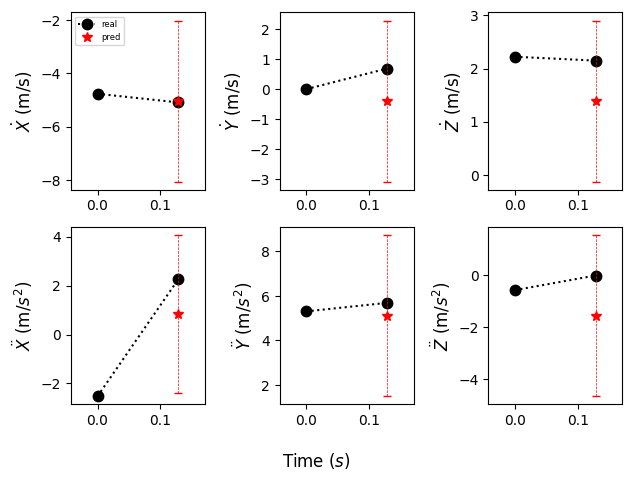

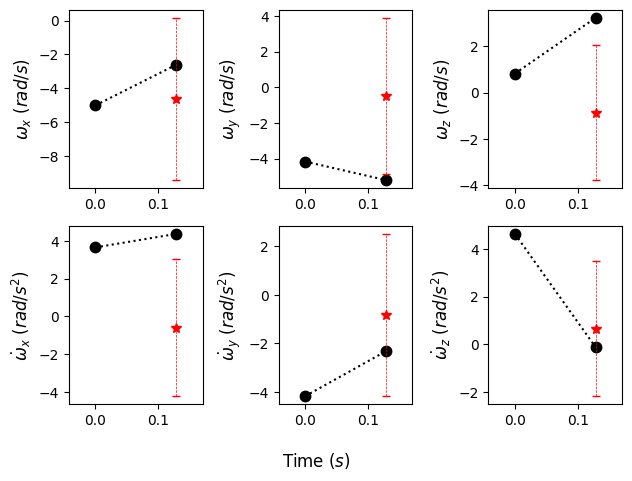

Current Batch Train Loss: 0.003931309096515179

Current Batch Train Loss: 0.0041963886469602585

Current Batch Train Loss: 0.006400614511221647

Current Batch Train Loss: 0.005011643283069134

Current Batch Train Loss: 0.0044182981364429

Current Batch Train Loss: 0.008267750032246113

Current Batch Train Loss: 0.005422892980277538

Current Batch Train Loss: 0.006025698967278004

Current Batch Train Loss: 0.005682089831680059

Current Batch Train Loss: 0.0069315675646066666

Current Batch Train Loss: 0.003965731710195541

Current Batch Train Loss: 0.004597129300236702

Current Batch Train Loss: 0.006278139539062977

Current Batch Train Loss: 0.006290252786129713

Current Batch Train Loss: 0.004590972326695919

Current Batch Train Loss: 0.004343991167843342

Current Batch Train Loss: 0.004477546084672213

Current Batch Train Loss: 0.005496646743267775

Current Batch Train Loss: 0.0043392363004386425

Current Batch Train Loss: 0.004525440279394388

Current Batch Train Loss: 0.00452009635

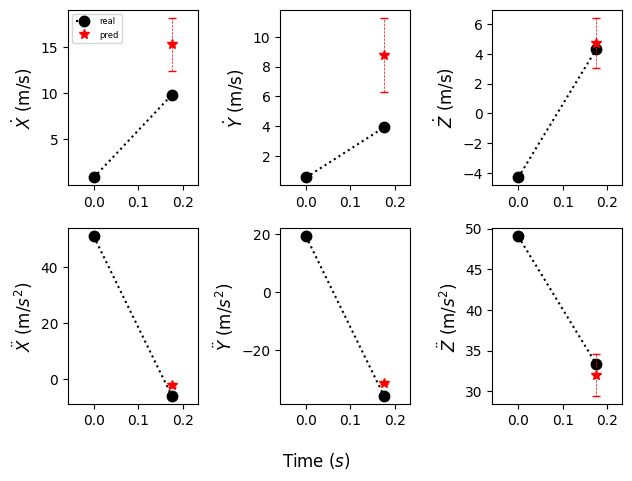

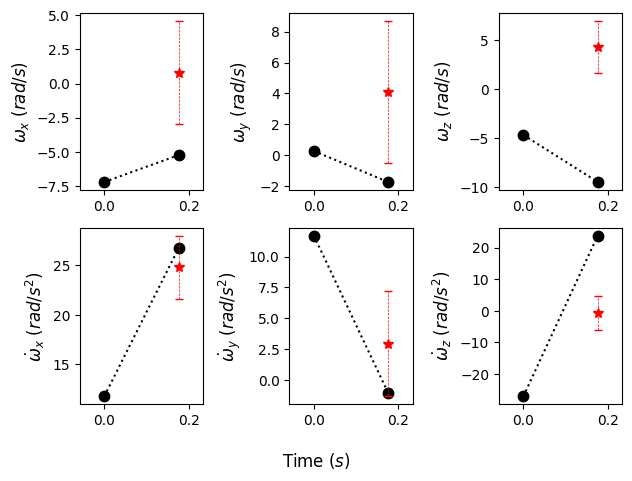

Current Batch Train Loss: 0.005839153658598661

Current Batch Train Loss: 0.006699179764837027

Current Batch Train Loss: 0.004953907802700996

Current Batch Train Loss: 0.004195689223706722

Current Batch Train Loss: 0.004111731890588999

Current Batch Train Loss: 0.004343043081462383

Current Batch Train Loss: 0.006213467102497816

Current Batch Train Loss: 0.004308438394218683

Current Batch Train Loss: 0.005852933041751385

Current Batch Train Loss: 0.004458683542907238

Current Batch Train Loss: 0.004198343027383089

Current Batch Train Loss: 0.00718037411570549

Current Batch Train Loss: 0.004640110302716494

Current Batch Train Loss: 0.00555097870528698

Current Batch Train Loss: 0.00473711546510458

Current Batch Train Loss: 0.008627734147012234

Current Batch Train Loss: 0.004564414266496897

Current Batch Train Loss: 0.005608473904430866

Current Batch Train Loss: 0.004535190761089325

Current Batch Train Loss: 0.00427793525159359

Current Batch Train Loss: 0.0054718586616218

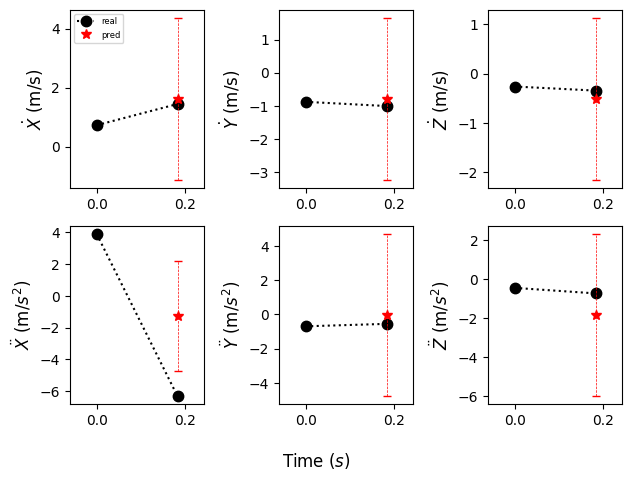

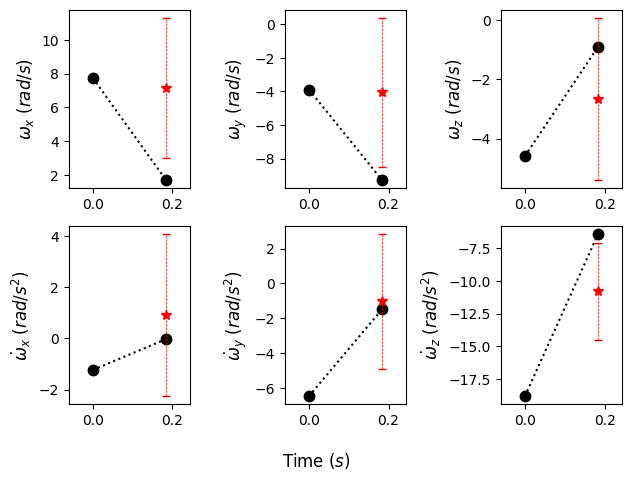

Current Batch Train Loss: 0.004417416639626026

Current Batch Train Loss: 0.005938027985394001

Current Batch Train Loss: 0.0055226851254701614

Current Batch Train Loss: 0.0048310719430446625

Current Batch Train Loss: 0.00413898890838027

Current Batch Train Loss: 0.004133818205446005

Current Batch Train Loss: 0.0076250601559877396

Current Batch Train Loss: 0.007347838021814823

Current Batch Train Loss: 0.004149597138166428

Current Batch Train Loss: 0.003930545412003994

Current Batch Train Loss: 0.004042796324938536

Current Batch Train Loss: 0.007746258284896612

Current Batch Train Loss: 0.005634299945086241

Current Batch Train Loss: 0.00463709095492959

Current Batch Train Loss: 0.004545116797089577

Current Batch Train Loss: 0.004430730827152729

Current Batch Train Loss: 0.004444038961082697

Current Batch Train Loss: 0.005006339866667986

Current Batch Train Loss: 0.003969746176153421

Current Batch Train Loss: 0.004096197430044413

Current Batch Train Loss: 0.00392233813

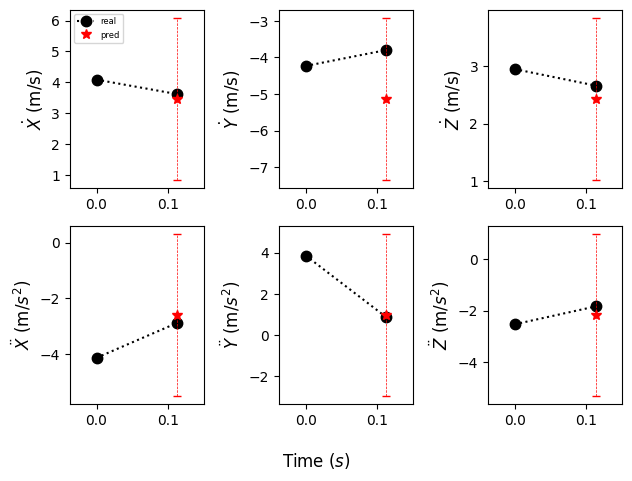

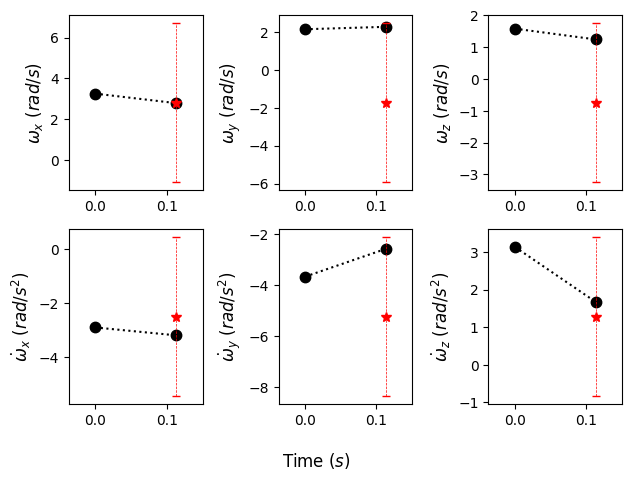

Current Batch Train Loss: 0.004513316787779331

Current Batch Train Loss: 0.005575558170676231

Current Batch Train Loss: 0.004772171378135681

Current Batch Train Loss: 0.004425151739269495

Current Batch Train Loss: 0.004965420812368393

Current Batch Train Loss: 0.004061694256961346

Current Batch Train Loss: 0.004947858862578869

Current Batch Train Loss: 0.0038281127344816923

Current Batch Train Loss: 0.004308110568672419

Current Batch Train Loss: 0.005322782788425684

Current Batch Train Loss: 0.009047689847648144

Current Batch Train Loss: 0.0043494608253240585

Current Batch Train Loss: 0.005037425085902214

Current Batch Train Loss: 0.004022173583507538

Current Batch Train Loss: 0.0046207900159060955

Current Batch Train Loss: 0.004086067900061607

Current Batch Train Loss: 0.004044302739202976

Current Batch Train Loss: 0.003975360654294491

Current Batch Train Loss: 0.003988579846918583

Current Batch Train Loss: 0.007175868842750788

Current Batch Train Loss: 0.004908491

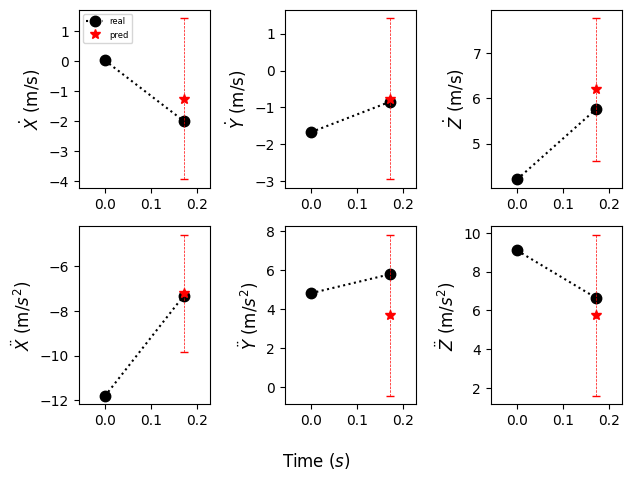

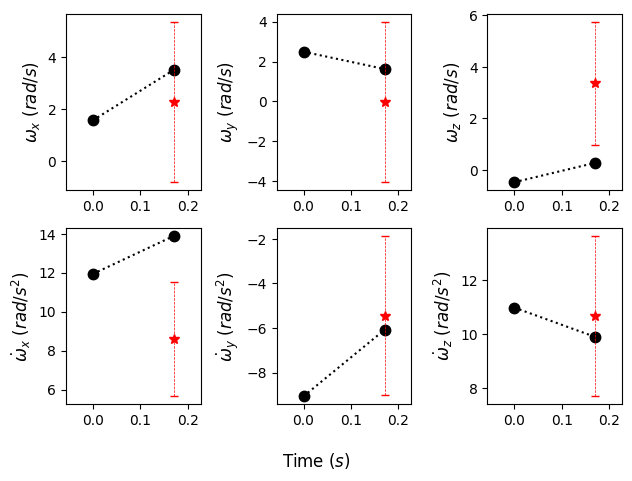

Current Batch Train Loss: 0.005675916094332933

Current Batch Train Loss: 0.0055652791634202

Current Batch Train Loss: 0.0047515686601400375

Current Batch Train Loss: 0.0040049077942967415

Current Batch Train Loss: 0.004380648024380207

Current Batch Train Loss: 0.004763898439705372

Current Batch Train Loss: 0.004170469474047422

Current Batch Train Loss: 0.0058595878072083

Current Batch Train Loss: 0.004778574220836163

Current Batch Train Loss: 0.005842619575560093

Current Batch Train Loss: 0.004462794866412878

Current Batch Train Loss: 0.004645918495953083

Current Batch Train Loss: 0.004101958591490984

Current Batch Train Loss: 0.004387380555272102

Current Batch Train Loss: 0.003924430813640356

Current Batch Train Loss: 0.006354238837957382

Current Batch Train Loss: 0.004530650097876787

Current Batch Train Loss: 0.004608700983226299

Current Batch Train Loss: 0.005825285334140062

Current Batch Train Loss: 0.005760580766946077

Current Batch Train Loss: 0.00481522083282

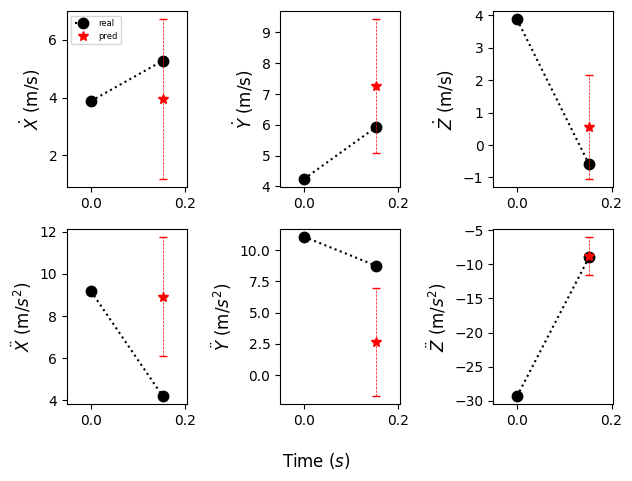

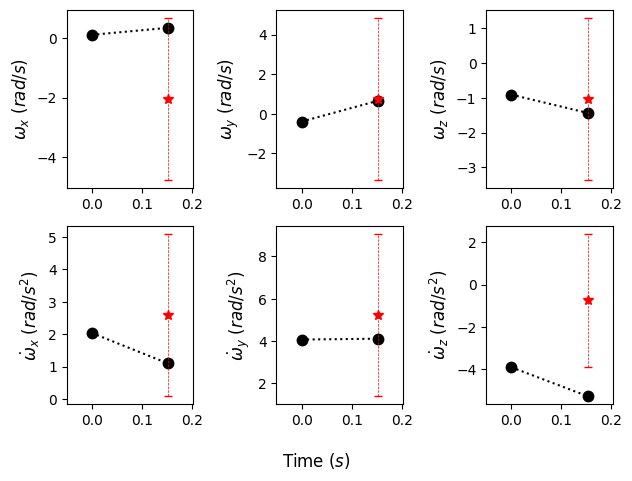

Current Batch Train Loss: 0.005098352674394846

Current Batch Train Loss: 0.006324264220893383

Current Batch Train Loss: 0.006508170627057552

Current Batch Train Loss: 0.004758553113788366

Current Batch Train Loss: 0.00728067010641098

Current Batch Train Loss: 0.0058445013128221035

Current Batch Train Loss: 0.008993306197226048

Current Batch Train Loss: 0.004137301351875067

Current Batch Train Loss: 0.005848611705005169

Current Batch Train Loss: 0.004135563503950834

Current Batch Train Loss: 0.008658986538648605

Current Batch Train Loss: 0.0059213158674538136

Current Batch Train Loss: 0.0051645878702402115

Current Batch Train Loss: 0.005188183393329382

Current Batch Train Loss: 0.00592845631763339

Current Batch Train Loss: 0.006437176372855902

Current Batch Train Loss: 0.003995940089225769

Current Batch Train Loss: 0.004046139307320118

Current Batch Train Loss: 0.005862233228981495

Current Batch Train Loss: 0.004475671332329512

Current Batch Train Loss: 0.00475587323

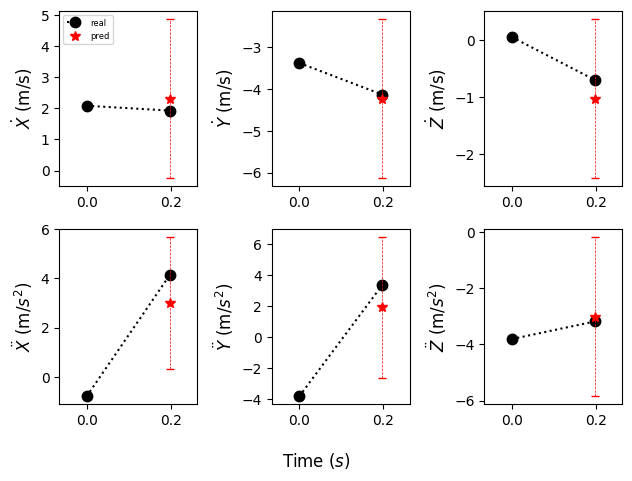

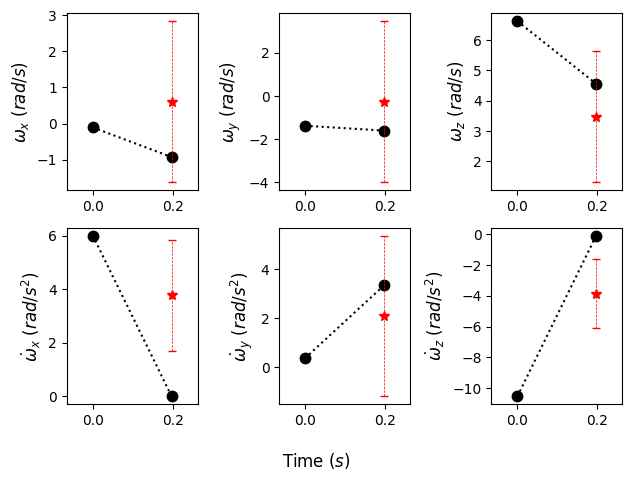

Current Batch Train Loss: 0.004021588712930679

Current Batch Train Loss: 0.005754898767918348

Current Batch Train Loss: 0.004311918746680021

Current Batch Train Loss: 0.005402275361120701

Current Batch Train Loss: 0.003816939191892743

Current Batch Train Loss: 0.005169440060853958

Current Batch Train Loss: 0.0038027658592909575

Current Batch Train Loss: 0.005104871466755867

Current Batch Train Loss: 0.0049356273375451565

Current Batch Train Loss: 0.005047116428613663

Current Batch Train Loss: 0.003972252365201712

Current Batch Train Loss: 0.005412098951637745

Current Batch Train Loss: 0.005136082414537668

Current Batch Train Loss: 0.00799167063087225

Current Batch Train Loss: 0.006249497178941965

Current Batch Train Loss: 0.006089864298701286

Current Batch Train Loss: 0.004353845026344061

Current Batch Train Loss: 0.004700827412307262

Current Batch Train Loss: 0.006956065073609352

Current Batch Train Loss: 0.003961014095693827

Current Batch Train Loss: 0.00445477059

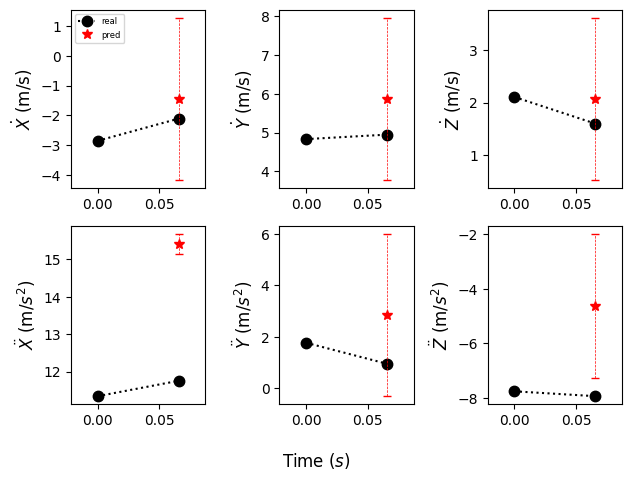

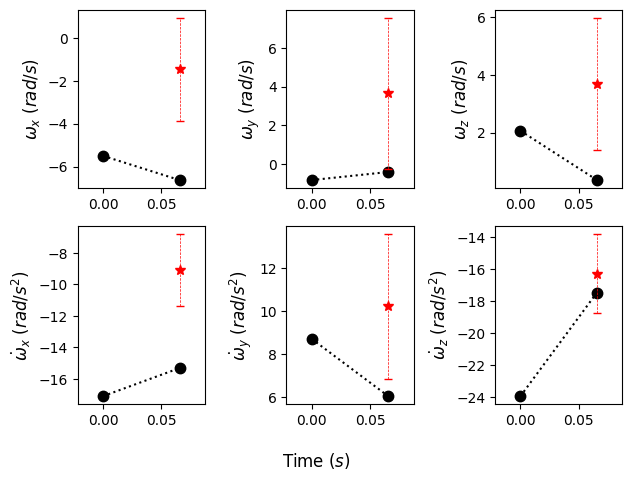

Current Batch Train Loss: 0.005546377971768379

Current Batch Train Loss: 0.00394551083445549

Current Batch Train Loss: 0.004068249836564064

Current Batch Train Loss: 0.00812432263046503

Current Batch Train Loss: 0.003966843243688345

Current Batch Train Loss: 0.003929266706109047

Current Batch Train Loss: 0.0044169374741613865

Current Batch Train Loss: 0.004715949762612581

Current Batch Train Loss: 0.00583482114598155

Current Batch Train Loss: 0.007197773549705744

Current Batch Train Loss: 0.005068231374025345

Current Batch Train Loss: 0.004482617136090994

Current Batch Train Loss: 0.005383353680372238

Current Batch Train Loss: 0.004563898779451847

Current Batch Train Loss: 0.004579966422170401

Current Batch Train Loss: 0.003868349362164736

Current Batch Train Loss: 0.006678886711597443

Current Batch Train Loss: 0.0042969947680830956

Current Batch Train Loss: 0.008027825504541397

Current Batch Train Loss: 0.004938199650496244

Current Batch Train Loss: 0.0048629515804

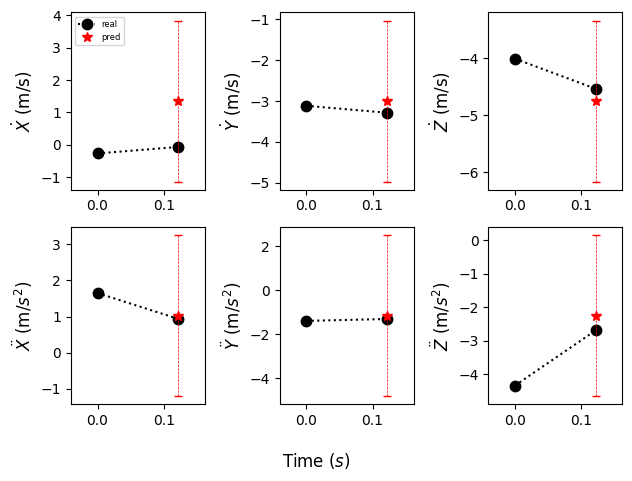

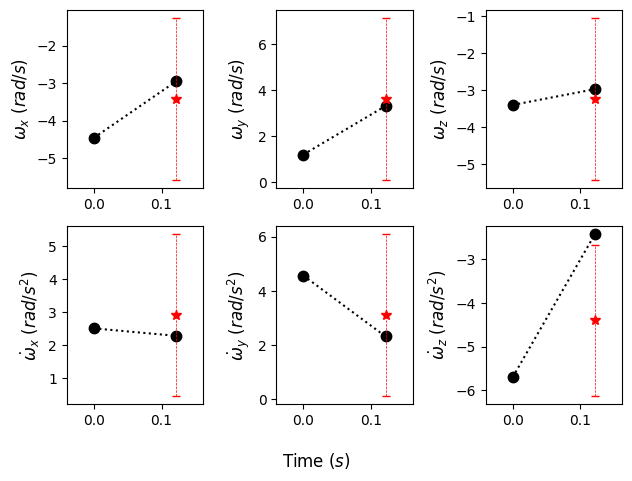

Current Batch Train Loss: 0.004002471454441547

Current Batch Train Loss: 0.004551934078335762

Current Batch Train Loss: 0.004288196098059416

Current Batch Train Loss: 0.006057216320186853

Current Batch Train Loss: 0.0040508173406124115

Current Batch Train Loss: 0.005778773687779903

Current Batch Train Loss: 0.004126451909542084

Current Batch Train Loss: 0.006576695013791323

Current Batch Train Loss: 0.006122507154941559

Current Batch Train Loss: 0.0048059881664812565

Current Batch Train Loss: 0.005365697201341391

Current Batch Train Loss: 0.00425665033981204

Current Batch Train Loss: 0.0066484916023910046

Current Batch Train Loss: 0.004354175180196762

Current Batch Train Loss: 0.005554368253797293

Current Batch Train Loss: 0.0045629022642970085

Current Batch Train Loss: 0.003948605619370937

Current Batch Train Loss: 0.005846602376550436

Current Batch Train Loss: 0.0038075274787843227

Current Batch Train Loss: 0.005515499971807003

Current Batch Train Loss: 0.00427230

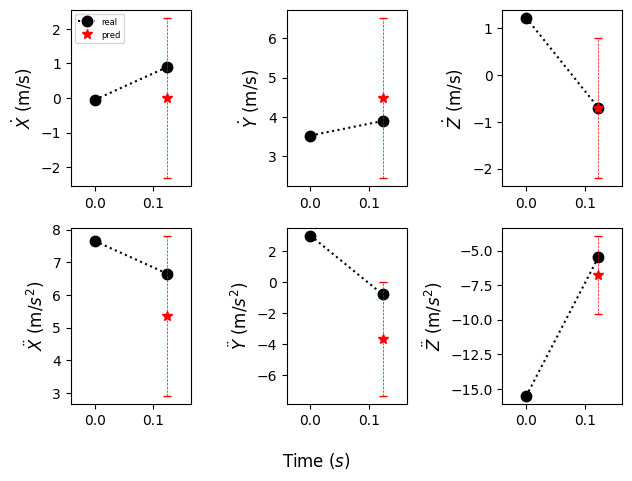

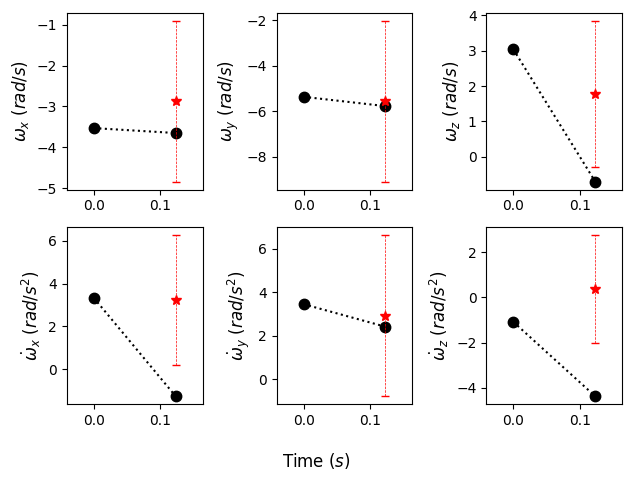

Current Batch Train Loss: 0.0042482768185436726

Current Batch Train Loss: 0.004921856336295605

Current Batch Train Loss: 0.00417671911418438

Current Batch Train Loss: 0.006429055240005255

Current Batch Train Loss: 0.0040220459923148155

Current Batch Train Loss: 0.00450164033100009

Current Batch Train Loss: 0.00394654693081975

Current Batch Train Loss: 0.004062235355377197

Current Batch Train Loss: 0.00392208993434906

Current Batch Train Loss: 0.005033351015299559

Current Batch Train Loss: 0.0054120770655572414

Current Batch Train Loss: 0.004420536104589701

Current Batch Train Loss: 0.004024679306894541

Current Batch Train Loss: 0.003852889407426119

Current Batch Train Loss: 0.003953465726226568

Current Batch Train Loss: 0.006657642312347889

Current Batch Train Loss: 0.004147326573729515

Current Batch Train Loss: 0.003766673384234309

Current Batch Train Loss: 0.004201545380055904

Current Batch Train Loss: 0.003968496806919575

Current Batch Train Loss: 0.0046538393944

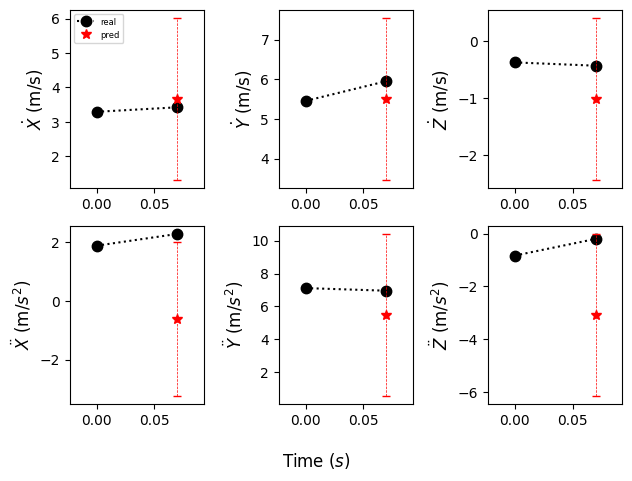

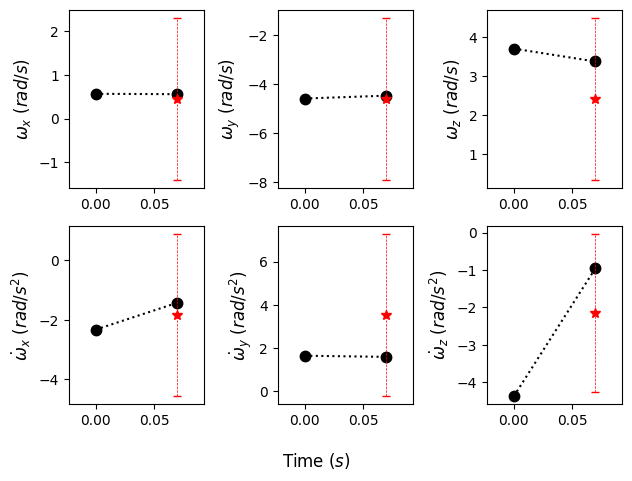

Current Batch Train Loss: 0.005521280225366354

Current Batch Train Loss: 0.004852417390793562

Current Batch Train Loss: 0.0039702290669083595

Current Batch Train Loss: 0.004364991094917059

Current Batch Train Loss: 0.004488879349082708

Current Batch Train Loss: 0.0043541486375033855

Current Batch Train Loss: 0.005352324340492487

Current Batch Train Loss: 0.0048862481489777565

Current Batch Train Loss: 0.004420016426593065

Current Batch Train Loss: 0.004659155383706093

Current Batch Train Loss: 0.006165831815451384

Current Batch Train Loss: 0.004096046090126038

Current Batch Train Loss: 0.004844393115490675

Current Batch Train Loss: 0.0064400844275951385

Current Batch Train Loss: 0.0055905962362885475

Current Batch Train Loss: 0.0038829483091831207

Current Batch Train Loss: 0.006359895225614309

Current Batch Train Loss: 0.003910223953425884

Current Batch Train Loss: 0.003838856238871813

Current Batch Train Loss: 0.0035335717257112265

Current Batch Train Loss: 0.00378

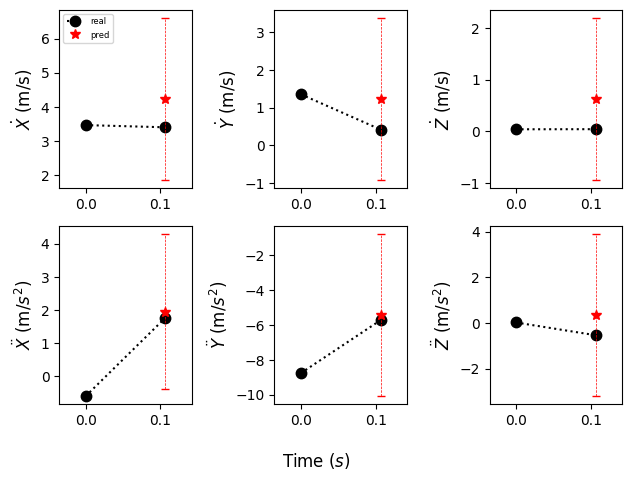

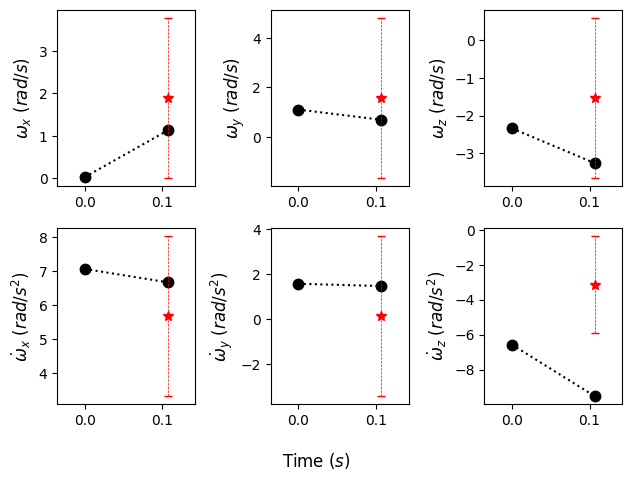

Current Batch Train Loss: 0.004235325381159782

Current Batch Train Loss: 0.007543426472693682

Current Batch Train Loss: 0.0038129917811602354

Current Batch Train Loss: 0.0038919784128665924

Current Batch Train Loss: 0.0037119865883141756

Current Batch Train Loss: 0.004057368263602257

Current Batch Train Loss: 0.006042775232344866

Current Batch Train Loss: 0.004037019796669483

Current Batch Train Loss: 0.005371824372559786

Current Batch Train Loss: 0.004911281168460846

Current Batch Train Loss: 0.005107410252094269

Current Batch Train Loss: 0.005080905742943287

Current Batch Train Loss: 0.00633655721321702

Current Batch Train Loss: 0.0042934962548315525

Current Batch Train Loss: 0.004388948902487755

Current Batch Train Loss: 0.0051103876903653145

Current Batch Train Loss: 0.006899006199091673

Current Batch Train Loss: 0.0037561669014394283

Current Batch Train Loss: 0.005840384401381016

Current Batch Train Loss: 0.005214439705014229

Current Batch Train Loss: 0.0042370

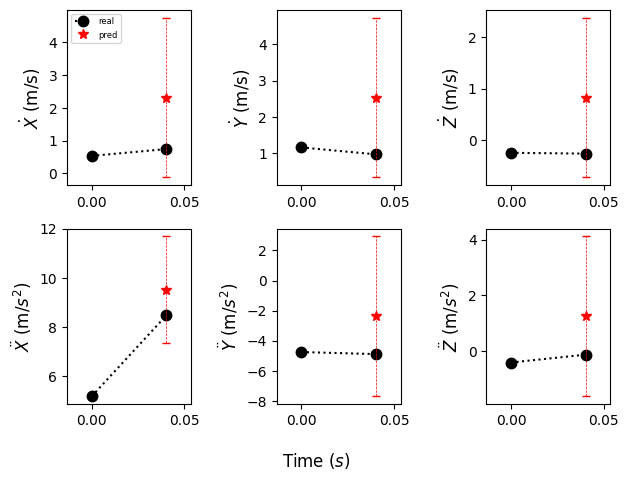

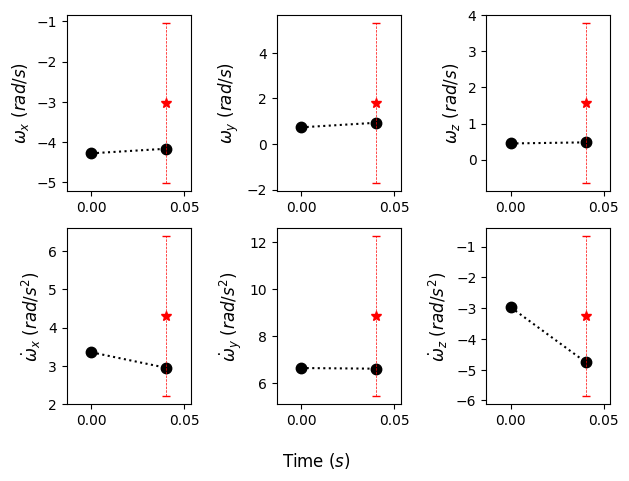

Current Batch Train Loss: 0.004500245209783316

Current Batch Train Loss: 0.006240041460841894

Current Batch Train Loss: 0.00440550409257412

Current Batch Train Loss: 0.0035940627567470074

Current Batch Train Loss: 0.006318668834865093

Current Batch Train Loss: 0.004646072164177895

Current Batch Train Loss: 0.003892645239830017

Current Batch Train Loss: 0.007002898957580328

Current Batch Train Loss: 0.0062551782466471195

Current Batch Train Loss: 0.003983210306614637

Current Batch Train Loss: 0.00421852245926857

Current Batch Train Loss: 0.0039528850466012955

Current Batch Train Loss: 0.005834617651998997

Current Batch Train Loss: 0.004713390953838825

Current Batch Train Loss: 0.005179932806640863

Current Batch Train Loss: 0.003851227927953005

Current Batch Train Loss: 0.004187262617051601

Current Batch Train Loss: 0.006433274131268263

Current Batch Train Loss: 0.003804069012403488

Current Batch Train Loss: 0.004147662315517664

Current Batch Train Loss: 0.00397998560

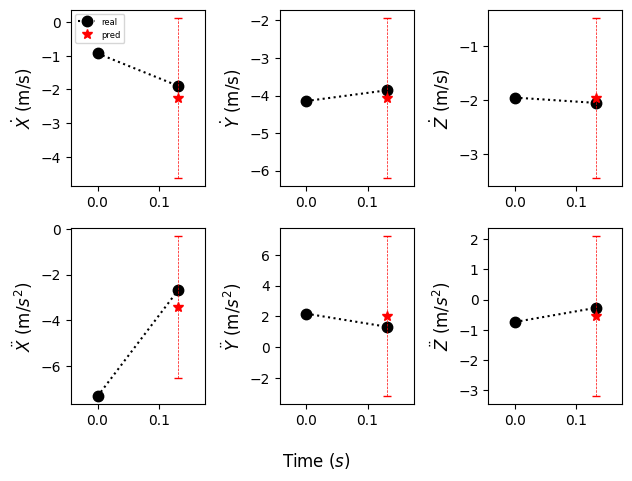

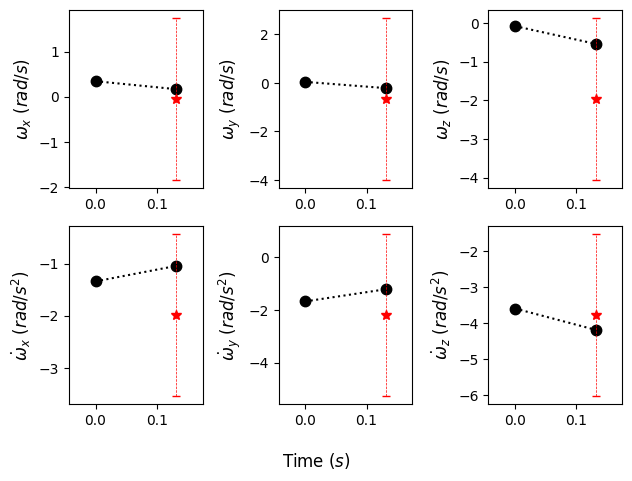

Current Batch Train Loss: 0.0037359106354415417

Current Batch Train Loss: 0.004354655276983976

Current Batch Train Loss: 0.004767309408634901

Current Batch Train Loss: 0.006477567367255688

Current Batch Train Loss: 0.00428839772939682

Current Batch Train Loss: 0.006373749114573002

Current Batch Train Loss: 0.007023192942142487

Current Batch Train Loss: 0.00599017133936286

Current Batch Train Loss: 0.0037001436576247215

Current Batch Train Loss: 0.004499109461903572

Current Batch Train Loss: 0.003692394820973277

Current Batch Train Loss: 0.004905089270323515

Current Batch Train Loss: 0.004057504236698151

Current Batch Train Loss: 0.005947727710008621

Current Batch Train Loss: 0.005844424478709698

Current Batch Train Loss: 0.0052360109984874725

Current Batch Train Loss: 0.004236156120896339

Current Batch Train Loss: 0.0077856737188994884

Current Batch Train Loss: 0.003733476158231497

Current Batch Train Loss: 0.003984909970313311

Current Batch Train Loss: 0.0039684996

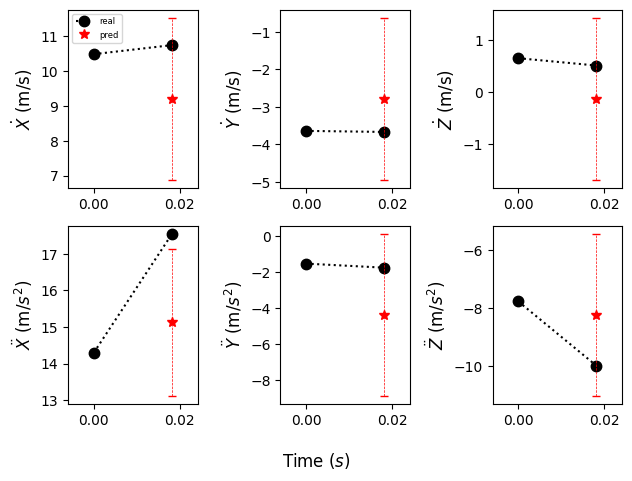

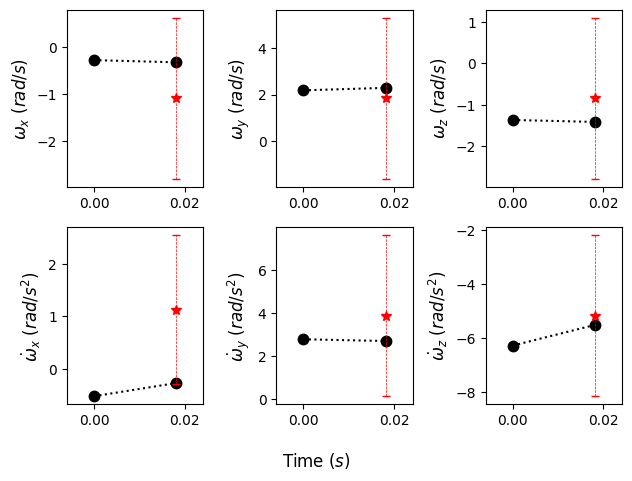

Current Batch Train Loss: 0.0038152788765728474

Current Batch Train Loss: 0.0037308381870388985

Current Batch Train Loss: 0.003878072602674365

Current Batch Train Loss: 0.004574097227305174

Current Batch Train Loss: 0.004188975319266319

Current Batch Train Loss: 0.005481970030814409

Current Batch Train Loss: 0.00369530962780118

Current Batch Train Loss: 0.006065958179533482

Current Batch Train Loss: 0.004357081837952137

Current Batch Train Loss: 0.004441133234649897

Current Batch Train Loss: 0.003908492159098387

Current Batch Train Loss: 0.006177494302392006

Current Batch Train Loss: 0.00517762266099453

Current Batch Train Loss: 0.0038662755396217108

Current Batch Train Loss: 0.004176625050604343

Current Batch Train Loss: 0.006925533525645733

Current Batch Train Loss: 0.0047715045511722565

Current Batch Train Loss: 0.003708384931087494

Current Batch Train Loss: 0.006502498872578144

Current Batch Train Loss: 0.005608666222542524

Current Batch Train Loss: 0.0051644374

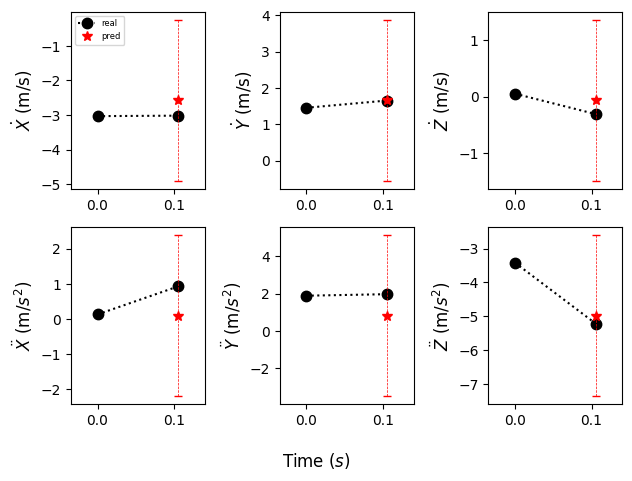

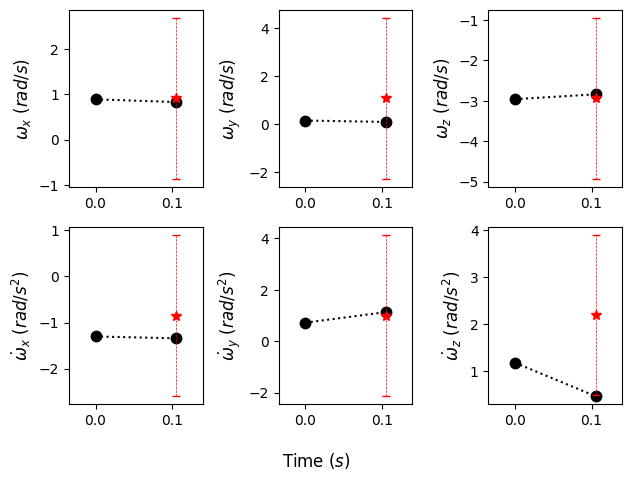

Current Batch Train Loss: 0.004813952371478081

Current Batch Train Loss: 0.003962761256843805

Current Batch Train Loss: 0.004577550105750561

Current Batch Train Loss: 0.004341762047261

Current Batch Train Loss: 0.006330279633402824

Current Batch Train Loss: 0.007053807377815247

Current Batch Train Loss: 0.004309098701924086

Current Batch Train Loss: 0.005039626732468605

Current Batch Train Loss: 0.0063096098601818085

Current Batch Train Loss: 0.004833735525608063

Current Batch Train Loss: 0.0040452741086483

Current Batch Train Loss: 0.003988925367593765

Current Batch Train Loss: 0.004164157900959253

Current Batch Train Loss: 0.004631612449884415

Current Batch Train Loss: 0.006544822361320257

Current Batch Train Loss: 0.004579885397106409

Current Batch Train Loss: 0.0038301702588796616

Current Batch Train Loss: 0.006028204690665007

Current Batch Train Loss: 0.0048416112549602985

Current Batch Train Loss: 0.004620887339115143

Current Batch Train Loss: 0.00375159271061

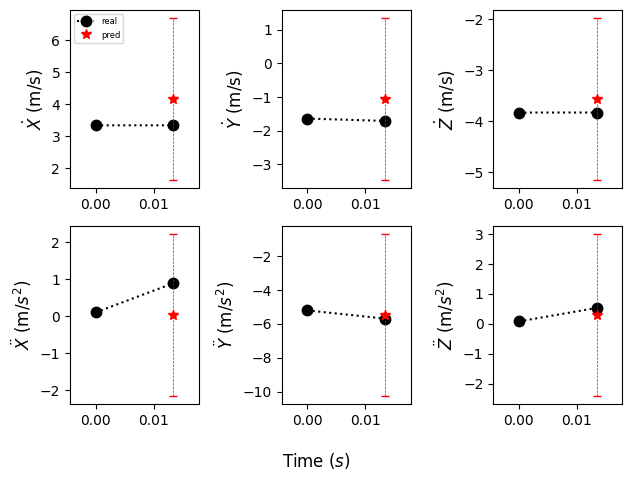

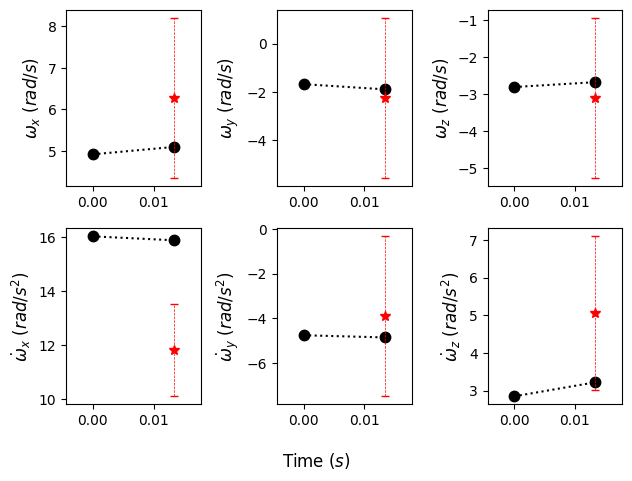

Current Batch Train Loss: 0.0038219657726585865

Current Batch Train Loss: 0.004774465225636959

Current Batch Train Loss: 0.0037076144944876432

Current Batch Train Loss: 0.003910709638148546

Current Batch Train Loss: 0.005818601697683334

Current Batch Train Loss: 0.004123678896576166

Current Batch Train Loss: 0.004358417354524136

Current Batch Train Loss: 0.0037037450820207596

Current Batch Train Loss: 0.0042155152186751366

Current Batch Train Loss: 0.005656932480633259

Current Batch Train Loss: 0.005323788616806269

Current Batch Train Loss: 0.0038465317338705063

Current Batch Train Loss: 0.004180890042334795

Current Batch Train Loss: 0.0038634552620351315

Current Batch Train Loss: 0.0041268132627010345

Current Batch Train Loss: 0.005243483930826187

Current Batch Train Loss: 0.004449135158210993

Current Batch Train Loss: 0.005397898145020008

Current Batch Train Loss: 0.0038788991514593363

Current Batch Train Loss: 0.005893715191632509

Current Batch Train Loss: 0.0038

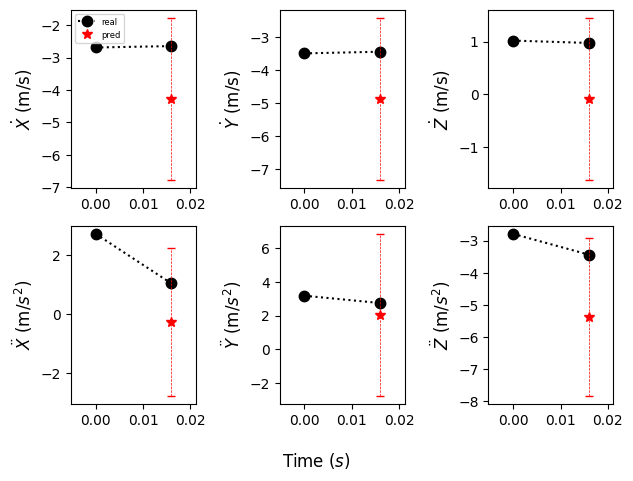

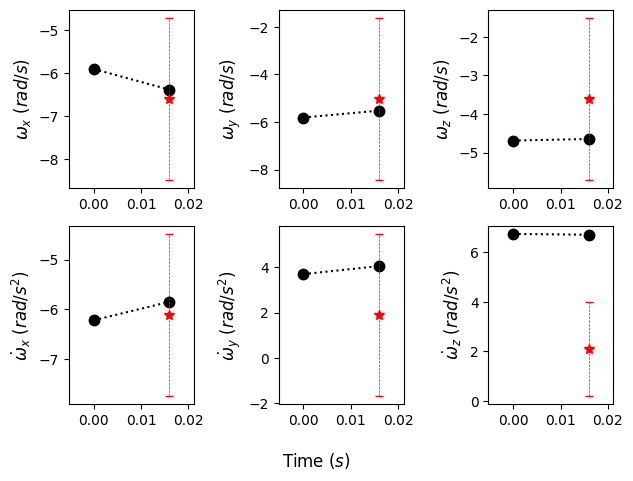

Current Batch Train Loss: 0.006407806184142828

Current Batch Train Loss: 0.004285886883735657

Current Batch Train Loss: 0.003850107779726386

Current Batch Train Loss: 0.0038029944989830256

Current Batch Train Loss: 0.004685685969889164

Current Batch Train Loss: 0.004981181584298611

Current Batch Train Loss: 0.004095433279871941

Current Batch Train Loss: 0.003805684158578515

Current Batch Train Loss: 0.0036761132068932056

Current Batch Train Loss: 0.0048308661207556725

Current Batch Train Loss: 0.0045557692646980286

Current Batch Train Loss: 0.004030198790132999

Current Batch Train Loss: 0.005385661032050848

Current Batch Train Loss: 0.004182503558695316

Current Batch Train Loss: 0.004896761383861303

Current Batch Train Loss: 0.0042855641804635525

Current Batch Train Loss: 0.004844187293201685

Current Batch Train Loss: 0.003626093966886401

Current Batch Train Loss: 0.0037447107024490833

Current Batch Train Loss: 0.004982941318303347

Current Batch Train Loss: 0.003847

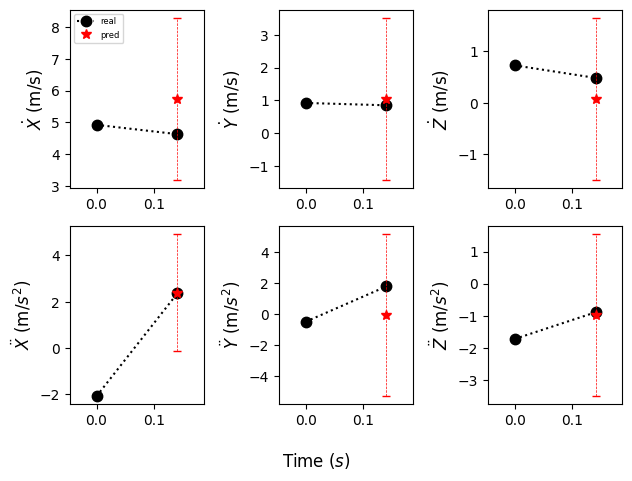

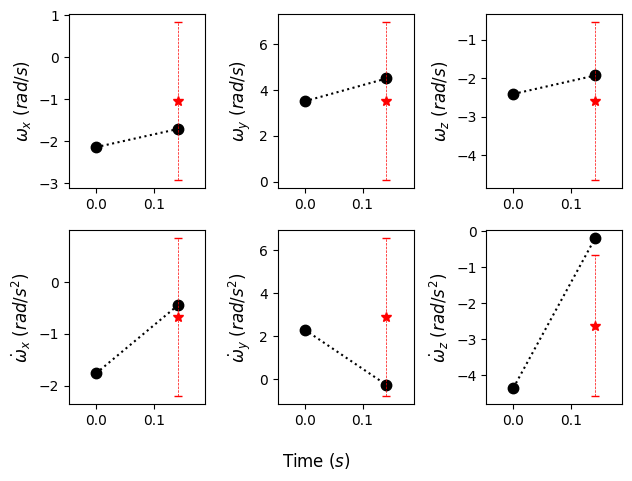

Current Batch Train Loss: 0.0044621978886425495

Current Batch Train Loss: 0.004805337637662888

Current Batch Train Loss: 0.004501440562307835

Current Batch Train Loss: 0.004416593350470066

Current Batch Train Loss: 0.006214090622961521

Current Batch Train Loss: 0.005408612545579672

Current Batch Train Loss: 0.005252157337963581

Current Batch Train Loss: 0.005922835785895586

Current Batch Train Loss: 0.004951249808073044

Current Batch Train Loss: 0.006268768571317196

Current Batch Train Loss: 0.005852818489074707

Current Batch Train Loss: 0.005719485227018595

Current Batch Train Loss: 0.00686635309830308

Current Batch Train Loss: 0.004444675054401159

Current Batch Train Loss: 0.004577916115522385

Current Batch Train Loss: 0.004475138615816832

Current Batch Train Loss: 0.0044973865151405334

Current Batch Train Loss: 0.005632423795759678

Current Batch Train Loss: 0.0037522141356021166

Current Batch Train Loss: 0.0040017105638980865

Current Batch Train Loss: 0.004329145

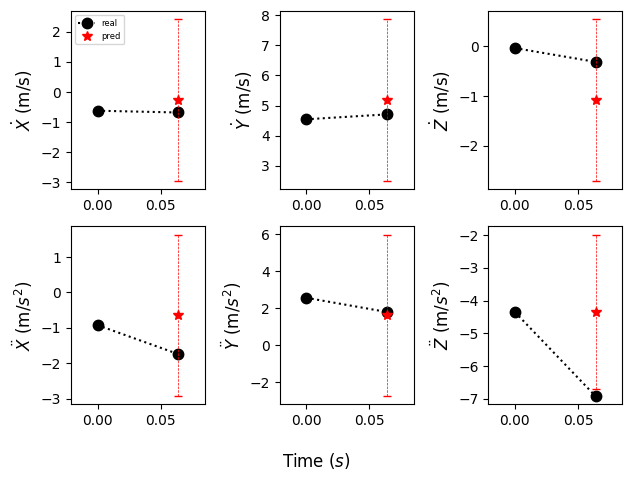

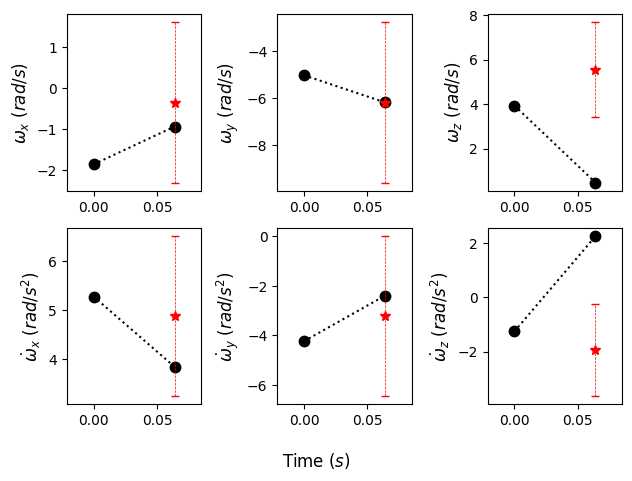

Current Batch Train Loss: 0.004683745093643665

Current Batch Train Loss: 0.004088909365236759

Current Batch Train Loss: 0.004102491773664951

Current Batch Train Loss: 0.006311311386525631

Current Batch Train Loss: 0.006474285386502743

Current Batch Train Loss: 0.0042688241228461266

Current Batch Train Loss: 0.003815317992120981

Current Batch Train Loss: 0.005944262258708477

Current Batch Train Loss: 0.003786931512877345

Current Batch Train Loss: 0.0065193185582757

Current Batch Train Loss: 0.003952534403651953

Current Batch Train Loss: 0.0038447026163339615

Current Batch Train Loss: 0.004694498144090176

Current Batch Train Loss: 0.004124220926314592

Current Batch Train Loss: 0.003937790635973215

Current Batch Train Loss: 0.003909078426659107

Current Batch Train Loss: 0.006143367383629084

Current Batch Train Loss: 0.003802140476182103

Current Batch Train Loss: 0.003855091752484441

Current Batch Train Loss: 0.004065168090164661

Current Batch Train Loss: 0.004755065310

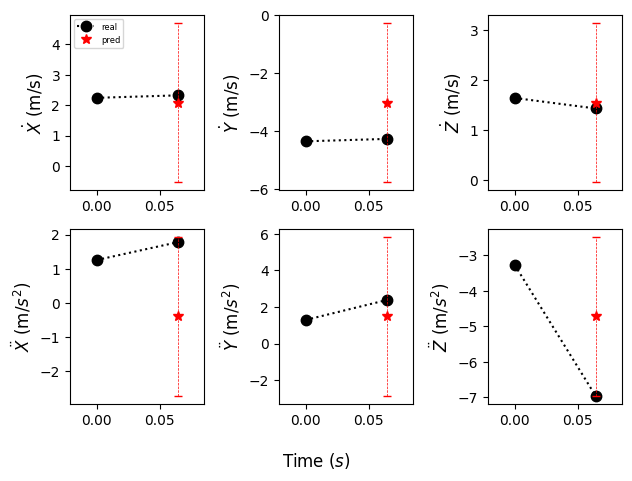

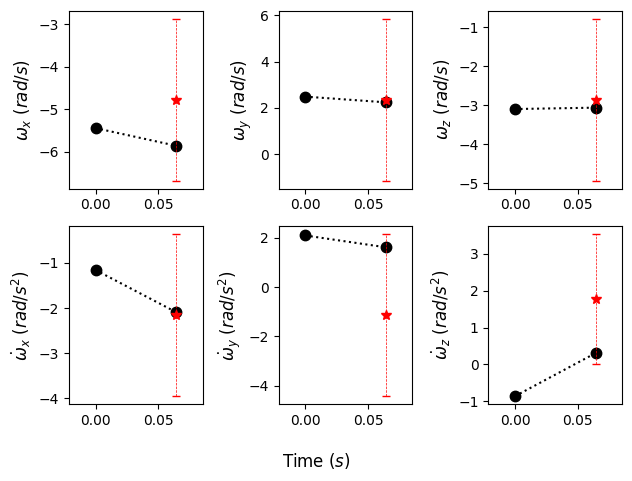

Current Batch Train Loss: 0.004115516319870949

Current Batch Train Loss: 0.005863092839717865

Current Batch Train Loss: 0.004909333772957325

Current Batch Train Loss: 0.00419559795409441

Current Batch Train Loss: 0.005929873324930668

Current Batch Train Loss: 0.007971668615937233

Current Batch Train Loss: 0.003809475339949131

Current Batch Train Loss: 0.004464200232177973

Current Batch Train Loss: 0.005111978389322758

Current Batch Train Loss: 0.004225548822432756

Current Batch Train Loss: 0.0037069269455969334

Current Batch Train Loss: 0.003804630134254694

Current Batch Train Loss: 0.005789036862552166

Current Batch Train Loss: 0.004559178836643696

Current Batch Train Loss: 0.003957510460168123

Current Batch Train Loss: 0.00569644570350647

Current Batch Train Loss: 0.003815870499238372

Current Batch Train Loss: 0.005806982051581144

Current Batch Train Loss: 0.004164901562035084

Current Batch Train Loss: 0.004006249830126762

Current Batch Train Loss: 0.0045321220532

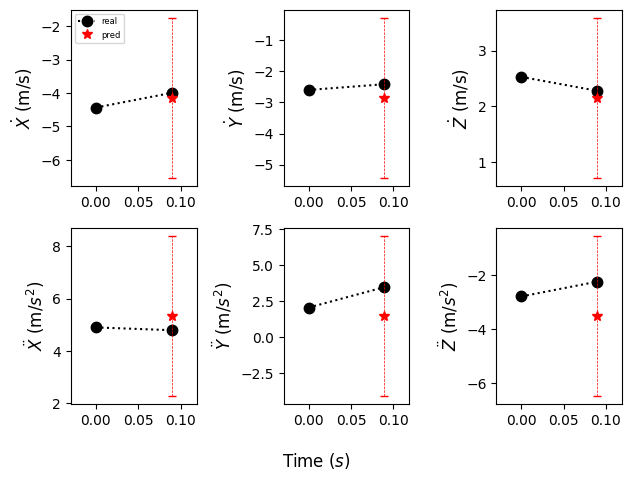

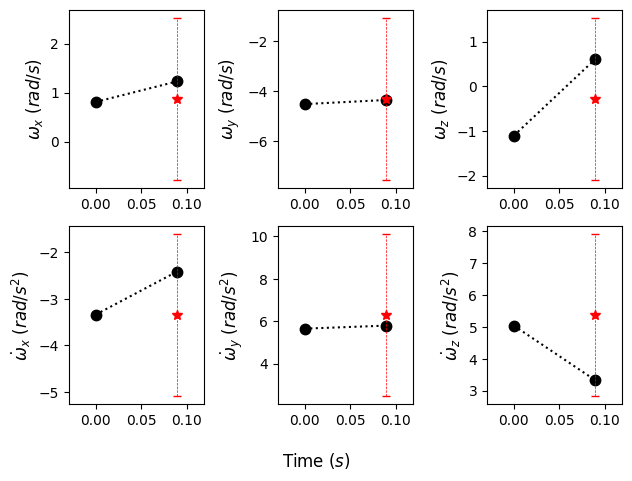

Current Batch Train Loss: 0.00606874842196703

Current Batch Train Loss: 0.004682452417910099

Current Batch Train Loss: 0.004948093555867672

Current Batch Train Loss: 0.0038816495798528194

Current Batch Train Loss: 0.005820224527269602

Current Batch Train Loss: 0.0037432201206684113

Current Batch Train Loss: 0.004512838087975979

Current Batch Train Loss: 0.003554744180291891

Current Batch Train Loss: 0.00452022161334753

Current Batch Train Loss: 0.0042902640998363495

Current Batch Train Loss: 0.004572860896587372

Current Batch Train Loss: 0.0039255754090845585

Current Batch Train Loss: 0.005216068122535944

Current Batch Train Loss: 0.0072934590280056

Current Batch Train Loss: 0.004697081167250872

Current Batch Train Loss: 0.0067689428105950356

Current Batch Train Loss: 0.004130539949983358

Current Batch Train Loss: 0.005400157067924738

Current Batch Train Loss: 0.0037971504498273134

Current Batch Train Loss: 0.006960001774132252

Current Batch Train Loss: 0.0040408265

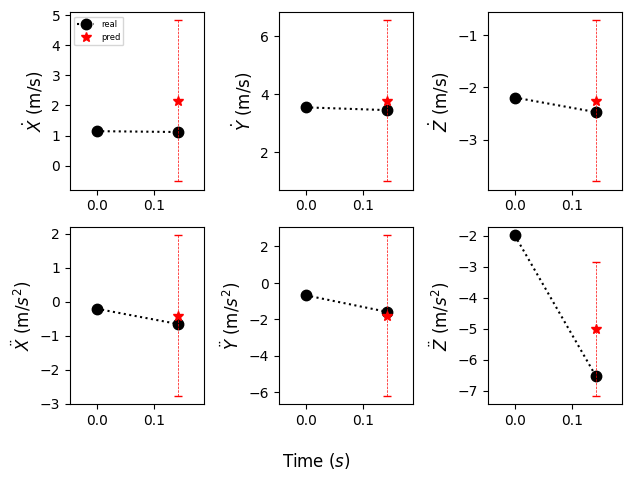

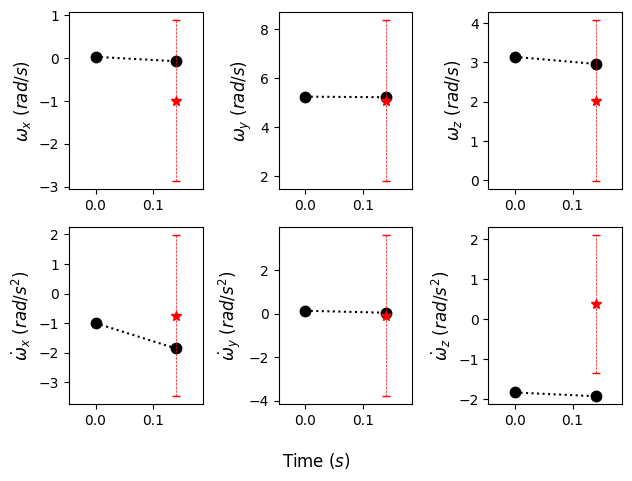

Current Batch Train Loss: 0.004977545700967312

Current Batch Train Loss: 0.0037805037572979927

Current Batch Train Loss: 0.0058008464984595776

Current Batch Train Loss: 0.004990900866687298

Current Batch Train Loss: 0.003637988120317459

Current Batch Train Loss: 0.004102637991309166

Current Batch Train Loss: 0.004304718226194382

Current Batch Train Loss: 0.005854413844645023

Current Batch Train Loss: 0.0053358254954218864

Current Batch Train Loss: 0.003931517247110605

Current Batch Train Loss: 0.0051509058102965355

Current Batch Train Loss: 0.003929884172976017

Current Batch Train Loss: 0.003906465135514736

Current Batch Train Loss: 0.004737649112939835

Current Batch Train Loss: 0.003978813532739878

Current Batch Train Loss: 0.0053323134779930115

Current Batch Train Loss: 0.004687288776040077

Current Batch Train Loss: 0.004815356340259314

Current Batch Train Loss: 0.004003569018095732

Current Batch Train Loss: 0.0038024617824703455

Current Batch Train Loss: 0.003686

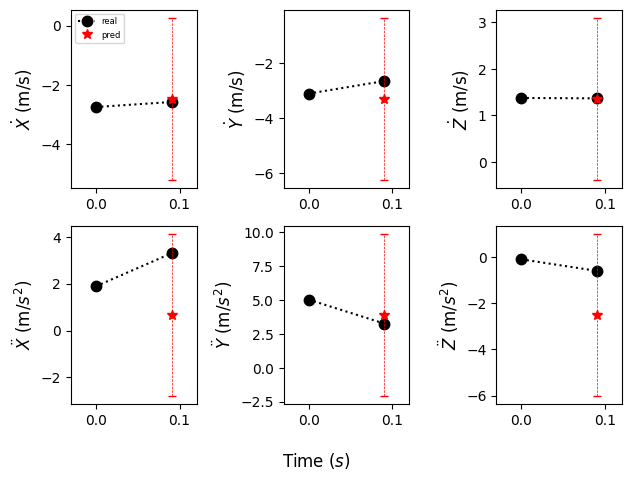

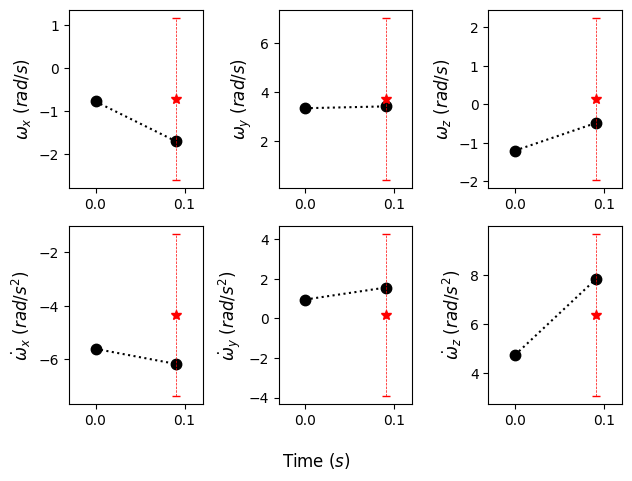

Current Batch Train Loss: 0.004326757974922657

Current Batch Train Loss: 0.00366078014485538

Current Batch Train Loss: 0.003959193360060453

Current Batch Train Loss: 0.00571106793358922

Current Batch Train Loss: 0.006361914332956076

Current Batch Train Loss: 0.004716835916042328

Current Batch Train Loss: 0.004953665193170309

Current Batch Train Loss: 0.004360521677881479

Current Batch Train Loss: 0.005070962011814117

Current Batch Train Loss: 0.004633012227714062

Current Batch Train Loss: 0.004548699129372835

Current Batch Train Loss: 0.006259525194764137

Current Batch Train Loss: 0.004966392181813717

Current Batch Train Loss: 0.004517735447734594

Current Batch Train Loss: 0.005454424303025007

Current Batch Train Loss: 0.004304657224565744

Current Batch Train Loss: 0.004212306812405586

Current Batch Train Loss: 0.00443367101252079

Current Batch Train Loss: 0.0038391901180148125

Current Batch Train Loss: 0.004319753497838974

Current Batch Train Loss: 0.00544958468526

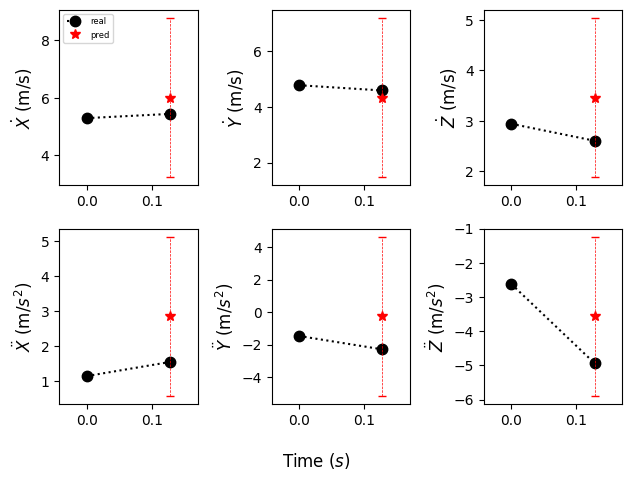

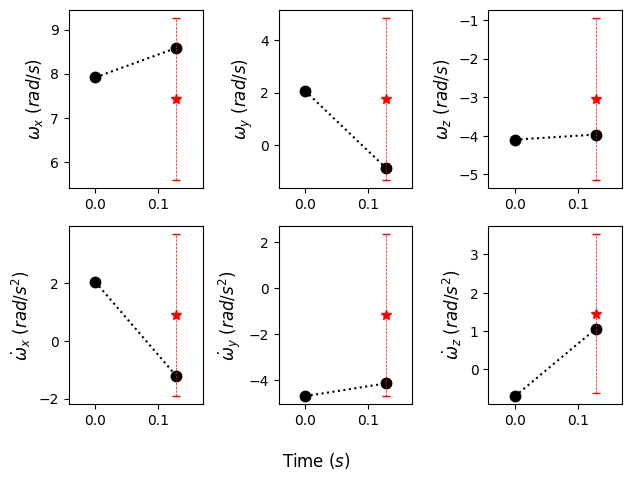

Current Batch Train Loss: 0.004178960807621479

Current Batch Train Loss: 0.004326079972088337

Current Batch Train Loss: 0.0068041193298995495

Current Batch Train Loss: 0.004000154323875904

Current Batch Train Loss: 0.004830647259950638

Current Batch Train Loss: 0.004260725807398558

Current Batch Train Loss: 0.005830447655171156

Current Batch Train Loss: 0.004326506517827511

Current Batch Train Loss: 0.007719320245087147

Current Batch Train Loss: 0.004327849019318819

Current Batch Train Loss: 0.0037643942050635815

Current Batch Train Loss: 0.004053372889757156

Current Batch Train Loss: 0.004618204198777676

Current Batch Train Loss: 0.004810318350791931

Current Batch Train Loss: 0.005788364913314581

Current Batch Train Loss: 0.004587839357554913

Current Batch Train Loss: 0.003963706083595753

Current Batch Train Loss: 0.004507733974605799

Current Batch Train Loss: 0.005762690212577581

Current Batch Train Loss: 0.006431075278669596

Current Batch Train Loss: 0.0045850216

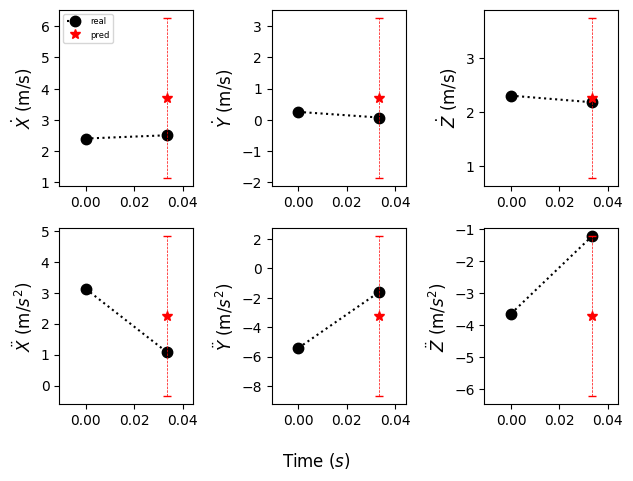

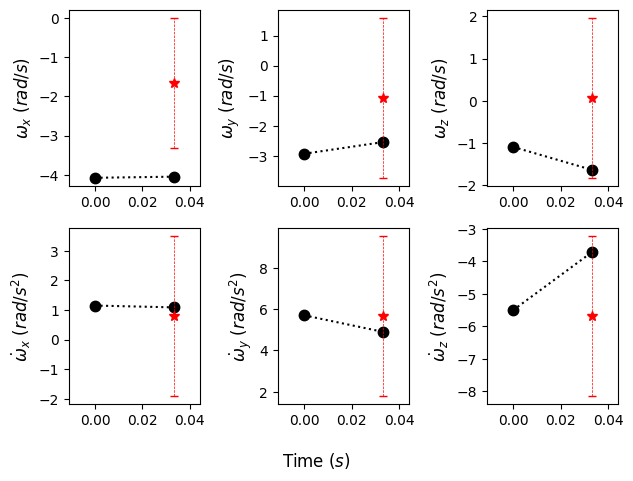

Current Batch Train Loss: 0.006933804601430893

Current Batch Train Loss: 0.004152379464358091

Current Batch Train Loss: 0.005425277166068554

Current Batch Train Loss: 0.0041600060649216175

Current Batch Train Loss: 0.005013507790863514

Current Batch Train Loss: 0.0064660231582820415

Current Batch Train Loss: 0.003969769924879074

Current Batch Train Loss: 0.004081403370946646

Current Batch Train Loss: 0.004851864650845528

Current Batch Train Loss: 0.0044641816057264805

Current Batch Train Loss: 0.004134696442633867

Current Batch Train Loss: 0.0036766324192285538

Current Batch Train Loss: 0.003991842269897461

Current Batch Train Loss: 0.006786700803786516

Current Batch Train Loss: 0.0037698824889957905

Current Batch Train Loss: 0.006114984396845102

Current Batch Train Loss: 0.004010769538581371

Current Batch Train Loss: 0.004062664695084095

Current Batch Train Loss: 0.005932852625846863

Current Batch Train Loss: 0.004346199333667755

Current Batch Train Loss: 0.0050403

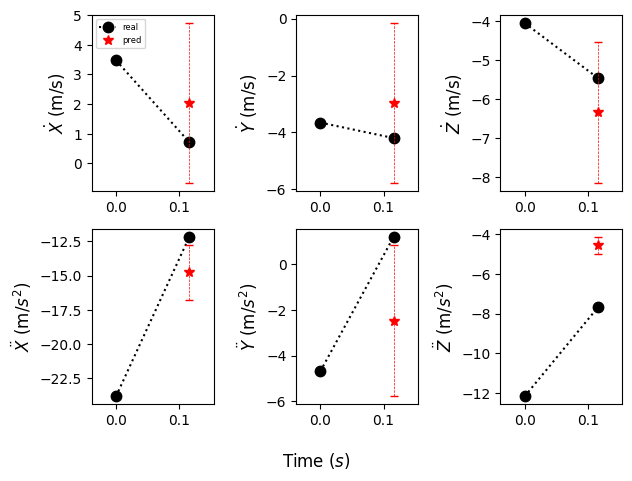

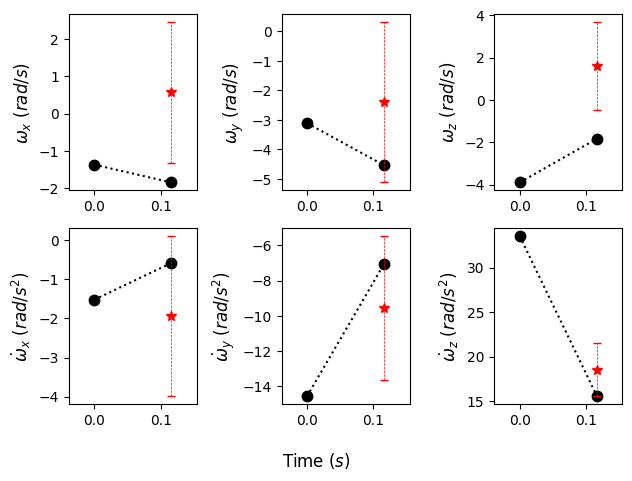

Current Batch Train Loss: 0.0037793524097651243

Current Batch Train Loss: 0.004718985874205828

Current Batch Train Loss: 0.005361372139304876

Current Batch Train Loss: 0.004304406698793173

Current Batch Train Loss: 0.005090748891234398

Current Batch Train Loss: 0.0035995852667838335

Current Batch Train Loss: 0.006040407344698906

Current Batch Train Loss: 0.004647877532988787

Current Batch Train Loss: 0.005566954147070646

Current Batch Train Loss: 0.004014334175735712

Current Batch Train Loss: 0.004416940733790398

Current Batch Train Loss: 0.0074379341676831245

Current Batch Train Loss: 0.003948378376662731

Current Batch Train Loss: 0.003797149984166026

Current Batch Train Loss: 0.004612897057086229

Current Batch Train Loss: 0.0038874351885169744

Current Batch Train Loss: 0.0059642791748046875

Current Batch Train Loss: 0.004572330042719841

Current Batch Train Loss: 0.004513398744165897

Current Batch Train Loss: 0.003942277282476425

Current Batch Train Loss: 0.0043731

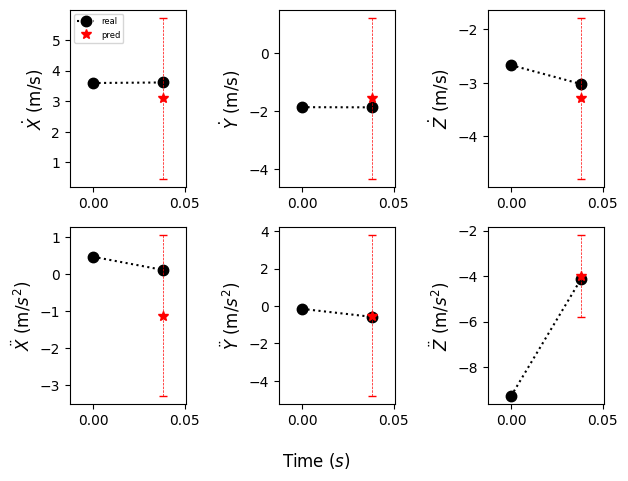

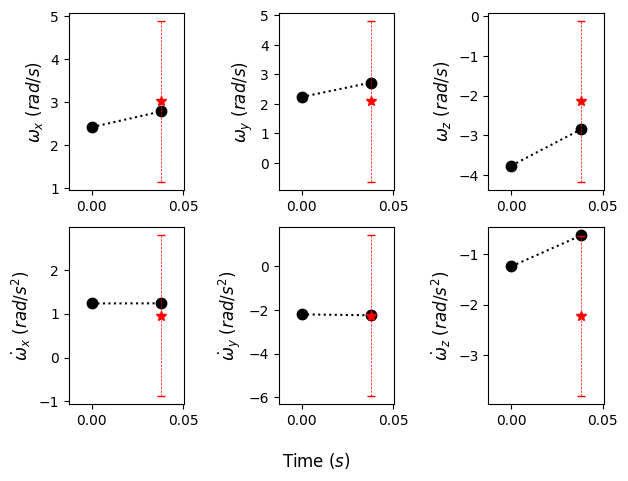

Current Batch Train Loss: 0.003641846589744091

Current Batch Train Loss: 0.005106630269438028

Current Batch Train Loss: 0.005671728868037462

Current Batch Train Loss: 0.005605193320661783

Current Batch Train Loss: 0.004604681394994259

Current Batch Train Loss: 0.005864420905709267

Current Batch Train Loss: 0.006496615707874298

Current Batch Train Loss: 0.004583836533129215

Current Batch Train Loss: 0.0038543608970940113

Current Batch Train Loss: 0.006614130921661854

Current Batch Train Loss: 0.006012427154928446

Current Batch Train Loss: 0.004209366627037525

Current Batch Train Loss: 0.005587136838585138

Current Batch Train Loss: 0.0040235077030956745

Current Batch Train Loss: 0.0035453797318041325

Current Batch Train Loss: 0.004660380072891712

Current Batch Train Loss: 0.0038460080977529287

Current Batch Train Loss: 0.006793892942368984

Current Batch Train Loss: 0.0037290179170668125

Current Batch Train Loss: 0.00428782869130373

Current Batch Train Loss: 0.00372028

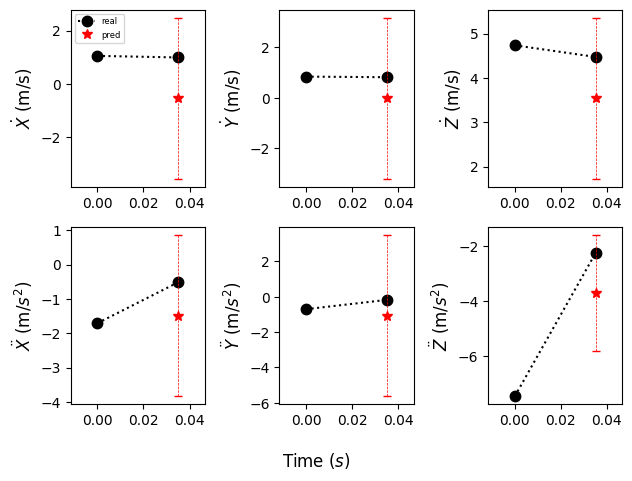

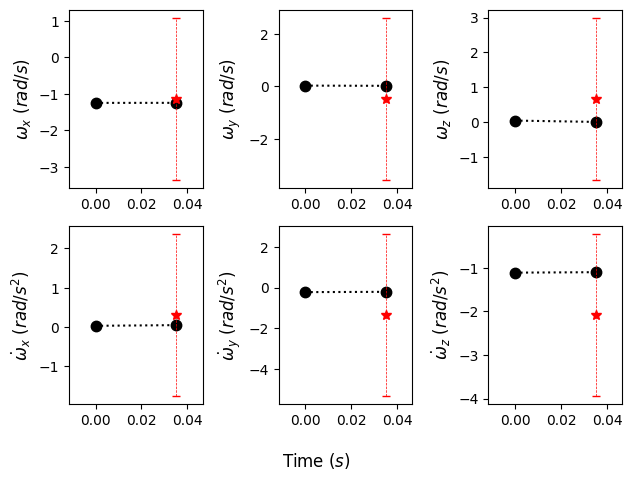

Current Batch Train Loss: 0.004738539457321167

Current Batch Train Loss: 0.0038261525332927704

Current Batch Train Loss: 0.004760522395372391

Current Batch Train Loss: 0.004787460435181856

Current Batch Train Loss: 0.004877946339547634

Current Batch Train Loss: 0.005102349910885096

Current Batch Train Loss: 0.003802386811003089

Current Batch Train Loss: 0.0068005891516804695

Current Batch Train Loss: 0.005135056097060442

Current Batch Train Loss: 0.003816143609583378

Current Batch Train Loss: 0.004326226189732552

Current Batch Train Loss: 0.004349193535745144

Current Batch Train Loss: 0.004141045268625021

Current Batch Train Loss: 0.007617392111569643

Current Batch Train Loss: 0.003953433595597744

Current Batch Train Loss: 0.004684013314545155

Current Batch Train Loss: 0.003998264670372009

Current Batch Train Loss: 0.0037615394685417414

Current Batch Train Loss: 0.004370050970464945

Current Batch Train Loss: 0.004403863102197647

Current Batch Train Loss: 0.005402518

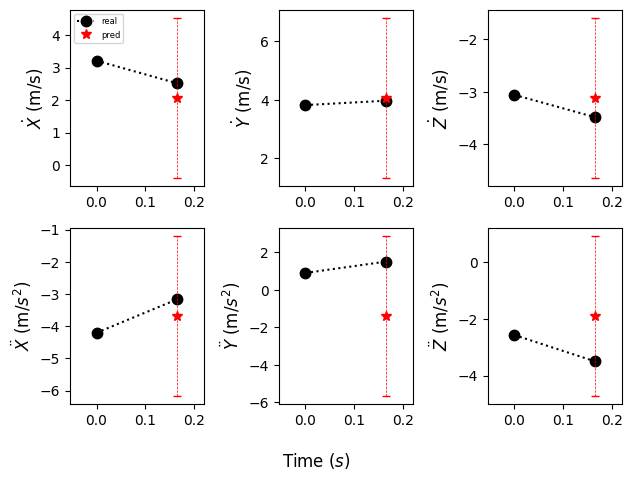

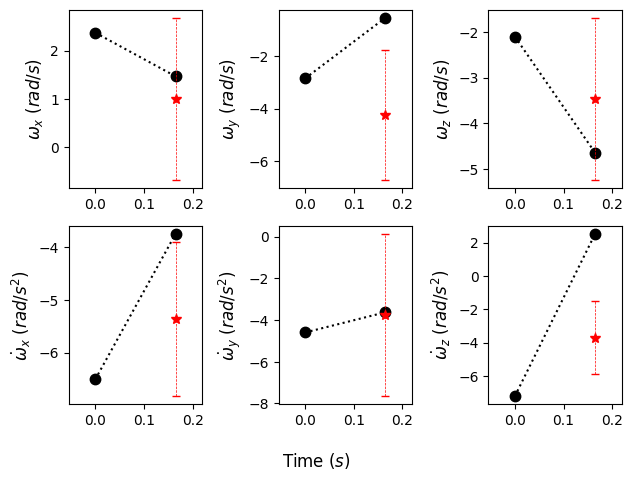

Current Batch Train Loss: 0.0038386089727282524

Current Batch Train Loss: 0.004925692919641733

Current Batch Train Loss: 0.004155975300818682

Current Batch Train Loss: 0.003738041967153549

Current Batch Train Loss: 0.004695062525570393

Current Batch Train Loss: 0.0037728766910731792

Current Batch Train Loss: 0.003750405739992857

Current Batch Train Loss: 0.005397278815507889

Current Batch Train Loss: 0.004923731088638306

Current Batch Train Loss: 0.0054996442049741745

Current Batch Train Loss: 0.004290909506380558

Current Batch Train Loss: 0.0036145150661468506

Current Batch Train Loss: 0.004744714591652155

Current Batch Train Loss: 0.00537083949893713

Current Batch Train Loss: 0.004987489432096481

Current Batch Train Loss: 0.0053544193506240845

Current Batch Train Loss: 0.003626373363658786

Current Batch Train Loss: 0.003674038453027606

Current Batch Train Loss: 0.0040867202915251255

Current Batch Train Loss: 0.005294198170304298

Current Batch Train Loss: 0.0046522

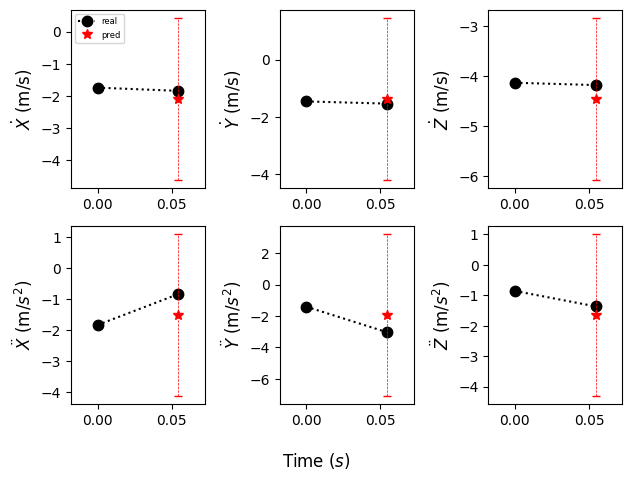

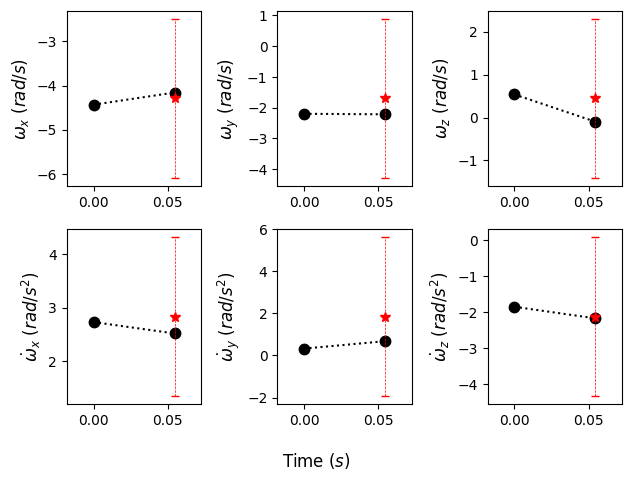

Current Batch Train Loss: 0.007187501527369022

Current Batch Train Loss: 0.004624912049621344

Current Batch Train Loss: 0.004613182041794062

Current Batch Train Loss: 0.005002021323889494

Current Batch Train Loss: 0.0038252524100244045

Current Batch Train Loss: 0.006057152524590492

Current Batch Train Loss: 0.0044468906708061695

Current Batch Train Loss: 0.0049722809344530106

Current Batch Train Loss: 0.003692419733852148

Current Batch Train Loss: 0.006013772916048765

Current Batch Train Loss: 0.003989622462540865

Current Batch Train Loss: 0.005228414665907621

Current Batch Train Loss: 0.0038654175586998463

Current Batch Train Loss: 0.0038858286570757627

Current Batch Train Loss: 0.005292464047670364

Current Batch Train Loss: 0.005506413523107767

Current Batch Train Loss: 0.005764416418969631

Current Batch Train Loss: 0.005460408050566912

Current Batch Train Loss: 0.005023030564188957

Current Batch Train Loss: 0.00424271309748292

Current Batch Train Loss: 0.00369927

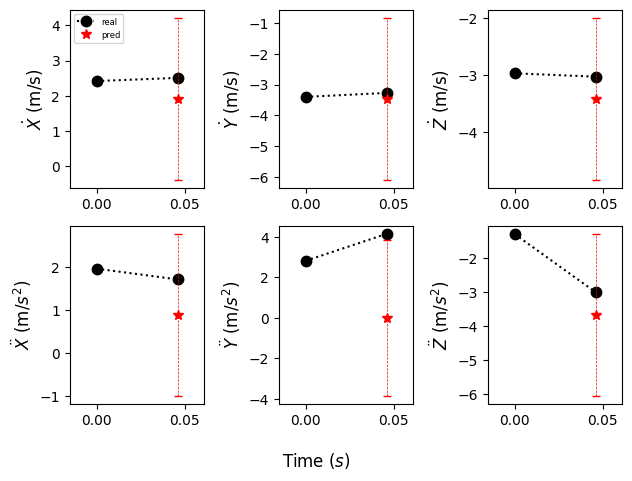

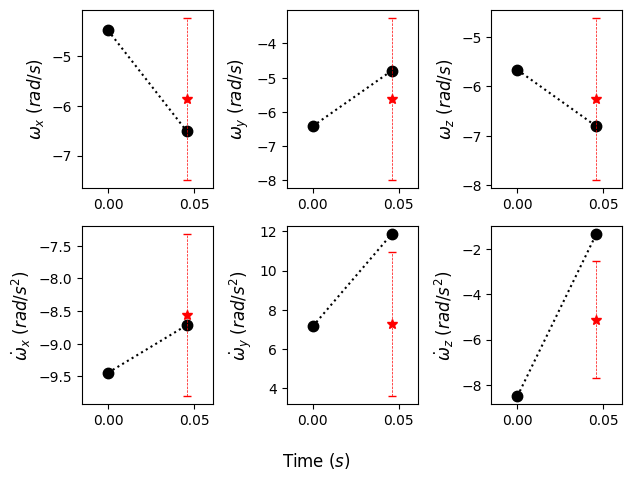

Current Batch Train Loss: 0.005156818311661482

Current Batch Train Loss: 0.005059404298663139

Current Batch Train Loss: 0.004250730853527784

Current Batch Train Loss: 0.003737199353054166

Current Batch Train Loss: 0.004491439089179039

Current Batch Train Loss: 0.005170101765543222

Current Batch Train Loss: 0.0038957051001489162

Current Batch Train Loss: 0.004760080482810736

Current Batch Train Loss: 0.004284058231860399

Current Batch Train Loss: 0.004781174473464489

Current Batch Train Loss: 0.0037852053064852953

Current Batch Train Loss: 0.004159385338425636

Current Batch Train Loss: 0.004015594720840454

Current Batch Train Loss: 0.00398953165858984

Current Batch Train Loss: 0.003762402106076479

Current Batch Train Loss: 0.004334079567342997

Current Batch Train Loss: 0.003948277328163385

Current Batch Train Loss: 0.00373788527213037

Current Batch Train Loss: 0.004930602852255106

Current Batch Train Loss: 0.004128578118979931

Current Batch Train Loss: 0.003905561752

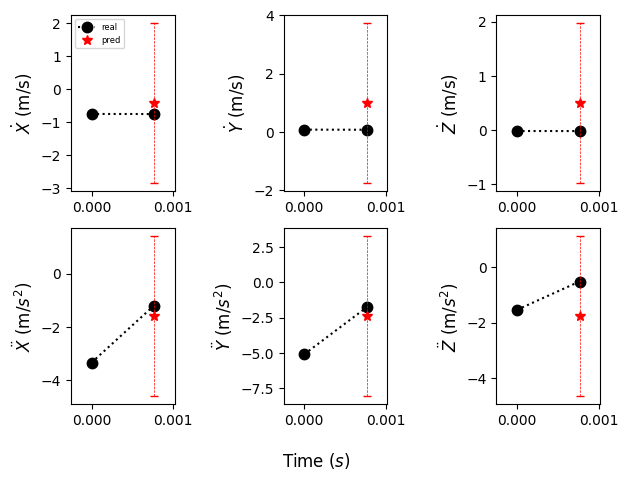

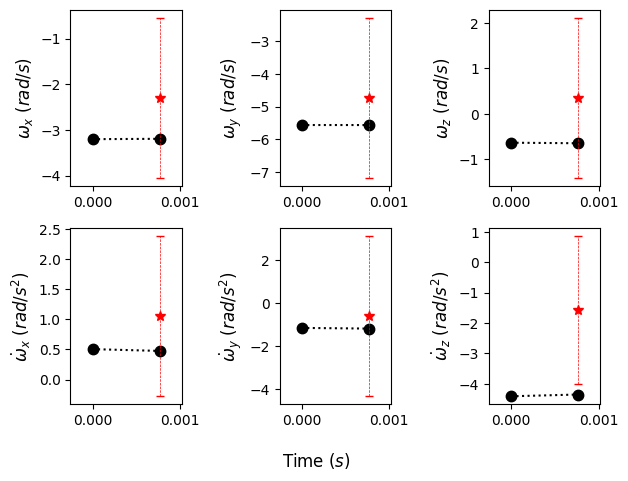

Current Batch Train Loss: 0.003953015431761742

Current Batch Train Loss: 0.003883742494508624

Current Batch Train Loss: 0.005562387872487307

Current Batch Train Loss: 0.0039583309553563595

Current Batch Train Loss: 0.0041148606687784195

Current Batch Train Loss: 0.005357382353395224

Current Batch Train Loss: 0.004562520422041416

Current Batch Train Loss: 0.0036903307773172855

Current Batch Train Loss: 0.004304416012018919

Current Batch Train Loss: 0.005115645006299019

Current Batch Train Loss: 0.004886973183602095

Current Batch Train Loss: 0.006860199850052595

Current Batch Train Loss: 0.007888823747634888

Current Batch Train Loss: 0.005412444472312927

Current Batch Train Loss: 0.004500972107052803

Current Batch Train Loss: 0.006058130878955126

Current Batch Train Loss: 0.004309223964810371

Current Batch Train Loss: 0.004471412394195795

Current Batch Train Loss: 0.004236682318150997

Current Batch Train Loss: 0.0045160274021327496

Current Batch Train Loss: 0.00389873

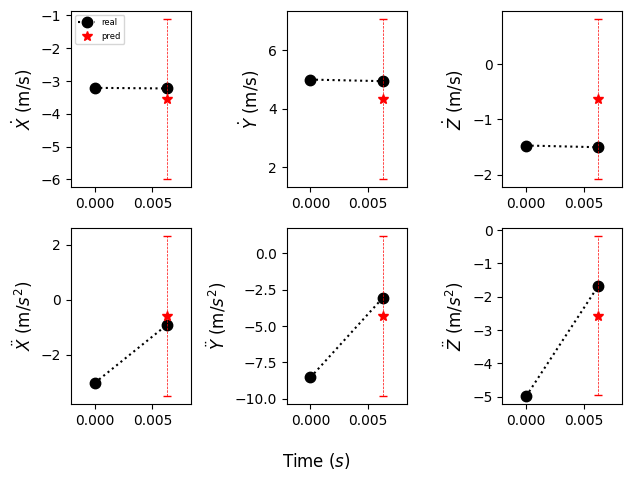

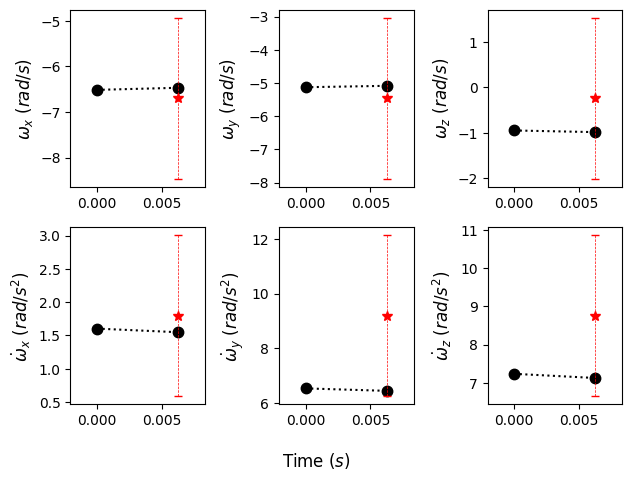

Current Batch Train Loss: 0.0056791044771671295

Current Batch Train Loss: 0.004839285276830196

Current Batch Train Loss: 0.004429849795997143

Current Batch Train Loss: 0.005334040615707636

Current Batch Train Loss: 0.0038643679581582546

Current Batch Train Loss: 0.004777600057423115

Current Batch Train Loss: 0.0037831536028534174

Current Batch Train Loss: 0.005378594622015953

Current Batch Train Loss: 0.004219038411974907

Current Batch Train Loss: 0.0037420347798615694

Current Batch Train Loss: 0.003893650835379958

Current Batch Train Loss: 0.005382308270782232

Current Batch Train Loss: 0.004889905918389559

Current Batch Train Loss: 0.007315328810364008

Current Batch Train Loss: 0.0037992962170392275

Current Batch Train Loss: 0.0047855437733232975

Current Batch Train Loss: 0.004426310770213604

Current Batch Train Loss: 0.004540335386991501

Current Batch Train Loss: 0.005137327592819929

Current Batch Train Loss: 0.005026970990002155

Current Batch Train Loss: 0.006108

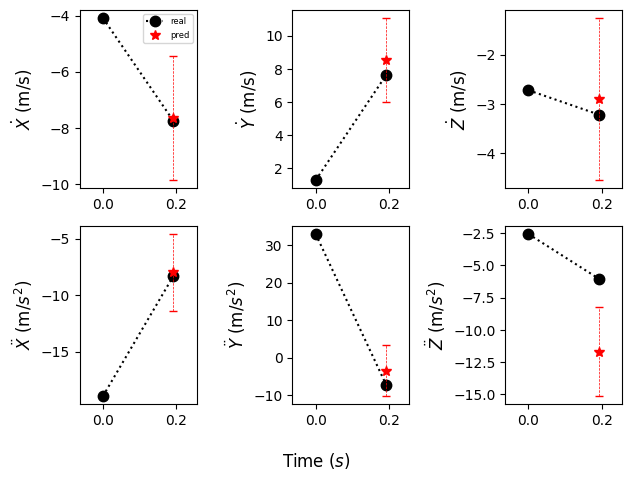

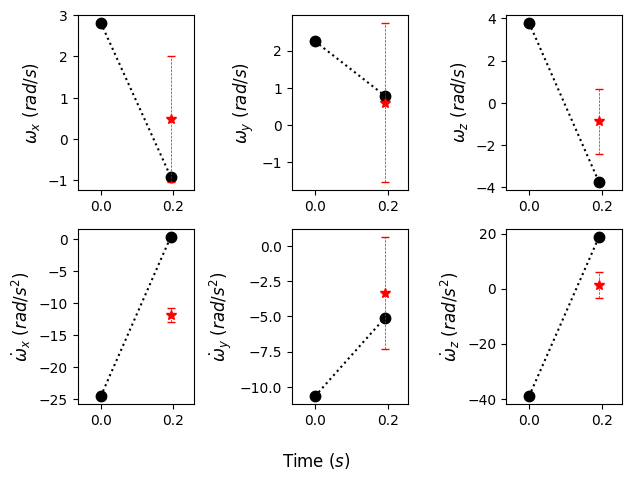

Current Batch Train Loss: 0.00401045149192214

Current Batch Train Loss: 0.004142387770116329

Current Batch Train Loss: 0.004500458016991615

Current Batch Train Loss: 0.003889246843755245

Current Batch Train Loss: 0.0035568391904234886

Current Batch Train Loss: 0.004316051956266165

Current Batch Train Loss: 0.004508780315518379

Current Batch Train Loss: 0.004018607083708048

Current Batch Train Loss: 0.004586310591548681

Current Batch Train Loss: 0.004288920201361179

Current Batch Train Loss: 0.006255030166357756

Current Batch Train Loss: 0.00468601705506444

Current Batch Train Loss: 0.003907355945557356

Current Batch Train Loss: 0.004769857041537762

Current Batch Train Loss: 0.0037196255289018154

Current Batch Train Loss: 0.00664515933021903

Current Batch Train Loss: 0.00417683832347393

Current Batch Train Loss: 0.004793884232640266

Current Batch Train Loss: 0.004485889337956905

Current Batch Train Loss: 0.004115622490644455

Current Batch Train Loss: 0.00618745852261

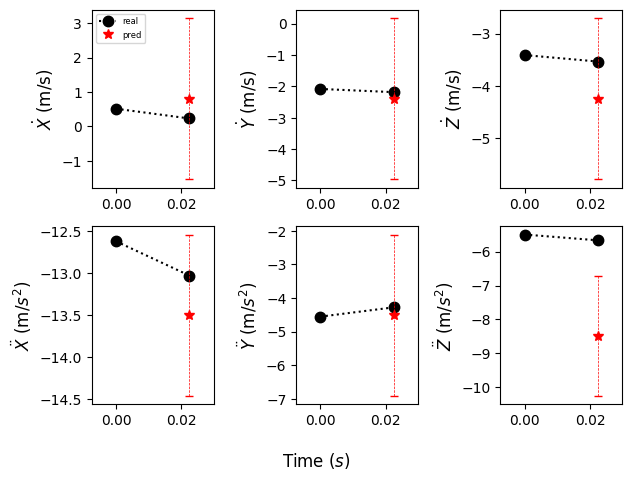

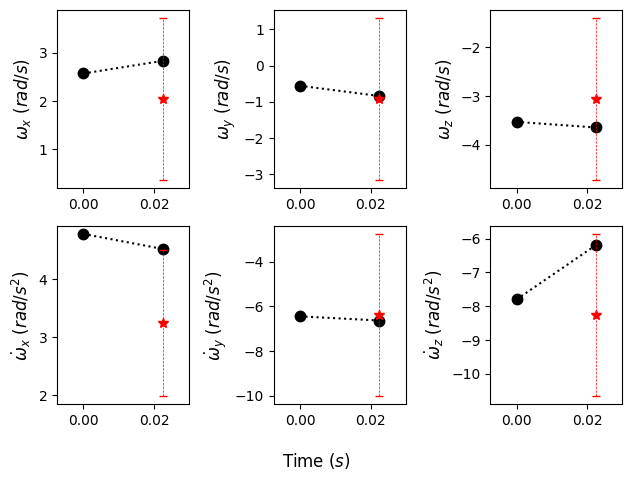

Current Batch Train Loss: 0.004500327631831169

Current Batch Train Loss: 0.0068923914805054665

Current Batch Train Loss: 0.0041428012773394585

Current Batch Train Loss: 0.005080456845462322

Current Batch Train Loss: 0.0059254467487335205

Current Batch Train Loss: 0.0036250294651836157

Current Batch Train Loss: 0.005171559751033783

Current Batch Train Loss: 0.0038130925968289375

Current Batch Train Loss: 0.006303426343947649

Current Batch Train Loss: 0.0045103756710886955

Current Batch Train Loss: 0.004708204884082079

Current Batch Train Loss: 0.0037179149221628904

Current Batch Train Loss: 0.006527209188789129

Current Batch Train Loss: 0.0038227217737585306

Current Batch Train Loss: 0.004134745337069035

Current Batch Train Loss: 0.004467745777219534

Current Batch Train Loss: 0.0037819831632077694

Current Batch Train Loss: 0.0056153046898543835

Current Batch Train Loss: 0.004062336403876543

Current Batch Train Loss: 0.004438320640474558

Current Batch Train Loss: 0.00

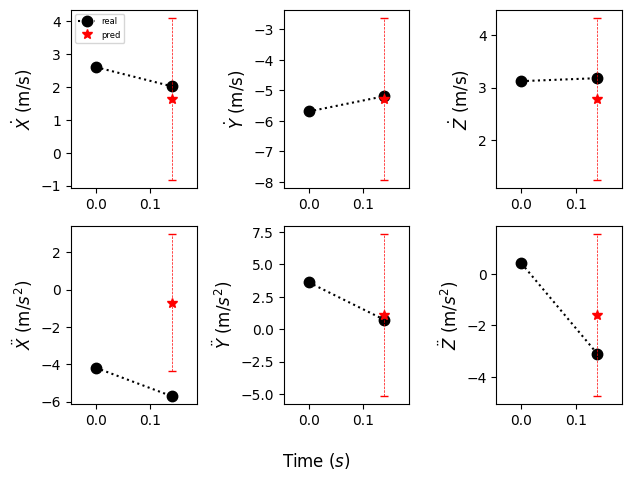

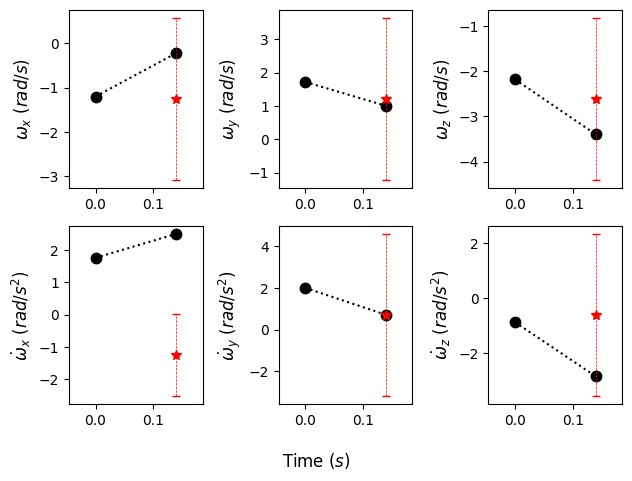

Current Batch Train Loss: 0.003991947043687105

Current Batch Train Loss: 0.003783326828852296

Current Batch Train Loss: 0.004796452354639769

Current Batch Train Loss: 0.0038212633226066828

Current Batch Train Loss: 0.003605177626013756

Current Batch Train Loss: 0.004301805514842272

Current Batch Train Loss: 0.006051891483366489

Current Batch Train Loss: 0.003946628421545029

Current Batch Train Loss: 0.0037989700213074684

Current Batch Train Loss: 0.004231882281601429

Current Batch Train Loss: 0.0038723391480743885

Current Batch Train Loss: 0.0045343185774981976

Current Batch Train Loss: 0.00552431819960475

Current Batch Train Loss: 0.004946806468069553

Current Batch Train Loss: 0.004949057009071112

Current Batch Train Loss: 0.004321102052927017

Current Batch Train Loss: 0.0038947181310504675

Current Batch Train Loss: 0.00557286012917757

Current Batch Train Loss: 0.004307974129915237

Current Batch Train Loss: 0.005889746826142073

Current Batch Train Loss: 0.003931347

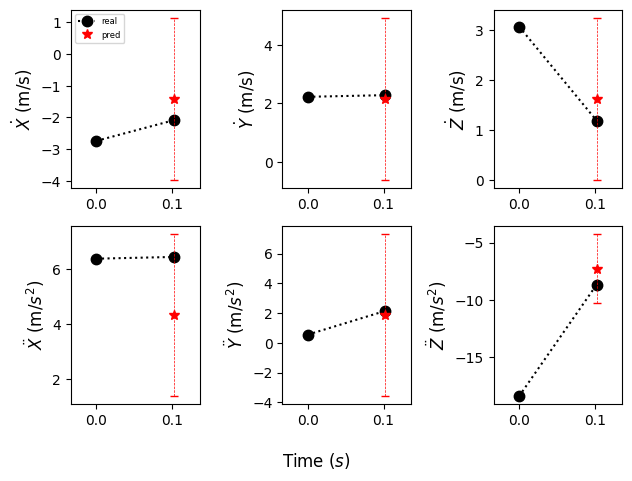

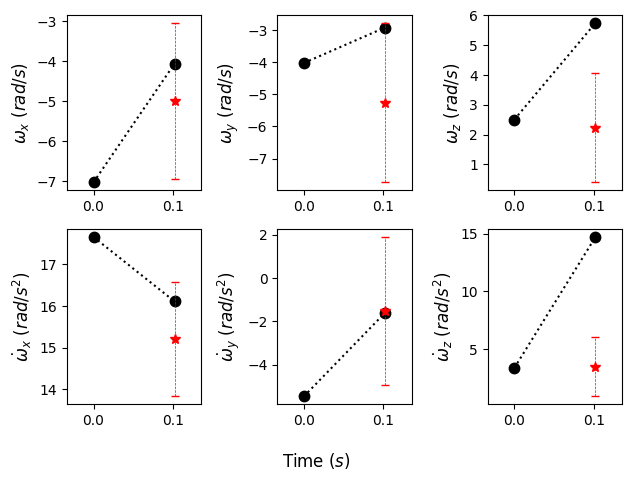

Current Batch Train Loss: 0.005752279423177242

Current Batch Train Loss: 0.004073450341820717

Current Batch Train Loss: 0.0039458610117435455

Current Batch Train Loss: 0.004175928421318531

Current Batch Train Loss: 0.00436158524826169

Current Batch Train Loss: 0.004080151207745075

Current Batch Train Loss: 0.004859683103859425

Current Batch Train Loss: 0.005504630506038666

Current Batch Train Loss: 0.004521031863987446

Current Batch Train Loss: 0.007754444144666195

Current Batch Train Loss: 0.0038469857536256313

Current Batch Train Loss: 0.00377068598754704

Current Batch Train Loss: 0.0039124684408307076

Current Batch Train Loss: 0.004713642410933971

Current Batch Train Loss: 0.006658809259533882

Current Batch Train Loss: 0.0052882409654557705

Current Batch Train Loss: 0.005019872449338436

Current Batch Train Loss: 0.003847558284178376

Current Batch Train Loss: 0.0054717473685741425

Current Batch Train Loss: 0.004232794977724552

Current Batch Train Loss: 0.003756700

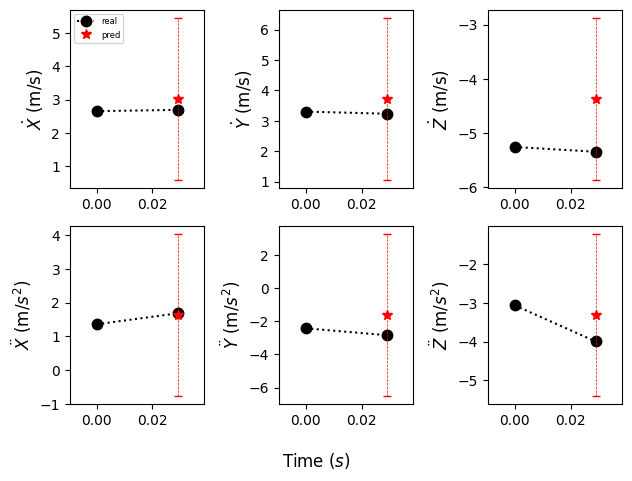

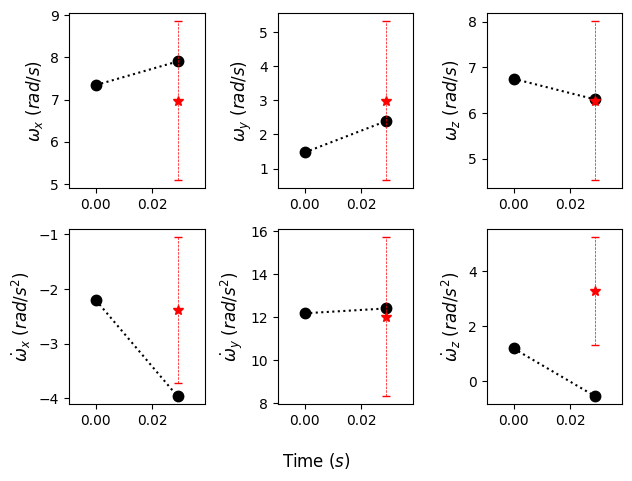

Current Batch Train Loss: 0.0063764858059585094

Current Batch Train Loss: 0.0036342605017125607

Current Batch Train Loss: 0.0068702963180840015

Current Batch Train Loss: 0.004513586405664682

Current Batch Train Loss: 0.0039551095105707645

Current Batch Train Loss: 0.0037651003804057837

Current Batch Train Loss: 0.004040384665131569

Current Batch Train Loss: 0.004525131080299616

Current Batch Train Loss: 0.004493375774472952

Current Batch Train Loss: 0.003922669216990471

Current Batch Train Loss: 0.006403100211173296

Current Batch Train Loss: 0.0037786168977618217

Current Batch Train Loss: 0.004723637364804745

Current Batch Train Loss: 0.004781464580446482

Current Batch Train Loss: 0.003911570645868778

Current Batch Train Loss: 0.004021717235445976

Current Batch Train Loss: 0.004630724899470806

Current Batch Train Loss: 0.005644381046295166

Current Batch Train Loss: 0.004294674843549728

Current Batch Train Loss: 0.005963495466858149

Current Batch Train Loss: 0.004038

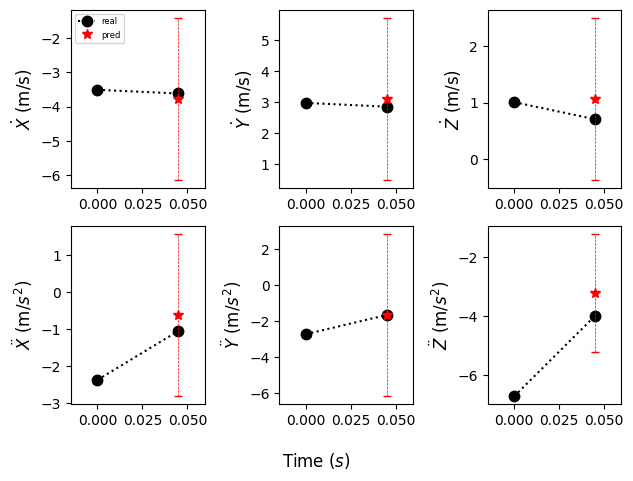

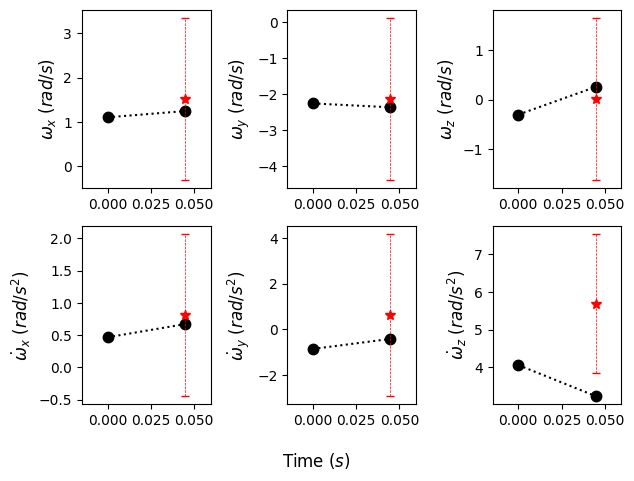

Current Batch Train Loss: 0.004657266195863485

Current Batch Train Loss: 0.0040436796844005585

Current Batch Train Loss: 0.0036446263547986746

Current Batch Train Loss: 0.003880554810166359

Current Batch Train Loss: 0.005493423901498318

Current Batch Train Loss: 0.00433323672041297

Current Batch Train Loss: 0.005079286172986031

Current Batch Train Loss: 0.006072595715522766

Current Batch Train Loss: 0.0042377980425953865

Current Batch Train Loss: 0.005964513868093491

Current Batch Train Loss: 0.003579433774575591

Current Batch Train Loss: 0.003634708933532238

Current Batch Train Loss: 0.004413898568600416

Current Batch Train Loss: 0.003962345886975527

Current Batch Train Loss: 0.004073501564562321

Current Batch Train Loss: 0.004944665357470512

Current Batch Train Loss: 0.004215325228869915

Current Batch Train Loss: 0.004152609501034021

Current Batch Train Loss: 0.004875976592302322

Current Batch Train Loss: 0.0057270401157438755

Current Batch Train Loss: 0.005093302

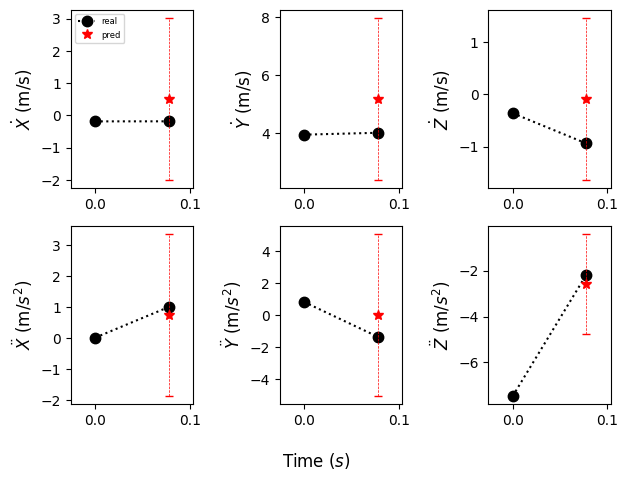

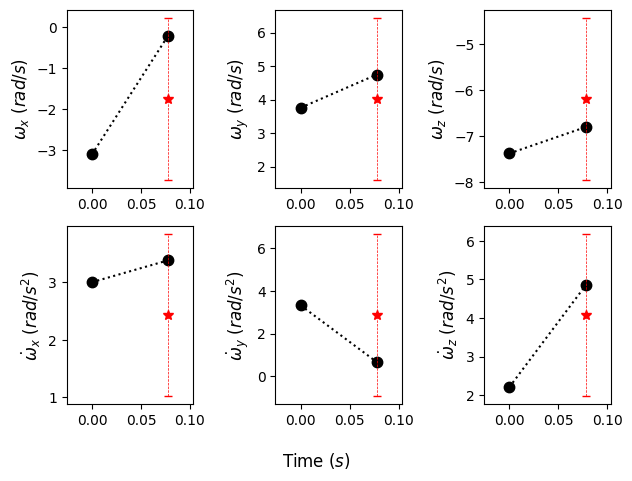

Current Batch Train Loss: 0.004051112569868565

Current Batch Train Loss: 0.00372522440738976

Current Batch Train Loss: 0.003731893841177225

Current Batch Train Loss: 0.005946826655417681

Current Batch Train Loss: 0.004144974518567324

Current Batch Train Loss: 0.00676006032153964

Current Batch Train Loss: 0.004033106844872236

Current Batch Train Loss: 0.006774503737688065

Current Batch Train Loss: 0.006723023019731045

Current Batch Train Loss: 0.008091841824352741

Current Batch Train Loss: 0.003846709616482258

Current Batch Train Loss: 0.004422985017299652

Current Batch Train Loss: 0.005177678540349007

Current Batch Train Loss: 0.005341458134353161

Current Batch Train Loss: 0.005297800526022911

Current Batch Train Loss: 0.004048732575029135

Current Batch Train Loss: 0.005915334448218346

Current Batch Train Loss: 0.005302005913108587

Current Batch Train Loss: 0.005185268819332123

Current Batch Train Loss: 0.003879690309986472

Current Batch Train Loss: 0.00427964329719

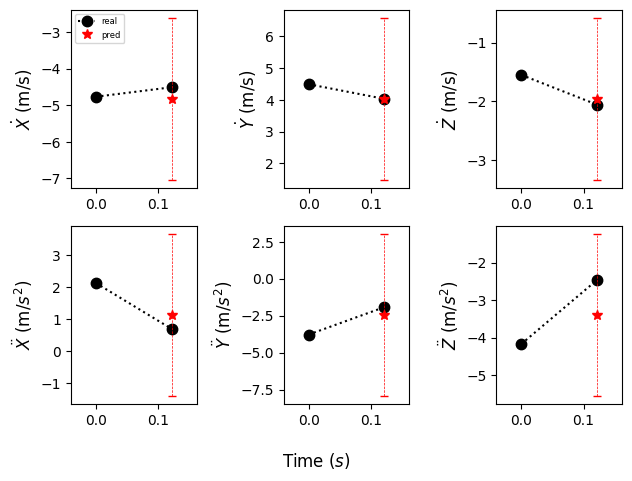

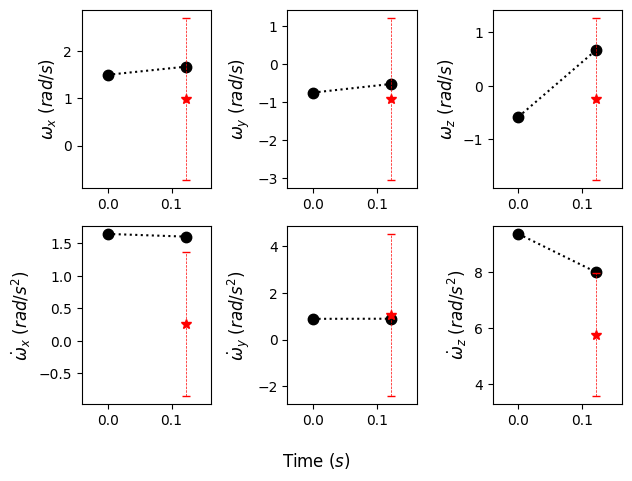

Current Batch Train Loss: 0.004762096796184778

Current Batch Train Loss: 0.004116712138056755

Current Batch Train Loss: 0.005576969124376774

Current Batch Train Loss: 0.005937305744737387

Current Batch Train Loss: 0.004642902873456478

Current Batch Train Loss: 0.004454471170902252

Current Batch Train Loss: 0.008838918060064316

Current Batch Train Loss: 0.0055760773830115795

Current Batch Train Loss: 0.005129912868142128

Current Batch Train Loss: 0.00448819762095809

Current Batch Train Loss: 0.006698470562696457

Current Batch Train Loss: 0.004320422653108835

Current Batch Train Loss: 0.005701560061424971

Current Batch Train Loss: 0.005653754808008671

Current Batch Train Loss: 0.0037762708961963654

Current Batch Train Loss: 0.004326260183006525

Current Batch Train Loss: 0.0038994234055280685

Current Batch Train Loss: 0.005572277586907148

Current Batch Train Loss: 0.004600990563631058

Current Batch Train Loss: 0.0042855143547058105

Current Batch Train Loss: 0.004304003

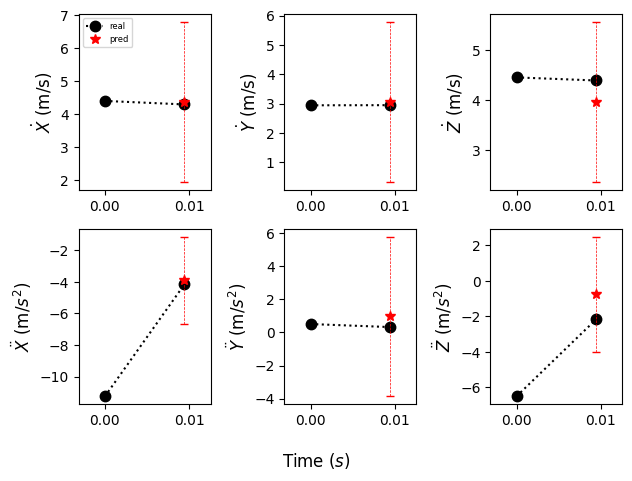

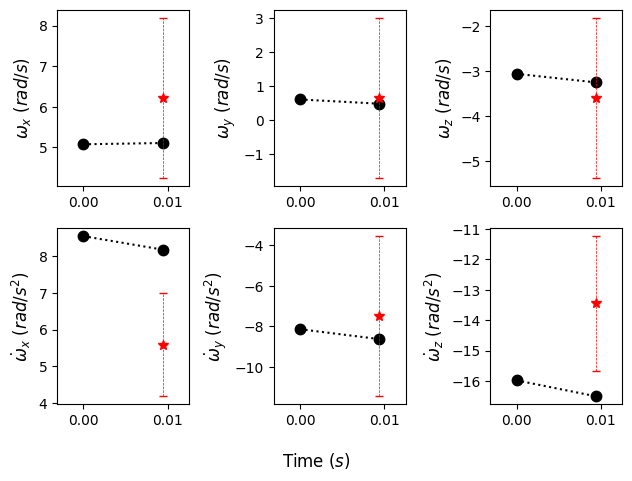

Current Batch Train Loss: 0.005157127045094967

Current Batch Train Loss: 0.006203308701515198

Current Batch Train Loss: 0.0037549289409071207

Current Batch Train Loss: 0.0049544284120202065

Current Batch Train Loss: 0.0036887305323034525

Current Batch Train Loss: 0.004556383937597275

Current Batch Train Loss: 0.004862861707806587

Current Batch Train Loss: 0.0049735005013644695

Current Batch Train Loss: 0.005232638213783503

Current Batch Train Loss: 0.0047900499776005745

Current Batch Train Loss: 0.004051859490573406

Current Batch Train Loss: 0.004286559298634529

Current Batch Train Loss: 0.0037701560650020838

Current Batch Train Loss: 0.004586454015225172

Current Batch Train Loss: 0.0036614900454878807

Current Batch Train Loss: 0.007677342742681503

Current Batch Train Loss: 0.0057991077192127705

Current Batch Train Loss: 0.006919922772794962

Current Batch Train Loss: 0.005064389202743769

Current Batch Train Loss: 0.003911655396223068

Current Batch Train Loss: 0.0039

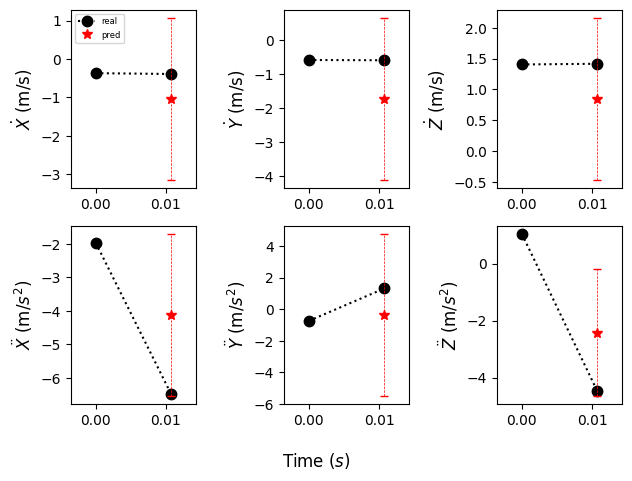

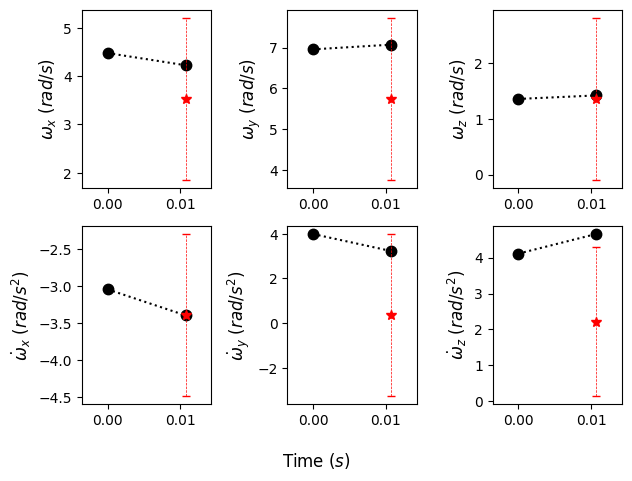

Current Batch Train Loss: 0.004639553837478161

Current Batch Train Loss: 0.005590562708675861

Current Batch Train Loss: 0.0041887699626386166

Current Batch Train Loss: 0.004084757994860411

Current Batch Train Loss: 0.003794316202402115

Current Batch Train Loss: 0.004354021046310663

Current Batch Train Loss: 0.0058416761457920074

Current Batch Train Loss: 0.0036769546568393707

Current Batch Train Loss: 0.004331432748585939

Current Batch Train Loss: 0.0045879194512963295

Current Batch Train Loss: 0.004638690035790205

Current Batch Train Loss: 0.003786517074331641

Current Batch Train Loss: 0.005725371651351452

Current Batch Train Loss: 0.005942529067397118

Current Batch Train Loss: 0.004875309765338898

Current Batch Train Loss: 0.006397590972483158

Current Batch Train Loss: 0.005403557326644659

Current Batch Train Loss: 0.0037654319312423468

Current Batch Train Loss: 0.00526162376627326

Current Batch Train Loss: 0.003743298351764679

Current Batch Train Loss: 0.00373017

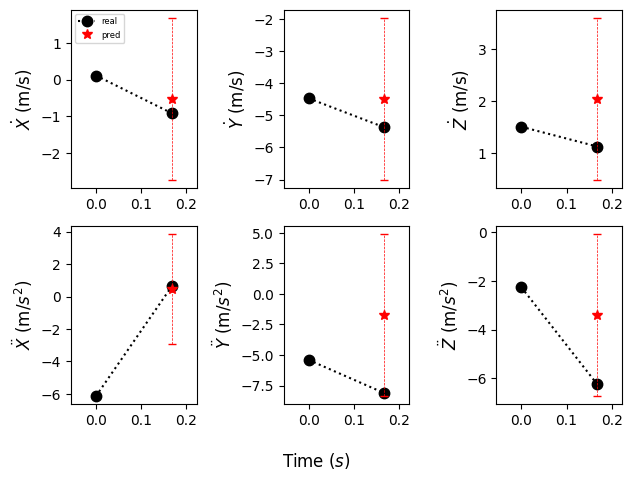

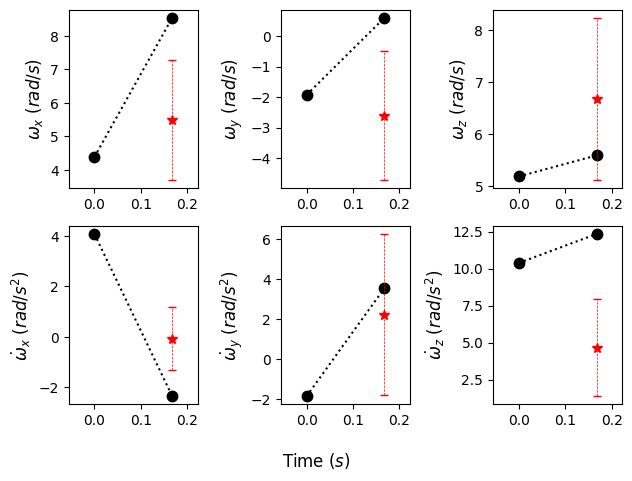

Current Batch Train Loss: 0.0077057816088199615

Current Batch Train Loss: 0.005683758296072483

Current Batch Train Loss: 0.005342242773622274

Current Batch Train Loss: 0.005071347579360008

Current Batch Train Loss: 0.00495008984580636

Current Batch Train Loss: 0.004165254533290863

Current Batch Train Loss: 0.006004827097058296

Current Batch Train Loss: 0.003627723315730691

Current Batch Train Loss: 0.003873030189424753

Current Batch Train Loss: 0.005046484060585499

Current Batch Train Loss: 0.003685470437631011

Current Batch Train Loss: 0.006483601406216621

Current Batch Train Loss: 0.004118278622627258

Current Batch Train Loss: 0.0039776093326509

Current Batch Train Loss: 0.00514794560149312

Current Batch Train Loss: 0.004437568131834269

Current Batch Train Loss: 0.006412908900529146

Current Batch Train Loss: 0.006021664943546057

Current Batch Train Loss: 0.004021780099719763

Current Batch Train Loss: 0.0056998576037585735

Current Batch Train Loss: 0.00443649850785

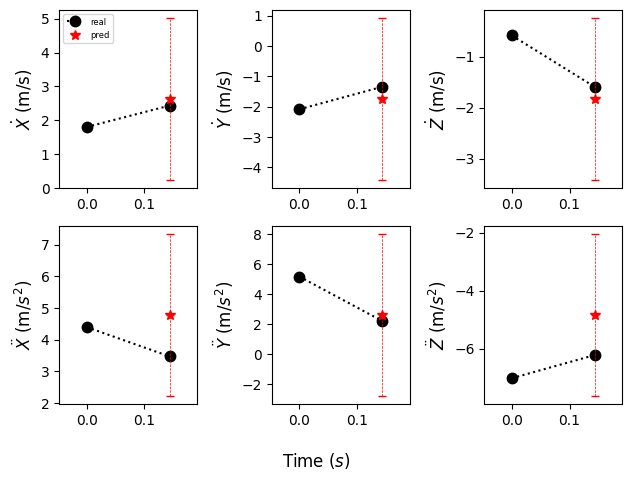

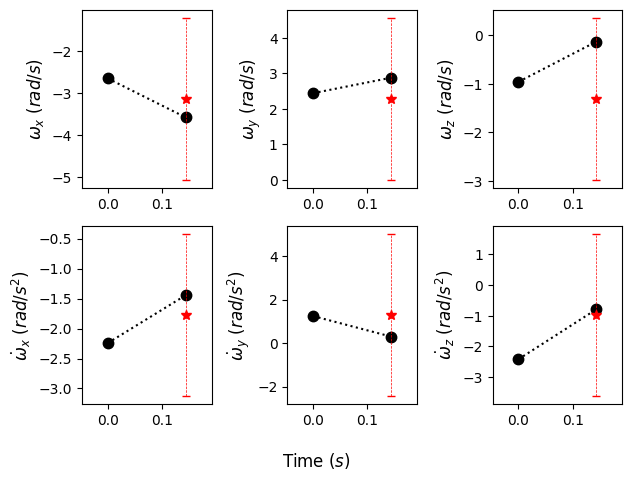

Current Batch Train Loss: 0.004186073783785105

Current Batch Train Loss: 0.0035567583981901407

Current Batch Train Loss: 0.0061762346886098385

Current Batch Train Loss: 0.007552986033260822

Current Batch Train Loss: 0.004704505205154419

Current Batch Train Loss: 0.004951879382133484

Current Batch Train Loss: 0.003748549148440361

Current Batch Train Loss: 0.005964886862784624

Current Batch Train Loss: 0.004417587537318468

Current Batch Train Loss: 0.0052971867844462395

Current Batch Train Loss: 0.0038183056749403477

Current Batch Train Loss: 0.00471127312630415

Current Batch Train Loss: 0.003626244142651558

Current Batch Train Loss: 0.004710750188678503

Current Batch Train Loss: 0.005332522559911013

Current Batch Train Loss: 0.004330034833401442

Current Batch Train Loss: 0.0044764382764697075

Current Batch Train Loss: 0.003973163664340973

Current Batch Train Loss: 0.0038458937779068947

Current Batch Train Loss: 0.003951343707740307

Current Batch Train Loss: 0.0040128

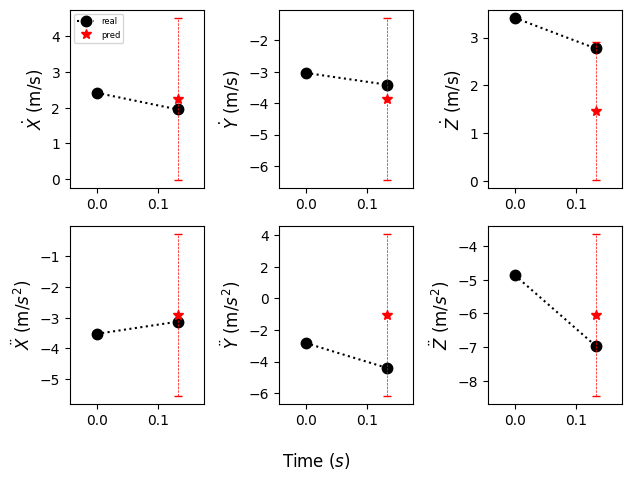

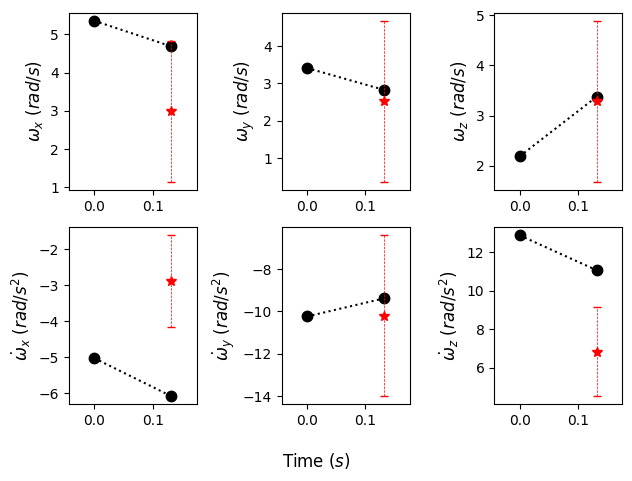

Current Batch Train Loss: 0.004565564449876547

Current Batch Train Loss: 0.004600736312568188

Current Batch Train Loss: 0.00699072377756238

Current Batch Train Loss: 0.00591411255300045

Current Batch Train Loss: 0.004016332793980837

Current Batch Train Loss: 0.004452832974493504

Current Batch Train Loss: 0.004540825262665749

Current Batch Train Loss: 0.003960036672651768

Current Batch Train Loss: 0.004029409494251013

Current Batch Train Loss: 0.005945934448391199

Current Batch Train Loss: 0.005181135609745979

Current Batch Train Loss: 0.00429938081651926

Current Batch Train Loss: 0.003964525181800127

Current Batch Train Loss: 0.004787588492035866

Current Batch Train Loss: 0.003640837501734495

Current Batch Train Loss: 0.00673120329156518

Current Batch Train Loss: 0.007426923140883446

Current Batch Train Loss: 0.0040795463137328625

Current Batch Train Loss: 0.004727813880890608

Current Batch Train Loss: 0.006004463415592909

Current Batch Train Loss: 0.004290170036256

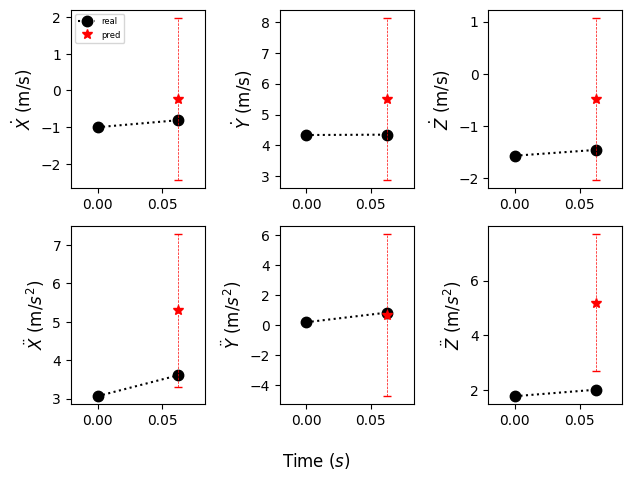

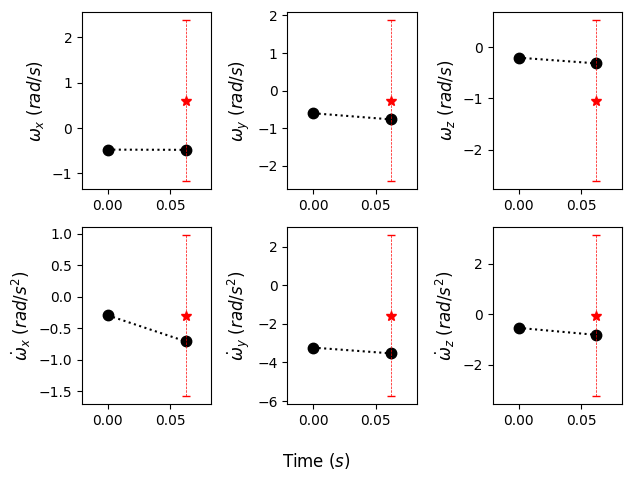

Current Batch Train Loss: 0.0041068983264267445

Current Batch Train Loss: 0.00529162073507905

Current Batch Train Loss: 0.0052601913921535015

Current Batch Train Loss: 0.006501122377812862

Current Batch Train Loss: 0.003800521371886134

Current Batch Train Loss: 0.00537735503166914

Current Batch Train Loss: 0.004319770727306604

Current Batch Train Loss: 0.0037553070578724146

Current Batch Train Loss: 0.0039375233463943005

Current Batch Train Loss: 0.005216230638325214

Current Batch Train Loss: 0.005046439357101917

Current Batch Train Loss: 0.005291556473821402

Current Batch Train Loss: 0.004283286165446043

Current Batch Train Loss: 0.003909132909029722

Current Batch Train Loss: 0.004498358815908432

Current Batch Train Loss: 0.003666070755571127

Current Batch Train Loss: 0.004782835487276316

Current Batch Train Loss: 0.0054763550870120525

Current Batch Train Loss: 0.004545520059764385

Current Batch Train Loss: 0.004653640557080507

Current Batch Train Loss: 0.003821416

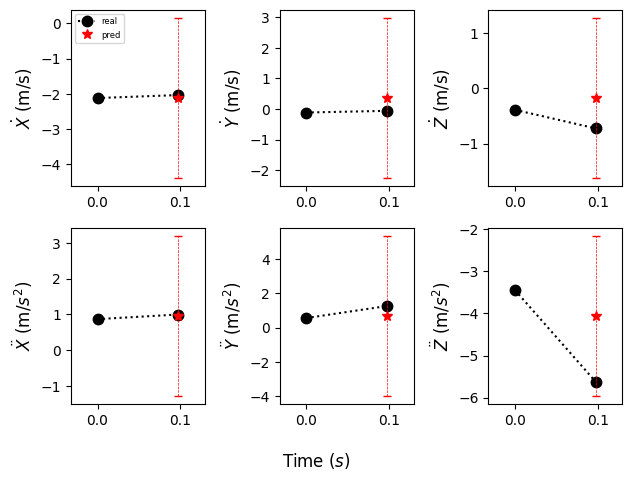

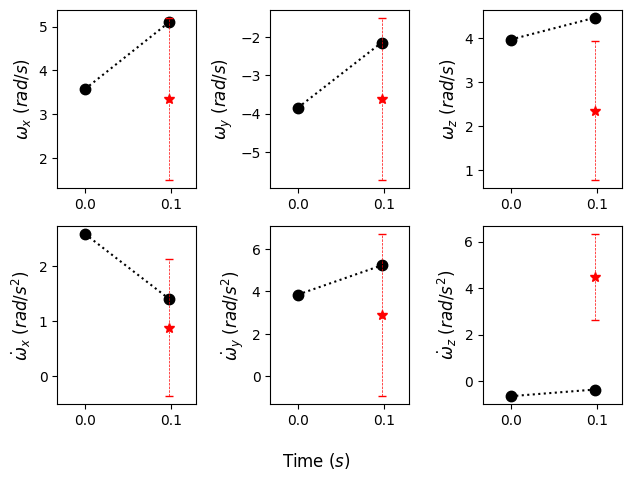

Current Batch Train Loss: 0.005322334822267294

Current Batch Train Loss: 0.004765454214066267

Current Batch Train Loss: 0.0037635688204318285

Current Batch Train Loss: 0.004157192073762417

Current Batch Train Loss: 0.005047410260885954

Current Batch Train Loss: 0.004162577912211418

Current Batch Train Loss: 0.003950873855501413

Current Batch Train Loss: 0.0036524347960948944

Current Batch Train Loss: 0.004394587595015764

Current Batch Train Loss: 0.003953815903514624

Current Batch Train Loss: 0.0038750909734517336

Current Batch Train Loss: 0.004079026635736227

Current Batch Train Loss: 0.0042289081029593945

Current Batch Train Loss: 0.004168368875980377

Current Batch Train Loss: 0.004784801509231329

Current Batch Train Loss: 0.0037556421011686325

Current Batch Train Loss: 0.004374872427433729

Current Batch Train Loss: 0.0038214782252907753

Current Batch Train Loss: 0.00425894046202302

Current Batch Train Loss: 0.004428902640938759

Current Batch Train Loss: 0.0048276

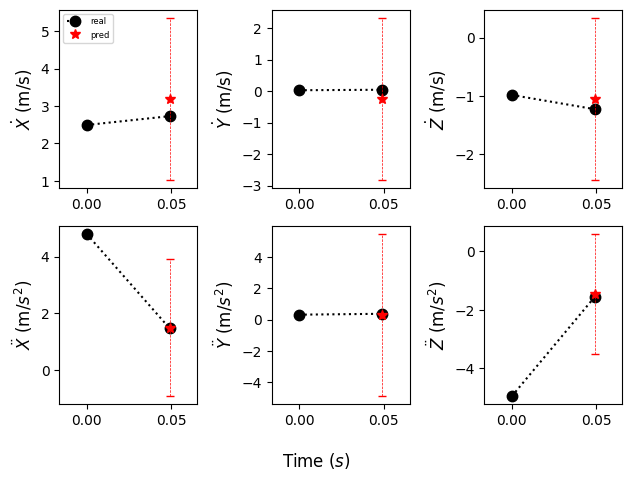

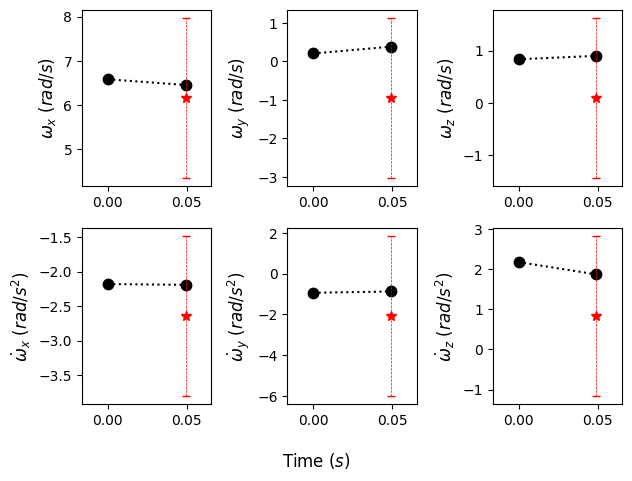

Current Batch Train Loss: 0.003731015371158719

Current Batch Train Loss: 0.0048037185333669186

Current Batch Train Loss: 0.0036675133742392063

Current Batch Train Loss: 0.003912248183041811

Current Batch Train Loss: 0.004000102635473013

Current Batch Train Loss: 0.004202499520033598

Current Batch Train Loss: 0.0038174332585185766

Current Batch Train Loss: 0.006482812110334635

Current Batch Train Loss: 0.007996801286935806

Current Batch Train Loss: 0.004296417348086834

Current Batch Train Loss: 0.004043540917336941

Current Batch Train Loss: 0.006357156205922365

Current Batch Train Loss: 0.0037747398018836975

Current Batch Train Loss: 0.0037099618930369616

Current Batch Train Loss: 0.003949656616896391

Current Batch Train Loss: 0.004029655363410711

Current Batch Train Loss: 0.0038714155089110136

Current Batch Train Loss: 0.0037197566125541925

Current Batch Train Loss: 0.004129883833229542

Current Batch Train Loss: 0.006073768250644207

Current Batch Train Loss: 0.00355

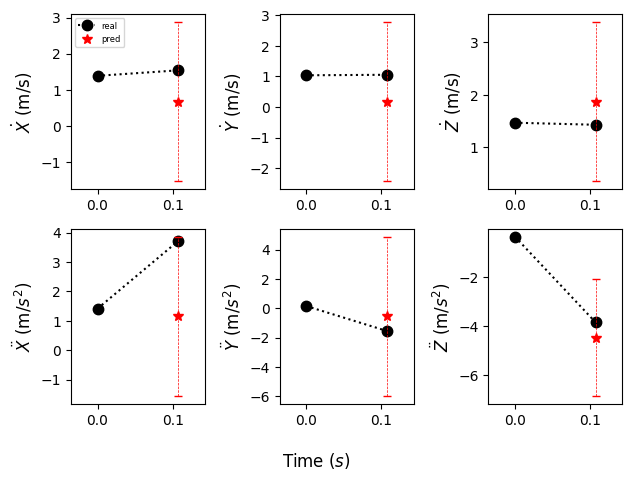

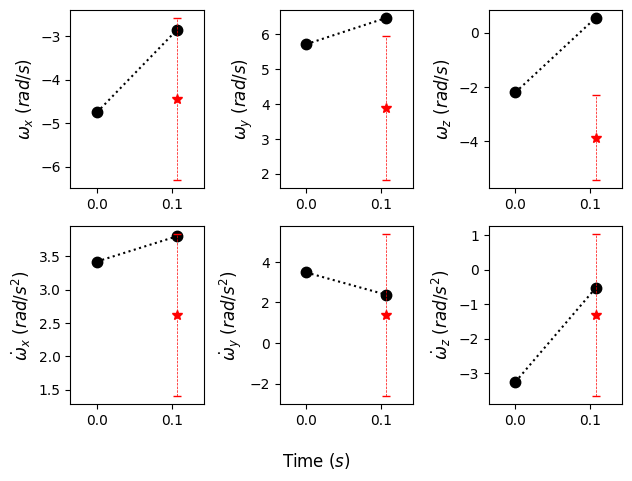

Current Batch Train Loss: 0.004570558667182922

Current Batch Train Loss: 0.0041810134425759315

Current Batch Train Loss: 0.004014125559478998

Current Batch Train Loss: 0.004351138137280941

Current Batch Train Loss: 0.0043825432658195496

Current Batch Train Loss: 0.0035756975412368774

Current Batch Train Loss: 0.0043059103190898895

Current Batch Train Loss: 0.005043502897024155

Current Batch Train Loss: 0.0036568043287843466

Current Batch Train Loss: 0.003725200891494751

Current Batch Train Loss: 0.0046532247215509415

Current Batch Train Loss: 0.004810205195099115

Current Batch Train Loss: 0.0038301157765090466

Current Batch Train Loss: 0.005496817175298929

Current Batch Train Loss: 0.004389777779579163

Current Batch Train Loss: 0.0037669839803129435

Current Batch Train Loss: 0.003862702054902911

Current Batch Train Loss: 0.004380886908620596

Current Batch Train Loss: 0.004200422205030918

Current Batch Train Loss: 0.0056704445742070675

Current Batch Train Loss: 0.003

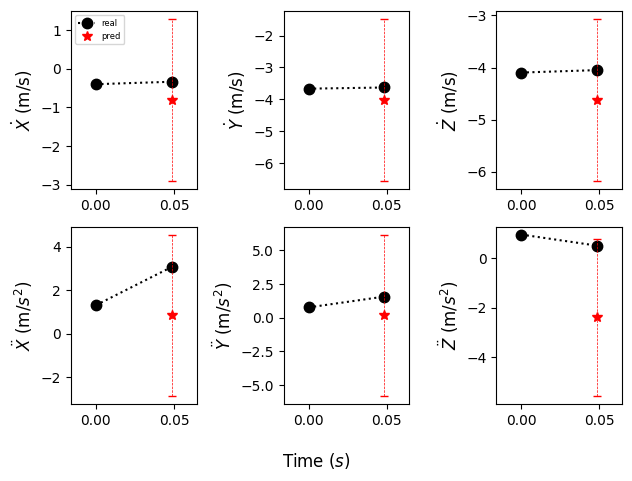

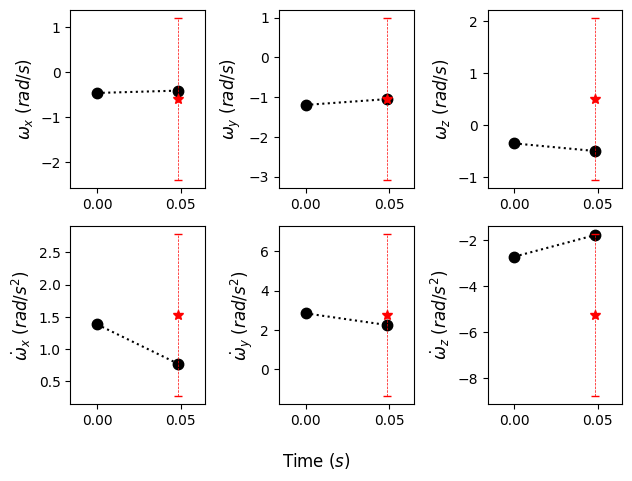

Current Batch Train Loss: 0.006300731096416712

Current Batch Train Loss: 0.003919868730008602

Current Batch Train Loss: 0.004075468517839909

Current Batch Train Loss: 0.0041451603174209595

Current Batch Train Loss: 0.0051671406254172325

Current Batch Train Loss: 0.0044891140423715115

Current Batch Train Loss: 0.004428430460393429

Current Batch Train Loss: 0.004833824001252651

Current Batch Train Loss: 0.006512290332466364

Current Batch Train Loss: 0.0037348850164562464

Current Batch Train Loss: 0.004041175823658705

Current Batch Train Loss: 0.004067807458341122

Current Batch Train Loss: 0.006400835234671831

Current Batch Train Loss: 0.00402140524238348

Current Batch Train Loss: 0.004149150103330612

Current Batch Train Loss: 0.0040018148720264435

Current Batch Train Loss: 0.00527125783264637

Current Batch Train Loss: 0.005402489565312862

Current Batch Train Loss: 0.005814819131046534

Current Batch Train Loss: 0.004299428313970566

Current Batch Train Loss: 0.003689402

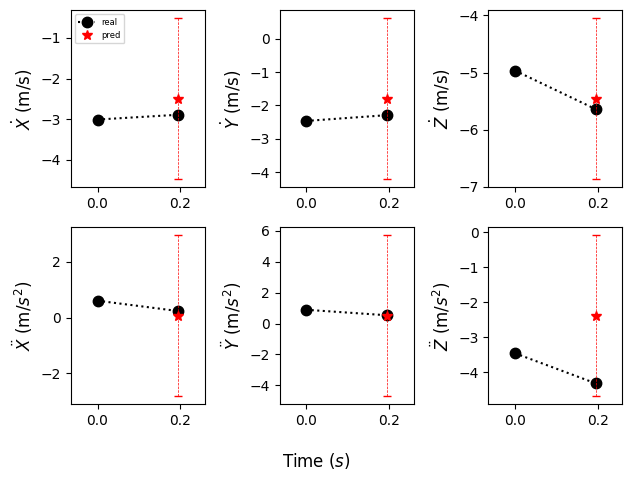

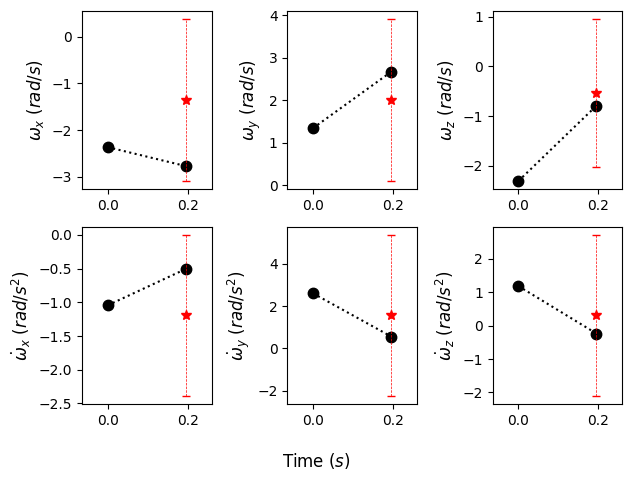

Current Batch Train Loss: 0.007938760332763195

Current Batch Train Loss: 0.003936538938432932

Current Batch Train Loss: 0.004940565209835768

Current Batch Train Loss: 0.004338131286203861

Current Batch Train Loss: 0.004033227451145649

Current Batch Train Loss: 0.0046197809278965

Current Batch Train Loss: 0.004170684143900871

Current Batch Train Loss: 0.003867369843646884

Current Batch Train Loss: 0.0038316084537655115

Current Batch Train Loss: 0.0035551327746361494

Current Batch Train Loss: 0.0036791949532926083

Current Batch Train Loss: 0.004820422735065222

Current Batch Train Loss: 0.003753583412617445

Current Batch Train Loss: 0.004764435812830925

Current Batch Train Loss: 0.005182408262044191

Current Batch Train Loss: 0.0038362278137356043

Current Batch Train Loss: 0.004201814997941256

Current Batch Train Loss: 0.0038338787853717804

Current Batch Train Loss: 0.004532546736299992

Current Batch Train Loss: 0.00416503706946969

Current Batch Train Loss: 0.0075194239

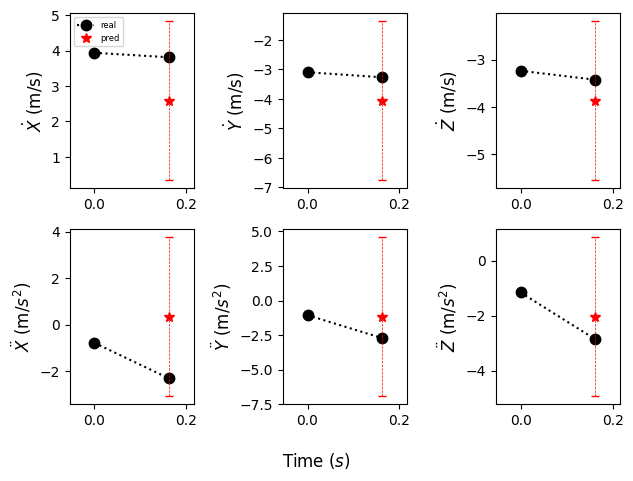

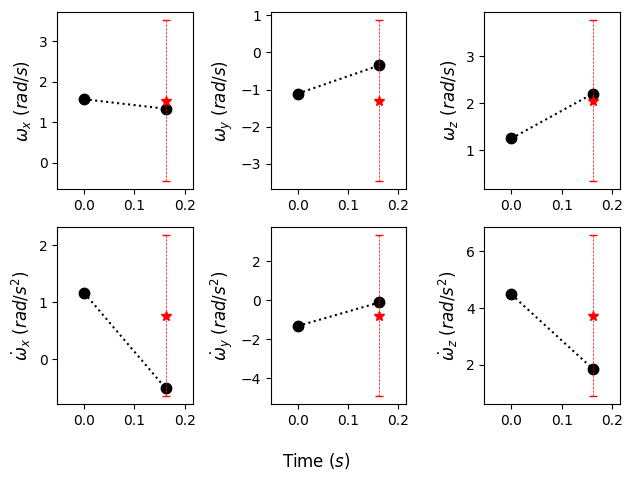

Current Batch Train Loss: 0.0063031259924173355

Current Batch Train Loss: 0.003953488077968359

Current Batch Train Loss: 0.003747879061847925

Current Batch Train Loss: 0.004909292794764042

Current Batch Train Loss: 0.004479168448597193

Current Batch Train Loss: 0.003968516364693642

Current Batch Train Loss: 0.005645147990435362

Current Batch Train Loss: 0.00453913351520896

Current Batch Train Loss: 0.0063466825522482395

Current Batch Train Loss: 0.005128607153892517

Current Batch Train Loss: 0.004139184486120939

Current Batch Train Loss: 0.006035258993506432

Current Batch Train Loss: 0.004623502027243376

Current Batch Train Loss: 0.0038674543611705303

Current Batch Train Loss: 0.005510146729648113

Current Batch Train Loss: 0.0038485892582684755

Current Batch Train Loss: 0.004097307566553354

Current Batch Train Loss: 0.004270952194929123

Current Batch Train Loss: 0.004262157250195742

Current Batch Train Loss: 0.005318967625498772

Current Batch Train Loss: 0.003967374

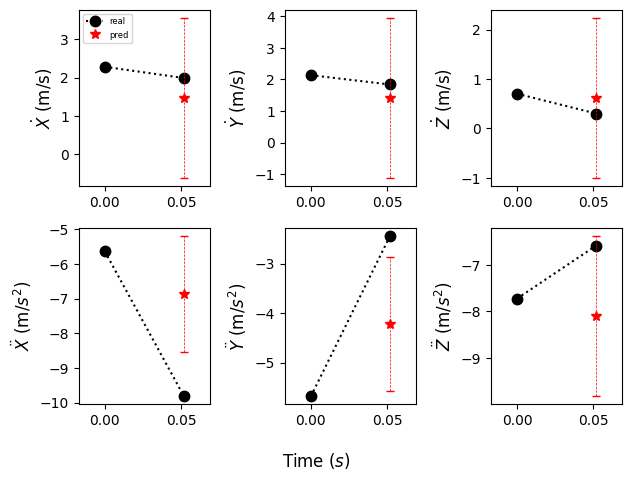

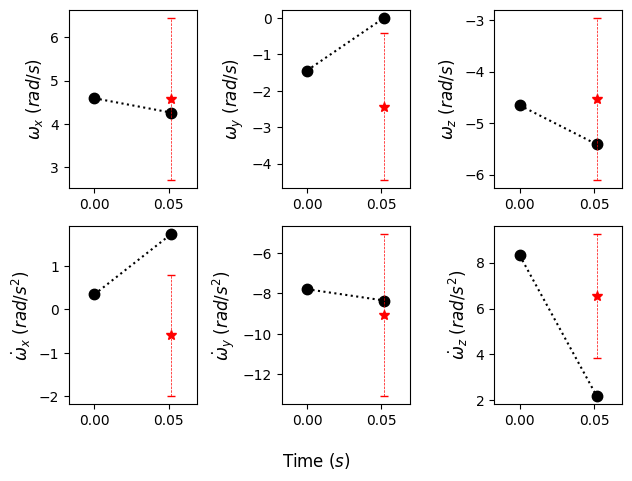

Current Batch Train Loss: 0.003905192017555237

Current Batch Train Loss: 0.004993578884750605

Current Batch Train Loss: 0.003810909576714039

Current Batch Train Loss: 0.005558329168707132

Current Batch Train Loss: 0.0038058848585933447

Current Batch Train Loss: 0.006210390478372574

Current Batch Train Loss: 0.0060723586939275265

Current Batch Train Loss: 0.003735617734491825

Current Batch Train Loss: 0.004940457176417112

Current Batch Train Loss: 0.004356197081506252

Current Batch Train Loss: 0.005135556682944298

Current Batch Train Loss: 0.004589741583913565

Current Batch Train Loss: 0.005843071732670069

Current Batch Train Loss: 0.004517917521297932

Current Batch Train Loss: 0.005678046029061079

Current Batch Train Loss: 0.004077734425663948

Current Batch Train Loss: 0.004421386867761612

Current Batch Train Loss: 0.003966274671256542

Current Batch Train Loss: 0.0046067326329648495

Current Batch Train Loss: 0.005066488403826952

Current Batch Train Loss: 0.006058345

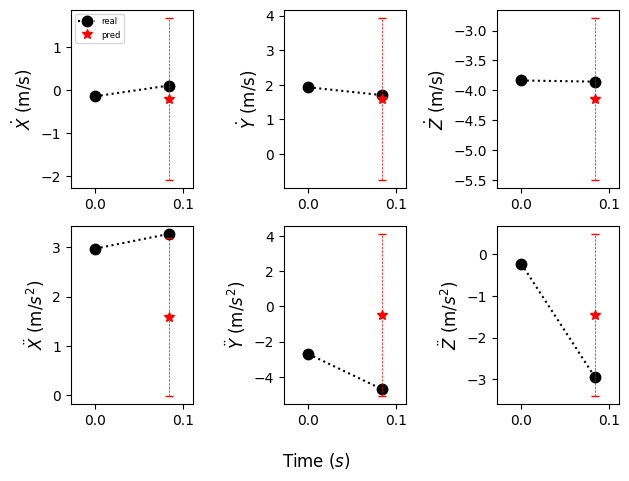

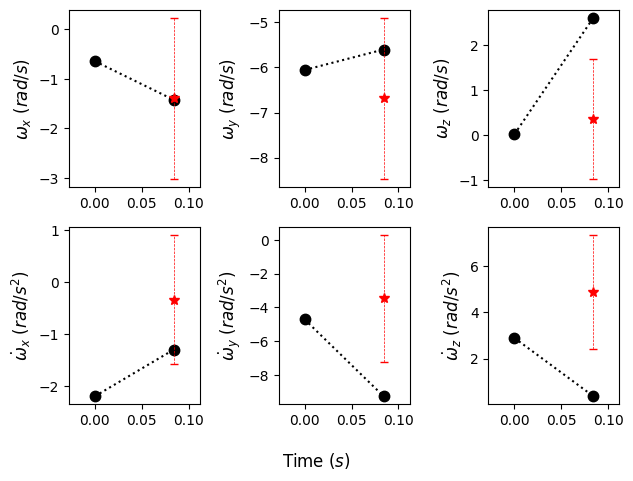

Current Batch Train Loss: 0.005346646066755056

Current Batch Train Loss: 0.003891843603923917

Current Batch Train Loss: 0.005726707633584738

Current Batch Train Loss: 0.003982378635555506

Current Batch Train Loss: 0.0036457115784287453

Current Batch Train Loss: 0.003916015382856131

Current Batch Train Loss: 0.004290726035833359

Current Batch Train Loss: 0.0054404656402766705

Current Batch Train Loss: 0.003957465291023254

Current Batch Train Loss: 0.004211311228573322

Current Batch Train Loss: 0.005769395735114813

Current Batch Train Loss: 0.005667184479534626

Current Batch Train Loss: 0.004894491285085678

Current Batch Train Loss: 0.0052290791645646095

Current Batch Train Loss: 0.00420804601162672

Current Batch Train Loss: 0.004535275045782328

Current Batch Train Loss: 0.004635919351130724

Current Batch Train Loss: 0.003926900215446949

Current Batch Train Loss: 0.0037852651439607143

Current Batch Train Loss: 0.007044854573905468

Current Batch Train Loss: 0.003718094

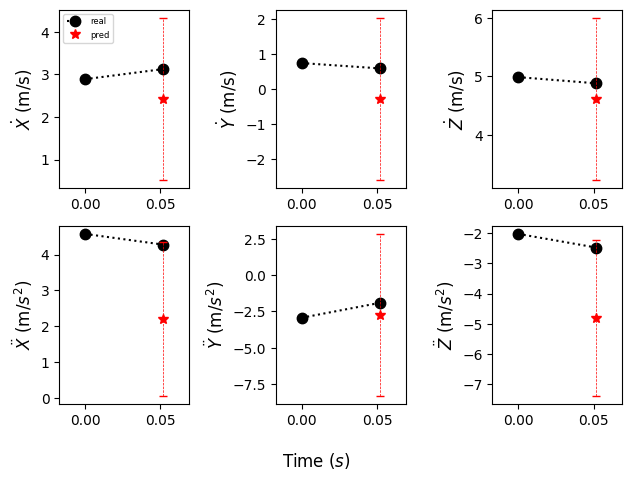

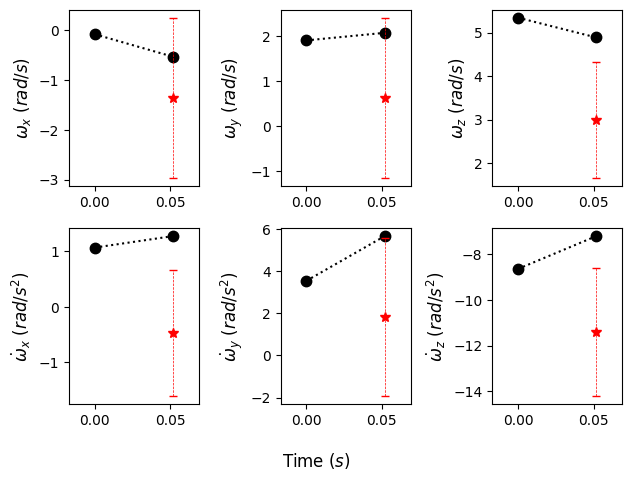

Current Batch Train Loss: 0.004692052491009235

Current Batch Train Loss: 0.00397422956302762

Current Batch Train Loss: 0.004408450797200203

Current Batch Train Loss: 0.006232944782823324

Current Batch Train Loss: 0.003909384366124868

Current Batch Train Loss: 0.003793595125898719

Current Batch Train Loss: 0.004782062489539385

Current Batch Train Loss: 0.006168620195239782

Current Batch Train Loss: 0.00566855538636446

Current Batch Train Loss: 0.004588406067341566

Current Batch Train Loss: 0.005985720548778772

Current Batch Train Loss: 0.004801449831575155

Current Batch Train Loss: 0.003961707465350628

Current Batch Train Loss: 0.003745270660147071

Current Batch Train Loss: 0.003661481197923422

Current Batch Train Loss: 0.004323624074459076

Current Batch Train Loss: 0.005221218802034855

Current Batch Train Loss: 0.003648769808933139

Current Batch Train Loss: 0.005919249262660742

Current Batch Train Loss: 0.004145066253840923

Current Batch Train Loss: 0.00821365322917

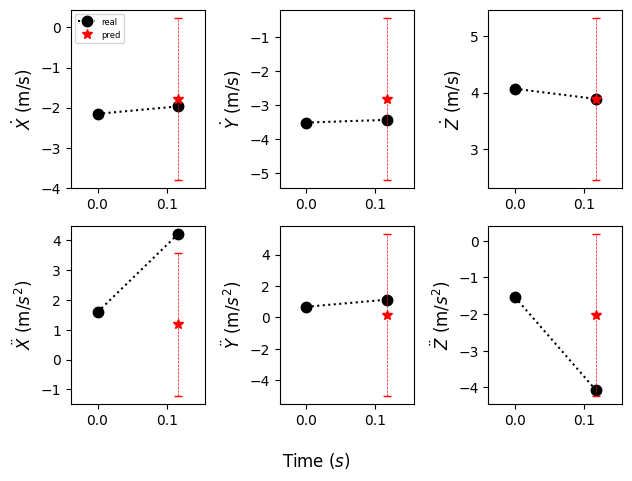

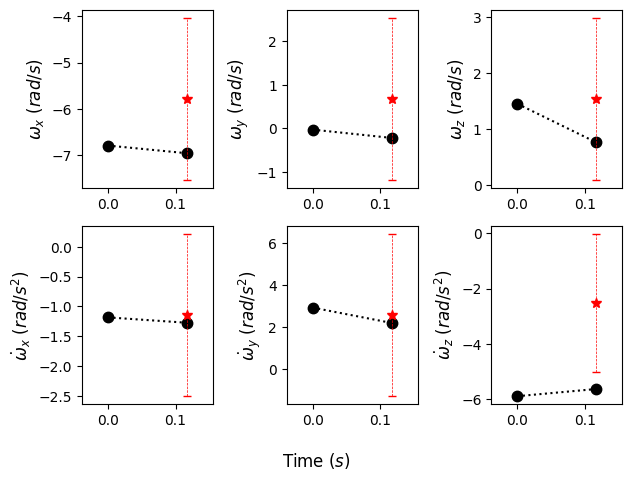

Current Batch Train Loss: 0.004296840634196997

Current Batch Train Loss: 0.00443803146481514

Current Batch Train Loss: 0.005465765483677387

Current Batch Train Loss: 0.005744816269725561

Current Batch Train Loss: 0.004970113281160593

Current Batch Train Loss: 0.004058565013110638

Current Batch Train Loss: 0.0036656504962593317

Current Batch Train Loss: 0.004072893410921097

Current Batch Train Loss: 0.004030521493405104

Current Batch Train Loss: 0.0037097414024174213

Current Batch Train Loss: 0.004139661323279142

Current Batch Train Loss: 0.004595600999891758

Current Batch Train Loss: 0.006066479254513979

Current Batch Train Loss: 0.0036529446952044964

Current Batch Train Loss: 0.0037196287885308266

Current Batch Train Loss: 0.0051284777000546455

Current Batch Train Loss: 0.004303351044654846

Current Batch Train Loss: 0.006479788571596146

Current Batch Train Loss: 0.00475334795191884

Current Batch Train Loss: 0.0037968559190630913

Current Batch Train Loss: 0.00391858

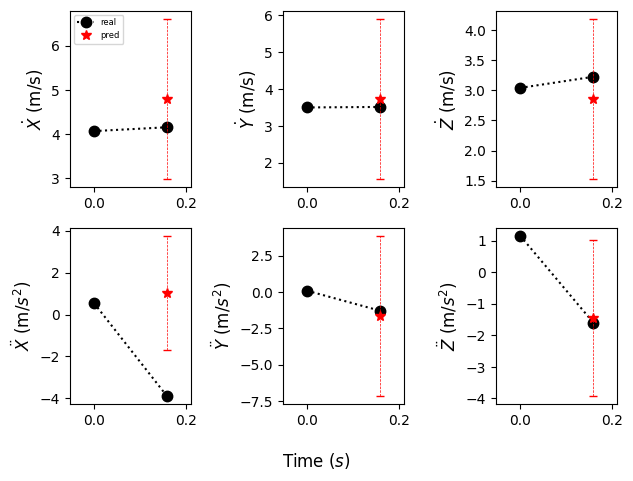

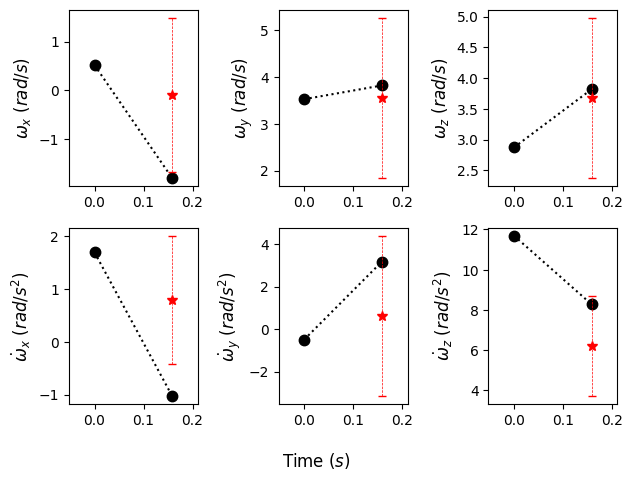

Current Batch Train Loss: 0.004267719574272633

Current Batch Train Loss: 0.0067382086999714375

Current Batch Train Loss: 0.004640145692974329

Current Batch Train Loss: 0.005112206097692251

Current Batch Train Loss: 0.004132218658924103

Current Batch Train Loss: 0.0050489287823438644

Current Batch Train Loss: 0.0040990994311869144

Current Batch Train Loss: 0.0041207848116755486

Current Batch Train Loss: 0.0041252258233726025

Current Batch Train Loss: 0.004438648000359535

Current Batch Train Loss: 0.004965474829077721

Current Batch Train Loss: 0.0040916334837675095

Current Batch Train Loss: 0.003743802197277546

Current Batch Train Loss: 0.004496381152421236

Current Batch Train Loss: 0.006214268505573273

Current Batch Train Loss: 0.003714511636644602

Current Batch Train Loss: 0.0037675299681723118

Current Batch Train Loss: 0.005255530588328838

Current Batch Train Loss: 0.004576427396386862

Current Batch Train Loss: 0.006332413759082556

Current Batch Train Loss: 0.00381

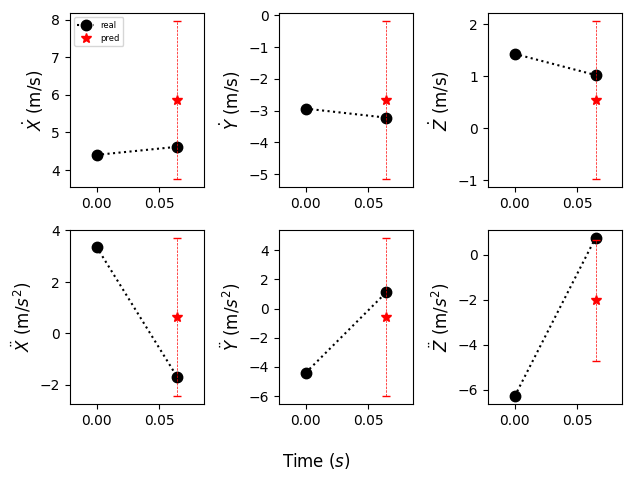

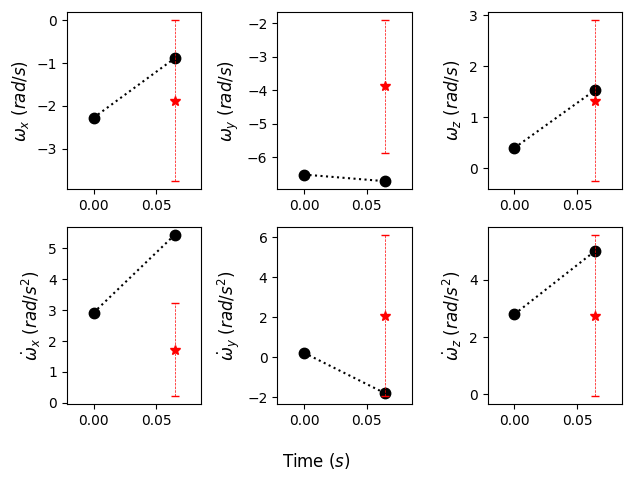

Current Batch Train Loss: 0.004277465865015984

Current Batch Train Loss: 0.004697185941040516

Current Batch Train Loss: 0.0038036745972931385

Current Batch Train Loss: 0.0038034936878830194

Current Batch Train Loss: 0.0037413311656564474

Current Batch Train Loss: 0.005607903935015202

Current Batch Train Loss: 0.003851110115647316

Current Batch Train Loss: 0.004205683246254921

Current Batch Train Loss: 0.004432064481079578

Current Batch Train Loss: 0.005982333794236183

Current Batch Train Loss: 0.005717190448194742

Current Batch Train Loss: 0.003968564793467522

Current Batch Train Loss: 0.004301271867007017

Current Batch Train Loss: 0.004057066515088081

Current Batch Train Loss: 0.004037027712911367

Current Batch Train Loss: 0.0038952315226197243

Current Batch Train Loss: 0.0039027768652886152

Current Batch Train Loss: 0.00500336941331625

Current Batch Train Loss: 0.006914368364959955

Current Batch Train Loss: 0.003647926729172468

Current Batch Train Loss: 0.00486159

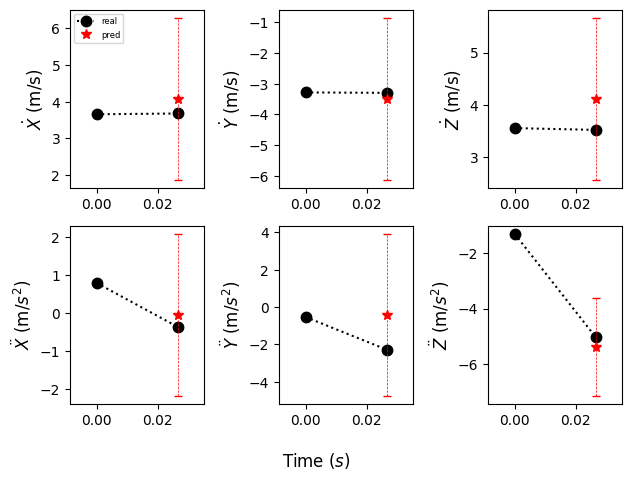

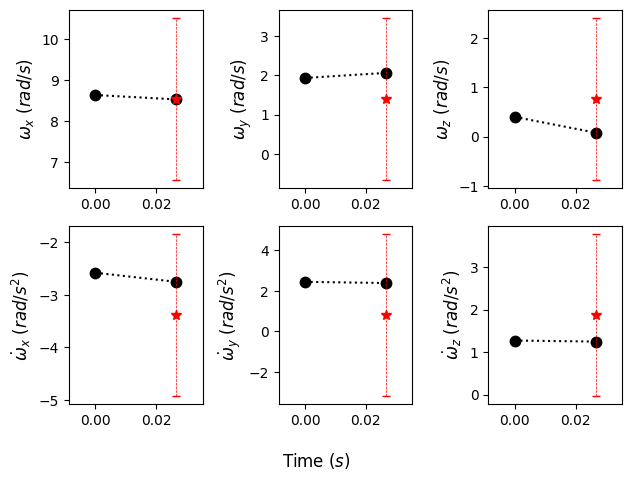

Current Batch Train Loss: 0.003693481907248497

Current Batch Train Loss: 0.003736484795808792

Current Batch Train Loss: 0.003998218569904566

Current Batch Train Loss: 0.006184268277138472

Current Batch Train Loss: 0.0036813910119235516

Current Batch Train Loss: 0.003710137214511633

Current Batch Train Loss: 0.0038155238144099712

Current Batch Train Loss: 0.004206425044685602

Current Batch Train Loss: 0.004347865469753742

Current Batch Train Loss: 0.003708299482241273

Current Batch Train Loss: 0.0035501394886523485

Current Batch Train Loss: 0.005103736184537411

Current Batch Train Loss: 0.003987190779298544

Current Batch Train Loss: 0.004687509499490261

Current Batch Train Loss: 0.006167436949908733

Current Batch Train Loss: 0.004967712331563234

Current Batch Train Loss: 0.003932972438633442

Current Batch Train Loss: 0.003640173003077507

Current Batch Train Loss: 0.0038868540432304144

Current Batch Train Loss: 0.0036945457104593515

Current Batch Train Loss: 0.0042263

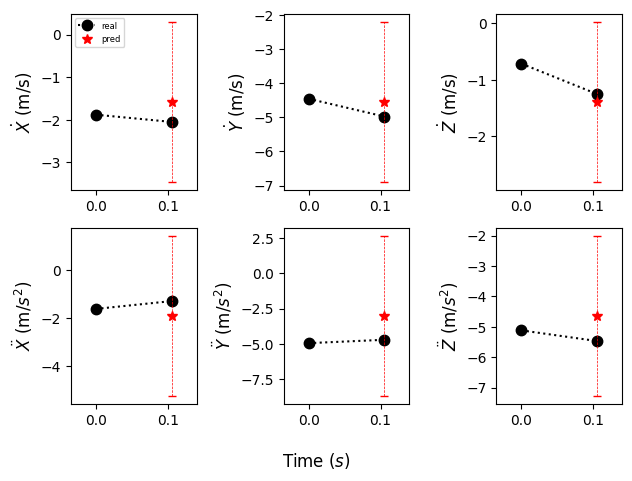

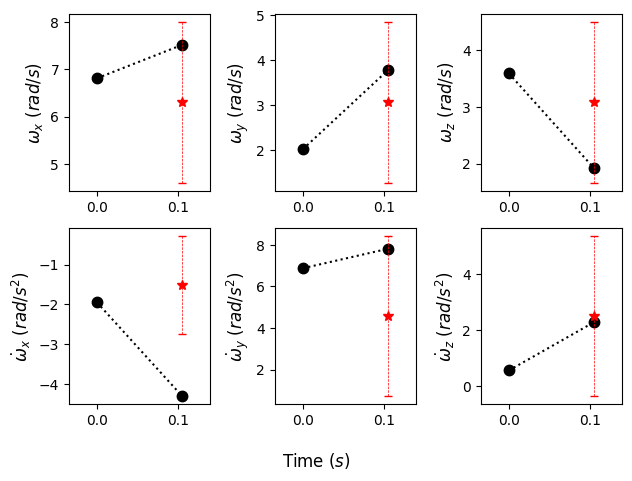

Current Batch Train Loss: 0.004095078911632299

Current Batch Train Loss: 0.004286001902073622

Current Batch Train Loss: 0.0037136736791580915

Current Batch Train Loss: 0.0047719599679112434

Current Batch Train Loss: 0.005438206717371941

Current Batch Train Loss: 0.004751135129481554

Current Batch Train Loss: 0.00489859189838171

Current Batch Train Loss: 0.0036743003875017166

Current Batch Train Loss: 0.004741040989756584

Current Batch Train Loss: 0.004126138519495726

Current Batch Train Loss: 0.003978119697421789

Current Batch Train Loss: 0.0036973529495298862

Current Batch Train Loss: 0.004955450538545847

Current Batch Train Loss: 0.005722594913095236

Current Batch Train Loss: 0.0038917353376746178

Current Batch Train Loss: 0.005364184267818928

Current Batch Train Loss: 0.003564021782949567

Current Batch Train Loss: 0.00514743709936738

Current Batch Train Loss: 0.0046102432534098625

Current Batch Train Loss: 0.00368612352758646

Current Batch Train Loss: 0.004185496

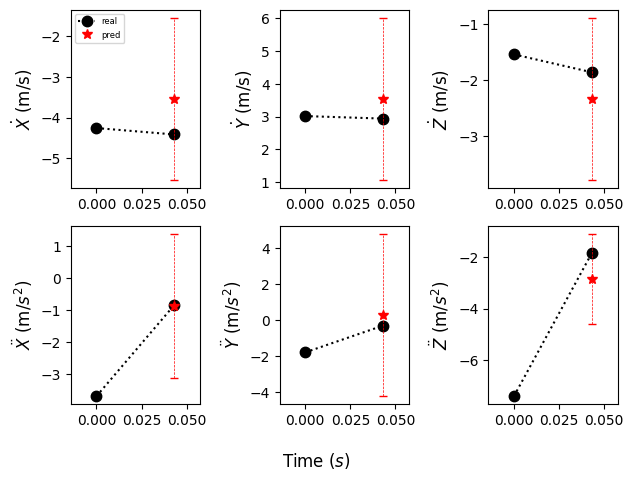

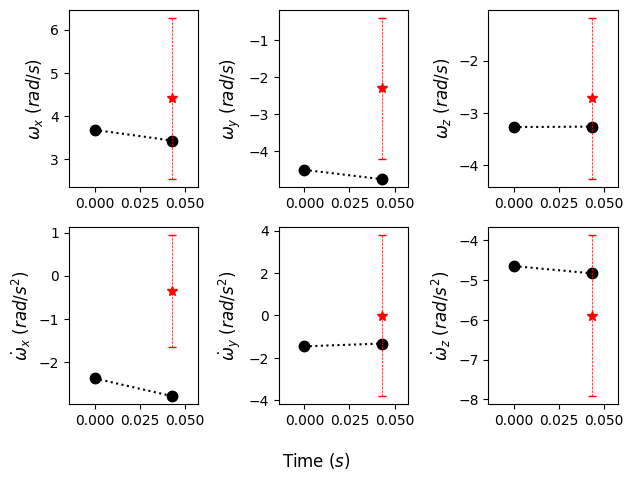

Current Batch Train Loss: 0.003682429902255535

Current Batch Train Loss: 0.007002992555499077

Current Batch Train Loss: 0.0071046967059373856

Current Batch Train Loss: 0.005928985774517059

Current Batch Train Loss: 0.004844259936362505

Current Batch Train Loss: 0.005324638448655605

Current Batch Train Loss: 0.00390062527731061

Current Batch Train Loss: 0.005537403281778097

Current Batch Train Loss: 0.006885244976729155

Current Batch Train Loss: 0.003836295800283551

Current Batch Train Loss: 0.003793687094002962

Current Batch Train Loss: 0.00435292162001133

Current Batch Train Loss: 0.0039771744050085545

Current Batch Train Loss: 0.004629362374544144

Current Batch Train Loss: 0.0041765328496694565

Current Batch Train Loss: 0.004053113982081413

Current Batch Train Loss: 0.004956336691975594

Current Batch Train Loss: 0.005527923349291086

Current Batch Train Loss: 0.003922739997506142

Current Batch Train Loss: 0.0051728966645896435

Current Batch Train Loss: 0.0046073077

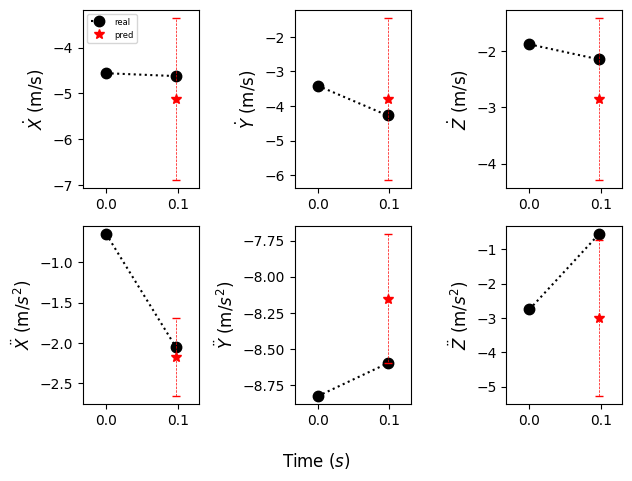

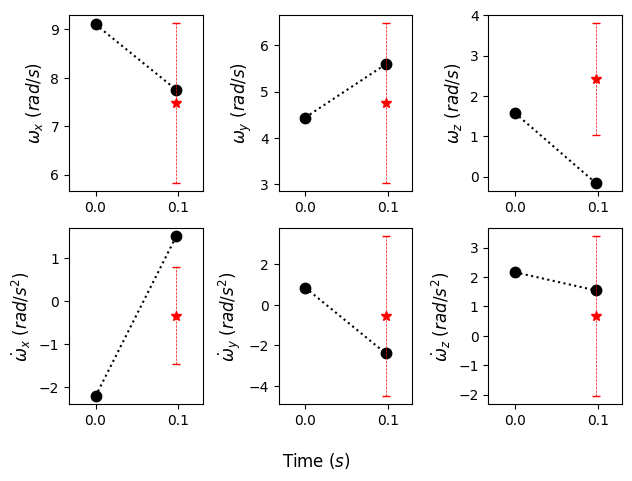

Current Batch Train Loss: 0.004549429286271334

Current Batch Train Loss: 0.004850780125707388

Current Batch Train Loss: 0.0062709990888834

Current Batch Train Loss: 0.004527880810201168

Current Batch Train Loss: 0.004807054530829191

Current Batch Train Loss: 0.006754210684448481

Current Batch Train Loss: 0.0037649960722774267

Current Batch Train Loss: 0.003803237108513713

Current Batch Train Loss: 0.003984010778367519

Current Batch Train Loss: 0.003928287886083126

Current Batch Train Loss: 0.004871763288974762

Current Batch Train Loss: 0.004011958371847868

Current Batch Train Loss: 0.00393281877040863

Current Batch Train Loss: 0.0039000785909593105

Current Batch Train Loss: 0.004498595371842384

Current Batch Train Loss: 0.00416221097111702

Current Batch Train Loss: 0.004038883838802576

Current Batch Train Loss: 0.0036897307727485895

Current Batch Train Loss: 0.003847768297418952

Current Batch Train Loss: 0.0055716438218951225

Current Batch Train Loss: 0.004848259966

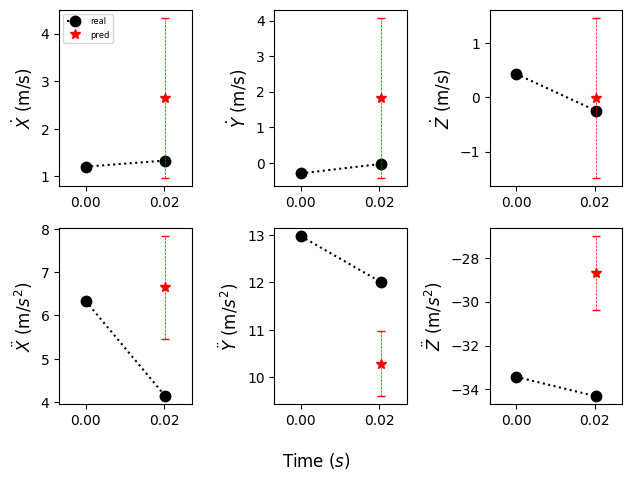

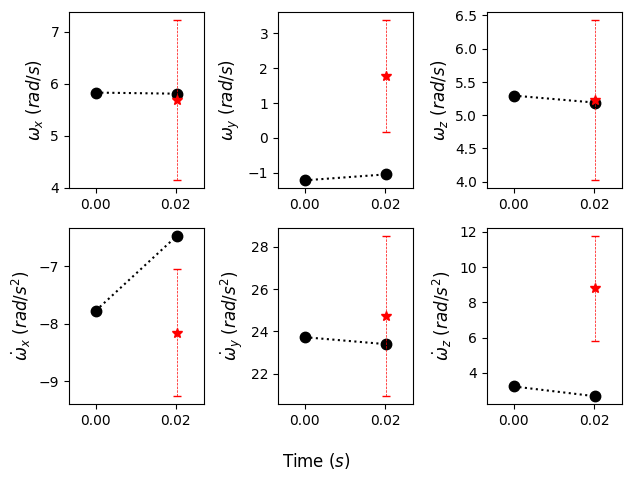

Current Batch Train Loss: 0.006567969918251038

Current Batch Train Loss: 0.00453299842774868

Current Batch Train Loss: 0.005364605225622654

Current Batch Train Loss: 0.004925839602947235

Current Batch Train Loss: 0.0048227813094854355

Current Batch Train Loss: 0.004400908015668392

Current Batch Train Loss: 0.004608809482306242

Current Batch Train Loss: 0.004038688726723194

Current Batch Train Loss: 0.003896809881553054

Current Batch Train Loss: 0.003941715694963932

Current Batch Train Loss: 0.003763293381780386

Current Batch Train Loss: 0.00600699707865715

Current Batch Train Loss: 0.0037879799492657185

Current Batch Train Loss: 0.00556374154984951

Current Batch Train Loss: 0.005000583361834288

Current Batch Train Loss: 0.004878875333815813

Current Batch Train Loss: 0.004266665317118168

Current Batch Train Loss: 0.004304877948015928

Current Batch Train Loss: 0.004889961332082748

Current Batch Train Loss: 0.003957382868975401

Current Batch Train Loss: 0.0047451867721

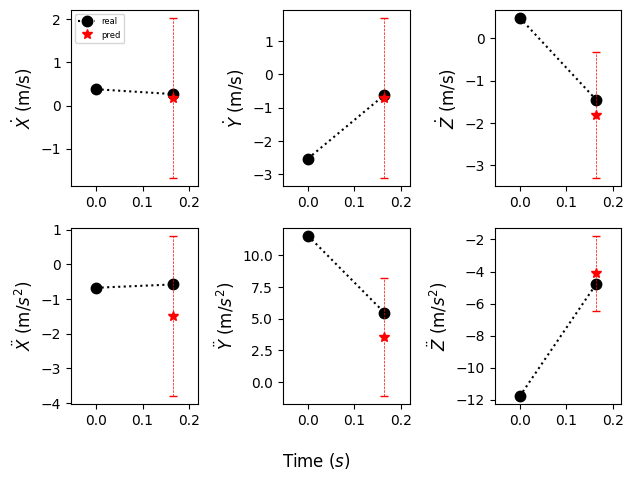

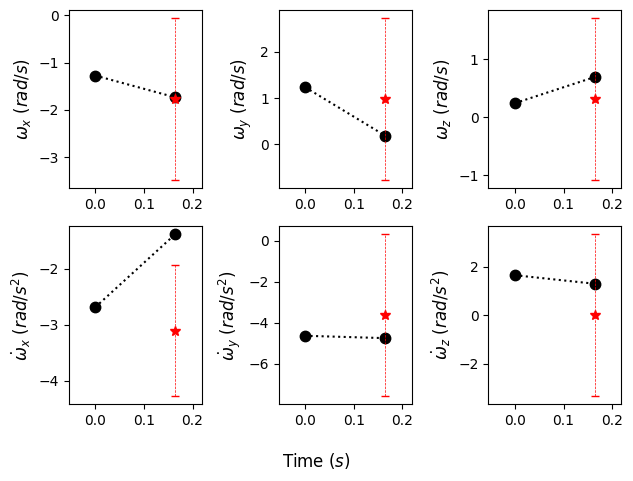

Current Batch Train Loss: 0.003699886379763484

Current Batch Train Loss: 0.0040053860284388065

Current Batch Train Loss: 0.0038293730467557907

Current Batch Train Loss: 0.004168997518718243

Current Batch Train Loss: 0.0036381036043167114

Current Batch Train Loss: 0.0036043962463736534

Current Batch Train Loss: 0.005036776419728994

Current Batch Train Loss: 0.004547141958028078

Current Batch Train Loss: 0.006286463234573603

Current Batch Train Loss: 0.0049580056220293045

Current Batch Train Loss: 0.003856312483549118

Current Batch Train Loss: 0.0037441691383719444

Current Batch Train Loss: 0.006077064201235771

Current Batch Train Loss: 0.004280573688447475

Current Batch Train Loss: 0.005341764073818922

Current Batch Train Loss: 0.004441086668521166

Current Batch Train Loss: 0.005017918534576893

Current Batch Train Loss: 0.0049695298075675964

Current Batch Train Loss: 0.0036314604803919792

Current Batch Train Loss: 0.003921315539628267

Current Batch Train Loss: 0.0045

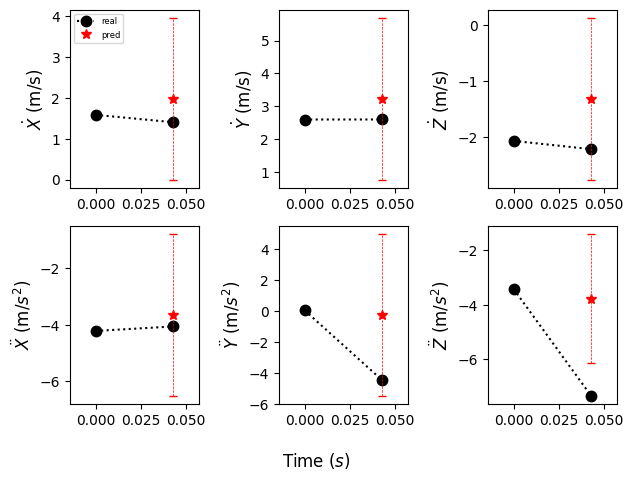

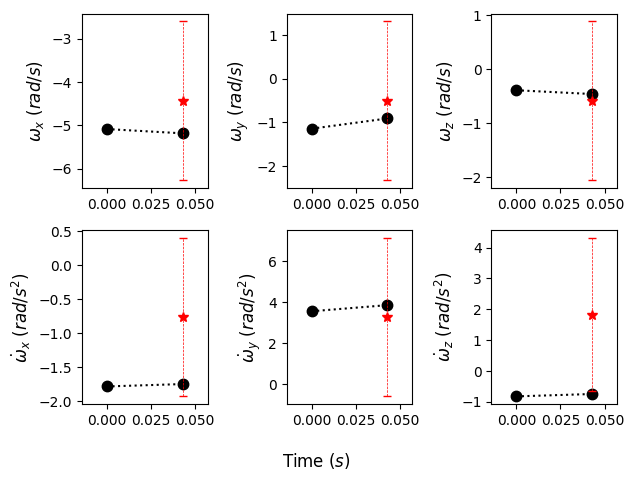

Current Batch Train Loss: 0.004380949307233095

Current Batch Train Loss: 0.0037267222069203854

Current Batch Train Loss: 0.003862426383420825

Current Batch Train Loss: 0.005423302296549082

Current Batch Train Loss: 0.0040437872521579266

Current Batch Train Loss: 0.00568718696013093

Current Batch Train Loss: 0.005143775604665279

Current Batch Train Loss: 0.0037269266322255135

Current Batch Train Loss: 0.004482714459300041

Current Batch Train Loss: 0.003807037603110075

Current Batch Train Loss: 0.0038874465972185135

Current Batch Train Loss: 0.0038993244525045156

Current Batch Train Loss: 0.004276174586266279

Current Batch Train Loss: 0.006161954719573259

Current Batch Train Loss: 0.003731789067387581

Current Batch Train Loss: 0.005133985076099634

Current Batch Train Loss: 0.00386618310585618

Current Batch Train Loss: 0.00567049253731966

Current Batch Train Loss: 0.007204754743725061

Current Batch Train Loss: 0.003973065875470638

Current Batch Train Loss: 0.0051408773

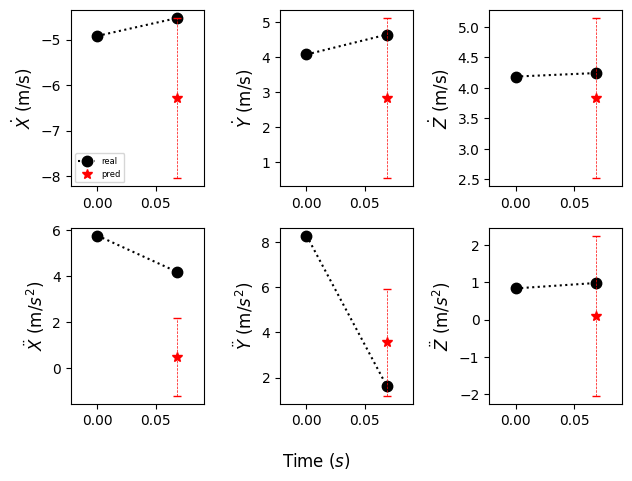

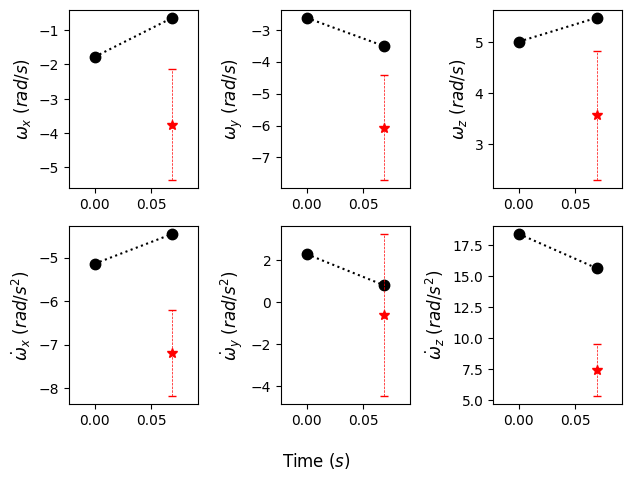

Current Batch Train Loss: 0.006238089874386787

Current Batch Train Loss: 0.004000854212790728

Current Batch Train Loss: 0.004059264436364174

Current Batch Train Loss: 0.0039944518357515335

Current Batch Train Loss: 0.0038198670372366905

Current Batch Train Loss: 0.004970323294401169

Current Batch Train Loss: 0.006481780670583248

Current Batch Train Loss: 0.0049519105814397335

Current Batch Train Loss: 0.004020067863166332

Current Batch Train Loss: 0.004827370401471853

Current Batch Train Loss: 0.004602241329848766

Current Batch Train Loss: 0.0057225958444178104

Current Batch Train Loss: 0.005032345652580261

Current Batch Train Loss: 0.0036920704878866673

Current Batch Train Loss: 0.006515085697174072

Current Batch Train Loss: 0.0038295304402709007

Current Batch Train Loss: 0.004423059057444334

Current Batch Train Loss: 0.0036390931345522404

Current Batch Train Loss: 0.0042647672817111015

Current Batch Train Loss: 0.004414019174873829

Current Batch Train Loss: 0.0039

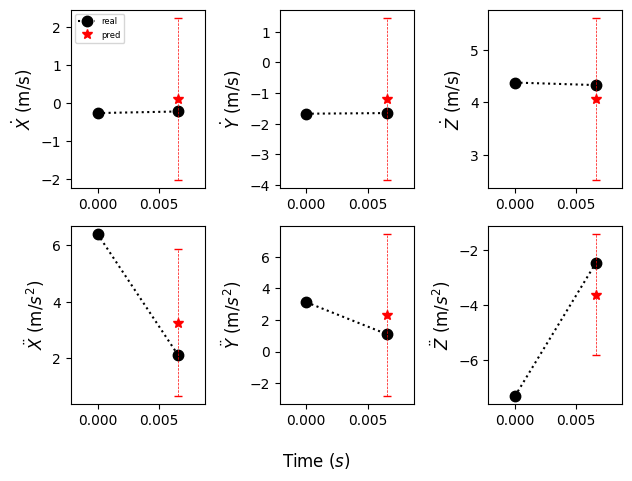

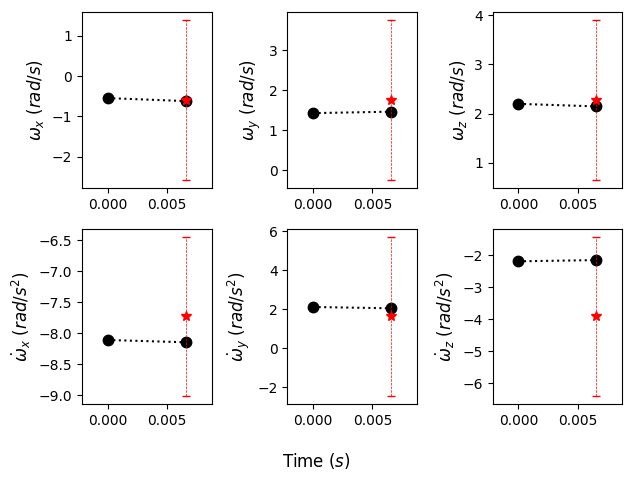

Current Batch Train Loss: 0.0040005710907280445

Current Batch Train Loss: 0.003609183942899108

Current Batch Train Loss: 0.004754707217216492

Current Batch Train Loss: 0.005480938125401735

Current Batch Train Loss: 0.0045128329657018185

Current Batch Train Loss: 0.004037212580442429

Current Batch Train Loss: 0.003965077456086874

Current Batch Train Loss: 0.004832339007407427

Current Batch Train Loss: 0.0041070966981351376

Current Batch Train Loss: 0.004372476600110531

Current Batch Train Loss: 0.004271399229764938

Current Batch Train Loss: 0.004220384173095226

Current Batch Train Loss: 0.0061060283333063126

Current Batch Train Loss: 0.005474502686411142

Current Batch Train Loss: 0.003933899570256472

Current Batch Train Loss: 0.0058250948786735535

Current Batch Train Loss: 0.004429247230291367

Current Batch Train Loss: 0.005027213133871555

Current Batch Train Loss: 0.005129816476255655

Current Batch Train Loss: 0.0037910083774477243

Current Batch Train Loss: 0.004855

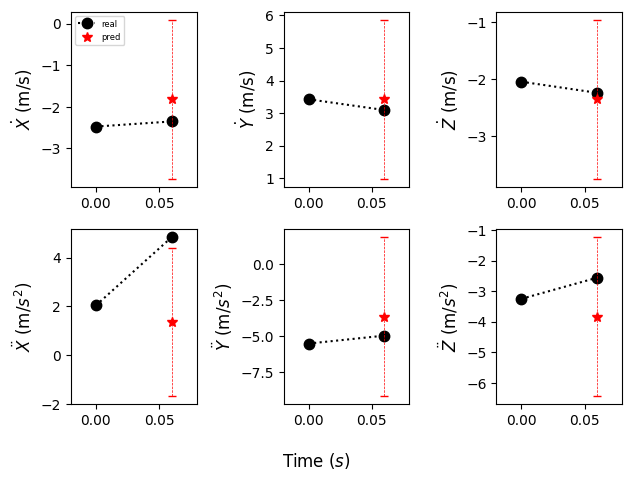

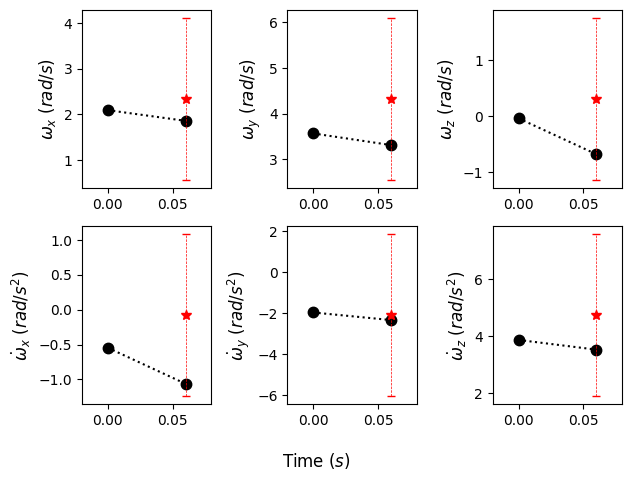

Current Batch Train Loss: 0.0040207719430327415

Current Batch Train Loss: 0.0038830768316984177

Current Batch Train Loss: 0.0044056111946702

Current Batch Train Loss: 0.00431303633376956

Current Batch Train Loss: 0.004063839558511972

Current Batch Train Loss: 0.0037903059273958206

Current Batch Train Loss: 0.003637313609942794

Current Batch Train Loss: 0.004563800059258938

Current Batch Train Loss: 0.0037212828174233437

Current Batch Train Loss: 0.0067549291998147964

Current Batch Train Loss: 0.005453691817820072

Current Batch Train Loss: 0.0057714954018592834

Current Batch Train Loss: 0.005092799197882414

Current Batch Train Loss: 0.006569789722561836

Current Batch Train Loss: 0.004144377540796995

Current Batch Train Loss: 0.004735914524644613

Current Batch Train Loss: 0.004297782201319933

Current Batch Train Loss: 0.0058607193641364574

Current Batch Train Loss: 0.003986672032624483

Current Batch Train Loss: 0.0040085194632411

Current Batch Train Loss: 0.0049649365

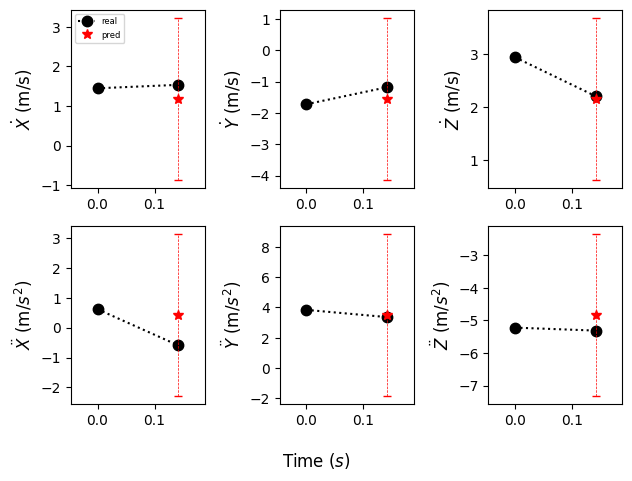

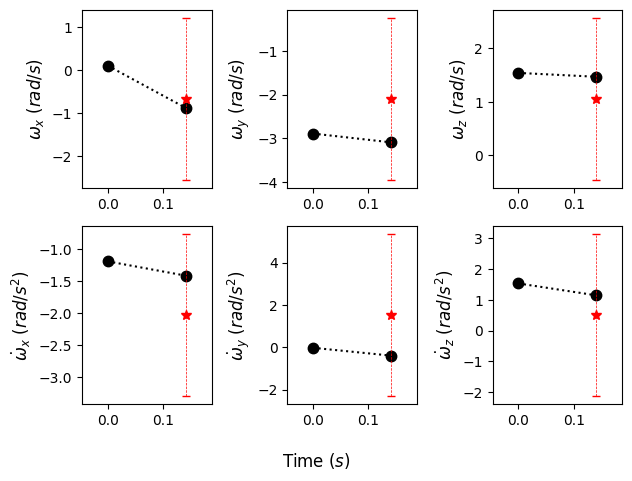

Current Batch Train Loss: 0.003666141303256154

Current Batch Train Loss: 0.006091191433370113

Current Batch Train Loss: 0.003528901841491461

Current Batch Train Loss: 0.00625246437266469

Current Batch Train Loss: 0.004121932201087475

Current Batch Train Loss: 0.004890898242592812

Current Batch Train Loss: 0.005619821138679981

Current Batch Train Loss: 0.004352621268481016

Current Batch Train Loss: 0.004021808970719576

Current Batch Train Loss: 0.007442006375640631

Current Batch Train Loss: 0.00472013745456934

Current Batch Train Loss: 0.004974759183824062

Current Batch Train Loss: 0.003464298788458109

Current Batch Train Loss: 0.00430185254663229

Current Batch Train Loss: 0.006970043294131756

Current Batch Train Loss: 0.004408922046422958

Current Batch Train Loss: 0.004161121789366007

Current Batch Train Loss: 0.005272855516523123

Current Batch Train Loss: 0.005605032667517662

Current Batch Train Loss: 0.003602406242862344

Current Batch Train Loss: 0.005999249871820

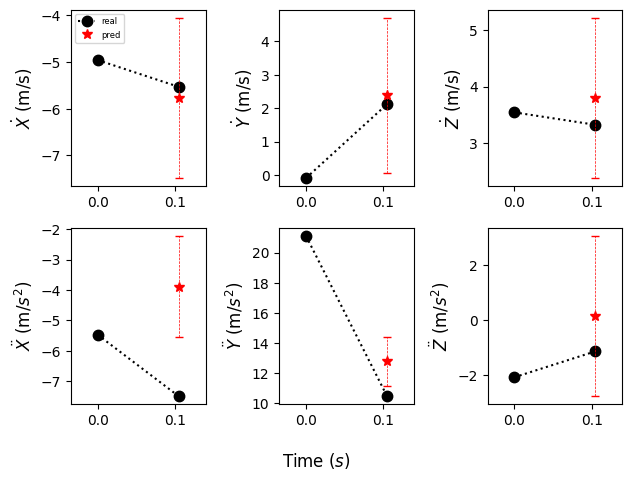

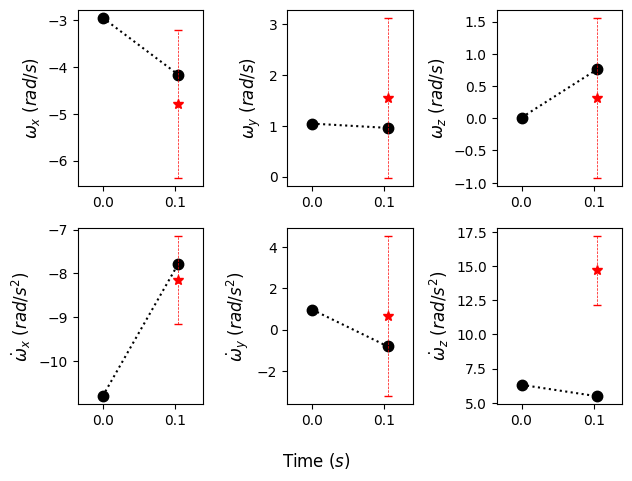

Current Batch Train Loss: 0.00477175135165453

Current Batch Train Loss: 0.004052959848195314

Current Batch Train Loss: 0.004647115711122751

Current Batch Train Loss: 0.003890087129548192

Current Batch Train Loss: 0.0037209487054497004

Current Batch Train Loss: 0.005622826050966978

Current Batch Train Loss: 0.0038736453279852867

Current Batch Train Loss: 0.005899281706660986

Current Batch Train Loss: 0.003976980224251747

Current Batch Train Loss: 0.0039591495878994465

Current Batch Train Loss: 0.0038200251292437315

Current Batch Train Loss: 0.0051101623103022575

Current Batch Train Loss: 0.004140021279454231

Current Batch Train Loss: 0.006187061313539743

Current Batch Train Loss: 0.004390984307974577

Current Batch Train Loss: 0.005008273757994175

Current Batch Train Loss: 0.0036449802573770285

Current Batch Train Loss: 0.004771003965288401

Current Batch Train Loss: 0.003813815535977483

Current Batch Train Loss: 0.004177153576165438

Current Batch Train Loss: 0.0078025

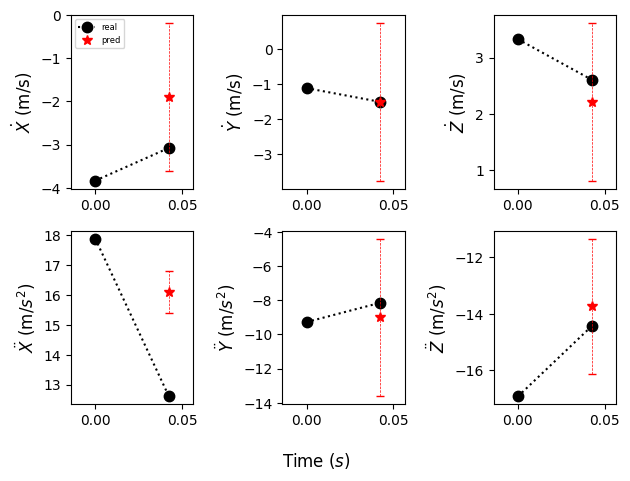

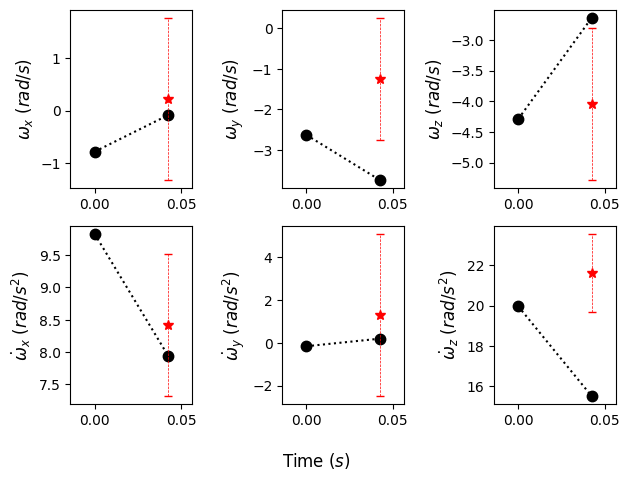

Current Batch Train Loss: 0.00537111097946763

Current Batch Train Loss: 0.0061841486021876335

Current Batch Train Loss: 0.003767329966649413

Current Batch Train Loss: 0.005499185528606176

Current Batch Train Loss: 0.004494909197092056

Current Batch Train Loss: 0.00485928263515234

Current Batch Train Loss: 0.004058106802403927

Current Batch Train Loss: 0.003861528355628252

Current Batch Train Loss: 0.005200154148042202

Current Batch Train Loss: 0.0036483441945165396

Current Batch Train Loss: 0.0044889082200825214

Current Batch Train Loss: 0.004128929693251848

Current Batch Train Loss: 0.0036969808861613274

Current Batch Train Loss: 0.004040445201098919

Current Batch Train Loss: 0.00500269653275609

Current Batch Train Loss: 0.005739939399063587

Current Batch Train Loss: 0.004092345014214516

Current Batch Train Loss: 0.005104027222841978

Current Batch Train Loss: 0.004259186796844006

Current Batch Train Loss: 0.0044214725494384766

Current Batch Train Loss: 0.0061362767

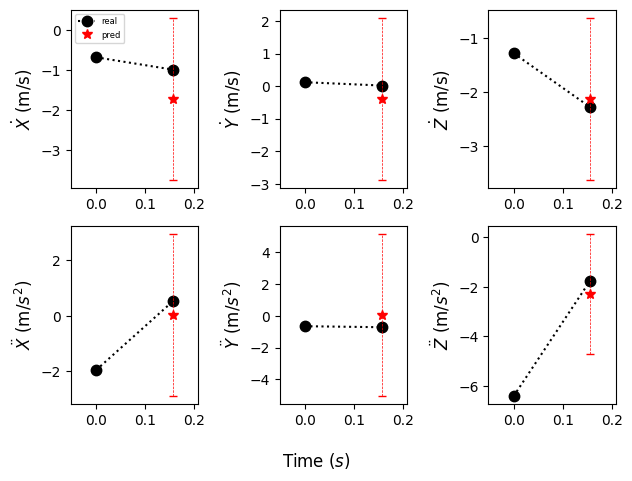

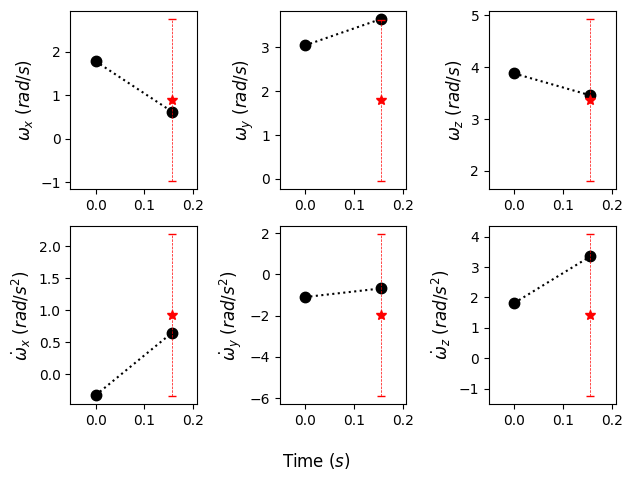

Current Batch Train Loss: 0.004199367947876453

Current Batch Train Loss: 0.0034963241778314114

Current Batch Train Loss: 0.003962526563555002

Current Batch Train Loss: 0.0035386066883802414

Current Batch Train Loss: 0.004576379433274269

Current Batch Train Loss: 0.004272892139852047

Current Batch Train Loss: 0.004116904456168413

Current Batch Train Loss: 0.00419668247923255

Current Batch Train Loss: 0.004047165159136057

Current Batch Train Loss: 0.006433611270040274

Current Batch Train Loss: 0.007211687508970499

Current Batch Train Loss: 0.004502071999013424

Current Batch Train Loss: 0.003657891880720854

Current Batch Train Loss: 0.003454208606854081

Current Batch Train Loss: 0.003919243812561035

Current Batch Train Loss: 0.005003121215850115

Current Batch Train Loss: 0.004478544928133488

Current Batch Train Loss: 0.003658376866951585

Current Batch Train Loss: 0.00418198574334383

Current Batch Train Loss: 0.0048034838400781155

Current Batch Train Loss: 0.00416770111

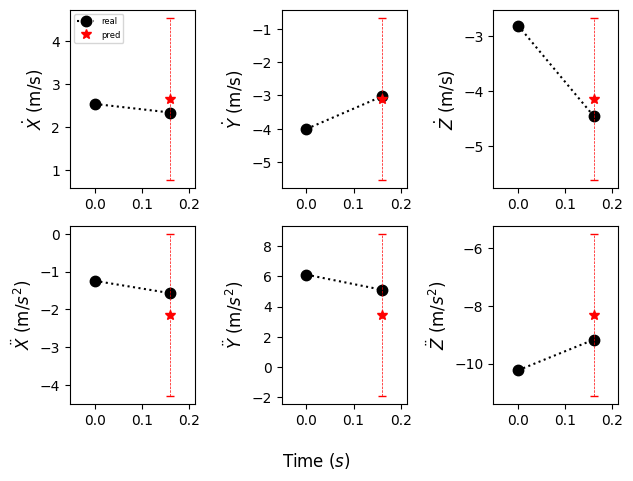

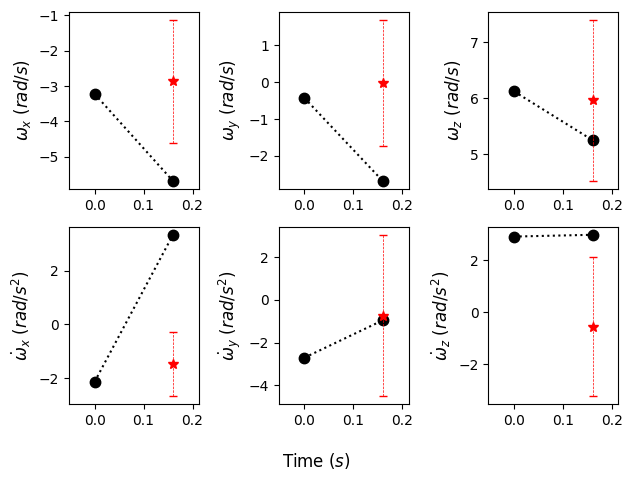

Current Batch Train Loss: 0.0037868344224989414

Current Batch Train Loss: 0.00367184286005795

Current Batch Train Loss: 0.0035060655791312456

Current Batch Train Loss: 0.004720432683825493

Current Batch Train Loss: 0.004093645140528679

Current Batch Train Loss: 0.005440363194793463

Current Batch Train Loss: 0.004527607932686806

Current Batch Train Loss: 0.006925726309418678

Current Batch Train Loss: 0.0038523219991475344

Current Batch Train Loss: 0.003573584370315075

Current Batch Train Loss: 0.0038101915270090103

Current Batch Train Loss: 0.00600660452619195

Current Batch Train Loss: 0.004463865887373686

Current Batch Train Loss: 0.004426559899002314

Current Batch Train Loss: 0.004066979978233576

Current Batch Train Loss: 0.0037870933301746845

Current Batch Train Loss: 0.0047184475697577

Current Batch Train Loss: 0.005533909425139427

Current Batch Train Loss: 0.005476399324834347

Current Batch Train Loss: 0.004101327154785395

Current Batch Train Loss: 0.00637051695

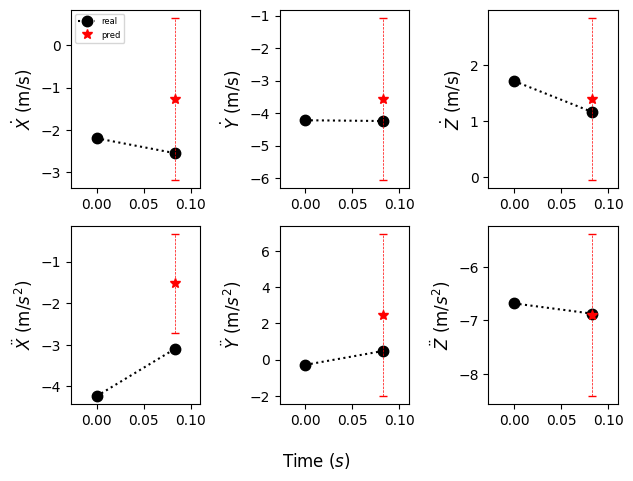

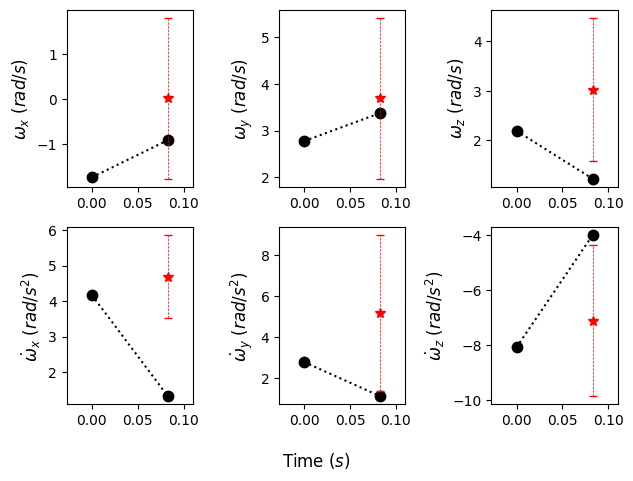

Current Batch Train Loss: 0.0056901369243860245

Current Batch Train Loss: 0.004918310791254044

Current Batch Train Loss: 0.003438190557062626

Current Batch Train Loss: 0.004227041732519865

Current Batch Train Loss: 0.005885314662009478

Current Batch Train Loss: 0.0036324283573776484

Current Batch Train Loss: 0.005904731806367636

Current Batch Train Loss: 0.003894382854923606

Current Batch Train Loss: 0.0036436887457966805

Current Batch Train Loss: 0.0036640565376728773

Current Batch Train Loss: 0.003729025134816766

Current Batch Train Loss: 0.0064554945565760136

Current Batch Train Loss: 0.004196586553007364

Current Batch Train Loss: 0.0037542094942182302

Current Batch Train Loss: 0.004125227220356464

Current Batch Train Loss: 0.003605127800256014

Current Batch Train Loss: 0.0052002896554768085

Current Batch Train Loss: 0.004706285893917084

Current Batch Train Loss: 0.0052300626412034035

Current Batch Train Loss: 0.00414933729916811

Current Batch Train Loss: 0.00465

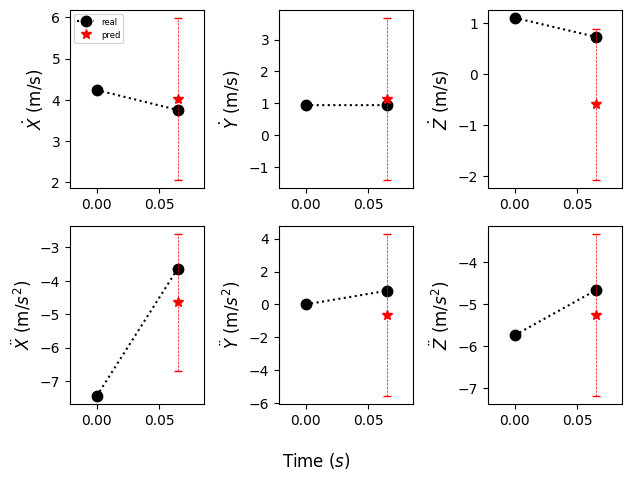

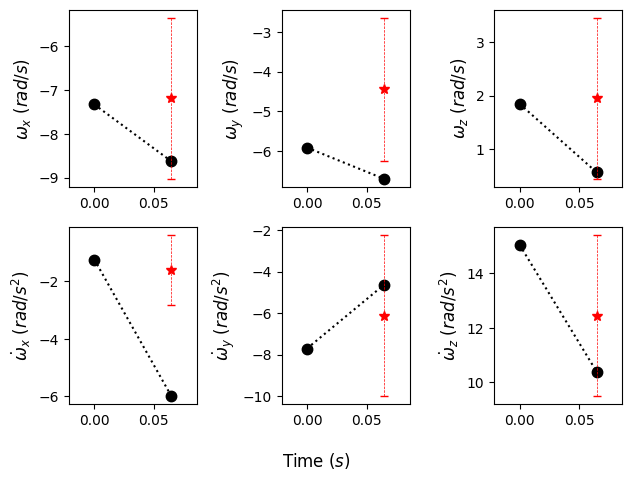

Current Batch Train Loss: 0.0042331162840127945

Current Batch Train Loss: 0.0036146952770650387

Current Batch Train Loss: 0.0036171497777104378

Current Batch Train Loss: 0.00400032801553607

Current Batch Train Loss: 0.0049253362230956554

Current Batch Train Loss: 0.005630141589790583

Current Batch Train Loss: 0.005104148760437965

Current Batch Train Loss: 0.004449938889592886

Current Batch Train Loss: 0.005007073283195496

Current Batch Train Loss: 0.0042339107021689415

Current Batch Train Loss: 0.0050526815466582775

Current Batch Train Loss: 0.0038753701373934746

Current Batch Train Loss: 0.0043870932422578335

Current Batch Train Loss: 0.005511946976184845

Current Batch Train Loss: 0.003965767100453377

Current Batch Train Loss: 0.006317405961453915

Current Batch Train Loss: 0.0040242429822683334

Current Batch Train Loss: 0.0037352475337684155

Current Batch Train Loss: 0.003787151537835598

Current Batch Train Loss: 0.005169902928173542

Current Batch Train Loss: 0.003

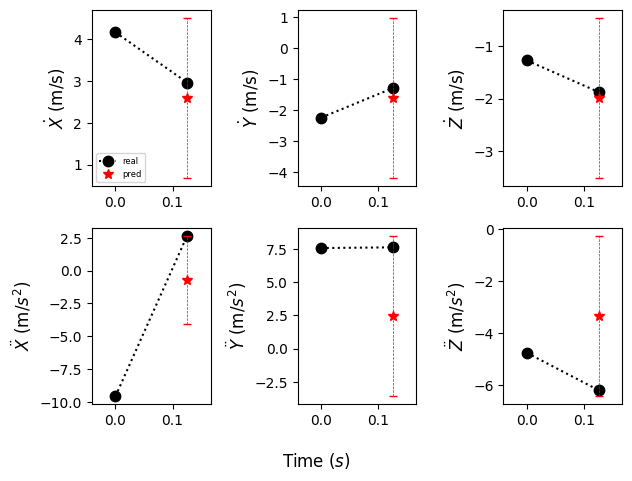

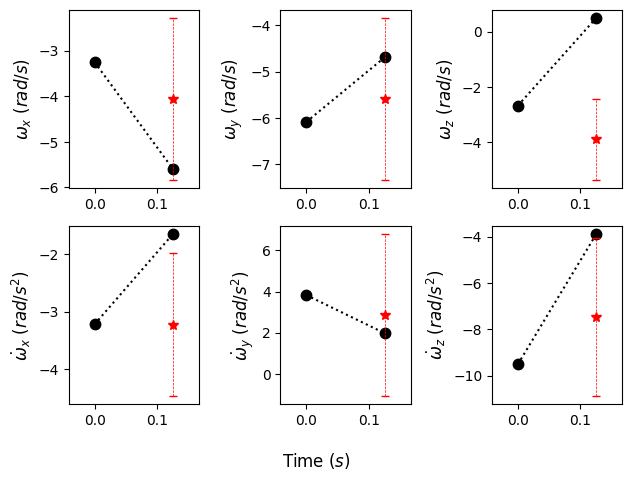

Current Batch Train Loss: 0.003689453937113285

Current Batch Train Loss: 0.003908864688128233

Current Batch Train Loss: 0.0036043799482285976

Current Batch Train Loss: 0.003653296735137701

Current Batch Train Loss: 0.0063824220560491085

Current Batch Train Loss: 0.004321955610066652

Current Batch Train Loss: 0.004107898101210594

Current Batch Train Loss: 0.004031253978610039

Current Batch Train Loss: 0.003963037859648466

Current Batch Train Loss: 0.004098971839994192

Current Batch Train Loss: 0.0037420601584017277

Current Batch Train Loss: 0.0037999453488737345

Current Batch Train Loss: 0.0037964198272675276

Current Batch Train Loss: 0.0038929174188524485

Current Batch Train Loss: 0.0059224809519946575

Current Batch Train Loss: 0.004838159773498774

Current Batch Train Loss: 0.006017932668328285

Current Batch Train Loss: 0.0036793749313801527

Current Batch Train Loss: 0.00441357446834445

Current Batch Train Loss: 0.004598433151841164

Current Batch Train Loss: 0.00377

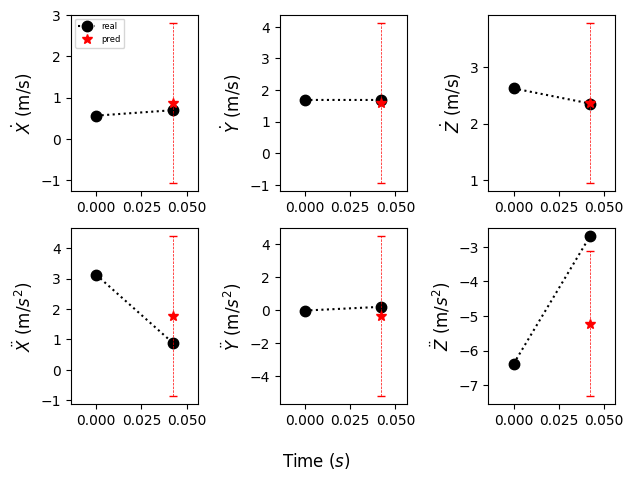

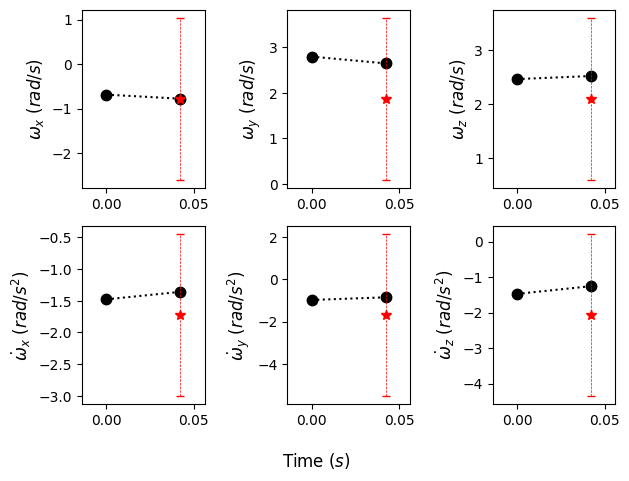

Current Batch Train Loss: 0.003975376952439547

Current Batch Train Loss: 0.004221820272505283

Current Batch Train Loss: 0.004155667498707771

Current Batch Train Loss: 0.0038879287894815207

Current Batch Train Loss: 0.003932055085897446

Current Batch Train Loss: 0.005251084454357624

Current Batch Train Loss: 0.005526391789317131

Current Batch Train Loss: 0.0047838217578828335

Current Batch Train Loss: 0.00416539004072547

Current Batch Train Loss: 0.004738163203001022

Current Batch Train Loss: 0.00411903765052557

Current Batch Train Loss: 0.005510712508112192

Current Batch Train Loss: 0.005521936342120171

Current Batch Train Loss: 0.0036501327995210886

Current Batch Train Loss: 0.0038582943379878998

Current Batch Train Loss: 0.004601528402417898

Current Batch Train Loss: 0.005668032914400101

Current Batch Train Loss: 0.0038473026361316442

Current Batch Train Loss: 0.004838856868445873

Current Batch Train Loss: 0.0035966646391898394

Current Batch Train Loss: 0.00384292

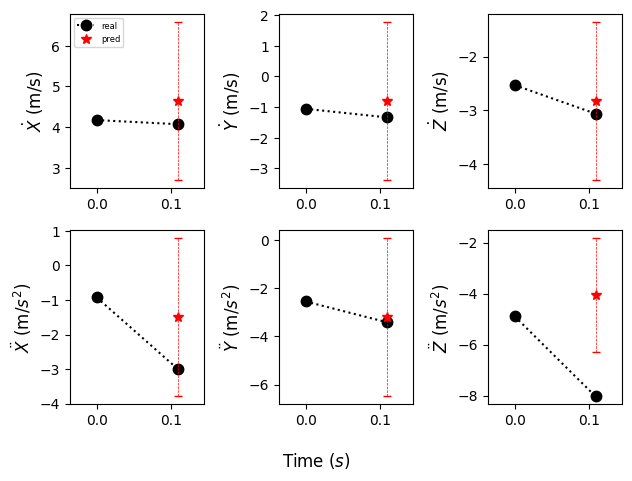

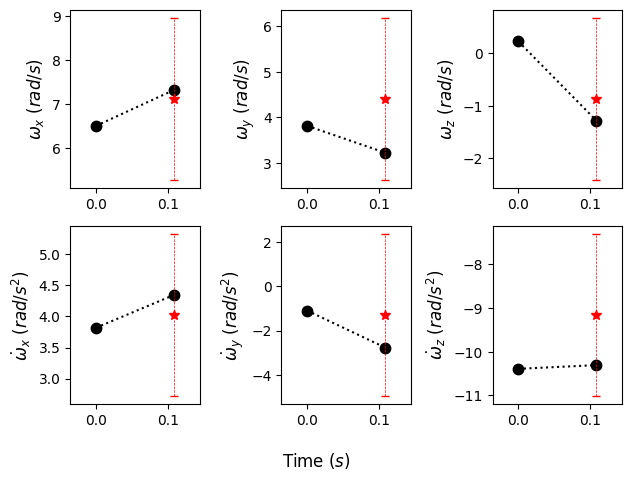

Current Batch Train Loss: 0.004869547672569752

Current Batch Train Loss: 0.004232669714838266

Current Batch Train Loss: 0.0042433771304786205

Current Batch Train Loss: 0.004056969657540321

Current Batch Train Loss: 0.0050668176263570786

Current Batch Train Loss: 0.003961446229368448

Current Batch Train Loss: 0.004664933774620295

Current Batch Train Loss: 0.005389123689383268

Current Batch Train Loss: 0.005508324131369591

Current Batch Train Loss: 0.004330786876380444

Current Batch Train Loss: 0.005533297546207905

Current Batch Train Loss: 0.004313332028687

Current Batch Train Loss: 0.0048879412934184074

Current Batch Train Loss: 0.004398711491376162

Current Batch Train Loss: 0.006170318927615881

Current Batch Train Loss: 0.0037538001779466867

Current Batch Train Loss: 0.004521554335951805

Current Batch Train Loss: 0.004551371093839407

Current Batch Train Loss: 0.003753633238375187

Current Batch Train Loss: 0.0036945492029190063

Current Batch Train Loss: 0.0052508902

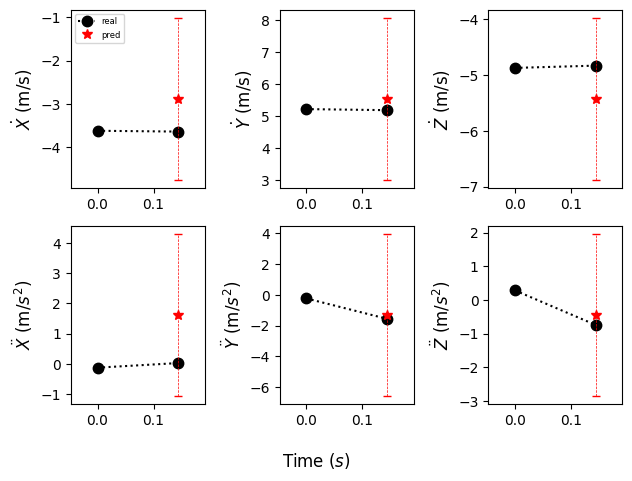

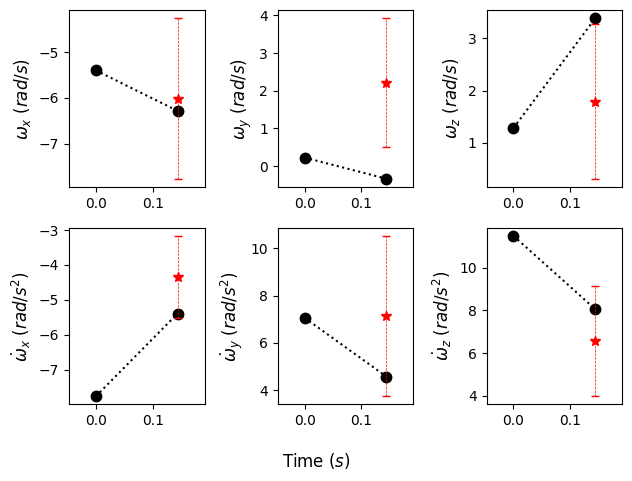

Current Batch Train Loss: 0.004133099224418402

Current Batch Train Loss: 0.004739971831440926

Current Batch Train Loss: 0.004040758591145277

Current Batch Train Loss: 0.0038423582445830107

Current Batch Train Loss: 0.004902400076389313

Current Batch Train Loss: 0.003993405494838953

Current Batch Train Loss: 0.004303305875509977

Current Batch Train Loss: 0.004867113195359707

Current Batch Train Loss: 0.004371023736894131

Current Batch Train Loss: 0.006144490092992783

Current Batch Train Loss: 0.003679482964798808

Current Batch Train Loss: 0.004528198856860399

Current Batch Train Loss: 0.004995566792786121

Current Batch Train Loss: 0.005075311288237572

Current Batch Train Loss: 0.0035482491366565228

Current Batch Train Loss: 0.003890630090609193

Current Batch Train Loss: 0.004205587785691023

Current Batch Train Loss: 0.005734549369663

Current Batch Train Loss: 0.005393488332629204

Current Batch Train Loss: 0.00508837727829814

Current Batch Train Loss: 0.00418260321021

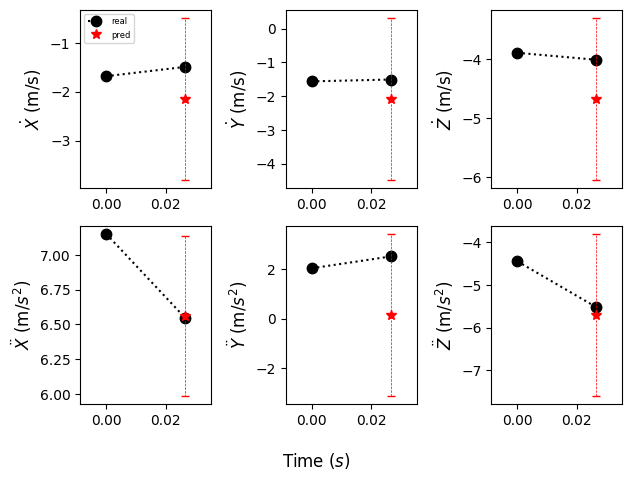

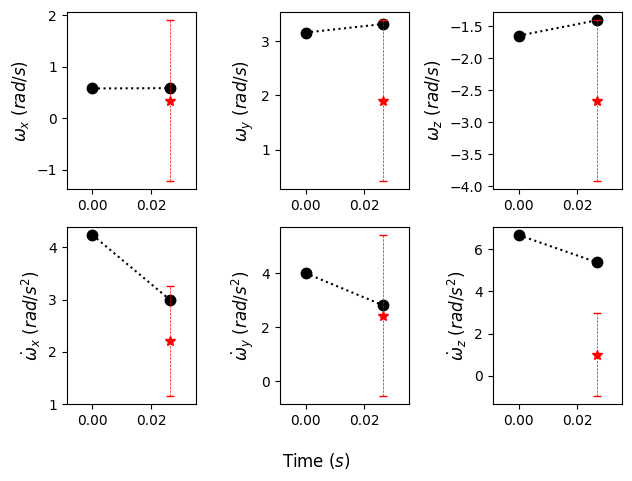

Current Batch Train Loss: 0.003911660518497229

Current Batch Train Loss: 0.004563617520034313

Current Batch Train Loss: 0.0047150603495538235

Current Batch Train Loss: 0.00633809482678771

Current Batch Train Loss: 0.005414552520960569

Current Batch Train Loss: 0.003741753753274679

Current Batch Train Loss: 0.0044799852184951305

Current Batch Train Loss: 0.0042229508981108665

Current Batch Train Loss: 0.0059305415488779545

Current Batch Train Loss: 0.004992026835680008

Current Batch Train Loss: 0.005449914839118719

Current Batch Train Loss: 0.004558719228953123

Current Batch Train Loss: 0.0037481815088540316

Current Batch Train Loss: 0.004809537436813116

Current Batch Train Loss: 0.004195253364741802

Current Batch Train Loss: 0.004387947265058756

Current Batch Train Loss: 0.0068716430105268955

Current Batch Train Loss: 0.003820790909230709

Current Batch Train Loss: 0.0037070780526846647

Current Batch Train Loss: 0.003956492058932781

Current Batch Train Loss: 0.003979

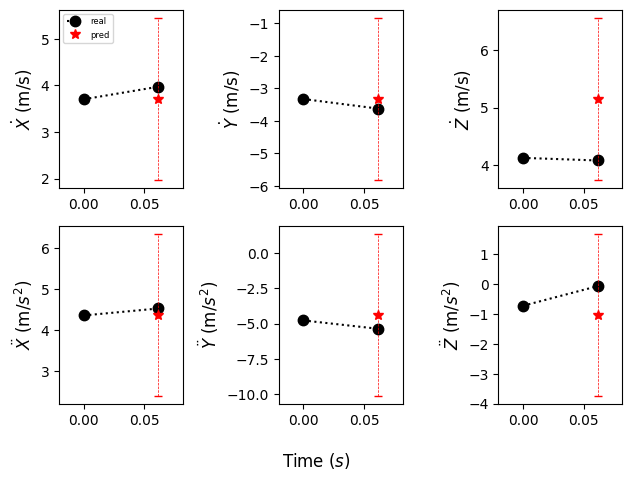

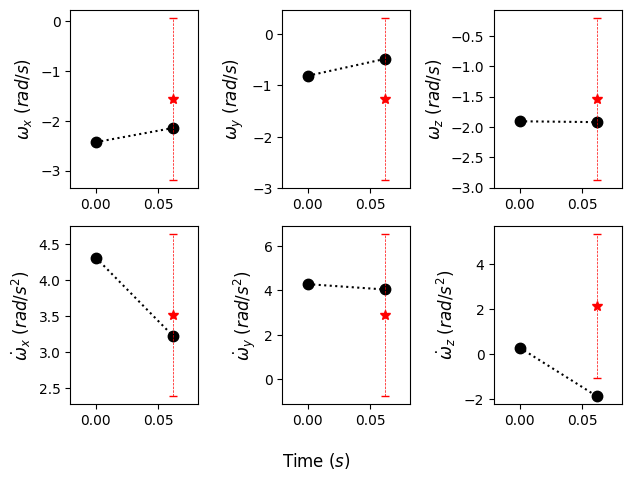

Current Batch Train Loss: 0.004218041431158781

Current Batch Train Loss: 0.006139818113297224

Current Batch Train Loss: 0.003982913214713335

Current Batch Train Loss: 0.006252058781683445

Current Batch Train Loss: 0.0036315603647381067

Current Batch Train Loss: 0.003874751040711999

Current Batch Train Loss: 0.00520390085875988

Current Batch Train Loss: 0.0042626867070794106

Current Batch Train Loss: 0.0054594785906374454

Current Batch Train Loss: 0.0039705983363091946

Current Batch Train Loss: 0.003740481799468398

Current Batch Train Loss: 0.003726427210494876

Current Batch Train Loss: 0.006047646515071392

Current Batch Train Loss: 0.005781012587249279

Current Batch Train Loss: 0.00555124506354332

Current Batch Train Loss: 0.0038398641627281904

Current Batch Train Loss: 0.005208751652389765

Current Batch Train Loss: 0.003910406958311796

Current Batch Train Loss: 0.0038320906460285187

Current Batch Train Loss: 0.0035970467142760754

Current Batch Train Loss: 0.0039354

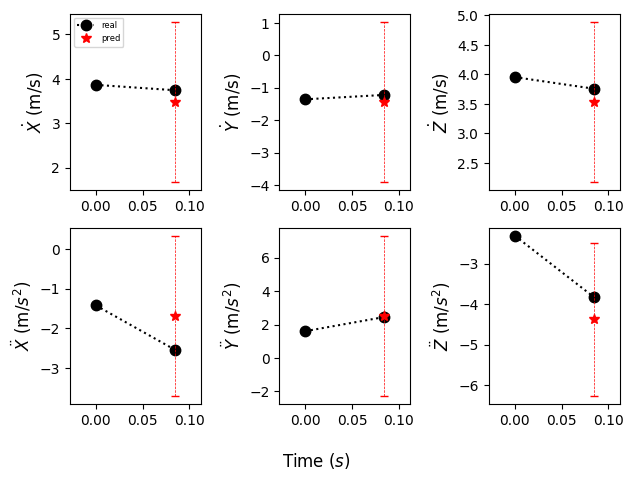

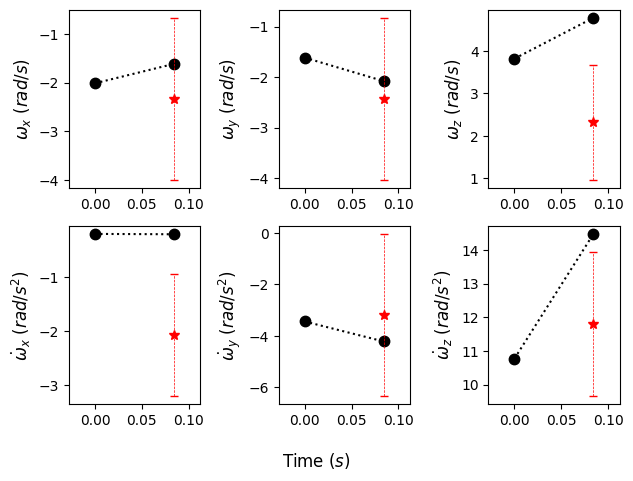

Current Batch Train Loss: 0.003986358176916838

Current Batch Train Loss: 0.004021277651190758

Current Batch Train Loss: 0.0037484944332391024

Current Batch Train Loss: 0.003844307269901037

Current Batch Train Loss: 0.006350911222398281

Current Batch Train Loss: 0.005455871112644672

Current Batch Train Loss: 0.005884525831788778

Current Batch Train Loss: 0.0037368559278547764

Current Batch Train Loss: 0.004099210724234581

Current Batch Train Loss: 0.004438607953488827

Current Batch Train Loss: 0.0035737899597734213

Current Batch Train Loss: 0.004212867934256792

Current Batch Train Loss: 0.0039305659011006355

Current Batch Train Loss: 0.004130681976675987

Current Batch Train Loss: 0.004264862742275

Current Batch Train Loss: 0.004450103733688593

Current Batch Train Loss: 0.004143813159316778

Current Batch Train Loss: 0.005595999304205179

Current Batch Train Loss: 0.004728361498564482

Current Batch Train Loss: 0.0037064652424305677

Current Batch Train Loss: 0.0035269800

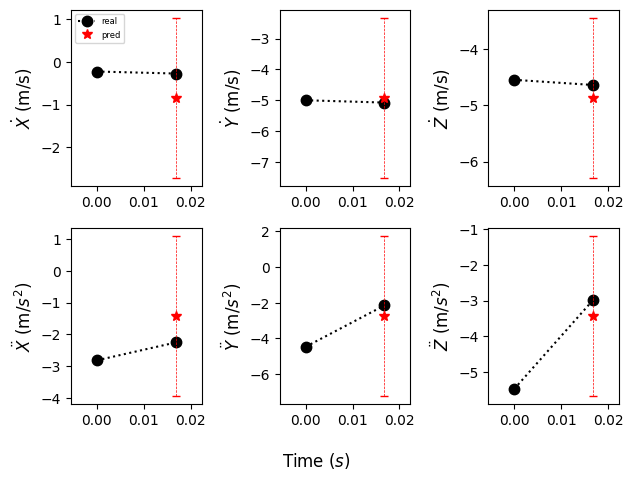

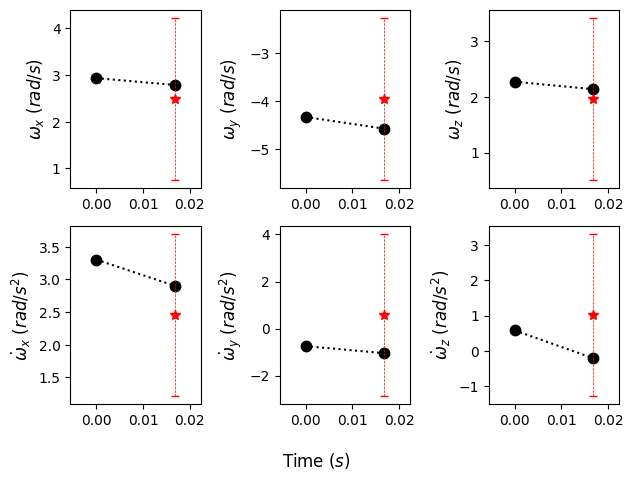

Current Batch Train Loss: 0.004242516588419676

Current Batch Train Loss: 0.00406603142619133

Current Batch Train Loss: 0.0052110617980360985

Current Batch Train Loss: 0.005486420355737209

Current Batch Train Loss: 0.004250949248671532

Current Batch Train Loss: 0.004035838879644871

Current Batch Train Loss: 0.005600844509899616

Current Batch Train Loss: 0.006198493763804436

Current Batch Train Loss: 0.005392391234636307

Current Batch Train Loss: 0.005868064239621162

Current Batch Train Loss: 0.004752079490572214

Current Batch Train Loss: 0.004278998821973801

Current Batch Train Loss: 0.004515344742685556

Current Batch Train Loss: 0.0038916333578526974

Current Batch Train Loss: 0.004203996155411005

Current Batch Train Loss: 0.00447418075054884

Current Batch Train Loss: 0.004853959195315838

Current Batch Train Loss: 0.003595207817852497

Current Batch Train Loss: 0.005373385269194841

Current Batch Train Loss: 0.004582128953188658

Current Batch Train Loss: 0.004932657349

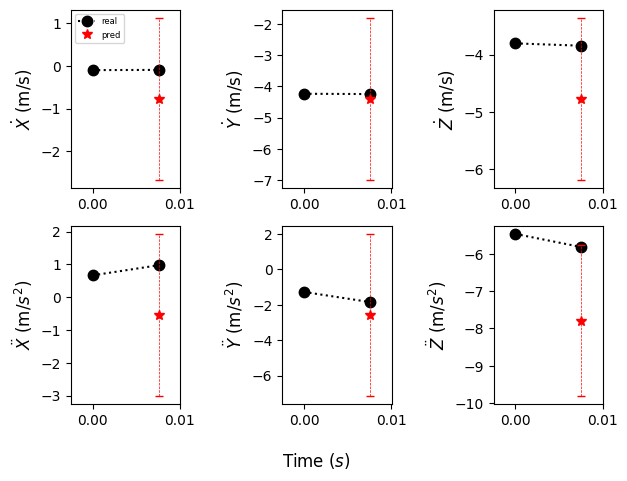

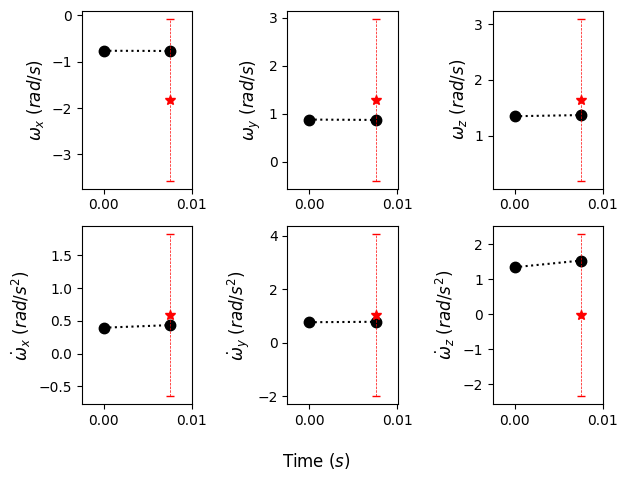

Current Batch Train Loss: 0.004786951467394829

Current Batch Train Loss: 0.003968731500208378

Current Batch Train Loss: 0.003914023749530315

Current Batch Train Loss: 0.0038191822823137045

Current Batch Train Loss: 0.0069716009311378

Current Batch Train Loss: 0.00510479137301445

Current Batch Train Loss: 0.005207526497542858

Current Batch Train Loss: 0.003901276970282197

Current Batch Train Loss: 0.006628616712987423

Current Batch Train Loss: 0.003920897841453552

Current Batch Train Loss: 0.005323159974068403

Current Batch Train Loss: 0.0035551993642002344

Current Batch Train Loss: 0.0049629188142716885

Current Batch Train Loss: 0.004563942551612854

Current Batch Train Loss: 0.0046072956174612045

Current Batch Train Loss: 0.004822337534278631

Current Batch Train Loss: 0.0039098369888961315

Current Batch Train Loss: 0.0055432310327887535

Current Batch Train Loss: 0.0037315269000828266

Current Batch Train Loss: 0.004399845842272043

Current Batch Train Loss: 0.00698306

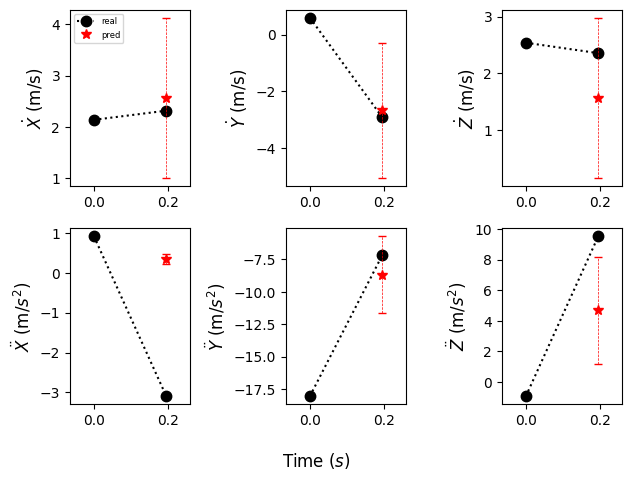

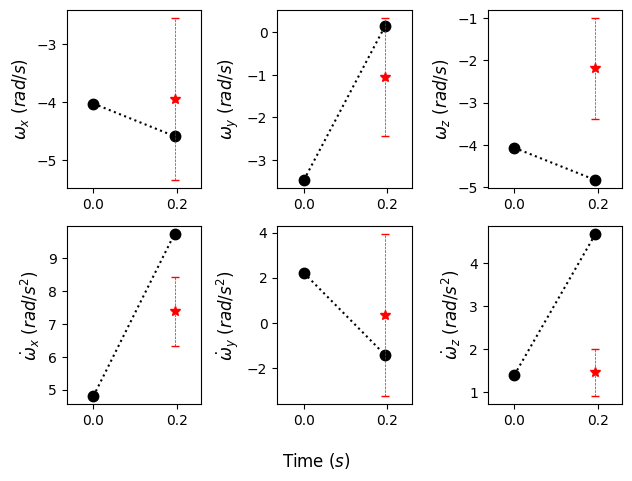

Current Batch Train Loss: 0.004153801128268242

Current Batch Train Loss: 0.005550900474190712

Current Batch Train Loss: 0.004397849552333355

Current Batch Train Loss: 0.003614539746195078

Current Batch Train Loss: 0.004152858164161444

Current Batch Train Loss: 0.0056576780043542385

Current Batch Train Loss: 0.00362544902600348

Current Batch Train Loss: 0.004410147666931152

Current Batch Train Loss: 0.0038708788342773914

Current Batch Train Loss: 0.006162662524729967

Current Batch Train Loss: 0.004361167084425688

Current Batch Train Loss: 0.003598382230848074

Current Batch Train Loss: 0.004524351097643375

Current Batch Train Loss: 0.004441080614924431

Current Batch Train Loss: 0.004267587326467037

Current Batch Train Loss: 0.0035864647943526506

Current Batch Train Loss: 0.004248330835253

Current Batch Train Loss: 0.004165434278547764

Current Batch Train Loss: 0.0038894249591976404

Current Batch Train Loss: 0.004016633611172438

Current Batch Train Loss: 0.005476440768

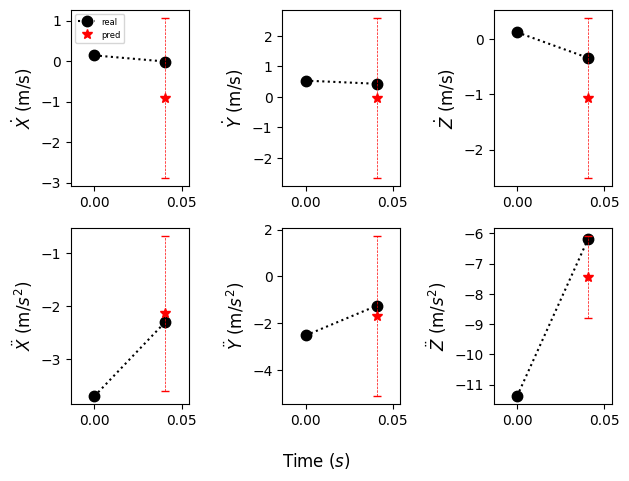

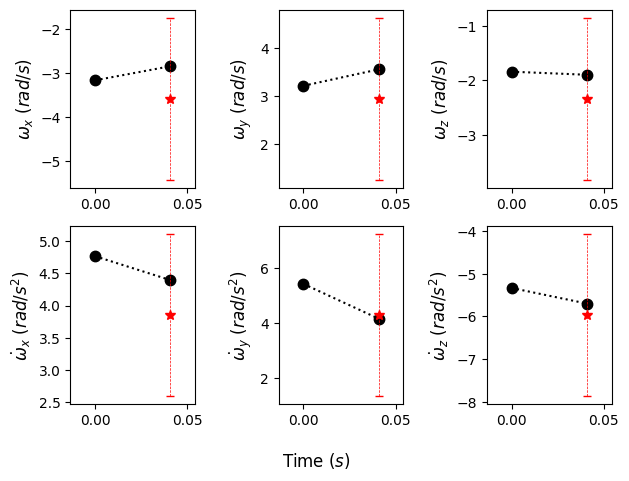

Current Batch Train Loss: 0.003571027424186468

Current Batch Train Loss: 0.003841918893158436

Current Batch Train Loss: 0.004622922278940678

Current Batch Train Loss: 0.004376697354018688

Current Batch Train Loss: 0.004466487560421228

Current Batch Train Loss: 0.0036539966240525246

Current Batch Train Loss: 0.003827734850347042

Current Batch Train Loss: 0.005327409133315086

Current Batch Train Loss: 0.007266579195857048

Current Batch Train Loss: 0.005249824840575457

Current Batch Train Loss: 0.0042767031118273735

Current Batch Train Loss: 0.0044332994148135185

Current Batch Train Loss: 0.00524579593911767

Current Batch Train Loss: 0.0044136326760053635

Current Batch Train Loss: 0.004780729301273823

Current Batch Train Loss: 0.0046618059277534485

Current Batch Train Loss: 0.003801249898970127

Current Batch Train Loss: 0.005098584573715925

Current Batch Train Loss: 0.004282990470528603

Current Batch Train Loss: 0.004868357442319393

Current Batch Train Loss: 0.00649846

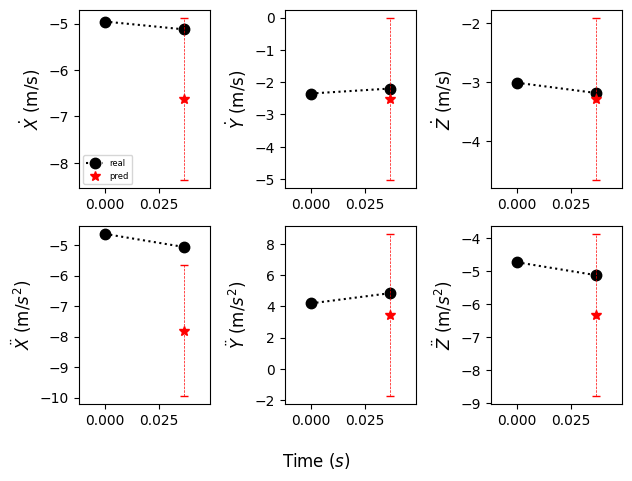

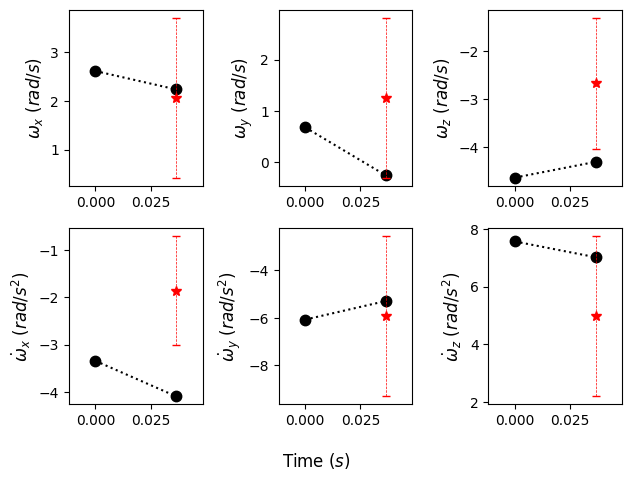

Current Batch Train Loss: 0.0036339000798761845

Current Batch Train Loss: 0.00437996257096529

Current Batch Train Loss: 0.00369885191321373

Current Batch Train Loss: 0.0037709565367549658

Current Batch Train Loss: 0.005132230464369059

Current Batch Train Loss: 0.004404670093208551

Current Batch Train Loss: 0.00401120912283659

Current Batch Train Loss: 0.004565881099551916

Current Batch Train Loss: 0.007236707489937544

Current Batch Train Loss: 0.005372725427150726

Current Batch Train Loss: 0.005829391535371542

Current Batch Train Loss: 0.004605832509696484

Current Batch Train Loss: 0.00364345102570951

Current Batch Train Loss: 0.003758638631552458

Current Batch Train Loss: 0.003556916955858469

Current Batch Train Loss: 0.003673064988106489

Current Batch Train Loss: 0.004895750433206558

Current Batch Train Loss: 0.0040201423689723015

Current Batch Train Loss: 0.004302989691495895

Current Batch Train Loss: 0.0037173216696828604

Current Batch Train Loss: 0.003817652817

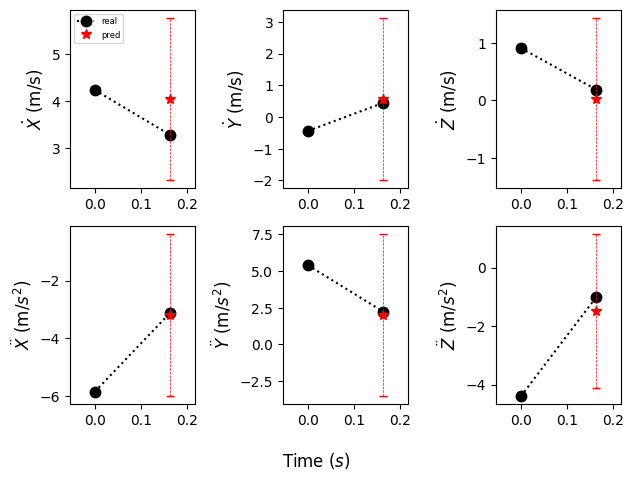

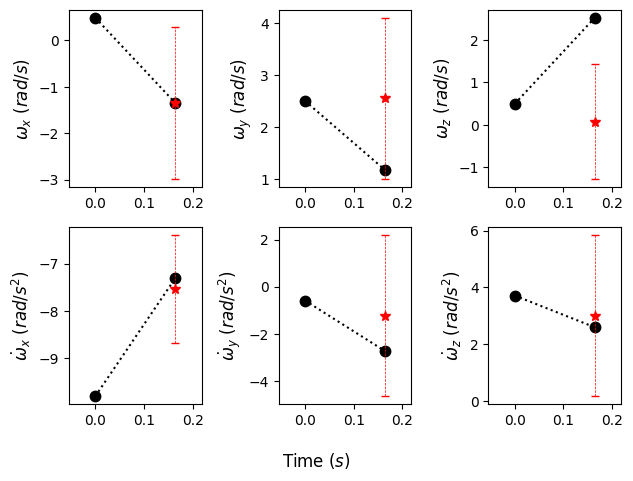

Current Batch Train Loss: 0.004172762855887413

Current Batch Train Loss: 0.003653073450550437

Current Batch Train Loss: 0.004189480096101761

Current Batch Train Loss: 0.00564966443926096

Current Batch Train Loss: 0.003741565626114607

Current Batch Train Loss: 0.004425825551152229

Current Batch Train Loss: 0.0036444927100092173

Current Batch Train Loss: 0.00390255032107234

Current Batch Train Loss: 0.003809288376942277

Current Batch Train Loss: 0.006053667049854994

Current Batch Train Loss: 0.0049536386504769325

Current Batch Train Loss: 0.003912380896508694

Current Batch Train Loss: 0.003800792619585991

Current Batch Train Loss: 0.003720957553014159

Current Batch Train Loss: 0.004931771196424961

Current Batch Train Loss: 0.005316076334565878

Current Batch Train Loss: 0.004382959101349115

Current Batch Train Loss: 0.0038443731609731913

Current Batch Train Loss: 0.003806525841355324

Current Batch Train Loss: 0.0037718473467975855

Current Batch Train Loss: 0.0037874523

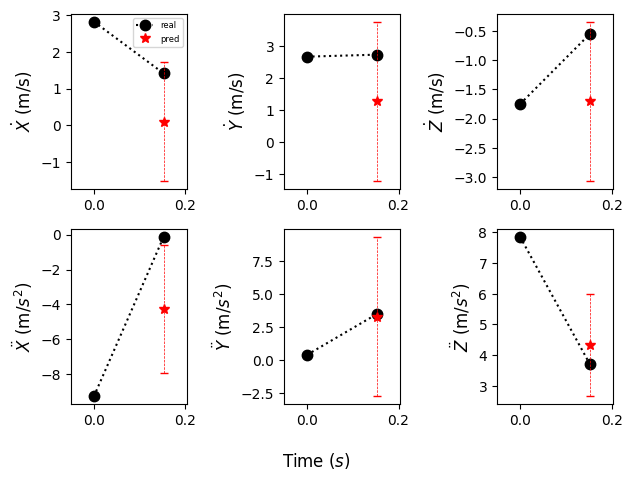

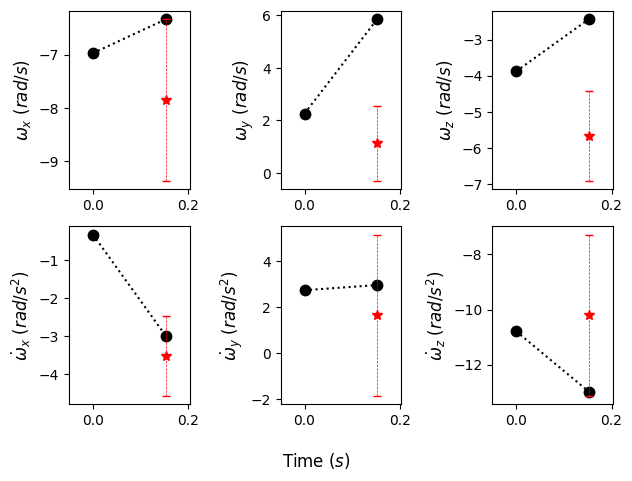

Current Batch Train Loss: 0.004159950185567141

Current Batch Train Loss: 0.0037405556067824364

Current Batch Train Loss: 0.004618463106453419

Current Batch Train Loss: 0.0053949663415551186

Current Batch Train Loss: 0.004567120224237442

Current Batch Train Loss: 0.003472687443718314

Current Batch Train Loss: 0.006236495915800333

Current Batch Train Loss: 0.004275199957191944

Current Batch Train Loss: 0.004394561052322388

Current Batch Train Loss: 0.0035649454221129417

Current Batch Train Loss: 0.0065583097748458385

Current Batch Train Loss: 0.004884183406829834

Current Batch Train Loss: 0.004354473669081926

Current Batch Train Loss: 0.003511875867843628

Current Batch Train Loss: 0.003648617770522833

Current Batch Train Loss: 0.005685955751687288

Current Batch Train Loss: 0.0036423583514988422

Current Batch Train Loss: 0.004262407310307026

Current Batch Train Loss: 0.004397855140268803

Current Batch Train Loss: 0.0038033693563193083

Current Batch Train Loss: 0.004719

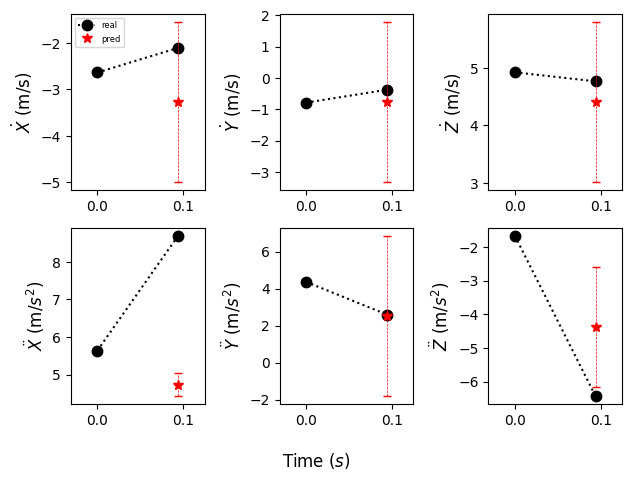

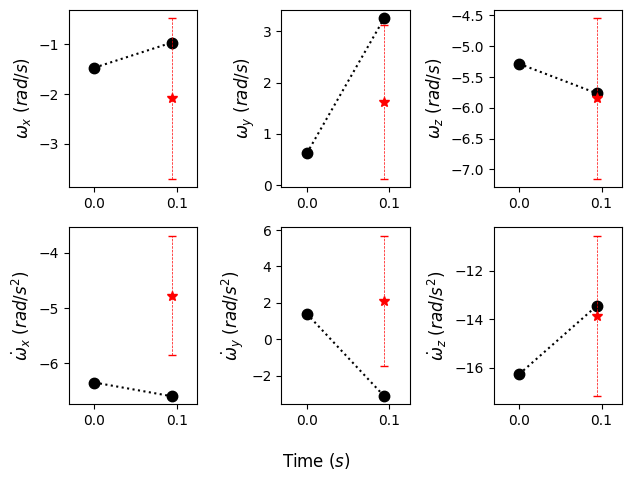

Current Batch Train Loss: 0.0037334400694817305

Current Batch Train Loss: 0.00589653430506587

Current Batch Train Loss: 0.004939611069858074

Current Batch Train Loss: 0.005203838460147381

Current Batch Train Loss: 0.0045776888728141785

Current Batch Train Loss: 0.004399508703500032

Current Batch Train Loss: 0.003659857204183936

Current Batch Train Loss: 0.003924481570720673

Current Batch Train Loss: 0.004848482087254524

Current Batch Train Loss: 0.004066270310431719

Current Batch Train Loss: 0.004652559757232666

Current Batch Train Loss: 0.005737485364079475

Current Batch Train Loss: 0.00576814915984869

Current Batch Train Loss: 0.0038433114532381296

Current Batch Train Loss: 0.005167157389223576

Current Batch Train Loss: 0.003793387208133936

Current Batch Train Loss: 0.003691430203616619

Current Batch Train Loss: 0.00400232058018446

Current Batch Train Loss: 0.00606863759458065

Current Batch Train Loss: 0.00371222454123199

Current Batch Train Loss: 0.00432463223114

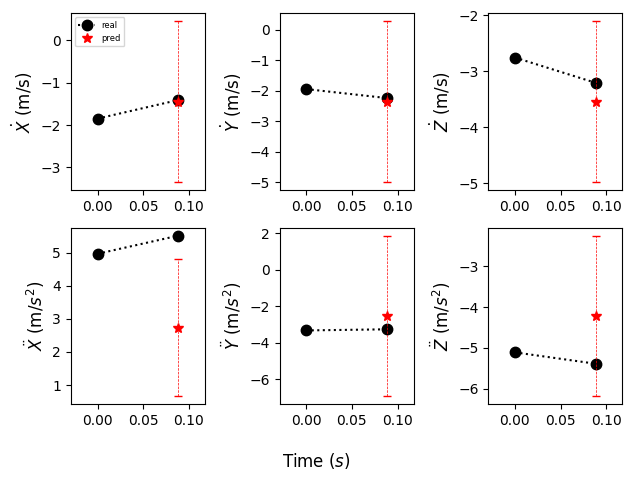

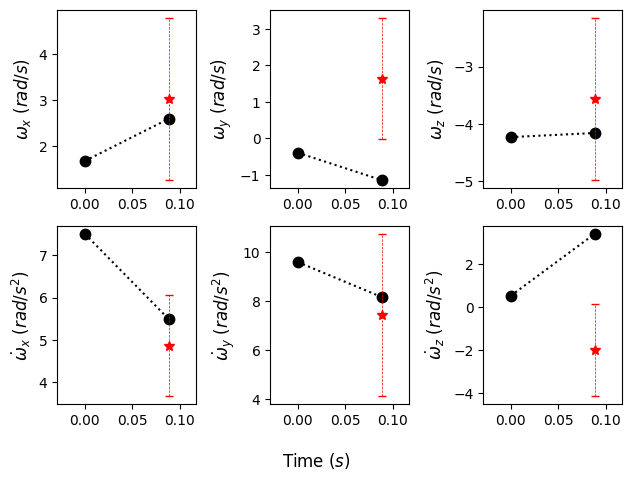

Current Batch Train Loss: 0.0038489827420562506

Current Batch Train Loss: 0.004373315256088972

Current Batch Train Loss: 0.003672190709039569

Current Batch Train Loss: 0.004761156160384417

Current Batch Train Loss: 0.003985202871263027

Current Batch Train Loss: 0.0035689338110387325

Current Batch Train Loss: 0.004130704328417778

Current Batch Train Loss: 0.003754945704713464

Current Batch Train Loss: 0.0045217229053378105

Current Batch Train Loss: 0.006586553994566202

Current Batch Train Loss: 0.0037904581986367702

Current Batch Train Loss: 0.004421306774020195

Current Batch Train Loss: 0.005656734108924866

Current Batch Train Loss: 0.004078287165611982

Current Batch Train Loss: 0.003916325978934765

Current Batch Train Loss: 0.0037064964417368174

Current Batch Train Loss: 0.004343902692198753

Current Batch Train Loss: 0.004846314899623394

Current Batch Train Loss: 0.006639274302870035

Current Batch Train Loss: 0.003726127790287137

Current Batch Train Loss: 0.0043516

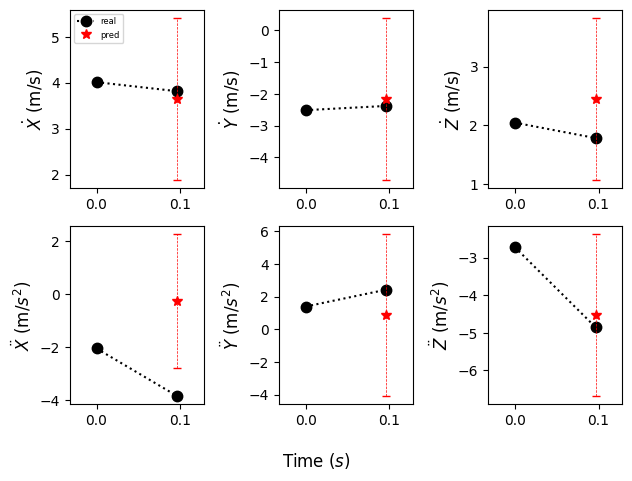

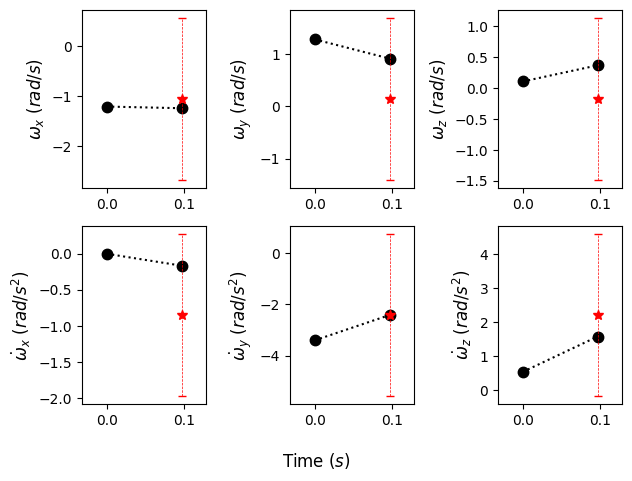

Current Batch Train Loss: 0.0064866975881159306

Current Batch Train Loss: 0.003814274910837412

Current Batch Train Loss: 0.004107941407710314

Current Batch Train Loss: 0.004250700119882822

Current Batch Train Loss: 0.005237021949142218

Current Batch Train Loss: 0.0038634331431239843

Current Batch Train Loss: 0.003992028068751097

Current Batch Train Loss: 0.0037821312434971333

Current Batch Train Loss: 0.0037080044858157635

Current Batch Train Loss: 0.00392524478957057

Current Batch Train Loss: 0.005385546013712883

Current Batch Train Loss: 0.0041664112359285355

Current Batch Train Loss: 0.004655010066926479

Current Batch Train Loss: 0.0038250491488724947

Current Batch Train Loss: 0.004450981505215168

Current Batch Train Loss: 0.004984103608876467

Current Batch Train Loss: 0.005394570995122194

Current Batch Train Loss: 0.005668889731168747

Current Batch Train Loss: 0.004824673756957054

Current Batch Train Loss: 0.004038884304463863

Current Batch Train Loss: 0.0062025

In [24]:
# Initializing DKF model
model = DeepKalmanFilter(
    hidden_size=128,
    observed_size=12,
    latent_size=12,
    control_size=4
)
#model = torch.load('vel+accel-high-disturbance-no-noise-dkf-40-epochs.pt')

# Initializing model's loss function and optimizer
criterion = DKFLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3, weight_decay=1e-6, amsgrad=True)

# Initializing training + validation loss tracker
train_loss_array = np.array([])
train_iter_array = np.array([])
val_loss_array = np.array([])
val_latent_AAE_array = np.array([])
val_observed_AAE_array = np.array([])
val_epoch_array = np.array([])

# Defining indexes of sequence length
input_seq_idx = 21
output_seq_idx = 27
observed_seq_idx = 12
latent_seq_idx = 12

# Initializing training loop
i = 0
for epoch in range(NUM_EPOCHS+1):
  if epoch % PLOT_AFTER == 0:
    with torch.no_grad():

      # Sampling random validation batch
      idx = random.randint(0, test_dataset.shape[0]-BATCH_SIZE)
      batch_latent_transitions = torch.concat([test_dataset[idx:idx+BATCH_SIZE,:input_seq_idx], test_dataset[idx:idx+BATCH_SIZE,output_seq_idx:]], dim=-1)
      batch_observed_transitions = torch.concat([test_dataset[idx:idx+BATCH_SIZE,:input_seq_idx], test_dataset[idx:idx+BATCH_SIZE,output_seq_idx:]], dim=-1)
      next_x_states = batch_observed_transitions[:,input_seq_idx:]
      next_z_states = batch_latent_transitions[:,input_seq_idx:]
      prev_x_states = test_dataset_unnorm[idx:idx+BATCH_SIZE, :observed_seq_idx]
      prev_z_states = test_dataset_unnorm[idx:idx+BATCH_SIZE, :latent_seq_idx]      
      input_unnorm = torch.concat([prev_x_states,
                                   prev_z_states,
                                   test_dataset_unnorm[idx:idx+BATCH_SIZE, latent_seq_idx+1:output_seq_idx]], dim=-1)

      dt_array = batch_observed_transitions[:,12]

    # Collecting predicted outputs + their associated variances + loss info
    # from comparing to ground-truth dynamical data
    z_pred, P_z, x_pred, R_x = model(batch_latent_transitions, batch_observed_transitions, is_testing=True)

    # Collecting loss from prediction
    #residual_loss = compute_batch_residuals(batch_latent_transitions, batch_observed_transitions, input_unnorm, dt_array)
    loss_test = criterion(x_pred, next_x_states, z_pred, next_z_states)

    # Unnormalizing data for plotting and computing AAE
    next_x_states, x_pred = db.minmax_unnorm(next_x_states, x_pred)
    next_z_states, z_pred = db.minmax_unnorm(next_z_states, z_pred)

    # Computing average absolute error (AAE) over current testing batch
    latent_AE_array, observed_AE_array = compute_AE(next_z_states.detach().numpy(), 
                                                    z_pred.detach().numpy(), 
                                                    next_x_states.detach().numpy(), 
                                                    x_pred.detach().numpy())
    
    latent_test_batch_AAE = np.mean(latent_AE_array)
    latent_test_batch_AAE_std = np.std(latent_AE_array)
    observed_test_batch_AAE = np.mean(observed_AE_array)
    observed_test_batch_AAE_std = np.std(observed_AE_array)
    val_latent_AAE_array = np.concatenate([val_latent_AAE_array, np.array([latent_test_batch_AAE])], axis=0)
    val_observed_AAE_array = np.concatenate([val_observed_AAE_array, np.array([observed_test_batch_AAE])], axis=0)
    # Recording performance after every 'PLOT_AFTER' iterations
    print(f"Epoch: {epoch}, Batch Testing Loss: {loss_test},\nBatch Latent Average AE: {latent_test_batch_AAE} w/ StdDev: {latent_test_batch_AAE_std}, Batch Observed Average AE: {observed_test_batch_AAE} w/ StdDev: {observed_test_batch_AAE_std}\n")

    # Plotting testing GP sample vs the corresponding LNP prediction
    plot_all_functions(prev_x_states, x_pred, next_x_states, prev_z_states, z_pred, next_z_states, P_z, dt_array)
    
    # Collecting validation loss history
    val_loss_array = np.concatenate([val_loss_array, np.array([loss_test.detach().numpy()])], axis=0)
    val_epoch_array = np.concatenate([val_epoch_array, np.array([epoch])], axis=0)

  # Executing training loop
  for batch in range(0, train_dataset.shape[0], BATCH_SIZE):

    # Parsing batch datasets
    batch_latent_transitions = torch.concat([train_dataset[batch:batch+BATCH_SIZE,:input_seq_idx], train_dataset[batch:batch+BATCH_SIZE,output_seq_idx:]], dim=-1)
    batch_observed_transitions = torch.concat([train_dataset[batch:batch+BATCH_SIZE,:input_seq_idx], train_dataset[batch:batch+BATCH_SIZE,output_seq_idx:]], dim=-1)
    next_x_states = batch_observed_transitions[:, input_seq_idx:]
    next_z_states = batch_latent_transitions[:, input_seq_idx:]
    prev_x_states = train_dataset_unnorm[batch:batch+BATCH_SIZE, :observed_seq_idx]
    prev_z_states = train_dataset_unnorm[batch:batch+BATCH_SIZE, :latent_seq_idx]      
    input_unnorm = torch.concat([prev_x_states,
                                 prev_z_states,
                                 train_dataset_unnorm[batch:batch+BATCH_SIZE, latent_seq_idx+1:output_seq_idx]], dim=-1)

    dt_array = batch_observed_transitions[:,12]

    # zero the parameter gradients for each batch
    optimizer.zero_grad()

    # forward + back propogation + optimizer step
    z_pred, P_z, x_pred, R_x  = model(batch_latent_transitions, batch_observed_transitions)
    #residual_loss = compute_batch_residuals(batch_latent_transitions, batch_observed_transitions, input_unnorm, dt_array)
    loss_train = criterion(x_pred, next_x_states, z_pred, next_z_states)
    loss_train.backward()
    optimizer.step()

    # Collecting training loss history after every 'COLLECT_LOSS_AFTER' iters
    if i % COLLECT_TRAINING_LOSS_AFTER == 1:
      print(f"Current Batch Train Loss: {loss_train.item()}\n")
      train_loss_array = np.concatenate([train_loss_array, np.array([loss_train.detach()])], axis=0)
      train_iter_array = np.concatenate([train_iter_array, np.array([i])], axis=0)
    i += 1

  train_dataset, train_dataset_unnorm = shuffle_data(train_dataset, train_dataset_unnorm)

In [17]:
x_pred

tensor([[0.5490, 0.4163, 0.3874,  ..., 0.4958, 0.4371, 0.5733],
        [0.5823, 0.5180, 0.4275,  ..., 0.5155, 0.4933, 0.4853],
        [0.4667, 0.5517, 0.3447,  ..., 0.4941, 0.5170, 0.4885],
        ...,
        [0.3488, 0.6386, 0.3841,  ..., 0.5107, 0.5451, 0.4702],
        [0.5868, 0.5884, 0.5196,  ..., 0.5181, 0.5187, 0.5468],
        [0.4371, 0.5231, 0.4882,  ..., 0.4720, 0.5092, 0.5292]],
       grad_fn=<ExpandBackward0>)

In [26]:
torch.save(model, 'vel+accel-high-disturbance-mass-varying-dkf-100-epochs.pt')

In [51]:
P_z

tensor([[[ 7.6533e+00,  1.3300e+00,  1.2730e+00,  ...,  6.2941e-01,
           6.1526e-01,  5.5823e-01],
         [ 1.3300e+00,  4.2952e+00,  3.9422e-01,  ...,  6.3972e-01,
           8.6387e-01,  1.4908e+00],
         [ 1.2730e+00,  3.9422e-01,  4.8919e+00,  ...,  3.9391e-01,
           6.5970e-01,  2.5479e-01],
         ...,
         [ 6.2941e-01,  6.3972e-01,  3.9391e-01,  ...,  4.3070e-01,
           6.0818e-01,  5.6926e-01],
         [ 6.1526e-01,  8.6387e-01,  6.5970e-01,  ...,  6.0818e-01,
           8.6675e+00,  5.3475e-01],
         [ 5.5823e-01,  1.4908e+00,  2.5479e-01,  ...,  5.6926e-01,
           5.3475e-01,  2.8998e+00]],

        [[ 2.6897e+00,  1.7309e+00,  2.0019e+00,  ...,  8.8899e-01,
           7.8120e-01,  5.4208e-01],
         [ 1.7309e+00,  6.1760e+00,  4.6466e-01,  ...,  5.5175e-01,
           8.6085e-01,  1.3336e+00],
         [ 2.0019e+00,  4.6466e-01,  4.3181e+00,  ...,  3.4885e-01,
           5.1883e-01,  1.2774e-01],
         ...,
         [ 8.8899e-01,  5

In [18]:
torch.save(model, 'vel+accel-high-disturbance-mm-noise-88-epochs-DKF.pt')

In [ ]:
x_pred.shape

torch.Size([2000, 12])

In [34]:
loss_train

tensor(0.0008, grad_fn=<AddBackward0>)

In [ ]:
torch.save(model, 'vel+accel-no-disturbance-270-epochs-DKF.pt')

In [35]:
for name, param in model.named_parameters():
    if param.requires_grad:
        print(f"name: {name}, param.data, {param.data}")

name: transition_net.fc1.weight, param.data, tensor([[-1.5100e-02,  1.3957e-01, -2.0088e-01,  ..., -2.9321e-02,
          8.8974e-02,  2.0708e-01],
        [-5.2516e-37, -5.2572e-37,  5.0343e-37,  ..., -1.6533e-37,
          4.4455e-37,  5.1399e-37],
        [ 2.1814e-01,  2.5457e-01,  1.6413e-01,  ..., -1.8035e-01,
         -2.5887e-02,  1.5108e-01],
        ...,
        [-6.7169e-02,  9.6872e-02,  2.7530e-03,  ..., -4.2396e-02,
          7.3174e-04, -5.1592e-01],
        [-1.0005e-01,  2.3948e-01,  1.1722e-02,  ...,  2.1354e-01,
          1.7552e-01,  1.5591e-01],
        [-1.3391e-01, -4.6497e-01,  8.6910e-02,  ..., -5.1699e-02,
          9.7952e-02,  1.7977e-02]])
name: transition_net.fc1.bias, param.data, tensor([ 2.3369e-01, -4.8580e-37, -8.9375e-03,  1.3213e-01,  1.6942e-01,
        -5.3707e-37,  9.5631e-02,  2.8037e-02,  1.1393e-01,  2.4592e-01,
        -4.6943e-37,  2.3281e-01,  1.5272e-01,  1.9227e-02, -1.7304e-02,
         6.6096e-02,  5.2453e-02, -3.8669e-37,  2.1490e-01,  

In [36]:
test_db = Quadrotor_Dynamics_Generator(normalize=False)
test_traj = test_db.generate_test_traj(seq_length=100, gaussian_noise=True, seq_split=True)

In [52]:
test_traj

array([[0.48233774, 0.46985844, 0.54788166, ..., 0.50040394, 0.50094062,
        0.51162672],
       [0.47609851, 0.48076767, 0.54566455, ..., 0.49343723, 0.50156838,
        0.51288044],
       [0.46106139, 0.47840244, 0.52122194, ..., 0.46825251, 0.5057869 ,
        0.53099185],
       ...,
       [0.54911435, 0.53061604, 0.49618232, ..., 0.50117075, 0.50347102,
        0.52183974],
       [0.5417493 , 0.535739  , 0.49684379, ..., 0.50366557, 0.50259638,
        0.519696  ],
       [0.54679978, 0.54319543, 0.509664  , ..., 0.49307862, 0.51222765,
        0.52418828]])

In [8]:
def compute_AE(state_vec, pred_state_vec):
  # Computing absolute prediction error (AE)
  state_diff = np.abs(state_vec - pred_state_vec)
  AE_array = np.sum(state_diff, axis=1)
  
  return AE_array

def scaled_compute_AE(state_vec, pred_state_vec):
  # Computing absolute prediction error (AE)
  scaled_state_diff = np.abs((state_vec - pred_state_vec) / state_vec) * 100
  scaled_AE_array = np.mean(scaled_state_diff)

  return scaled_AE_array

In [66]:
# Initializing models used in evaluation
model1 = torch.load('vel+accel-high-disturbance-no-noise-dkf-12-epochs.pt')
model_list = [model1]
num_models = len(model_list)

# Initializing quadrotor sensor noise/disturbance parameters
'''
num_perturb_profiles = 1
perturb_params = np.zeros([num_perturb_profiles,6])
rotor_spike_profile = 100 * np.ones([num_perturb_profiles,]) #np.linspace(0,100,num_perturb_profiles)
gps_bias_profile = 1e-2 * np.ones([num_perturb_profiles,]) #np.linspace(0, 0.2, num_perturb_profiles)
gps_std_profile = 1e-1 * np.ones([num_perturb_profiles,]) #np.linspace(1e-5,0.6,num_perturb_profiles)
gyro_bias_profile = 1e-3 * np.ones([num_perturb_profiles,]) #np.linspace(0,0.5,num_perturb_profiles)
gyro_std_profile = 1e-5 * np.ones([num_perturb_profiles,]) #np.linspace(1e-5,1e-2,num_perturb_profiles)
disturb_quad_at_array = 100#np.linspace(1,100,num_perturb_profiles)

perturb_params[:,0] = rotor_spike_profile
perturb_params[:,1] = gps_bias_profile
perturb_params[:,2] = gps_std_profile
perturb_params[:,3] = gyro_bias_profile
perturb_params[:,4] = gyro_std_profile
perturb_params[:,5] = disturb_quad_at_array
'''

# Sampling random trajectory data 
sample_length = 100
test_db = Quadrotor_Dynamics_Generator()
#test_traj = test_db.generate_test_traj(seq_length=sample_length, gaussian_noise=False, seq_split=True)
#test_traj = test_traj.unsqueeze(dim=0)
orig_traj = torch.from_numpy(np.load('test_traj_GT.npy'))
orig_traj = test_db.minmax_norm(orig_traj)
test_traj = test_db.sequential_split(orig_traj)
test_AAE_array = np.zeros([num_models, sample_length])

# Defining test trajectory time array
time_array = np.zeros([sample_length,])

# Initializing array that will contain model predictions
eval_data = torch.zeros([num_models, 3, sample_length, 12])
eval_data[:,0,0:1,:] = torch.tile(torch.unsqueeze(test_traj[0:1,:12], dim=0), dims=[num_models, 1, 1])


# Initializing plotting parameters
Xdot = np.zeros([num_models, sample_length])
Ydot = np.zeros([num_models, sample_length])
Zdot = np.zeros([num_models, sample_length])
ωx = np.zeros([num_models, sample_length])
ωy = np.zeros([num_models, sample_length])
ωz = np.zeros([num_models, sample_length])
Xdot_pred = np.zeros([num_models, sample_length])
Ydot_pred = np.zeros([num_models, sample_length])
Zdot_pred = np.zeros([num_models, sample_length])
ωx_pred = np.zeros([num_models, sample_length])
ωy_pred = np.zeros([num_models, sample_length])
ωz_pred = np.zeros([num_models, sample_length])

Xdot_var = np.zeros([num_models, sample_length])
Ydot_var = np.zeros([num_models, sample_length])
Zdot_var = np.zeros([num_models, sample_length])
ωx_var = np.zeros([num_models, sample_length])
ωy_var = np.zeros([num_models, sample_length])
ωz_var = np.zeros([num_models, sample_length])


# Looping through entire test trajectory
for mdl in range(num_models):

  # Setting 'curr_model' to next model in list
  curr_model = model_list[mdl]
  
  # Resetting time counter
  curr_time = 0

  # Initializing first context as first state estimate
  #next_context = test_traj[0:1,0:1,:20]

  for i in range(sample_length):

    curr_sample = test_traj[i:i+1,:]
    #curr_sample[:,0:1,8:] = next_context
    batch_latent_transitions = torch.concat([curr_sample[:,:20], curr_sample[:,26:]], dim=-1)
    batch_observed_transitions = torch.concat([curr_sample[:,:20], curr_sample[:,26:]], dim=-1)
    next_z_states = batch_latent_transitions[:,20:]

    curr_dt = curr_sample[:,12]
    curr_time += curr_dt 
    time_array[i] = curr_time.detach().numpy()

    # Forward pass of DKF
    z_pred, P_z, _, _ = model(batch_latent_transitions, batch_observed_transitions, is_testing=True)

    # Unnormalizing data for plotting and computing AAE
    next_z_states, z_pred = test_db.minmax_unnorm(next_z_states, z_pred)
    
    # Computing average absolute error (AAE) over current testing batch
    AE_array = compute_AE(next_z_states.detach().numpy(), z_pred.detach().numpy())
    test_AAE_array[mdl, i] = AE_array

    eval_data[mdl,0:1,i:i+1,:] = next_z_states
    eval_data[mdl,1:2,i:i+1,:] = z_pred
    eval_data[mdl,2:3,i:i+1,:] = torch.diagonal(P_z[0,:,:])

    #next_context = test_traj[i:i+1,1:2,8:] #pred_y[:,1:2,:]


  # Unnormalizing true states, their predictions, and associated variances for plotting
  Xdot[mdl,:] = eval_data[mdl,0,:,0].detach().numpy() #* ((minmax_data[8,1] - minmax_data[8,0]) + minmax_data[8,0]).detach().numpy()
  Ydot[mdl,:] = eval_data[mdl,0,:,1].detach().numpy() #* ((minmax_data[9,1] - minmax_data[9,0]) + minmax_data[9,0]).detach().numpy()
  Zdot[mdl,:] = eval_data[mdl,0,:,2].detach().numpy() #* ((minmax_data[10,1] - minmax_data[10,0]) + minmax_data[10,0]).detach().numpy()

  Xdot_pred[mdl,:] = eval_data[mdl,1,:,0].detach().numpy() #* ((minmax_data[8,1] - minmax_data[8,0]) + minmax_data[8,0]).detach().numpy()
  Ydot_pred[mdl,:] = eval_data[mdl,1,:,1].detach().numpy() #* ((minmax_data[9,1] - minmax_data[9,0]) + minmax_data[9,0]).detach().numpy()
  Zdot_pred[mdl,:] = eval_data[mdl,1,:,2].detach().numpy() #* ((minmax_data[10,1] - minmax_data[10,0]) + minmax_data[10,0]).detach().numpy()
  
  ωx[mdl,:] = eval_data[mdl,0,:,6].detach().numpy() #* ((minmax_data[14,1] - minmax_data[14,0]) + minmax_data[14,0]).detach().numpy()
  ωy[mdl,:] = eval_data[mdl,0,:,7].detach().numpy() #* ((minmax_data[15,1] - minmax_data[15,0]) + minmax_data[15,0]).detach().numpy()
  ωz[mdl,:] = eval_data[mdl,0,:,8].detach().numpy() #* ((minmax_data[16,1] - minmax_data[16,0]) + minmax_data[16,0]).detach().numpy()
  
  ωx_pred[mdl,:] = eval_data[mdl,1,:,6].detach().numpy() #* ((minmax_data[14,1] - minmax_data[14,0]) + minmax_data[14,0]).detach().numpy()
  ωy_pred[mdl,:] = eval_data[mdl,1,:,7].detach().numpy() #* ((minmax_data[15,1] - minmax_data[15,0]) + minmax_data[15,0]).detach().numpy()
  ωz_pred[mdl,:] = eval_data[mdl,1,:,8].detach().numpy() #* ((minmax_data[16,1] - minmax_data[16,0]) + minmax_data[16,0]).detach().numpy()
  
  Xdot_var[mdl,:] = eval_data[mdl,2,:,0].detach().numpy() #* ((minmax_data[8,1] - minmax_data[8,0])).detach().numpy())
  Ydot_var[mdl,:] = eval_data[mdl,2,:,1].detach().numpy() #* ((minmax_data[9,1] - minmax_data[9,0])).detach().numpy())
  Zdot_var[mdl,:] = eval_data[mdl,2,:,2].detach().numpy() #* ((minmax_data[10,1] - minmax_data[10,0])).detach().numpy())
  
  ωx_var[mdl,:] = eval_data[mdl,2,:,6].detach().numpy() #* ((minmax_data[14,1] - minmax_data[14,0]) + minmax_data[14,0]).detach().numpy())
  ωy_var[mdl,:] = eval_data[mdl,2,:,7].detach().numpy() #* ((minmax_data[15,1] - minmax_data[15,0]) + minmax_data[15,0]).detach().numpy())
  ωz_var[mdl,:] = eval_data[mdl,2,:,8].detach().numpy() #* ((minmax_data[16,1] - minmax_data[16,0]) + minmax_data[16,0]).detach().numpy())


model_AAE_array = np.mean(test_AAE_array, axis=1)
#print(f"AAE Results\nNo Noise/Disturbance: {model_AAE_array[2]}, Medium Noise/Disturbance: {model_AAE_array[1]}, High Noise/Disturbance: {model_AAE_array[0]}")

/tmp/ipykernel_3930/857782015.py:87: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  time_array[i] = curr_time.detach().numpy()
/tmp/ipykernel_3930/857782015.py:97: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  test_AAE_array[mdl, i] = AE_array


In [143]:
test_traj.shape

torch.Size([200, 38])

In [67]:
model_AAE_array

array([7.66519199])

In [68]:
test_AAE_array

array([[ 7.73788452,  7.79681969, 19.10459518, 22.74589348,  5.94246292,
         7.17219162,  7.93509865,  4.192873  ,  4.25591278,  9.7215004 ,
         3.09864998,  2.81710243,  8.75456238,  4.37026978,  8.83147049,
         4.8615818 ,  4.85653496,  4.2341423 ,  8.13544846, 10.30160141,
         6.08148956,  5.91336632,  9.95262146,  6.10653687,  7.61592484,
         6.4824276 ,  5.52167511,  4.59312439,  4.12436867,  1.84252548,
         3.16901207,  3.65171623,  6.81139755,  5.42155838,  5.03119469,
         5.35847092, 10.36417389,  5.19887352,  8.75117302, 11.9094677 ,
         8.0513382 ,  6.57366371,  6.77037239,  8.66557884,  9.66830254,
         7.89365768, 11.53246117,  8.18900108,  7.22995758,  9.71905708,
         8.828228  ,  8.90396309,  6.81425095, 12.0004158 ,  9.49840736,
         9.07663345, 11.09458351,  6.79385567,  7.96754456,  6.78827477,
         7.3321476 ,  7.28245354,  8.78312874,  8.86284828, 10.06302643,
         4.23841095,  9.21133041,  4.81368065,  7.0

### Plotting Predictions vs Ground-Truth

In [69]:
# Defining length of plotted trajectories (ensure its <= to sample_length)
plt_idx = 120

(Text(0.5, 0, 'Time (s)'), Text(0, 0.5, '$X$ (m)'))

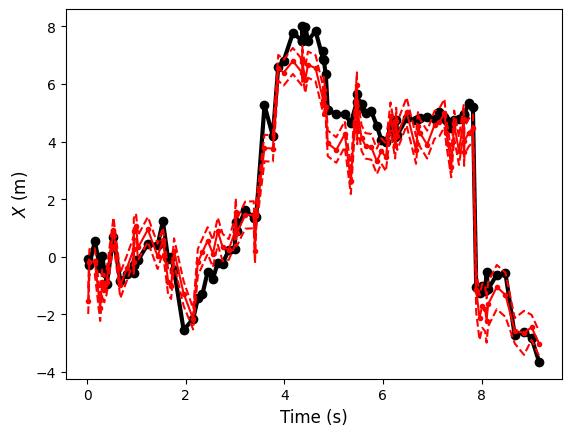

In [70]:
plt.plot(time_array[:plt_idx], Xdot[0,:plt_idx], '-ko', linewidth=3)
plt.plot(time_array[:plt_idx], Xdot_pred[0,:plt_idx], '-ro', markersize=3)
#plt.plot(time_array, Xdot_pred_PINN1, '-r')
#plt.plot(time_array[:plt_idx], X_pred[2,:plt_idx], '-go')

plt.plot(time_array[:plt_idx], Xdot_pred[0,:plt_idx] - Xdot_var[0,:plt_idx], '--r')
plt.plot(time_array[:plt_idx], Xdot_pred[0,:plt_idx] + Xdot_var[0,:plt_idx], '--r')


plt.xlabel("Time (s)", fontsize=12), plt.ylabel(r"$X$ (m)", fontsize=12)
#plt.legend(['Ground-Truth','High-Noise/Peturb','Physics-Informed Model','Model Uncertainty Bounds'], loc='best')

(Text(0.5, 0, 'Time (s)'), Text(0, 0.5, '$Y$ (m)'))

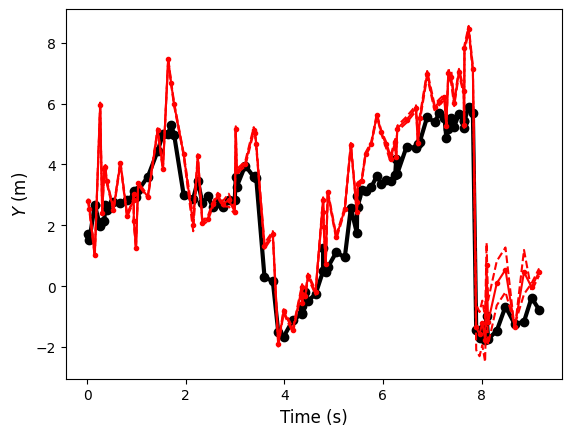

In [71]:
plt.plot(time_array[:plt_idx], Ydot[0,:plt_idx], '-ko', linewidth=3)
plt.plot(time_array[:plt_idx], Ydot_pred[0,:plt_idx], '-ro', markersize=3)
#plt.plot(time_array, Y_pred_PINN1, '-r')
#plt.plot(time_array[:plt_idx], Y_pred[2,:plt_idx], '-go')

plt.plot(time_array[:plt_idx], Ydot_pred[0,:plt_idx] - Ydot_var[0,:plt_idx], '--r')
plt.plot(time_array[:plt_idx], Ydot_pred[0,:plt_idx] + Ydot_var[0,:plt_idx], '--r')

plt.xlabel("Time (s)", fontsize=12), plt.ylabel(r"$Y$ (m)", fontsize=12)
#plt.legend(['Ground-Truth','High-Noise/Peturb','Physics-Informed Model','Model Uncertainty Bounds'], loc='best')

(Text(0.5, 0, 'Time (s)'), Text(0, 0.5, '$Z$ (m)'))

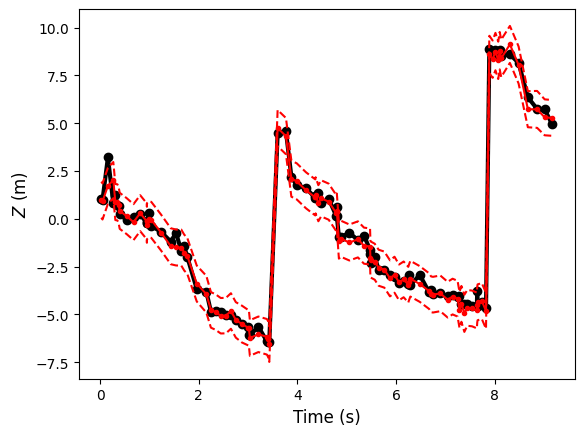

In [72]:
plt.plot(time_array[:plt_idx], Zdot[0,:plt_idx], '-ko', linewidth=3)
plt.plot(time_array[:plt_idx], Zdot_pred[0,:plt_idx], '-ro', markersize=3)
#plt.plot(time_array, Z_pred_PINN1, '-r')
#plt.plot(time_array[:plt_idx], Z_pred[2,:plt_idx], '-go')

plt.plot(time_array[:plt_idx], Zdot_pred[0,:plt_idx] - Zdot_var[0,:plt_idx], '--r')
plt.plot(time_array[:plt_idx], Zdot_pred[0,:plt_idx] + Zdot_var[0,:plt_idx], '--r')

plt.xlabel("Time (s)", fontsize=12), plt.ylabel(r"$Z$ (m)", fontsize=12)
#plt.legend(['Ground-Truth','High-Noise/Peturb','Physics-Informed Model','Model Uncertainty Bounds'], loc='best')

(Text(0.5, 0, 'Time (s)'), Text(0, 0.5, '$\\phi$ (rad)'))

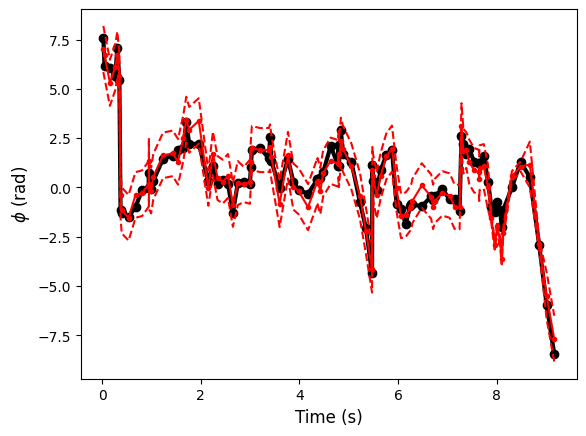

In [73]:
plt.plot(time_array[:plt_idx], ωx[0,:plt_idx], '-ko', linewidth=3)
plt.plot(time_array[:plt_idx], ωx_pred[0,:plt_idx], '-ro', markersize=3)
#plt.plot(time_array, Z_pred_PINN1, '-r')
#plt.plot(time_array[:plt_idx], Z_pred[2,:plt_idx], '-go')

plt.plot(time_array[:plt_idx], ωx_pred[0,:plt_idx] - ωx_var[0,:plt_idx], '--r')
plt.plot(time_array[:plt_idx], ωx_pred[0,:plt_idx] + ωx_var[0,:plt_idx], '--r')

plt.xlabel("Time (s)", fontsize=12), plt.ylabel(r"$\phi$ (rad)", fontsize=12)
#plt.legend(['Ground-Truth','High-Noise/Peturb','Physics-Informed Model','Model Uncertainty Bounds'], loc='best')

(Text(0.5, 0, 'Time (s)'), Text(0, 0.5, '$\\theta$ (rad)'))

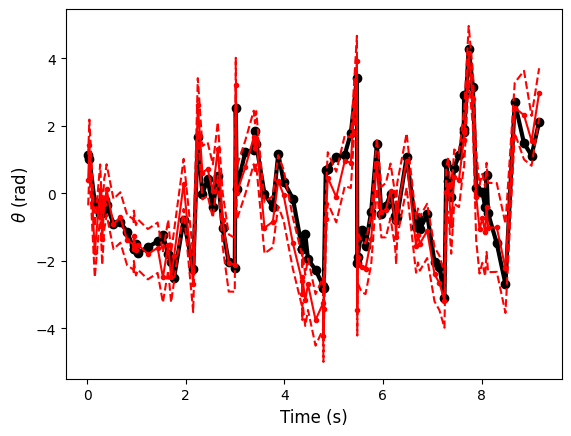

In [74]:
plt.plot(time_array[:plt_idx], ωy[0,:plt_idx], '-ko', linewidth=3)
plt.plot(time_array[:plt_idx], ωy_pred[0,:plt_idx], '-ro', markersize=3)
#plt.plot(time_array, Z_pred_PINN1, '-r')
#plt.plot(time_array[:plt_idx], Z_pred[2,:plt_idx], '-go')

plt.plot(time_array[:plt_idx], ωy_pred[0,:plt_idx] - ωy_var[0,:plt_idx], '--r')
plt.plot(time_array[:plt_idx], ωy_pred[0,:plt_idx] + ωy_var[0,:plt_idx], '--r')

#plt.legend(['Ground-Truth','High-Noise/Peturb','Physics-Informed Model','Model Uncertainty Bounds'], loc='best')
plt.xlabel("Time (s)", fontsize=12), plt.ylabel(r"$\theta$ (rad)", fontsize=12)

(Text(0.5, 0, 'Time (s)'), Text(0, 0.5, '$\\psi$ (rad)'))

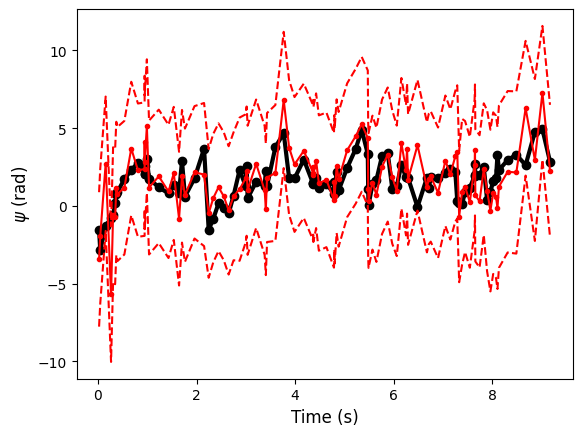

In [75]:
plt.plot(time_array[:plt_idx], ωz[0,:plt_idx], '-ko', linewidth=3)
plt.plot(time_array[:plt_idx], ωz_pred[0,:plt_idx], '-ro', markersize=3)
#plt.plot(time_array, Z_pred_PINN1, '-r')
#plt.plot(time_array[:plt_idx], Z_pred[2,:plt_idx], '-go')

plt.plot(time_array[:plt_idx], ωz_pred[0,:plt_idx] - ωz_var[0,:plt_idx], '--r')
plt.plot(time_array[:plt_idx], ωz_pred[0,:plt_idx] + ωz_var[0,:plt_idx], '--r')


#plt.legend(['Ground-Truth','High-Noise/Peturb','Physics-Informed Model','Model Uncertainty Bounds'], loc='best')
plt.xlabel("Time (s)", fontsize=12), plt.ylabel(r"$\psi$ (rad)", fontsize=12)

In [198]:
np.save('test_traj_xdot_PINN.npy', Xdot_pred)
np.save('test_traj_ydot_PINN.npy', Ydot_pred)
np.save('test_traj_zdot_PINN.npy', Zdot_pred)
np.save('test_traj_ωx_PINN.npy', ωx_pred)
np.save('test_traj_ωy_PINN.npy', ωy_pred)
np.save('test_traj_ωz_PINN.npy', ωz_pred)

In [34]:
# Initializing model
model = torch.load('vel+accel-high-disturbance-mass-varying-dkf-100-epochs.pt')

# Initializing quadrotor sensor noise/disturbance parameters
test_db = Quadrotor_Dynamics_Generator(normalize=True)

# Defining array of quadrotor mass values used in evaluation
min_m = 0.5
max_m = 20
num_inertial_profiles = 100
mass_array = torch.linspace(min_m, max_m, num_inertial_profiles)

# Sampling random trajectory data 
sample_length = 10
num_trajs = 20
test_db = Quadrotor_Dynamics_Generator(normalize=False)

#test_traj = test_traj.unsqueeze(dim=0)
test_AAE_array = np.zeros([num_inertial_profiles, sample_length*num_trajs])

# Defining test trajectory time array
time_array = np.zeros([sample_length,])

# Looping through entire test trajectory
for profile in range(num_inertial_profiles):
    
    curr_m = mass_array[profile]
    
    count = 0
    for traj in range(num_trajs):
        
        # Sampling random trajectory data 
        test_traj = test_db.generate_test_traj(seq_length=sample_length, mass=curr_m, gaussian_noise=False)
        test_traj = test_db.minmax_norm(test_traj)
        test_traj = test_db.sequential_split(test_traj)
        #test_traj = test_db.minmax_norm(test_traj)
        
        # Resetting time counter
        curr_time = 0
        
        for i in range(sample_length):

            curr_sample = test_traj[i:i+1,:]
            #curr_sample[:,0:1,8:] = next_context
            batch_latent_transitions = torch.concat([curr_sample[:,:21], curr_sample[:,27:]], dim=-1)
            batch_observed_transitions = torch.concat([curr_sample[:,:21], curr_sample[:,27:]], dim=-1)
            next_z_states = batch_latent_transitions[:,21:]

            curr_dt = curr_sample[:,12]
            curr_time += curr_dt 
            time_array[i] = curr_time.detach().numpy()

            # Forward pass of DKF
            z_pred, P_z, _, _ = model(batch_latent_transitions, batch_observed_transitions, is_testing=True)

            # Unnormalizing data for plotting and computing AAE
            next_z_states, z_pred = test_db.minmax_unnorm(next_z_states, z_pred)
            
            # Computing average absolute error (AAE) over current testing batch
            AE_array = compute_AE(next_z_states.detach().numpy(), z_pred.detach().numpy())
            test_AAE_array[profile, count] = AE_array
            count += 1

/tmp/ipykernel_9709/3529274586.py:51: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  time_array[i] = curr_time.detach().numpy()
/tmp/ipykernel_9709/3529274586.py:61: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  test_AAE_array[profile, count] = AE_array


In [39]:
mass_AAE_array = np.mean(test_AAE_array,axis=1)
np.mean(mass_AAE_array)

14.301846011495591

In [55]:
np.save('DKF_AAE_array_MassVary.npy', array1)